# Import libraries

In [390]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
from eda_functions import exploration_analysis, bi_cat_countplot, uni_cat_y_compare, bi_countplot_target, outlier_range, kde_no_outliers
from eda_functions import one_dimentional_numeric, multidimensional_numeric, numeric_vs_categorical_corr
from model_evaluation import fill_unknown_with_mode, get_distribution, encode_columns_safe, classify_analysis, importance_features, plot_feature_importance
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, PolynomialFeatures
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.combine import SMOTETomek
from sklearn.metrics import f1_score, confusion_matrix, roc_curve, auc, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import xgboost as xgb
import lightgbm as lgb
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
import shap

# Data loading

In [371]:
raw_df = pd.read_csv('bank-additional-full.csv', sep = ';')

In [372]:
raw_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


# Exploratory data analysis

## Checking the data structure

In [5]:
raw_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  str    
 2   marital         41188 non-null  str    
 3   education       41188 non-null  str    
 4   default         41188 non-null  str    
 5   housing         41188 non-null  str    
 6   loan            41188 non-null  str    
 7   contact         41188 non-null  str    
 8   month           41188 non-null  str    
 9   day_of_week     41188 non-null  str    
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  str    
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null  float64
 1

In [6]:
raw_df.shape

(41188, 21)

In [7]:
raw_df_null = raw_df.isna().sum()
raw_df_null_percent = raw_df.isna().sum() / raw_df.shape[0]

missed_values_raw_df = pd.DataFrame({
    'Count': raw_df_null,
    'Percentage': raw_df_null_percent
})

print("Missed values in raw dataset")
missed_values_raw_df

Missed values in raw dataset


,Count,Percentage
age,0,0.0
job,0,0.0
marital,0,0.0
education,0,0.0
default,0,0.0
housing,0,0.0
loan,0,0.0
contact,0,0.0
month,0,0.0
day_of_week,0,0.0


In [8]:
numercic_cols_raw_df = raw_df.select_dtypes(include = 'number').columns
categorical_cols_raw_df = raw_df.select_dtypes(exclude = 'number').columns

print(f"The count of numerical columns in raw dataset is {len(numercic_cols_raw_df)}.")
print(f"The count of categorical columns in raw dataset is {len(categorical_cols_raw_df)}.")

The count of numerical columns in raw dataset is 10.
The count of categorical columns in raw dataset is 11.


We have a dataset consisting of 21 columns and 41,188 observations. There are no obvious missing values in the data. Of all the columns, 10 are of numeric type and 11 are of text type.

## Analysis of numerical columns

In [9]:
numercic_cols_raw_df

Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='str')

### Analysis of the `age` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
age,,
31,1947,4.73
32,1846,4.48
33,1833,4.45
36,1780,4.32
35,1759,4.27
34,1745,4.24
30,1714,4.16
37,1475,3.58
29,1453,3.53


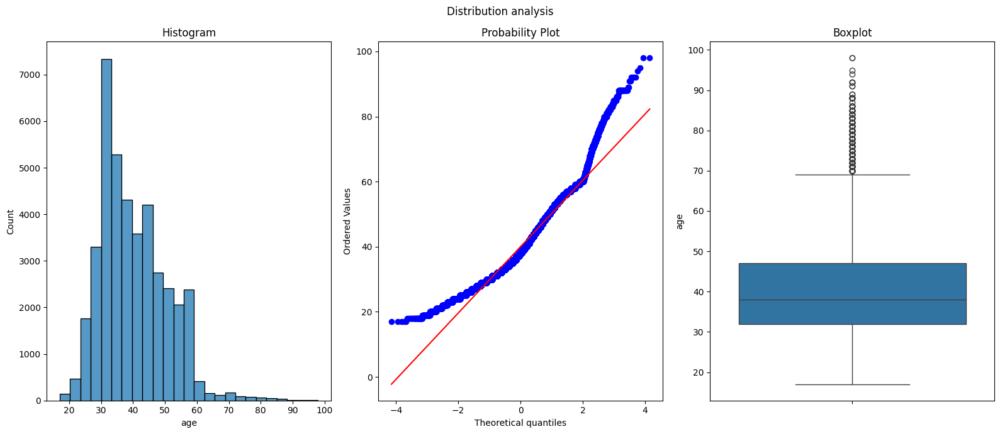

Statistical analysis


count    41188.0000
mean        40.0241
std         10.4212
min         17.0000
25%         32.0000
50%         38.0000
75%         47.0000
90%         55.0000
99%         71.0000
99.9%       86.0000
max         98.0000
Name: age, dtype: float64

Mode: 31.
Lower fence for possible outliers: 9.5.
Upper fence for possible outliers: 69.5.


In [10]:
exploration_analysis(raw_df, 'age')

**Observations**
- The data on client age follow a right-skewed distribution, as we observe a long tail at high values on the histogram and the median age (38) is lower than the mean (40.02).
- According to the scatter plot, there are outliers starting from 69.5 years, which should be taken into account in the analysis. The highest age value is 98, which may correspond to reality. Therefore, values from 69.5 years onwards are not anomalous; it is more likely that such clients occur quite rarely.
- Clients aged 31 are the most common to approach the bank. The youngest client is 17 years old.

### Analysis of the `duration` feature

In [11]:
raw_df['duration_min'] = raw_df['duration'] / 60 # diveded by 60 for showing in minutes

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
duration_min,,
1.416667,170,0.41
1.500000,170,0.41
2.266667,168,0.41
1.216667,167,0.41
2.066667,164,0.40
1.450000,162,0.39
1.733333,161,0.39
1.200000,161,0.39
1.850000,160,0.39


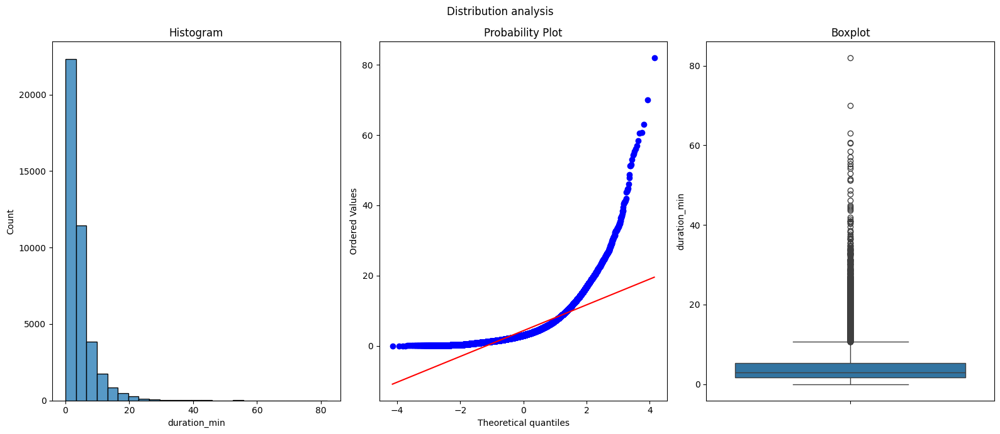

Statistical analysis


count    41188.0000
mean         4.3048
std          4.3213
min          0.0000
25%          1.7000
50%          3.0000
75%          5.3167
90%          9.1833
99%         21.1855
99.9%       36.2598
max         81.9667
Name: duration_min, dtype: float64

Mode: 1.4167.
Lower fence for possible outliers: -3.72.
Upper fence for possible outliers: 10.74.


In [12]:
exploration_analysis(raw_df, 'duration_min')

**Observations**
- The data on the duration of calls with a manager follow a right-skewed distribution, as can be seen from the histogram (which shows a long tail at high values) and the ratio of the median to the mean.
- From 10.74 minutes onwards, there are outliers in the data. It is worth paying attention to customer data, as their call duration with a manager ranges from 10.74 to 81.96 minutes, whilst 90 per cent of customers speak for up to 9.18 minutes. Therefore, customers with long interaction times may be potential customers (those seeking to find out more about the bank’s services), or they may reflect certain anomalies in the data; it is worth checking with the bank’s managers where possible.
- Most calls last around 1.42 minutes.

### Analysis of the `campaign` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
campaign,,
1,17642,42.83
2,10570,25.66
3,5341,12.97
4,2651,6.44
5,1599,3.88
6,979,2.38
7,629,1.53
8,400,0.97
9,283,0.69


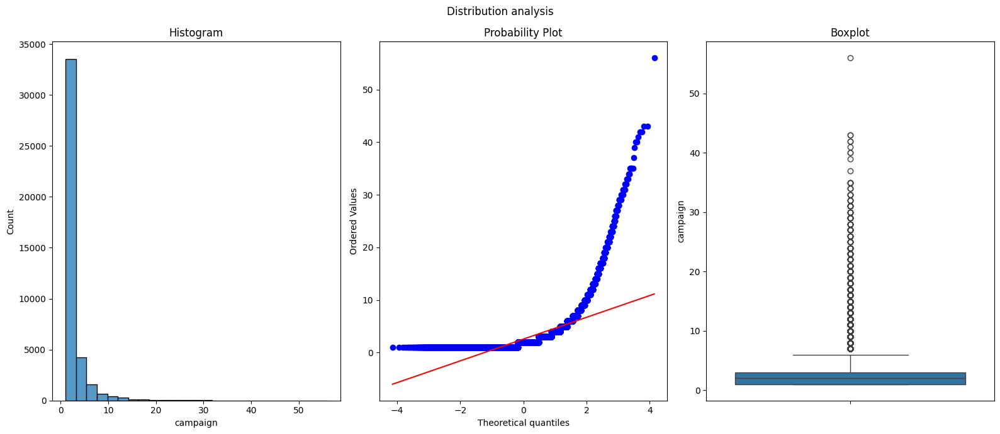

Statistical analysis


count    41188.0000
mean         2.5676
std          2.7700
min          1.0000
25%          1.0000
50%          2.0000
75%          3.0000
90%          5.0000
99%         14.0000
99.9%       29.0000
max         56.0000
Name: campaign, dtype: float64

Mode: 1.
Lower fence for possible outliers: -2.0.
Upper fence for possible outliers: 6.0.


In [13]:
exploration_analysis(raw_df, 'campaign')

**Observations**
- The number of contacts within the current campaign is also shown as a right-skewed distribution.
- As shown in the range chart, there are outliers starting from 6 contacts. Of particular note is the number of contacts in the range from 29 to 56, which was recorded by only 0.01% of customers. These cases should be taken into account during analysis.
- The majority of customers have only one contact. The median value is 2 contacts.

### Analysis of the `pdays` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
pdays,,
999,39673,96.32
3,439,1.07
6,412,1.00
4,118,0.29
9,64,0.16
2,61,0.15
7,60,0.15
12,58,0.14
10,52,0.13


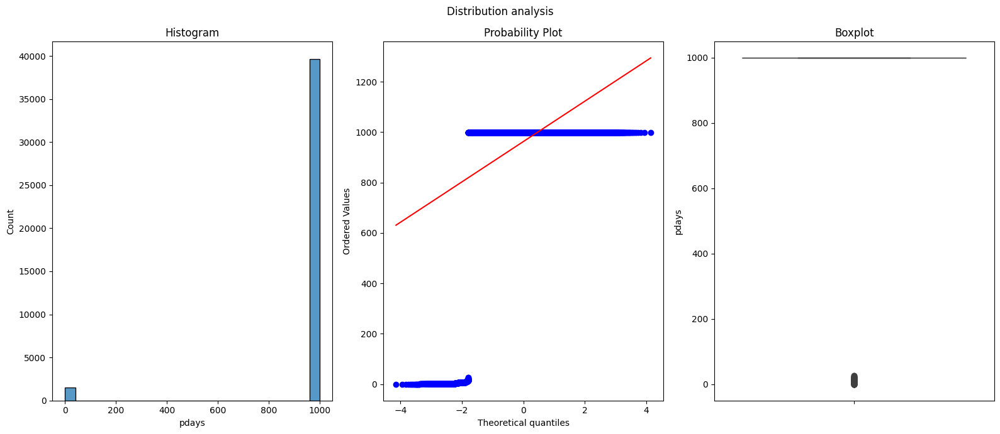

Statistical analysis


count    41188.0000
mean       962.4755
std        186.9109
min          0.0000
25%        999.0000
50%        999.0000
75%        999.0000
90%        999.0000
99%        999.0000
99.9%      999.0000
max        999.0000
Name: pdays, dtype: float64

Mode: 999.
Lower fence for possible outliers: 999.0.
Upper fence for possible outliers: 999.0.


In [14]:
exploration_analysis(raw_df, 'pdays')

In [15]:
raw_df_pdays_no_999 = raw_df[raw_df['pdays'] != 999].copy() # raw_df without observation where pdays equals 999

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
pdays,,
3,439,28.98
6,412,27.19
4,118,7.79
9,64,4.22
2,61,4.03
7,60,3.96
12,58,3.83
10,52,3.43
5,46,3.04


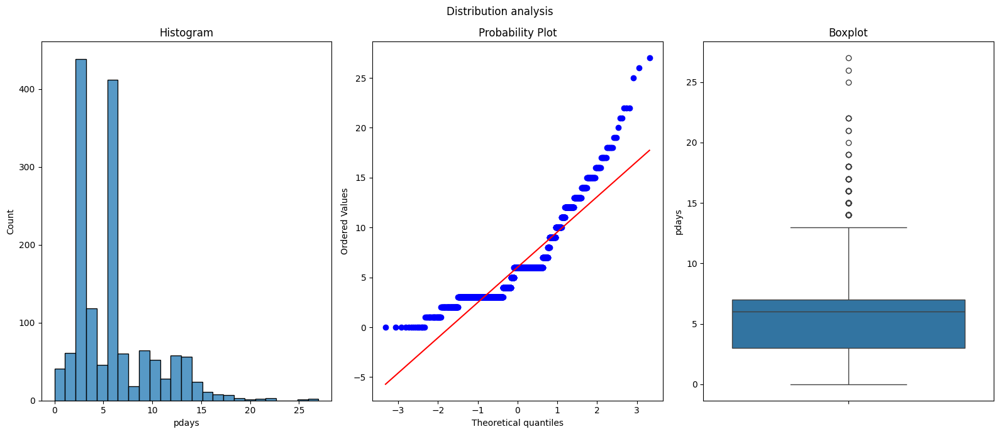

Statistical analysis


count    1515.0000
mean        6.0145
std         3.8249
min         0.0000
25%         3.0000
50%         6.0000
75%         7.0000
90%        12.0000
99%        18.0000
99.9%      25.4860
max        27.0000
Name: pdays, dtype: float64

Mode: 3.
Lower fence for possible outliers: -3.0.
Upper fence for possible outliers: 13.0.


In [16]:
exploration_analysis(raw_df_pdays_no_999, 'pdays')

**Observations**
- Around 96.32% of all data relates to customers who have not been in contact with the bank, and only 3.68% to returning customers.
- Looking at the statistics for returning customers, the most common interval is 3 days since their previous contact with the bank. Half of the customers were, so to speak, re-engaged within 6 days of their previous contact. Only 10% of customers had a repeat contact more than 12 days after their previous one.

### Analysis of the `previous` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
previous,,
0,35563,86.34
1,4561,11.07
2,754,1.83
3,216,0.52
4,70,0.17
5,18,0.04
6,5,0.01
7,1,0.00


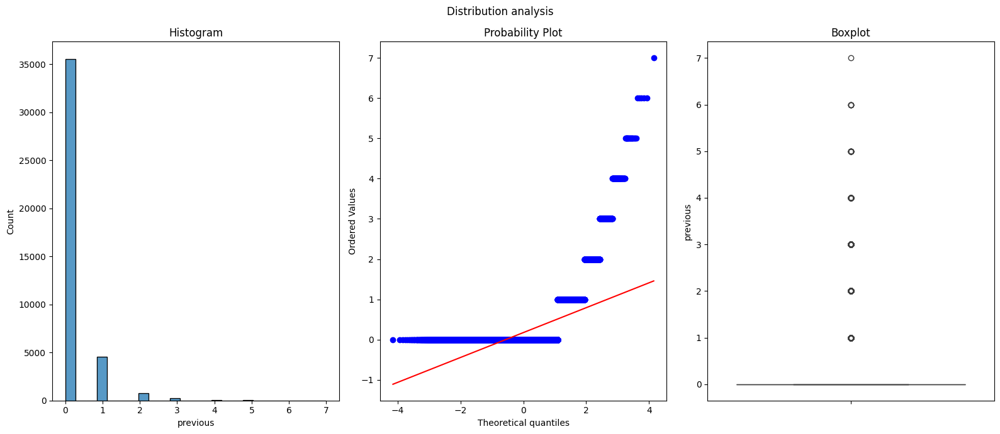

Statistical analysis


count    41188.0000
mean         0.1730
std          0.4949
min          0.0000
25%          0.0000
50%          0.0000
75%          0.0000
90%          1.0000
99%          2.0000
99.9%        4.0000
max          7.0000
Name: previous, dtype: float64

Mode: 0.
Lower fence for possible outliers: 0.0.
Upper fence for possible outliers: 0.0.


In [17]:
exploration_analysis(raw_df, 'previous')

**Observations**
- Around 86.34% had no previous contact with the bank, meaning they are new customers.
- Only 10% of customers had at least one previous contact with the bank prior to the current one.
- As shown in the scatter plot, we observe outliers greater than 0; however, these figures appear quite realistic – there are simply very few customers with repeat contacts, at least in this dataset (which is consistent with the logic of the previously considered feature: the number of days since the previous campaign).

### Analysis of the `emp.var.rate` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
emp.var.rate,,
1.4,16234,39.41
-1.8,9184,22.30
1.1,7763,18.85
-0.1,3683,8.94
-2.9,1663,4.04
-3.4,1071,2.60
-1.7,773,1.88
-1.1,635,1.54
-3.0,172,0.42


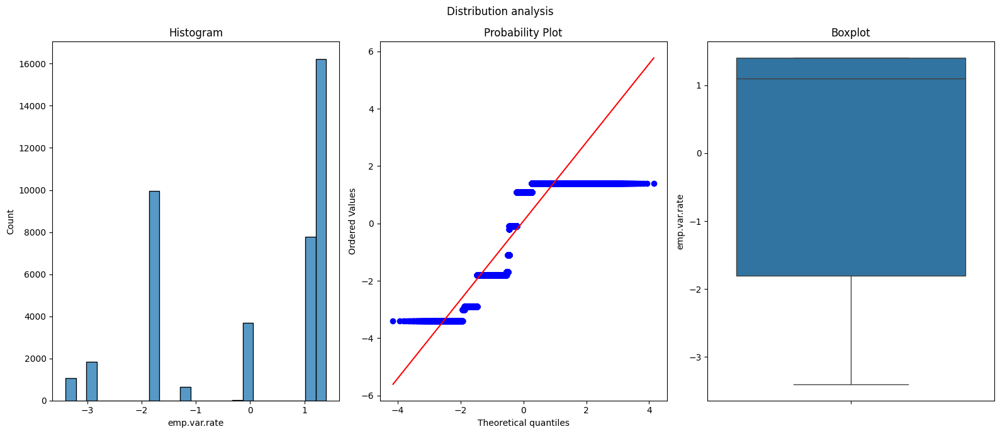

Statistical analysis


count    41188.0000
mean         0.0819
std          1.5710
min         -3.4000
25%         -1.8000
50%          1.1000
75%          1.4000
90%          1.4000
99%          1.4000
99.9%        1.4000
max          1.4000
Name: emp.var.rate, dtype: float64

Mode: 1.4.
Lower fence for possible outliers: -6.6.
Upper fence for possible outliers: 6.2.


In [18]:
exploration_analysis(raw_df, 'emp.var.rate')

**Observations**
- Most observations (the mode) show a positive rate of change in employment, namely around 1.4 per cent.
- Only 25 per cent of observations show a negative rate of change in employment.

### Analysis of the `cons.price.idx` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
cons.price.idx,,
93.994,7763,18.85
93.918,6685,16.23
92.893,5794,14.07
93.444,5175,12.56
94.465,4374,10.62
93.200,3616,8.78
93.075,2458,5.97
92.201,770,1.87
92.963,715,1.74


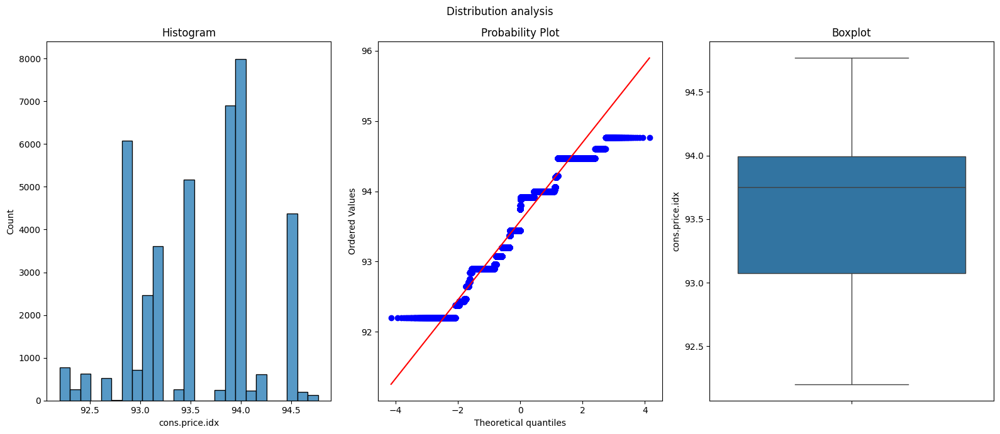

Statistical analysis


count    41188.0000
mean        93.5757
std          0.5788
min         92.2010
25%         93.0750
50%         93.7490
75%         93.9940
90%         94.4650
99%         94.4650
99.9%       94.7670
max         94.7670
Name: cons.price.idx, dtype: float64

Mode: 93.994.
Lower fence for possible outliers: 91.7.
Upper fence for possible outliers: 95.37.


In [19]:
exploration_analysis(raw_df, 'cons.price.idx')

**Observations**
- Half of the observations for the Consumer Price Index fall within the range 92.201–93.749.
- The largest proportion of observations have a Consumer Price Index of 93.994.

### Analysis of the `cons.conf.idx` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
cons.conf.idx,,
-36.4,7763,18.85
-42.7,6685,16.23
-46.2,5794,14.07
-36.1,5175,12.56
-41.8,4374,10.62
-42.0,3616,8.78
-47.1,2458,5.97
-31.4,770,1.87
-40.8,715,1.74


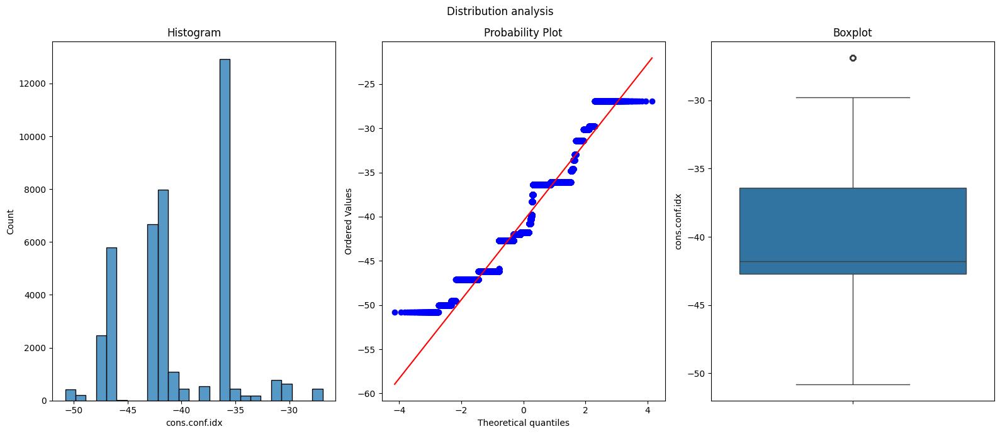

Statistical analysis


count    41188.0000
mean       -40.5026
std          4.6282
min        -50.8000
25%        -42.7000
50%        -41.8000
75%        -36.4000
90%        -36.1000
99%        -26.9000
99.9%      -26.9000
max        -26.9000
Name: cons.conf.idx, dtype: float64

Mode: -36.4.
Lower fence for possible outliers: -52.15.
Upper fence for possible outliers: -26.95.


In [20]:
exploration_analysis(raw_df, 'cons.conf.idx')

**Observations**
- The most frequently recorded consumer confidence index stands at -36.4.
- According to the range chart, there is one outlier of -26.9.

### Analysis of the `euribor3m` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
euribor3m,,
4.857,2868,6.96
4.962,2613,6.34
4.963,2487,6.04
4.961,1902,4.62
4.856,1210,2.94
4.964,1175,2.85
1.405,1169,2.84
4.965,1071,2.60
4.864,1044,2.53


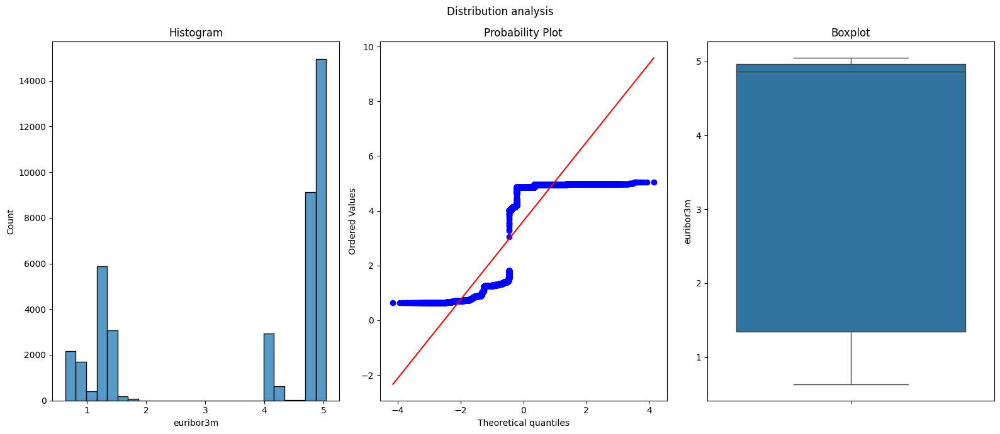

Statistical analysis


count    41188.0000
mean         3.6213
std          1.7344
min          0.6340
25%          1.3440
50%          4.8570
75%          4.9610
90%          4.9640
99%          4.9680
99.9%        4.9700
max          5.0450
Name: euribor3m, dtype: float64

Mode: 4.857.
Lower fence for possible outliers: -4.08.
Upper fence for possible outliers: 10.39.


In [21]:
exploration_analysis(raw_df, 'euribor3m')

**Observations**
- Half of all observations show a three-month European interbank offer rate of 4.857.
- Only 25% of observations have a rate less than or equal to 1.3440.

### Analysis of the `nr.employed` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
nr.employed,,
5228.1,16234,39.41
5099.1,8534,20.72
5191.0,7763,18.85
5195.8,3683,8.94
5076.2,1663,4.04
5017.5,1071,2.60
4991.6,773,1.88
5008.7,650,1.58
4963.6,635,1.54


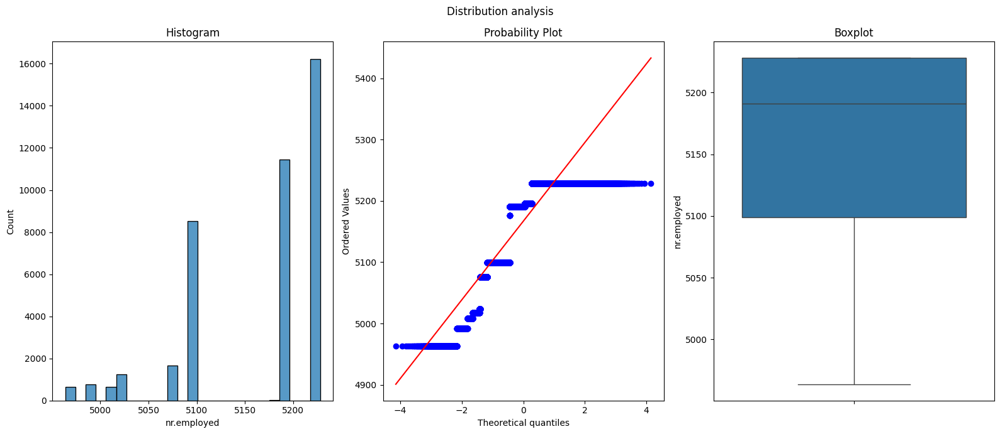

Statistical analysis


count    41188.0000
mean      5167.0359
std         72.2515
min       4963.6000
25%       5099.1000
50%       5191.0000
75%       5228.1000
90%       5228.1000
99%       5228.1000
99.9%     5228.1000
max       5228.1000
Name: nr.employed, dtype: float64

Mode: 5228.1.
Lower fence for possible outliers: 4905.6.
Upper fence for possible outliers: 5421.6.


In [22]:
exploration_analysis(raw_df, 'nr.employed')

**Observations**
- The largest proportion of observations (25%) are characterised by a number of employed persons of 5,228.1. The median is 5,191 and the mean is 5,167.04, reflecting a left-skewed distribution.
- Only 25 per cent of observations have a number of employed persons at or below 5,099.1.

## Analysis of categorical columns

In [23]:
categorical_cols_raw_df

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome', 'y'],
      dtype='str')

### Analysis of the `job` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
job,,
admin.,10422,25.30
blue-collar,9254,22.47
technician,6743,16.37
services,3969,9.64
management,2924,7.10
retired,1720,4.18
entrepreneur,1456,3.54
self-employed,1421,3.45
housemaid,1060,2.57


Data distribution


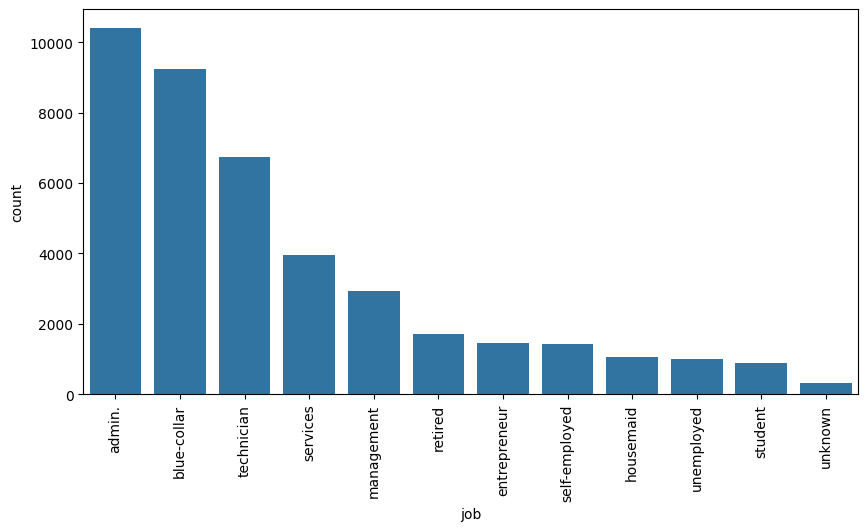

In [24]:
exploration_analysis(raw_df, 'job')

In [25]:
raw_df[raw_df['job'] == 'unknown']

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,duration_min
29,55,unknown,married,university.degree,unknown,unknown,unknown,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,6.033333
35,55,unknown,married,basic.4y,unknown,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,5.600000
73,57,unknown,married,unknown,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,3.516667
91,57,unknown,married,unknown,unknown,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0.800000
144,38,unknown,divorced,high.school,unknown,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,1.216667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40370,59,unknown,married,unknown,no,no,no,cellular,aug,wed,...,6,1,success,-1.7,94.027,-38.3,0.900,4991.6,yes,3.300000
40428,64,unknown,married,unknown,no,yes,no,telephone,aug,fri,...,999,0,nonexistent,-1.7,94.027,-38.3,0.905,4991.6,yes,3.983333
40656,67,unknown,divorced,unknown,unknown,yes,no,cellular,sep,wed,...,6,2,success,-1.1,94.199,-37.5,0.880,4963.6,yes,3.666667
41005,63,unknown,married,professional.course,no,no,no,cellular,oct,thu,...,6,1,success,-1.1,94.601,-49.5,1.025,4963.6,no,3.916667


**Observations**
- The majority of my clients are in the following professions: admin, blue-collar and technician, which account for more than half of the observations.
- There is a small number of students and unemployed people.
- There is also an ‘unknown’ category, i.e. where no data is specified, accounting for 0.8 per cent. This category warrants attention, as a preliminary review of the client data suggests that a certain proportion of them share similar attribute values. However, as the percentage of missing values is not significant, it is possible to impute them by filling them with the mode, i.e. ‘admin’.
- If required for use in models where numerical features are expected as input, it would be advisable to perform One-Hot Encoding.

### Analysis of the `marital` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
marital,,
married,24928,60.52
single,11568,28.09
divorced,4612,11.20
unknown,80,0.19


Data distribution


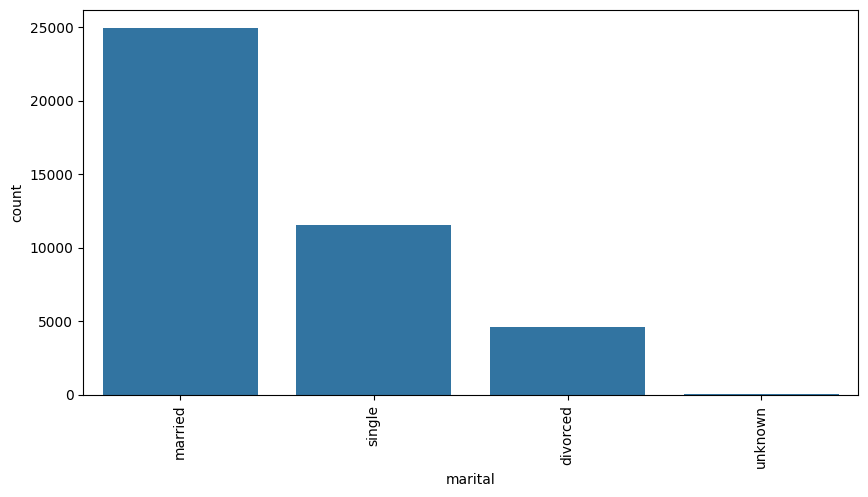

In [26]:
exploration_analysis(raw_df, 'marital')

In [27]:
raw_df[raw_df['marital'] == 'unknown']

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,duration_min
40,58,management,unknown,university.degree,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,6.100000
390,59,retired,unknown,university.degree,unknown,no,no,telephone,may,tue,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,4.216667
413,57,retired,unknown,basic.4y,no,no,no,telephone,may,tue,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,11.216667
1493,33,services,unknown,high.school,no,yes,yes,telephone,may,thu,...,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no,2.583333
1608,32,unknown,unknown,university.degree,no,no,no,telephone,may,fri,...,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,yes,10.283333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38550,31,entrepreneur,unknown,university.degree,no,no,no,cellular,oct,thu,...,999,0,nonexistent,-3.4,92.431,-26.9,0.722,5017.5,yes,2.733333
38579,31,entrepreneur,unknown,university.degree,no,yes,no,telephone,oct,thu,...,999,1,failure,-3.4,92.431,-26.9,0.722,5017.5,no,2.616667
39322,30,technician,unknown,university.degree,no,no,no,cellular,mar,mon,...,11,2,success,-1.8,93.369,-34.8,0.639,5008.7,yes,16.283333
39323,30,technician,unknown,university.degree,no,no,no,cellular,mar,mon,...,6,2,success,-1.8,93.369,-34.8,0.639,5008.7,yes,2.883333


**Observations**
- The bank had the most contact with married customers, at around 60.52 per cent; there were also single and divorced customers.
- Around 0.19% of customers have not specified their marital status and are categorised as ‘unknown’. As this percentage is quite small, the data can be imputed using the mode, namely ‘married’.
- If the data is to be used in models where numerical features are expected as inputs, it would be advisable to apply One-Hot Encoding.

### Analysis of the `education` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
education,,
university.degree,12168,29.54
high.school,9515,23.10
basic.9y,6045,14.68
professional.course,5243,12.73
basic.4y,4176,10.14
basic.6y,2292,5.56
unknown,1731,4.20
illiterate,18,0.04


Data distribution


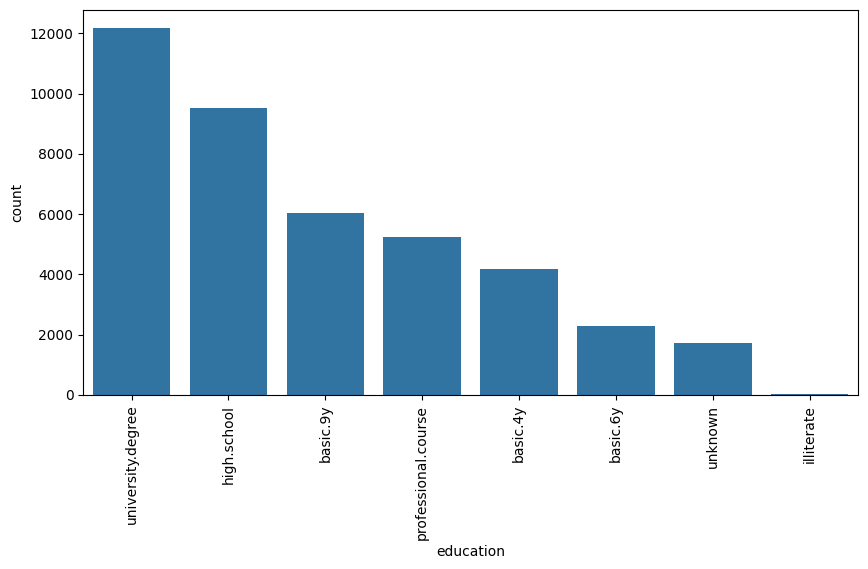

In [28]:
exploration_analysis(raw_df, 'education')

In [29]:
raw_df[raw_df['education'] == 'unknown']

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,duration_min
7,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,3.616667
10,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0.916667
26,59,technician,married,unknown,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,1.550000
30,46,admin.,married,unknown,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,5.800000
31,59,technician,married,unknown,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,6.433333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41118,34,technician,married,unknown,no,yes,no,cellular,nov,tue,...,999,2,failure,-1.1,94.767,-50.8,1.046,4963.6,no,2.700000
41120,60,admin.,married,unknown,no,no,no,cellular,nov,tue,...,999,0,nonexistent,-1.1,94.767,-50.8,1.046,4963.6,no,5.550000
41122,34,technician,married,unknown,no,no,no,cellular,nov,tue,...,999,0,nonexistent,-1.1,94.767,-50.8,1.046,4963.6,yes,16.416667
41135,54,technician,married,unknown,no,yes,no,cellular,nov,thu,...,999,1,failure,-1.1,94.767,-50.8,1.041,4963.6,no,3.700000


In [30]:
raw_df[raw_df['education'] == 'illiterate']

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,duration_min
5393,45,blue-collar,married,illiterate,unknown,no,yes,telephone,may,fri,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,5.550000
6928,45,blue-collar,married,illiterate,unknown,no,no,telephone,may,thu,...,999,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,no,19.933333
12383,51,admin.,married,illiterate,unknown,no,no,cellular,jul,mon,...,999,0,nonexistent,1.4,93.918,-42.7,4.960,5228.1,no,2.516667
14445,55,blue-collar,married,illiterate,no,yes,no,cellular,jul,tue,...,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,no,1.533333
14486,55,blue-collar,married,illiterate,no,no,no,cellular,jul,tue,...,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,no,2.150000
16269,60,housemaid,married,illiterate,unknown,yes,no,cellular,jul,tue,...,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,no,2.933333
17739,54,blue-collar,married,illiterate,unknown,yes,yes,cellular,jul,tue,...,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,no,1.383333
22402,45,blue-collar,married,illiterate,no,yes,no,cellular,aug,fri,...,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,no,2.116667
22642,44,blue-collar,married,illiterate,no,no,no,cellular,aug,fri,...,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,no,7.666667
26680,34,self-employed,married,illiterate,no,yes,no,cellular,nov,thu,...,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,no,0.850000


**Observations**
- The largest proportion of customers (29.54%) have a university degree or have completed upper secondary education (23.10%).
- An interesting category is the 0.04% of illiterate customers, whilst a further 4.20% are classified as ‘unknown’.
- If the data is to be used in models where numerical features are expected as inputs, it would be advisable to apply One-Hot Encoding or Ordinal Encoding.

### Analysis of the `default` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
default,,
no,32588,79.12
unknown,8597,20.87
yes,3,0.01


Data distribution


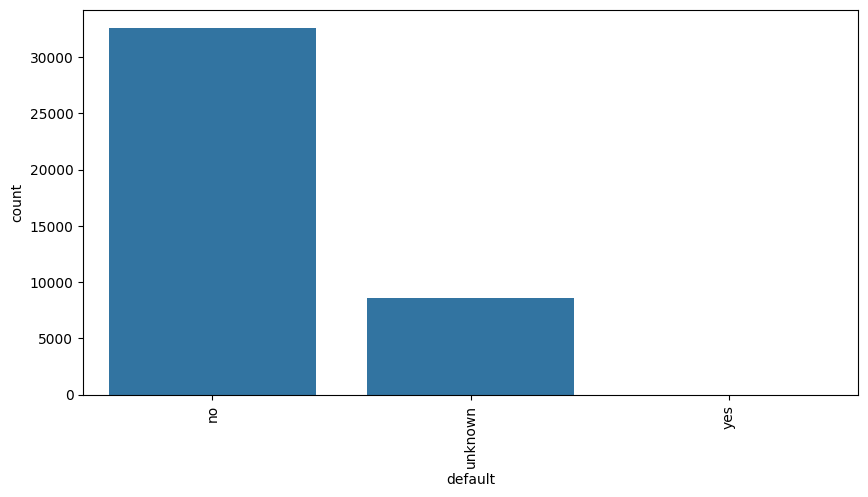

In [31]:
exploration_analysis(raw_df, 'default')

In [32]:
raw_df[raw_df['default'] == 'unknown']

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,duration_min
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,2.483333
5,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,3.300000
7,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,3.616667
10,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0.916667
15,54,retired,married,basic.9y,unknown,yes,yes,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,2.900000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40886,70,retired,married,basic.4y,unknown,no,no,cellular,oct,thu,...,14,3,failure,-1.1,94.601,-49.5,0.965,4963.6,no,2.033333
40940,49,admin.,married,high.school,unknown,no,no,cellular,oct,wed,...,6,3,success,-1.1,94.601,-49.5,0.985,4963.6,yes,2.816667
40941,66,retired,married,basic.4y,unknown,unknown,unknown,cellular,oct,wed,...,6,3,success,-1.1,94.601,-49.5,0.985,4963.6,yes,3.600000
40969,84,retired,divorced,basic.4y,unknown,yes,no,cellular,oct,fri,...,999,0,nonexistent,-1.1,94.601,-49.5,0.993,4963.6,no,1.766667


In [33]:
raw_df[raw_df['default'] == 'yes']

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,duration_min
21580,48,technician,married,professional.course,yes,no,no,cellular,aug,tue,...,999,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1,no,1.100000
21581,48,technician,married,professional.course,yes,yes,no,cellular,aug,tue,...,999,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1,no,2.216667
24866,31,unemployed,married,high.school,yes,no,no,cellular,nov,tue,...,999,1,failure,-0.1,93.200,-42.0,4.153,5195.8,no,1.850000


**Observations**
- The majority of customers do not have any overdue loans (79.12%), and only 0.01% of all data points are definitely overdue, which is worth noting.
- There are also missing values in the data (20.87%); these can be imputed using the mode, as follows: no.
- Furthermore, for this column, binary encoding will need to be applied to enable its use in models that require numerical features.

### Analysis of the `housing` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
housing,,
yes,21576,52.38
no,18622,45.21
unknown,990,2.40


Data distribution


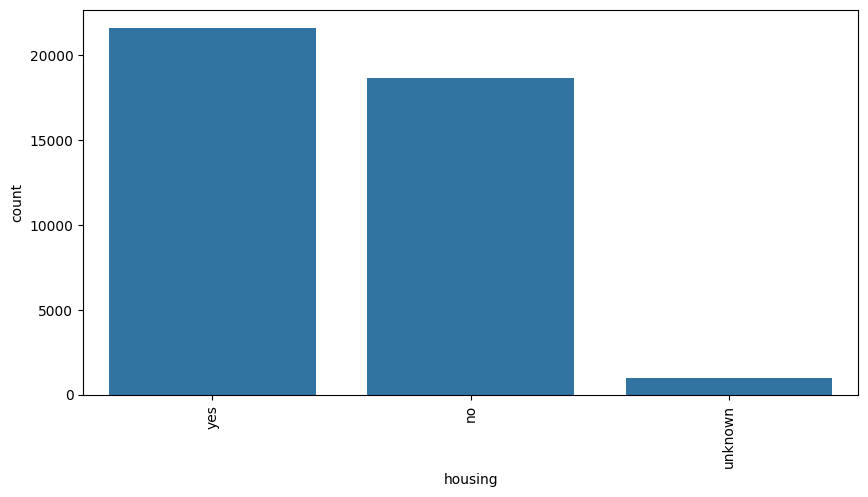

In [34]:
exploration_analysis(raw_df, 'housing')

**Observations**
- The majority of customers (52.38%) have a mortgage.
- There are missing values in the data (2.40%); these should be imputed using the mode.
- For use in models where features must be numerical, binary encoding should be applied.

### Analysis of the `loan` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
loan,,
no,33950,82.43
yes,6248,15.17
unknown,990,2.40


Data distribution


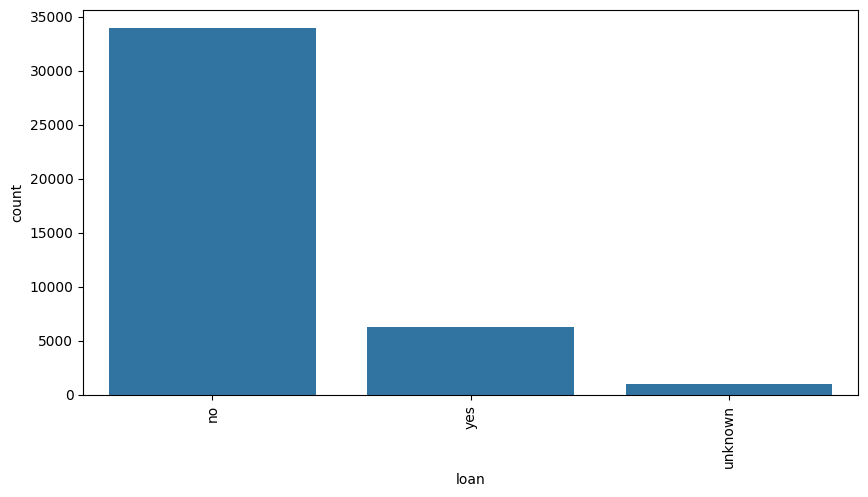

In [35]:
exploration_analysis(raw_df, 'loan')

**Observations**
- The majority of customers do not have a consumer loan (82.43%).
- There are missing values in the data amounting to approximately 2.40%; these can be imputed using the most frequent value.
- Furthermore, to ensure the variable can be used in models that only accept numerical variables, binary encoding should be applied.

### Analysis of the `contact` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
contact,,
cellular,26144,63.47
telephone,15044,36.53


Data distribution


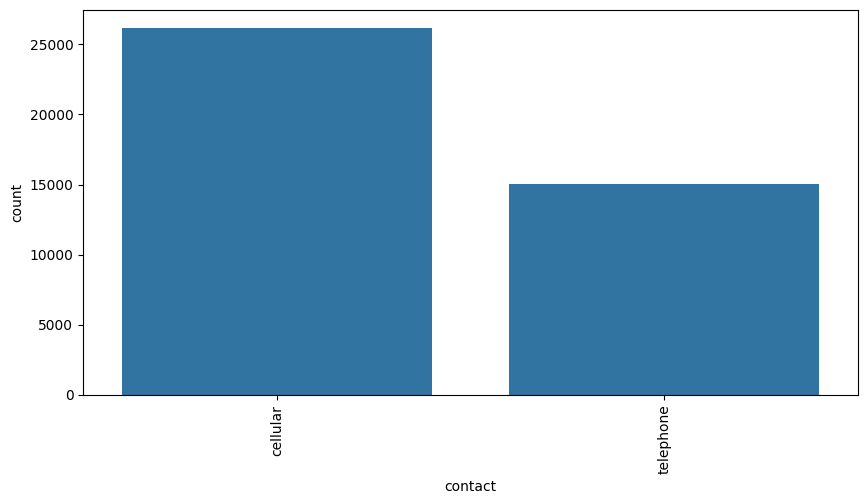

In [36]:
exploration_analysis(raw_df, 'contact')

**Observations**
- The majority of customers (63.47%) contacted their bank manager via mobile phone.
- There are no missing values in the data.
- For use in models that only accept numerical features, feature mapping (i.e. binary encoding) can be applied.

### Analysis of the `month` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
month,,
may,13769,33.43
jul,7174,17.42
aug,6178,15.00
jun,5318,12.91
nov,4101,9.96
apr,2632,6.39
oct,718,1.74
sep,570,1.38
mar,546,1.33


Data distribution


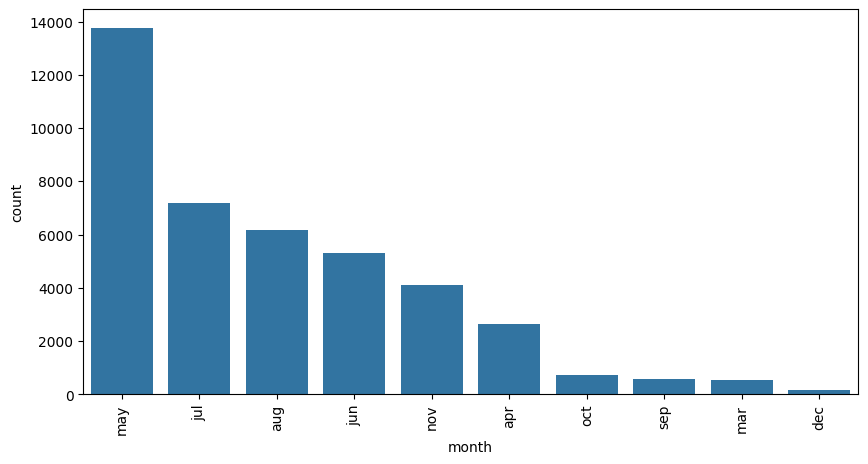

In [37]:
exploration_analysis(raw_df, 'month')

**Observations**
- Most contacts took place in May and throughout the summer.
- However, there were no contacts in January and February.
- There are no gaps in the data, which is good.

### Analysis of the `day_of_week` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
day_of_week,,
thu,8623,20.94
mon,8514,20.67
wed,8134,19.75
tue,8090,19.64
fri,7827,19.00


Data distribution


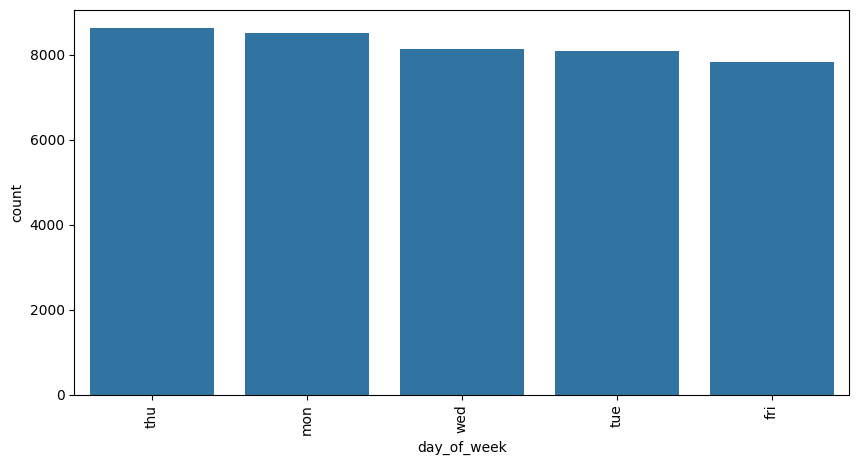

In [38]:
exploration_analysis(raw_df, 'day_of_week')

**Observations**
- The observations are evenly distributed across the days of the week of the last contact.
- There are no gaps in the data.
- If features requiring numerical input values are to be used in the model, label encoding can be employed; even if the system treats them as ordered, this will be correct, as the values do indeed have a logically defined order.

### Analysis of the `poutcome` feature

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
poutcome,,
nonexistent,35563,86.34
failure,4252,10.32
success,1373,3.33


Data distribution


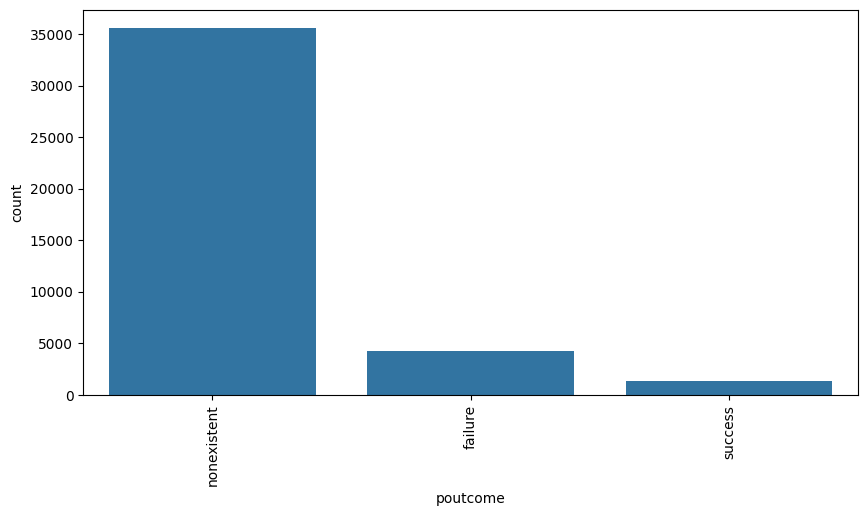

In [39]:
exploration_analysis(raw_df, 'poutcome')

**Observations**
- Around 86.34% of observations have a previous campaign status of ‘nonexistent’, which is entirely logical, as it was previously noted that most customers are making their first contact with the bank.
- Only 3.33% of customers have a successful previous campaign status.
- There are no missing values in the data.
- To use a feature in models that expect numeric input data, the feature must first be encoded using either mapping or One-Hot encoding.

## Checking for imbalance in the target variable y

Missing values count: 0
Missing values percent of total, %: 0.0
Column values


,Count,Proportion
y,,
no,36548,88.73
yes,4640,11.27


Data distribution


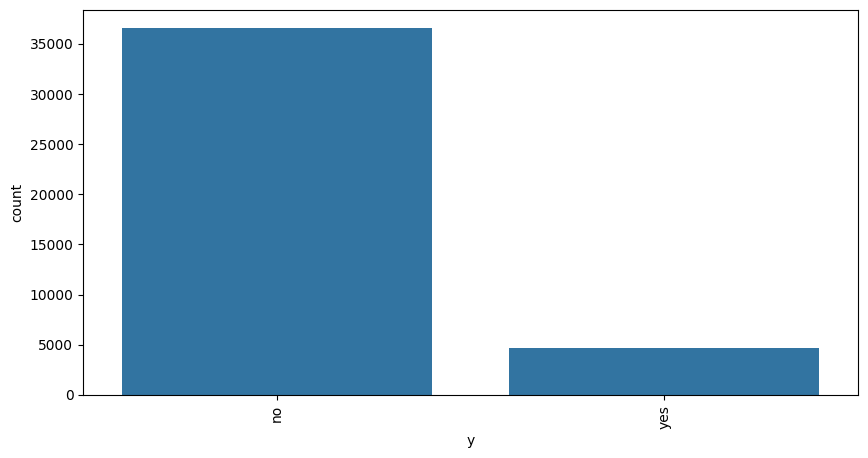

In [40]:
exploration_analysis(raw_df, 'y')

**Observations**
- There is a class imbalance in the target variable `y`.
- Only 11.27% of cases involve a successful fixed-term deposit application (yes), whilst 88.73% are unsuccessful (no).
- When building models, we will need to consider class balancing methods to train the models on balanced data.

### The distribution of the target variable

In [41]:
map_codes = {'no': 0, 'yes': 1}
raw_df['y_code'] = raw_df['y'].map(map_codes)
raw_df[['y_code', 'y']].head()

,y_code,y
0,0,no
1,0,no
2,0,no
3,0,no
4,0,no


In [42]:
df_no = raw_df[raw_df['y'] == 'no'].copy()
df_no['y'].value_counts()

y
no    36548
Name: count, dtype: int64

In [43]:
df_yes = raw_df[raw_df['y'] == 'yes'].copy()
df_yes['y'].value_counts()

y
yes    4640
Name: count, dtype: int64

## Correlation analysis of numerical variables

### Constructing a correlation matrix for cases involving an unregistered margin deposit

In [44]:
corr_no = df_no.drop(columns = ['duration_min']).select_dtypes(include = 'number').corr()
corr_no.style.background_gradient().format("{:.4f}")

c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\pandas\io\formats\style.py:4202: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\pandas\io\formats\style.py:4203: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y_code
age,1.0000,0.0008,0.0084,-0.0065,-0.0030,0.0268,0.0114,0.1247,0.0414,0.0177,nan
duration,0.0008,1.0000,-0.0833,-0.0117,-0.0043,0.0035,0.0177,0.0042,0.0065,-0.0044,nan
campaign,0.0084,-0.0833,1.0000,0.0259,-0.0678,0.1328,0.1233,-0.0071,0.1154,0.1263,nan
pdays,-0.0065,-0.0117,0.0259,1.0000,-0.4321,0.1915,0.0909,-0.0345,0.1994,0.2418,nan
previous,-0.0030,-0.0043,-0.0678,-0.4321,1.0000,-0.4248,-0.2719,-0.1390,-0.4424,-0.4633,nan
emp.var.rate,0.0268,0.0035,0.1328,0.1915,-0.4248,1.0000,0.7972,0.3192,0.9760,0.9218,nan
cons.price.idx,0.0114,0.0177,0.1233,0.0909,-0.2719,0.7972,1.0000,0.1523,0.7308,0.5936,nan
cons.conf.idx,0.1247,0.0042,-0.0071,-0.0345,-0.1390,0.3192,0.1523,1.0000,0.3931,0.2084,nan
euribor3m,0.0414,0.0065,0.1154,0.1994,-0.4424,0.9760,0.7308,0.3931,1.0000,0.9473,nan
nr.employed,0.0177,-0.0044,0.1263,0.2418,-0.4633,0.9218,0.5936,0.2084,0.9473,1.0000,nan


In [45]:
corr_no[corr_no <= 0.99].unstack().sort_values(ascending = False).head(22)

euribor3m       emp.var.rate      0.975955
emp.var.rate    euribor3m         0.975955
nr.employed     euribor3m         0.947250
euribor3m       nr.employed       0.947250
emp.var.rate    nr.employed       0.921768
nr.employed     emp.var.rate      0.921768
cons.price.idx  emp.var.rate      0.797180
emp.var.rate    cons.price.idx    0.797180
euribor3m       cons.price.idx    0.730782
cons.price.idx  euribor3m         0.730782
nr.employed     cons.price.idx    0.593635
cons.price.idx  nr.employed       0.593635
cons.conf.idx   euribor3m         0.393143
euribor3m       cons.conf.idx     0.393143
emp.var.rate    cons.conf.idx     0.319209
cons.conf.idx   emp.var.rate      0.319209
nr.employed     pdays             0.241819
pdays           nr.employed       0.241819
nr.employed     cons.conf.idx     0.208383
cons.conf.idx   nr.employed       0.208383
pdays           euribor3m         0.199378
euribor3m       pdays             0.199378
dtype: float64

**We have the following correlation pairs:**
- euribor3m    -   emp.var.rate   -   0.975955
- nr.employed  -   euribor3m    -     0.947250
- emp.var.rate  -  nr.employed   -    0.921768
- cons.price.idx - emp.var.rate  -   0.797180
- euribor3m   -    cons.price.idx  -  0.730782
- nr.employed  -   cons.price.idx  -  0.593635
- cons.conf.idx -  euribor3m    -     0.393143
- emp.var.rate  -  cons.conf.idx  -   0.319209
- number of employed  -   pdays      -       0.241819
- number of employed  -  cons.conf.idx  -   0.208383
- pdays      -     3-month Euribor     -    0.199378

### Constructing a correlation matrix for cases involving a fixed-term deposit

In [46]:
corr_yes = df_yes.drop(columns = ['duration_min']).select_dtypes(include = 'number').corr()
corr_yes.style.background_gradient().format("{:.4f}")

c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\pandas\io\formats\style.py:4202: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\pandas\io\formats\style.py:4203: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y_code
age,1.0000,-0.0593,-0.0079,-0.0650,0.0749,-0.0816,-0.0247,0.1412,-0.0854,-0.1120,nan
duration,-0.0593,1.0000,0.1569,0.2379,-0.2315,0.5031,0.2376,-0.1438,0.4997,0.4820,nan
campaign,-0.0079,0.1569,1.0000,0.1068,-0.1041,0.2218,0.1165,-0.0429,0.2119,0.2027,nan
pdays,-0.0650,0.2379,0.1068,1.0000,-0.7290,0.2807,-0.0551,-0.1699,0.3645,0.4533,nan
previous,0.0749,-0.2315,-0.1041,-0.7290,1.0000,-0.2848,0.0912,0.1278,-0.3920,-0.4883,nan
emp.var.rate,-0.0816,0.5031,0.2218,0.2807,-0.2848,1.0000,0.6603,-0.2672,0.9261,0.7876,nan
cons.price.idx,-0.0247,0.2376,0.1165,-0.0551,0.0912,0.6603,1.0000,-0.3283,0.4146,0.1197,nan
cons.conf.idx,0.1412,-0.1438,-0.0429,-0.1699,0.1278,-0.2672,-0.3283,1.0000,-0.1202,-0.2033,nan
euribor3m,-0.0854,0.4997,0.2119,0.3645,-0.3920,0.9261,0.4146,-0.1202,1.0000,0.9222,nan
nr.employed,-0.1120,0.4820,0.2027,0.4533,-0.4883,0.7876,0.1197,-0.2033,0.9222,1.0000,nan


In [47]:
corr_yes[corr_yes <= 0.99].unstack().sort_values(ascending = False).head(22)

euribor3m       emp.var.rate      0.926117
emp.var.rate    euribor3m         0.926117
nr.employed     euribor3m         0.922214
euribor3m       nr.employed       0.922214
emp.var.rate    nr.employed       0.787633
nr.employed     emp.var.rate      0.787633
cons.price.idx  emp.var.rate      0.660341
emp.var.rate    cons.price.idx    0.660341
duration        emp.var.rate      0.503056
emp.var.rate    duration          0.503056
euribor3m       duration          0.499710
duration        euribor3m         0.499710
                nr.employed       0.481981
nr.employed     duration          0.481981
                pdays             0.453334
pdays           nr.employed       0.453334
cons.price.idx  euribor3m         0.414585
euribor3m       cons.price.idx    0.414585
pdays           euribor3m         0.364535
euribor3m       pdays             0.364535
pdays           emp.var.rate      0.280671
emp.var.rate    pdays             0.280671
dtype: float64

**We have the following correlation pairs:**
- euribor3m   -    emp.var.rate   -   0.926117
- nr.employed  -   euribor3m    -     0.922214
- emp.var.rate  -  nr.employed   -    0.787633
- cons.price.idx  -  emp.var.rate  -   0.660341
- duration    -    emp.var.rate   -   0.503056
- euribor3m   -    duration    -      0.499710
- number of employed   -   duration    -      0.481981
- pdays      -     number of employed    -   0.453334
- consumer price index -  3-month Euribor    -     0.414585
- pdays      -     euribor3m     -    0.364535
- pdays     -      emp.var.rate   -   0.280671

**Observations**
- The top 10 correlations for fixed-term and non-fixed-term deposits share the same pairs with the strongest correlations:
    - euribor3m    -   emp.var.rate
    - nr.employed  -   euribor3m
    - emp.var.rate  -  nr.employed
    - cons.price.idx - emp.var.rate
- The highest correlation between euribor3m and emp.var.rate for unregistered fixed-term deposits is 0.976, whilst for registered fixed-term deposits it is 0.926.
- For formalised term deposits, there are pairs that take into account the duration of the call with the manager. Whereas in the case of unsuccessful cases, the duration of contact with the bank manager did not feature in the top 10.
- Most of the indicators in the top 10, based on correlation, reflect the socio-economic situation in the country rather than specific characteristics of the contact. The only indicator describing the customer, apart from the duration of the call, is the number of days since the previous contact.

## One-dimensional analysis of numerical variables

### Analysis of the `age` feature

Пошук викидів в age при випадках з оформленим строковим депозитом
IQR: 19.0
Мінімальне значення, до якого існують викиди: 2.5
Максимальне значення, після якого існують викиди: 78.5
Пошук викидів в age при випадках з неоформленим строковим депозитом
IQR: 15.0
Мінімальне значення, до якого існують викиди: 9.5
Максимальне значення, після якого існують викиди: 69.5
Видалення викидів і побудова діаграми розподілу


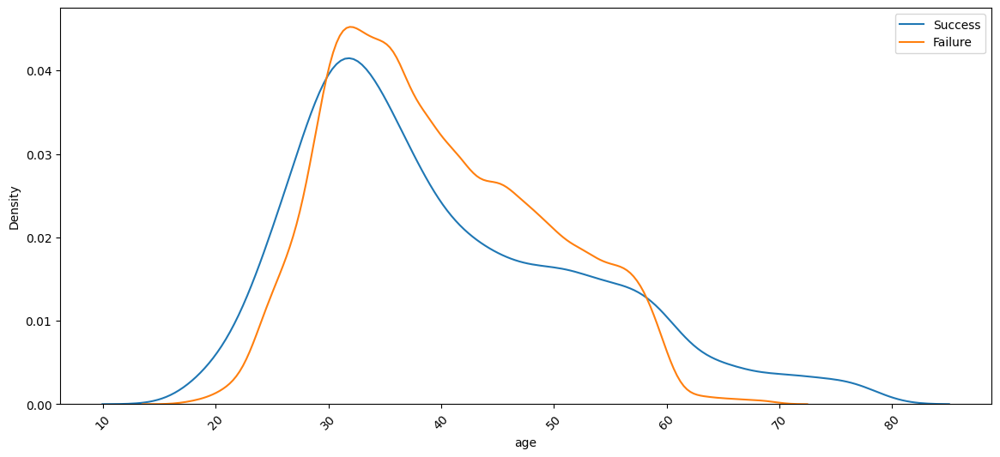

In [48]:
one_dimentional_numeric(raw_df, 'age', 'y_code')

**Observations**
- Customers aged around 28 and those aged 59 and over are more likely to open a fixed-term deposit.
- The majority of customers aged between 28 and 59 do not open a deposit.

### Analysis of the `duration` feature

Пошук викидів в duration при випадках з оформленим строковим депозитом
IQR: 488.25
Мінімальне значення, до якого існують викиди: -479.375
Максимальне значення, після якого існують викиди: 1473.625
Пошук викидів в duration при випадках з неоформленим строковим депозитом
IQR: 184.0
Мінімальне значення, до якого існують викиди: -181.0
Максимальне значення, після якого існують викиди: 555.0
Видалення викидів і побудова діаграми розподілу


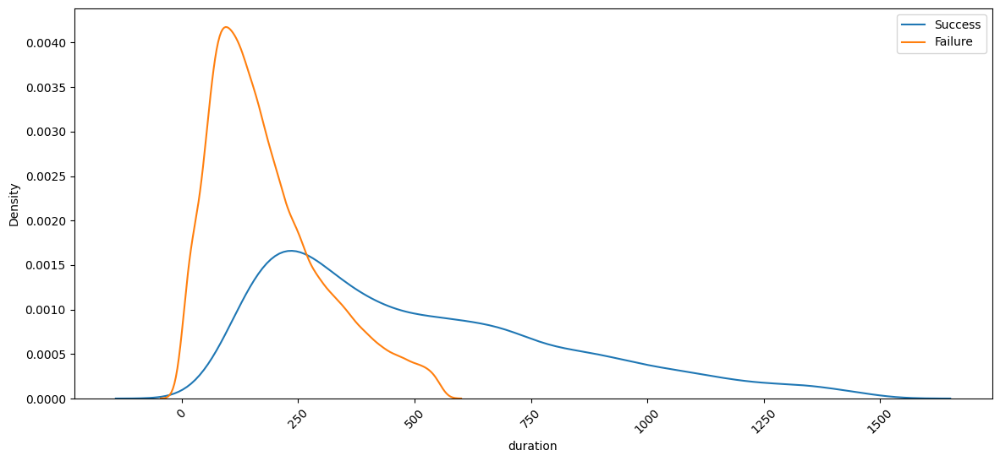

In [49]:
one_dimentional_numeric(raw_df, 'duration', 'y_code')

**Observations**
- The majority of customers who had a call with a manager lasting up to 300 seconds do not open a fixed-term deposit.
- Customers who had a call with a manager lasting between 500 and 600 seconds predominantly open a fixed-term deposit. Furthermore, all customers whose call lasted longer than 600 seconds open a fixed-term deposit.

### Analysis of the `campaign` feature

Пошук викидів в campaign при випадках з оформленим строковим депозитом
IQR: 1.0
Мінімальне значення, до якого існують викиди: -0.5
Максимальне значення, після якого існують викиди: 3.5
Пошук викидів в campaign при випадках з неоформленим строковим депозитом
IQR: 2.0
Мінімальне значення, до якого існують викиди: -2.0
Максимальне значення, після якого існують викиди: 6.0
Видалення викидів і побудова діаграми розподілу


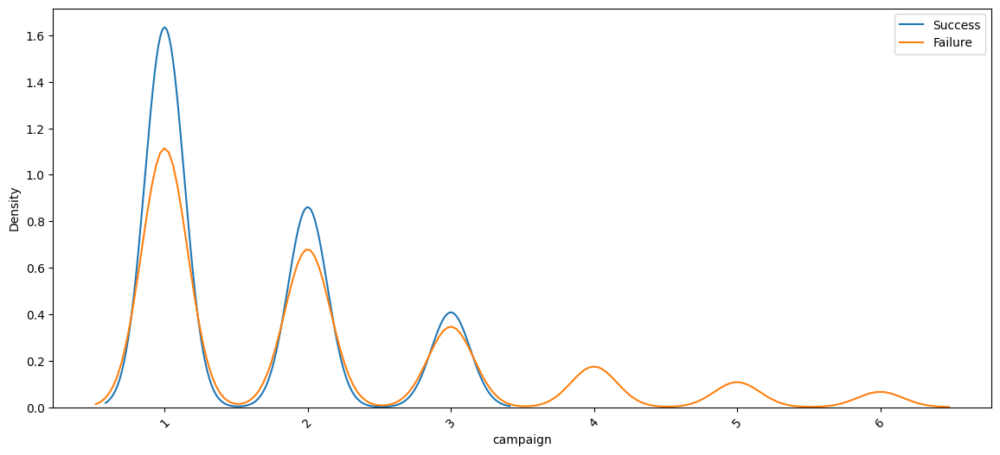

In [50]:
one_dimentional_numeric(raw_df, 'campaign', 'y_code')

**Observations**
- Customers with up to four contacts during the current campaign predominantly open a fixed-term deposit.
- None of the customers with more than four contacts during the current campaign open a fixed-term deposit.

### Analysis of the `pdays` feature

Пошук викидів в pdays при випадках з оформленим строковим депозитом
IQR: 0.0
Мінімальне значення, до якого існують викиди: 999.0
Максимальне значення, після якого існують викиди: 999.0
Пошук викидів в pdays при випадках з неоформленим строковим депозитом
IQR: 0.0
Мінімальне значення, до якого існують викиди: 999.0
Максимальне значення, після якого існують викиди: 999.0
Видалення викидів і побудова діаграми розподілу


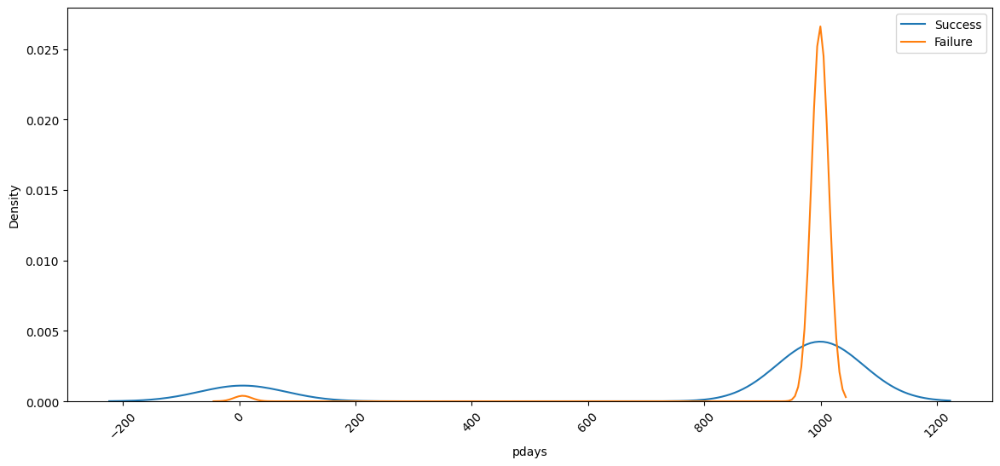

In [51]:
one_dimentional_numeric(raw_df, 'pdays', 'y_code')

**Observations**
- Customers who have not had any previous contact with the bank generally do not open a fixed-term deposit.
- Whereas the vast majority of customers for whom some time has elapsed since their previous contact do open a fixed-term deposit.

### Analysis of the `previous` feature

Пошук викидів в previous при випадках з оформленим строковим депозитом
IQR: 1.0
Мінімальне значення, до якого існують викиди: -1.5
Максимальне значення, після якого існують викиди: 2.5
Пошук викидів в previous при випадках з неоформленим строковим депозитом
IQR: 0.0
Мінімальне значення, до якого існують викиди: 0.0
Максимальне значення, після якого існують викиди: 0.0
Видалення викидів і побудова діаграми розподілу


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_21472\152369963.py:100: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df0[df0[column] <= Max_value0][column],label = 'Failure')


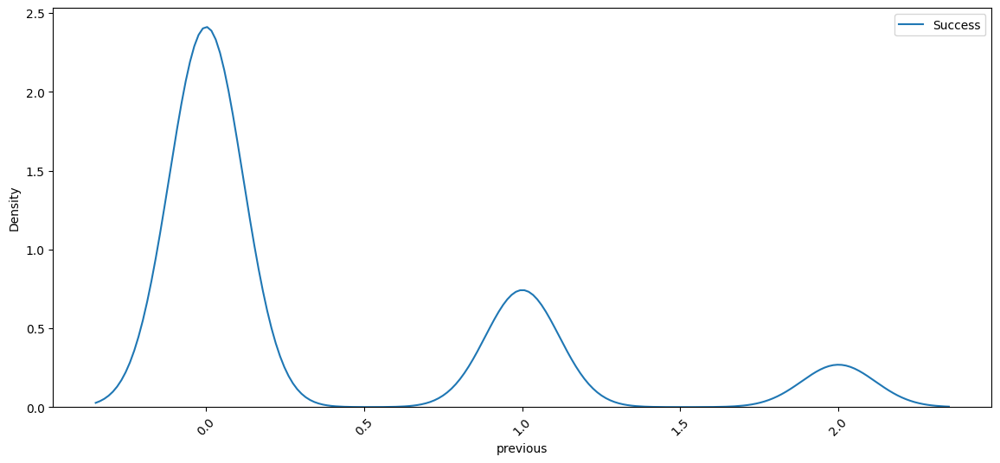

In [52]:
one_dimentional_numeric(raw_df, 'previous', 'y_code')

**Observations**
- Customers who had no prior contact with the bank before this campaign do not open a deposit account.
- Customers who had contact with the bank prior to the current campaign predominantly open a deposit account.

### Analysis of the `emp.var.rate` feature

Пошук викидів в emp.var.rate при випадках з оформленим строковим депозитом
IQR: 1.7
Мінімальне значення, до якого існують викиди: -4.35
Максимальне значення, після якого існують викиди: 2.45
Пошук викидів в emp.var.rate при випадках з неоформленим строковим депозитом
IQR: 3.2
Мінімальне значення, до якого існують викиди: -6.6
Максимальне значення, після якого існують викиди: 6.2
Видалення викидів і побудова діаграми розподілу


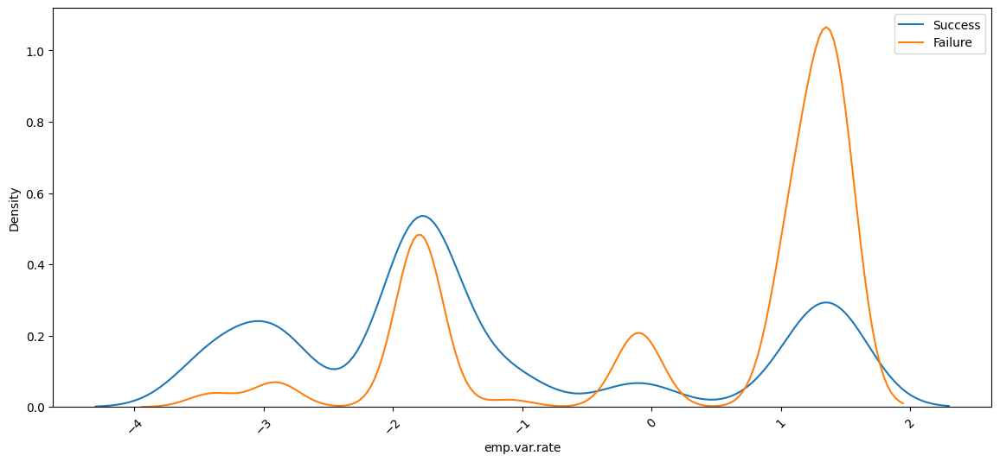

In [53]:
one_dimentional_numeric(raw_df, 'emp.var.rate', 'y_code')

**Observations**
- When the rate of change in employment is less than -0.4, the vast majority of customers open a fixed-term deposit.
- When the rate of change in employment is between -0.4 and 0.3, or between 0.8 and 1.9, the majority of customers do not open a deposit.

### Analysis of the `cons.price.idx` attribute

Пошук викидів в cons.price.idx при випадках з оформленим строковим депозитом
IQR: 1.025
Мінімальне значення, до якого існують викиди: 91.3555
Максимальне значення, після якого існують викиди: 95.4555
Пошук викидів в cons.price.idx при випадках з неоформленим строковим депозитом
IQR: 0.919
Мінімальне значення, до якого існують викиди: 91.6965
Максимальне значення, після якого існують викиди: 95.3725
Видалення викидів і побудова діаграми розподілу


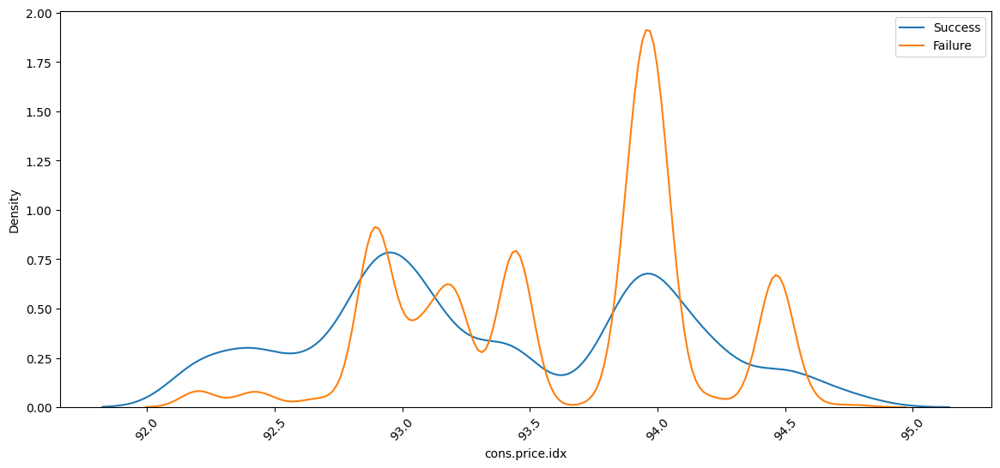

In [54]:
one_dimentional_numeric(raw_df, 'cons.price.idx', 'y_code')

**Observations**
- When the Consumer Price Index is below 92.8 or above 94.6, the majority of customers open a fixed-term deposit.
- When the Consumer Price Index falls within the ranges 92.8–93.6 and 93.8–94.2, or at 94.5, the vast majority of customers do not open a deposit.

### Analysis of the `cons.conf.idx` feature

Пошук викидів в cons.conf.idx при випадках з оформленим строковим депозитом
IQR: 10.1
Мінімальне значення, до якого існують викиди: -61.35
Максимальне значення, після якого існують викиди: -20.95
Пошук викидів в cons.conf.idx при випадках з неоформленим строковим депозитом
IQR: 6.3
Мінімальне значення, до якого існують викиди: -52.15
Максимальне значення, після якого існують викиди: -26.95
Видалення викидів і побудова діаграми розподілу


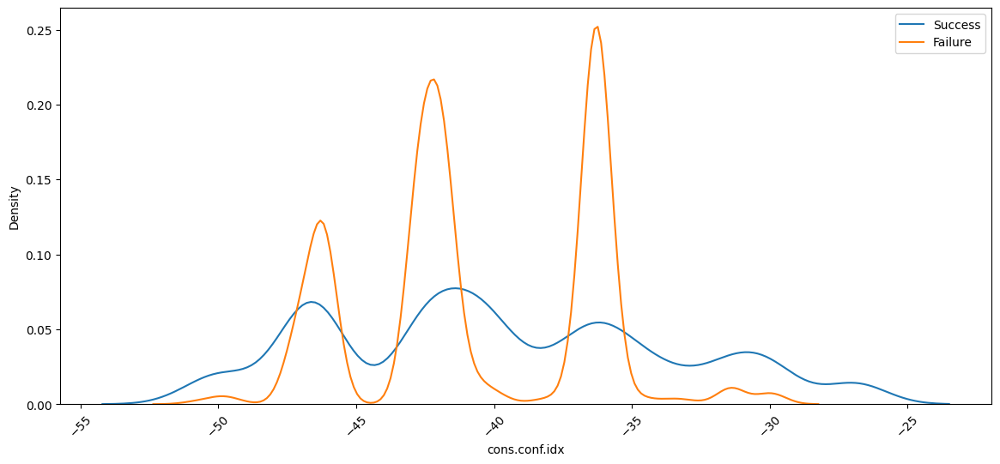

In [55]:
one_dimentional_numeric(raw_df, 'cons.conf.idx', 'y_code')

**Observations**
- When the consumer confidence index is within the ranges (-47; -46), (-44; -41) and (-37; -35), the majority of customers do not open a fixed-term deposit.
- In all other cases, customers generally open a deposit.

### Analysis of the `euribor3m` feature

Пошук викидів в euribor3m при випадках з оформленим строковим депозитом
IQR: 3.557
Мінімальне значення, до якого існують викиди: -4.4865
Максимальне значення, після якого існують викиди: 9.7415
Пошук викидів в euribor3m при випадках з неоформленим строковим депозитом
IQR: 3.557
Мінімальне значення, до якого існують викиди: -3.9305
Максимальне значення, після якого існують викиди: 10.2975
Видалення викидів і побудова діаграми розподілу


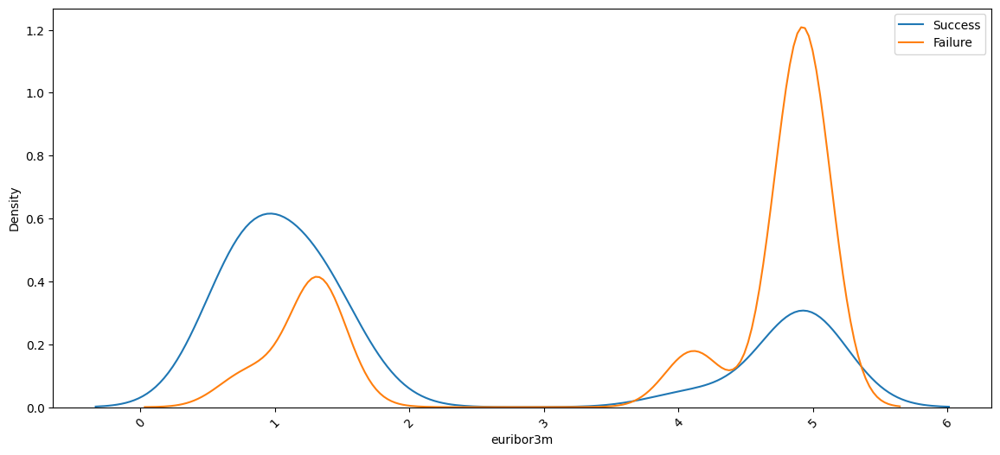

In [56]:
one_dimentional_numeric(raw_df, 'euribor3m', 'y_code')

**Observations**
- When the 3-month Euribor rate is between 0 and 2, most customers open a fixed-term deposit.
- When the rate is between 3.5 and 5.5, most customers do not open a deposit.

### Analysis of the `nr.employed` feature

Пошук викидів в nr.employed при випадках з оформленим строковим депозитом
IQR: 173.5
Мінімальне значення, до якого існують викиди: 4757.25
Максимальне значення, після якого існують викиди: 5451.25
Пошук викидів в nr.employed при випадках з неоформленим строковим депозитом
IQR: 129.0
Мінімальне значення, до якого існують викиди: 4905.6
Максимальне значення, після якого існують викиди: 5421.6
Видалення викидів і побудова діаграми розподілу


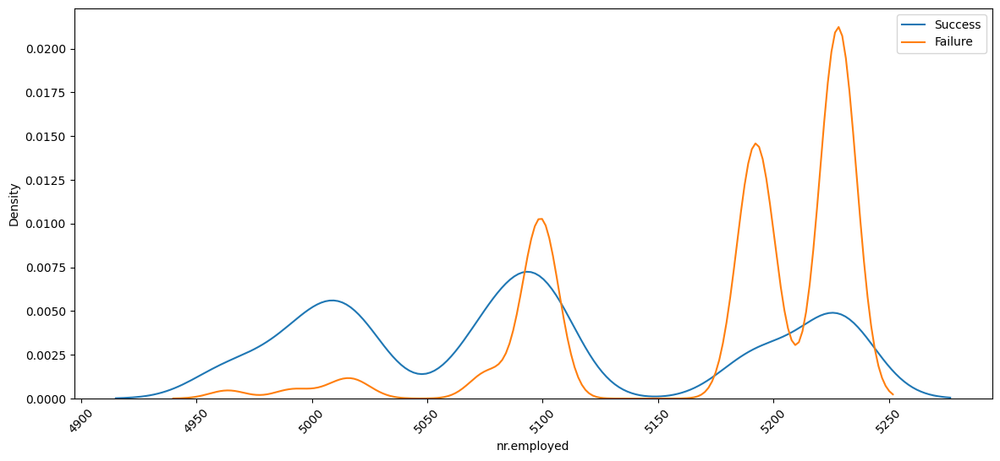

In [57]:
one_dimentional_numeric(raw_df, 'nr.employed', 'y_code')

**Observations**
- When the number of employed people is fewer than 5,090, clients predominantly open a fixed-term deposit.
- When the number of employed people is 5,100 or falls within the range of 5,175–5,250, the majority of clients do not open a deposit.

## One-dimensional analysis of categorical variables

### Analysis of the `job` feature

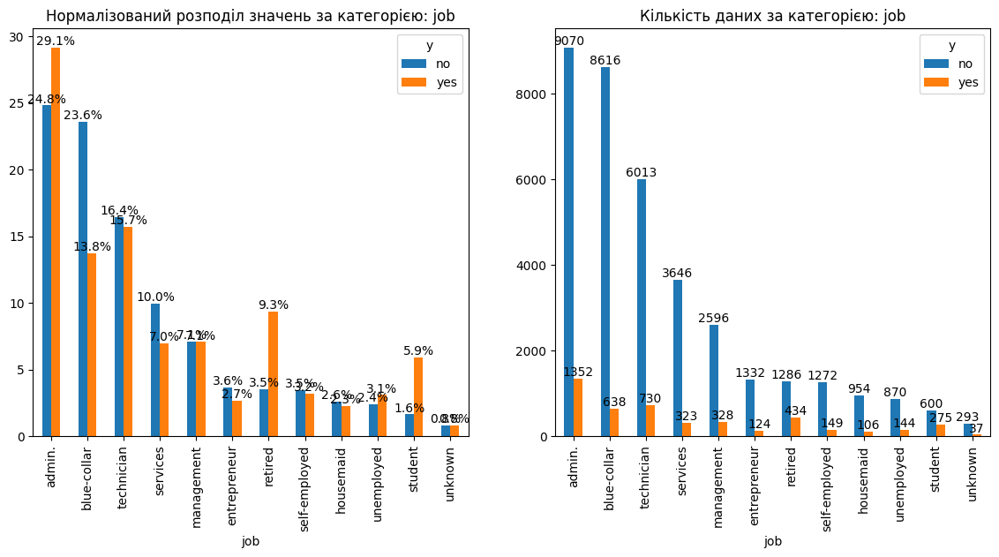

In [58]:
uni_cat_y_compare(raw_df, 'job')

**Observations**
- Based on the histogram of clients’ occupations, we can see significant differences between those who open a fixed-term deposit and those who do not.
- Clients in the ‘admin.’, ‘retired’ and ‘student’ categories are most likely to open a fixed-term deposit.
- The majority of clients in the ‘blue-collar’ category do not open a fixed-term deposit.

**Conclusion**
- The `job` column provides evidence regarding whether clients open a fixed-term deposit or not, so it should be retained as a factor for modelling.

### Analysis of the `marital` feature

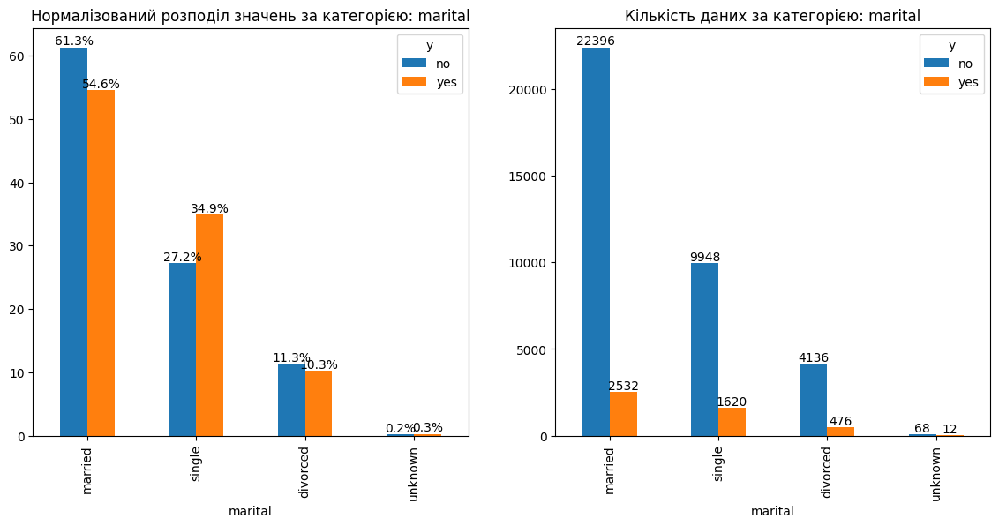

In [59]:
uni_cat_y_compare(raw_df, 'marital')

**Observations**
- According to the distribution chart by marital status, the majority of single customers open a fixed-term deposit.
- Married customers are generally less likely to open a fixed-term deposit.

**Conclusion**
- The `marital` column provides evidence regarding whether or not clients open a fixed-term deposit, so it should be retained as a factor for modelling.

### Analysis of the `education` feature

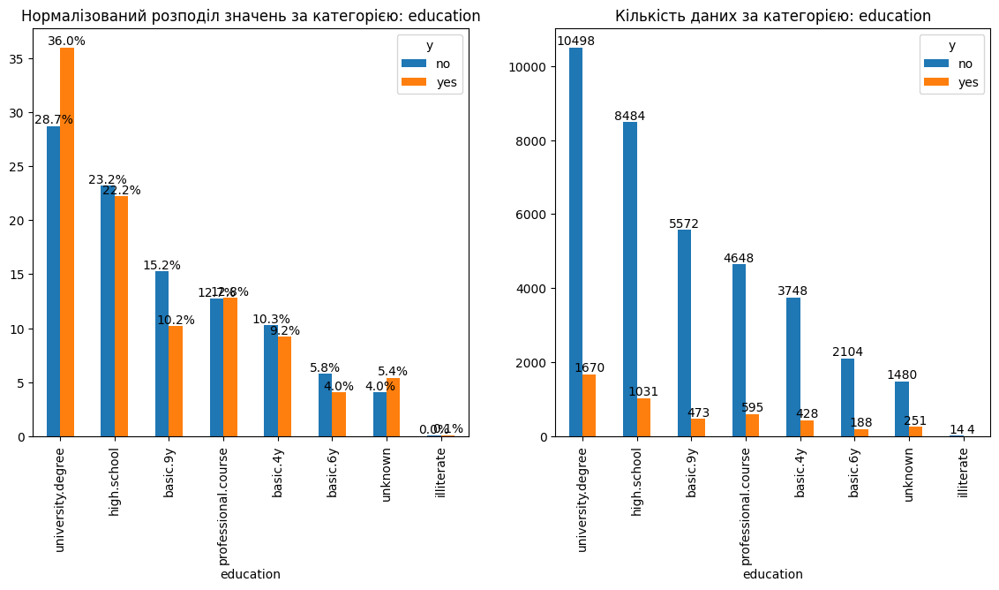

In [60]:
uni_cat_y_compare(raw_df, 'education')

**Observations**
- According to the distribution chart, customers with higher education are more likely to open a fixed-term deposit.
- The majority of customers with nine years of basic education do not open a fixed-term deposit.


**Conclusion**
- The `education` column provides evidence regarding whether or not customers open a fixed-term deposit, so it should be retained as a factor for modelling.

### Analysis of the `default` feature

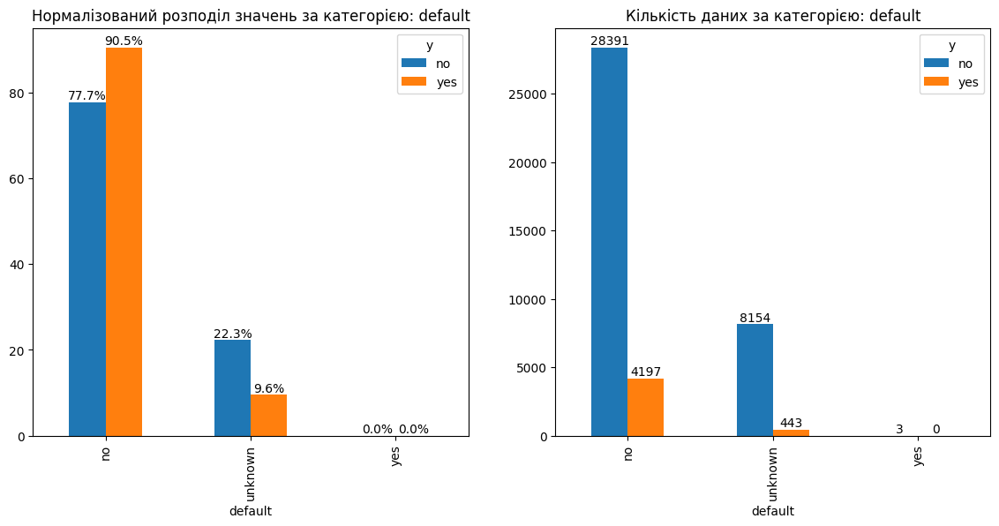

In [61]:
uni_cat_y_compare(raw_df, 'default')

**Observations**
- According to the distribution chart, the majority of customers who open a fixed-term deposit do not have any overdue loans.


**Conclusion**
- The `default` column indicates whether customers open a fixed-term deposit or not, so it should be retained as a factor for modelling. However, attention should also be paid to the missing data.

### Analysis of the `housing` feature

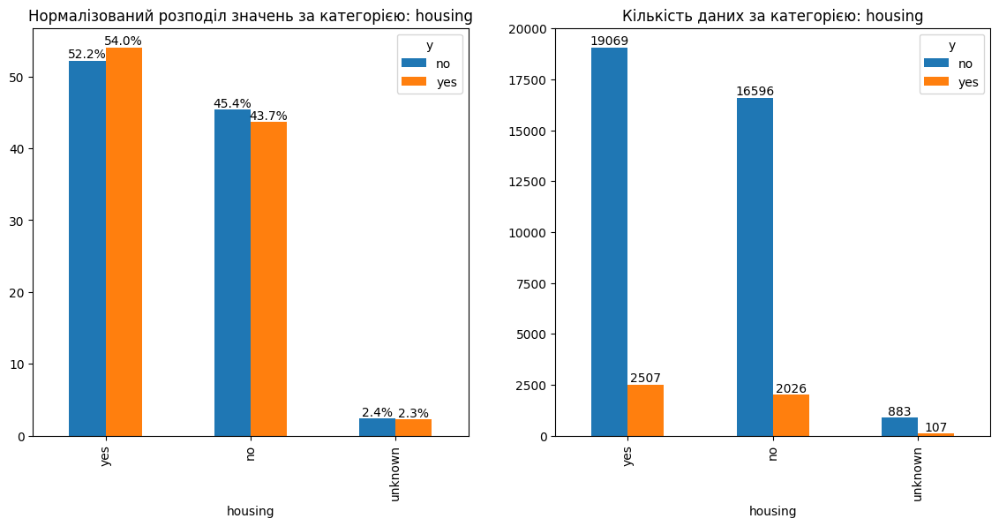

In [62]:
uni_cat_y_compare(raw_df, 'housing')

**Observations**
- According to the distribution chart regarding the existence of a mortgage, we do not identify any significant differences that would distinguish a particular type of customer who would or would not open a fixed-term deposit.
- That said, the majority of customers in the dataset do, in fact, have a mortgage.

**Conclusion**
- The `housing` column does not provide conclusive evidence as to whether or not a deposit will be taken out.

### Analysis of the `loan` feature

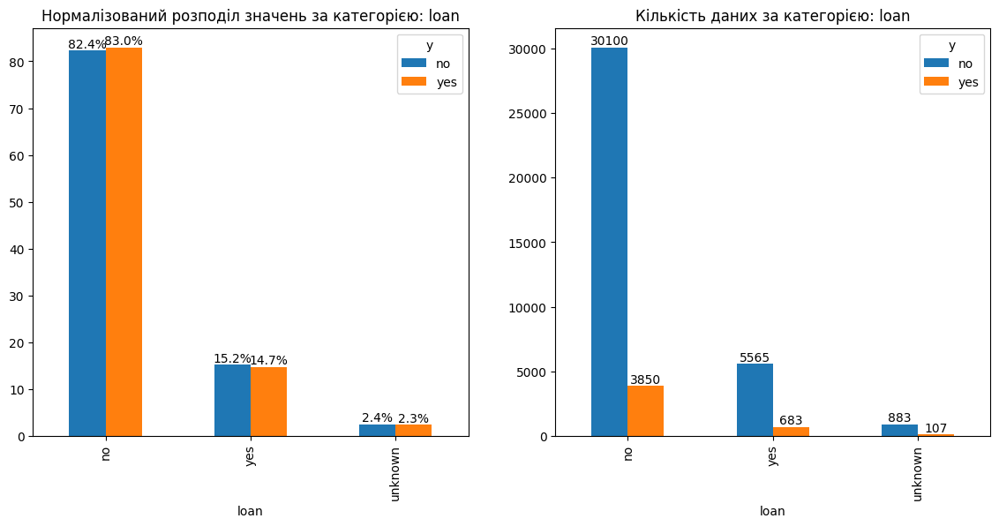

In [63]:
uni_cat_y_compare(raw_df, 'loan')

**Observations**
- The breakdown of users by consumer credit status does not reveal any significant differences between customers who are able to open a fixed-term deposit and those who are not.
- That said, the majority of customers do not have a consumer credit facility, at least in the current dataset.

**Conclusion**
- The `loan` column does not provide conclusive evidence regarding whether or not a fixed-term deposit can be opened.

### Analysis of the `contact` feature

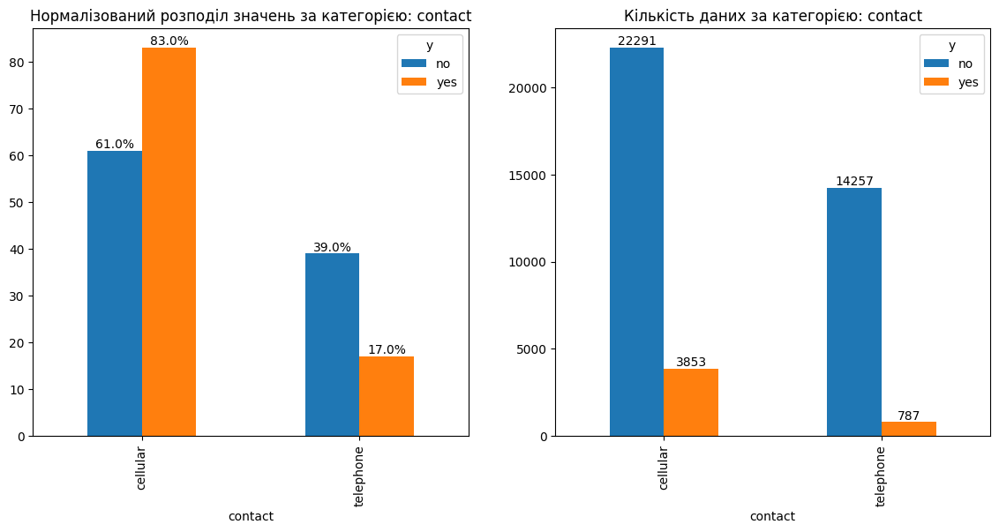

In [64]:
uni_cat_y_compare(raw_df, 'contact')

**Observations**
- Customers who contact us via mobile tend to open a fixed-term deposit.
- Whereas customers who contact us via telephone mostly do not open a deposit.


**Conclusion**
- The `contact` column provides evidence as to whether or not a fixed-term deposit has been opened.

### Analysis of the `month` feature

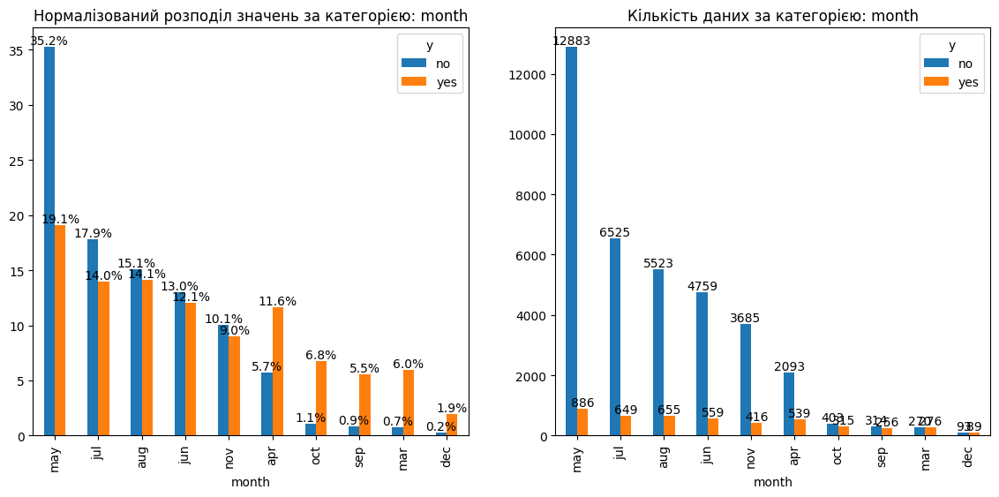

In [65]:
uni_cat_y_compare(raw_df, 'month')

**Observations**
- Customers whose most recent contact was in May or July mostly do not open a fixed-term deposit (this also applies to June and August).
- Customers whose most recent contact was in September, October, December, March or April predominantly open a fixed-term deposit.


**Conclusion**
- The `month` column provides evidence regarding whether or not a fixed-term deposit is likely to be opened.

### Analysis of the `day_of_week` feature

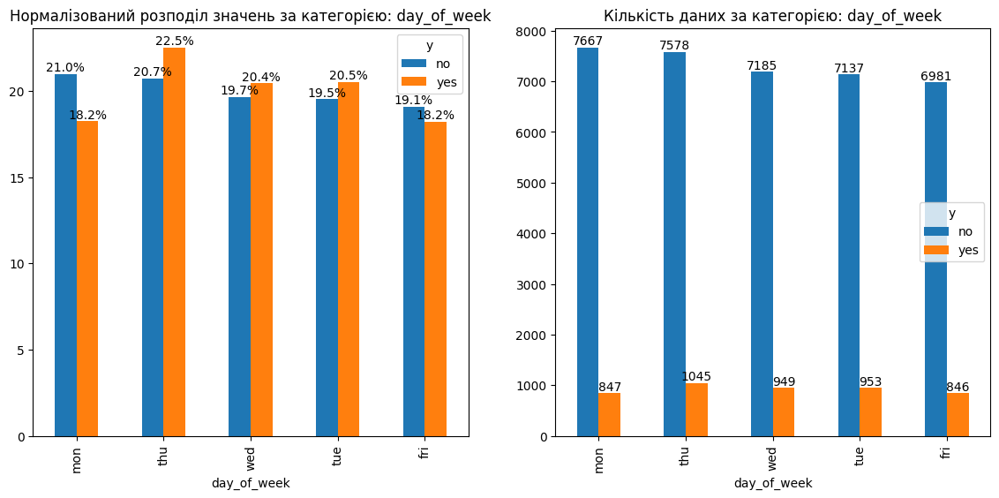

In [66]:
uni_cat_y_compare(raw_df, 'day_of_week')

**Observations**
- According to the distribution chart for the day of the week of the last contact, no significant differences were found to indicate a propensity to open a fixed-term deposit or not.

**Conclusion**
- The `day_of_week` column does not provide conclusive evidence as to whether a fixed-term deposit is likely to be opened or not.

### Analysis of the `poutcome` feature

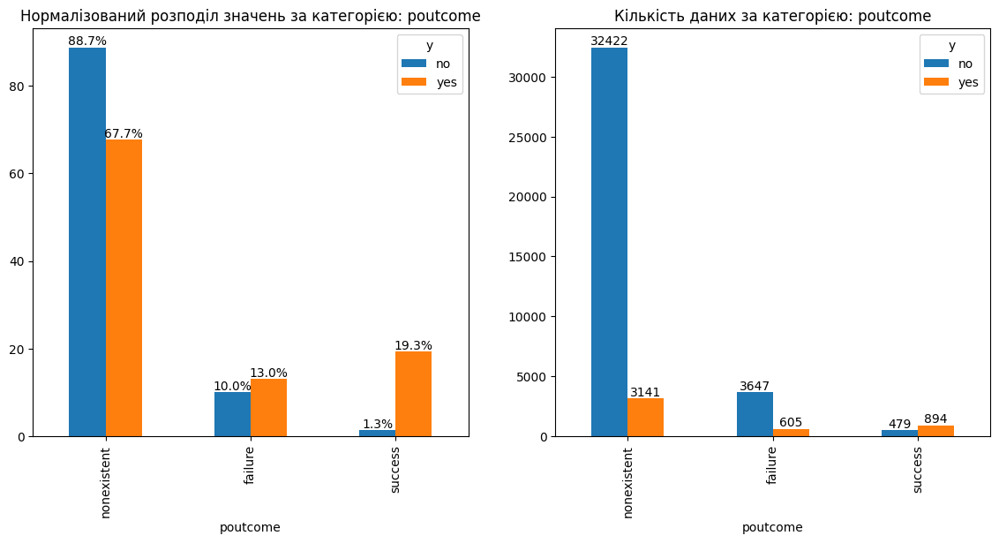

In [67]:
uni_cat_y_compare(raw_df, 'poutcome')

**Observations**
- The majority of those who had no contact during the previous campaign (nonexistent) are not inclined to open a fixed-term deposit.
- Customers with a successful contact status from the previous campaign mostly open a deposit, although there is a proportion who decline.
- According to the distribution chart, despite the fact that the outcome of contact in the previous campaign was a failure, the vast majority of customers still open a fixed-term deposit.

**Conclusion**
- The `poutcome` column provides compelling evidence regarding the likelihood of opening a fixed-term deposit.

## Two-dimensional analysis

### Continuous vs continuous variable

#### Analysis of the `age` and `pdays` features

Викидів для аналізованих стовпців


,yes,no
age,78.5,69.5
pdays,999.0,999.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


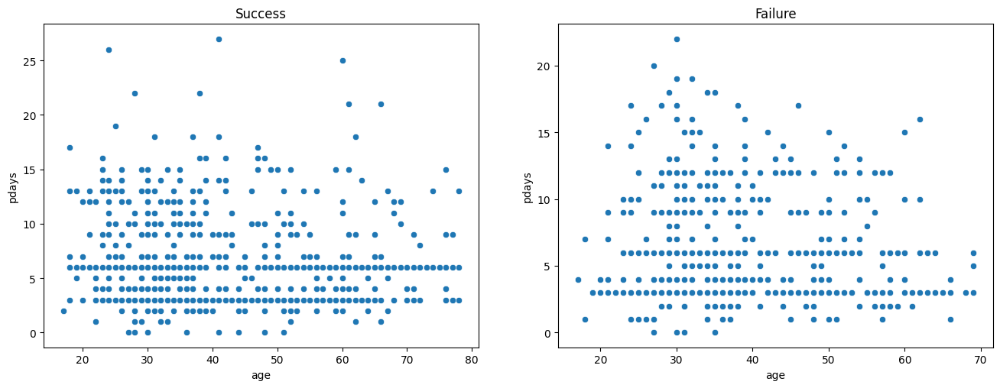

In [68]:
multidimensional_numeric(raw_df, ['age', 'pdays'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `age` and `pdays`; there is no correlation.

#### Analysis of the `age` and `campaign` attributes

Викидів для аналізованих стовпців


,yes,no
age,78.5,69.5
campaign,3.5,6.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


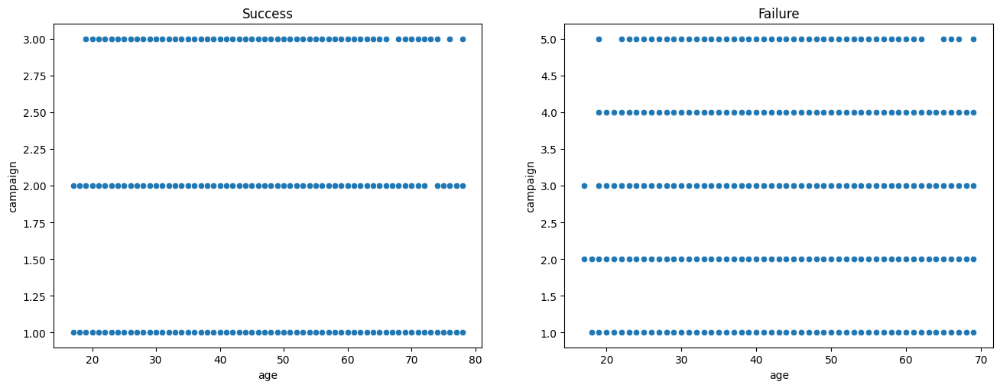

In [69]:
multidimensional_numeric(raw_df, ['age','campaign'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `age` and `campaign`; there is no correlation.

#### Analysis of the `age` and `duration` features

Викидів для аналізованих стовпців


,yes,no
age,78.500,69.5
duration,1473.625,555.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


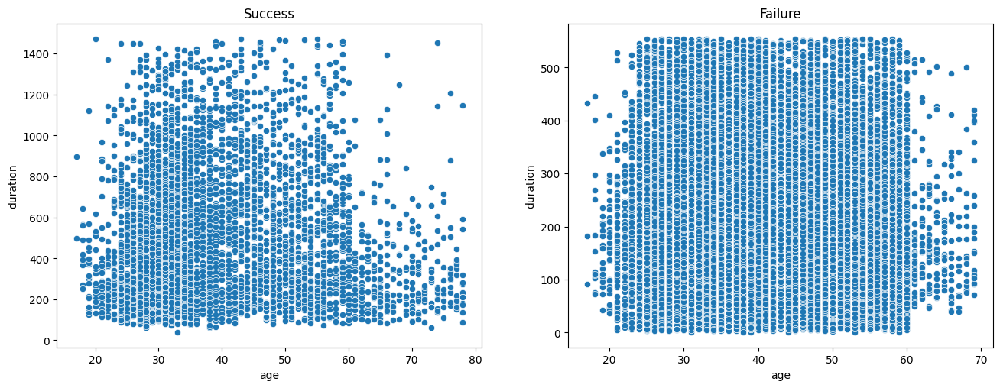

In [70]:
multidimensional_numeric(raw_df, ['age', 'duration'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `age` and `duration`; there is no correlation.

#### Analysis of the `age` and `previous` feature

Викидів для аналізованих стовпців


,yes,no
age,78.5,69.5
previous,2.5,0.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


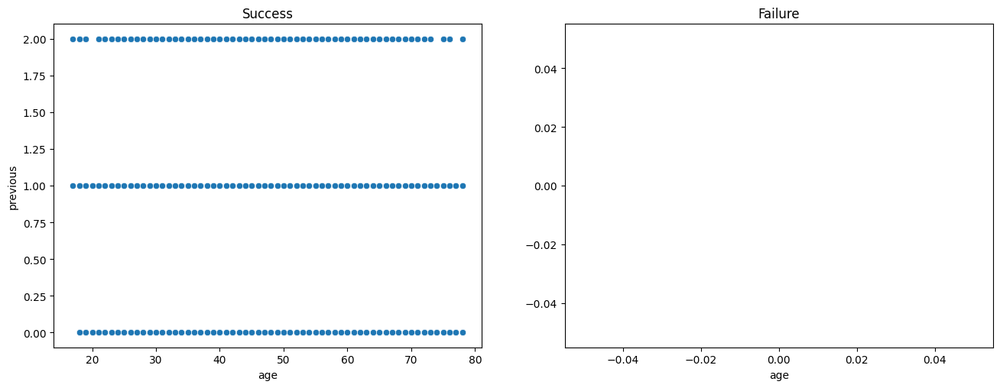

In [71]:
multidimensional_numeric(raw_df, ['age', 'previous'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `age` and `previous`; there is no correlation.

#### Analysis of the `emp.var.rate` and `duration` features

Викидів для аналізованих стовпців


,yes,no
emp.var.rate,2.450,6.2
duration,1473.625,555.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


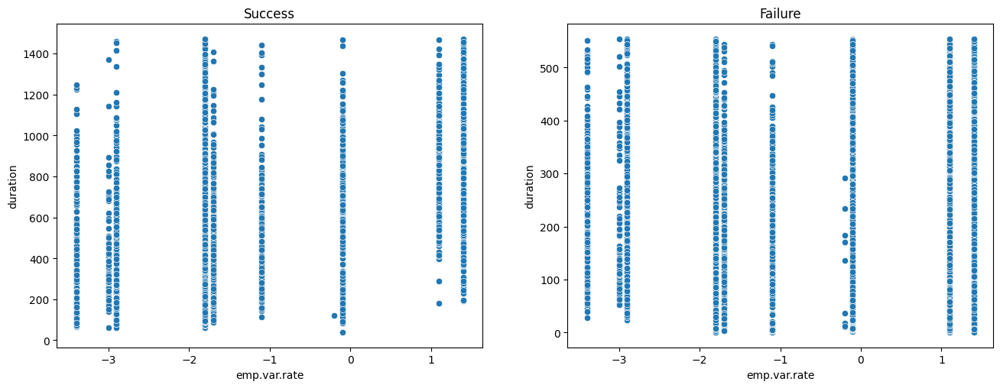

In [72]:
multidimensional_numeric(raw_df, ['emp.var.rate', 'duration'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `emp.var.rate` and `duration`; there is no correlation.

#### Analysis of the `emp.var.rate` and `campaign` feature

Викидів для аналізованих стовпців


,yes,no
emp.var.rate,2.45,6.2
campaign,3.50,6.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


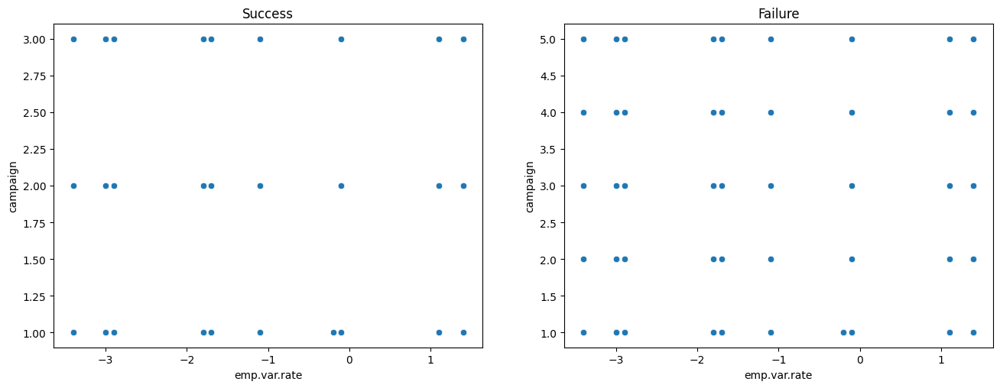

In [73]:
multidimensional_numeric(raw_df, ['emp.var.rate', 'campaign'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `emp.var.rate` and `campaign`; there is no correlation.

#### Analysis of the `emp.var.rate` and `pdays` features

Викидів для аналізованих стовпців


,yes,no
emp.var.rate,2.45,6.2
pdays,999.00,999.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


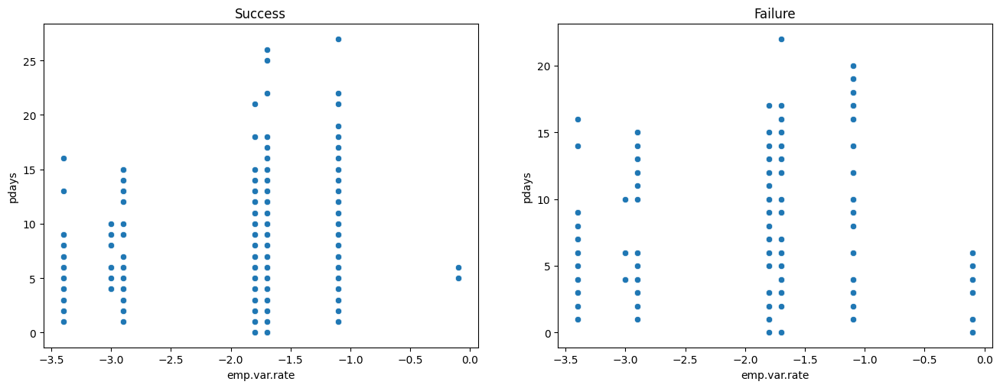

In [74]:
multidimensional_numeric(raw_df, ['emp.var.rate', 'pdays'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `emp.var.rate` and `pdays`; there is no correlation.

#### Analysis of the `emp.var.rate` and `previous` feature

Викидів для аналізованих стовпців


,yes,no
emp.var.rate,2.45,6.2
previous,2.50,0.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


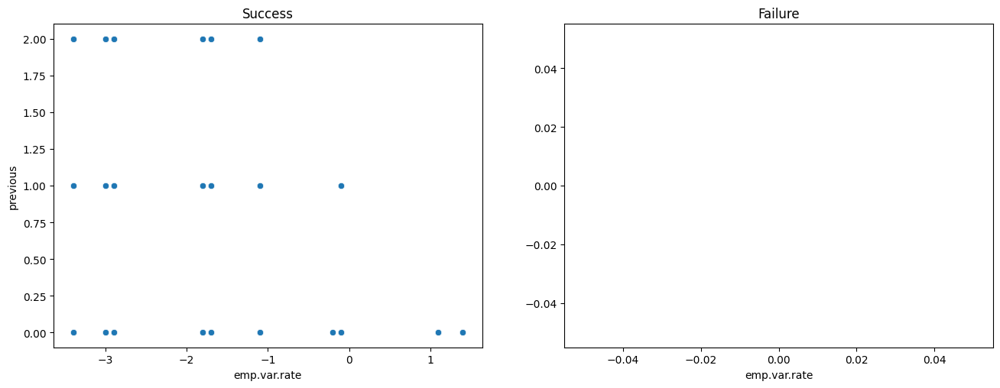

In [75]:
multidimensional_numeric(raw_df, ['emp.var.rate', 'previous'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `emp.var.rate` and `previous`; there is no correlation.

#### Analysis of the `cons.price.idx` and `campaign` feature

Викидів для аналізованих стовпців


,yes,no
cons.price.idx,95.4555,95.3725
campaign,3.5000,6.0000


Побудова діаграми розсіювання для порівняння з видаленими викидами


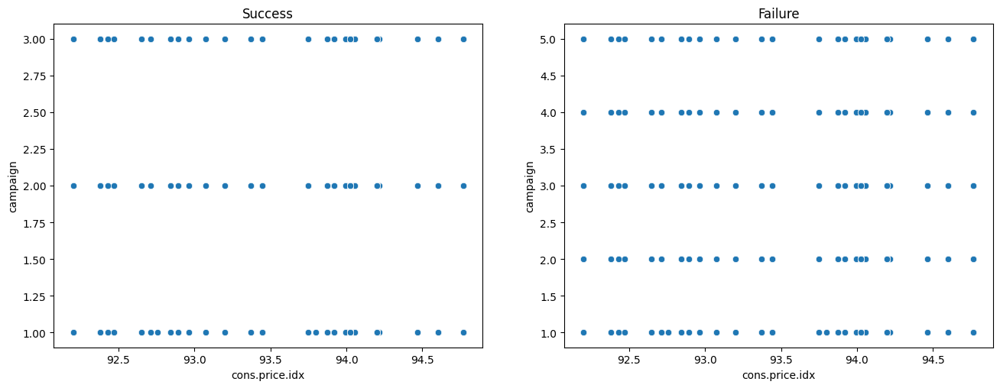

In [76]:
multidimensional_numeric(raw_df, ['cons.price.idx', 'campaign'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `cons.price.idx` and `campaign`; there is no correlation.

#### Analysis of the `cons.price.idx` and `duration` feature

Викидів для аналізованих стовпців


,yes,no
cons.price.idx,95.4555,95.3725
duration,1473.6250,555.0000


Побудова діаграми розсіювання для порівняння з видаленими викидами


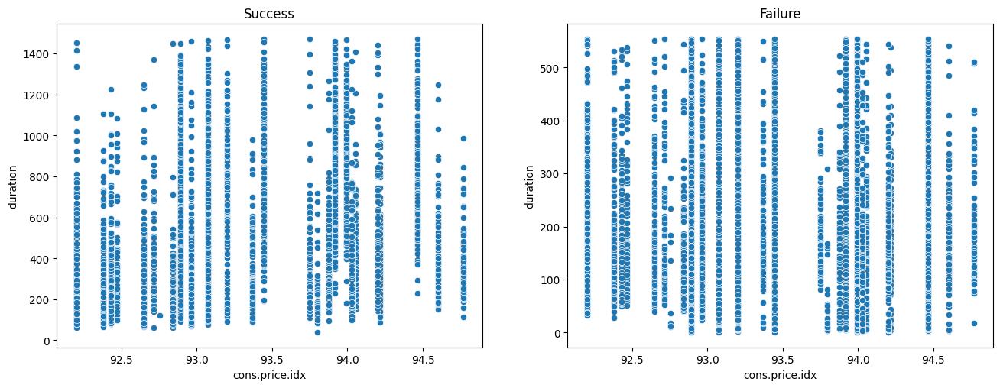

In [77]:
multidimensional_numeric(raw_df, ['cons.price.idx', 'duration'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `cons.price.idx` and `duration`; there is no correlation.

#### Analysis of the `cons.price.idx` and `pdays` feature

Викидів для аналізованих стовпців


,yes,no
cons.price.idx,95.4555,95.3725
pdays,999.0000,999.0000


Побудова діаграми розсіювання для порівняння з видаленими викидами


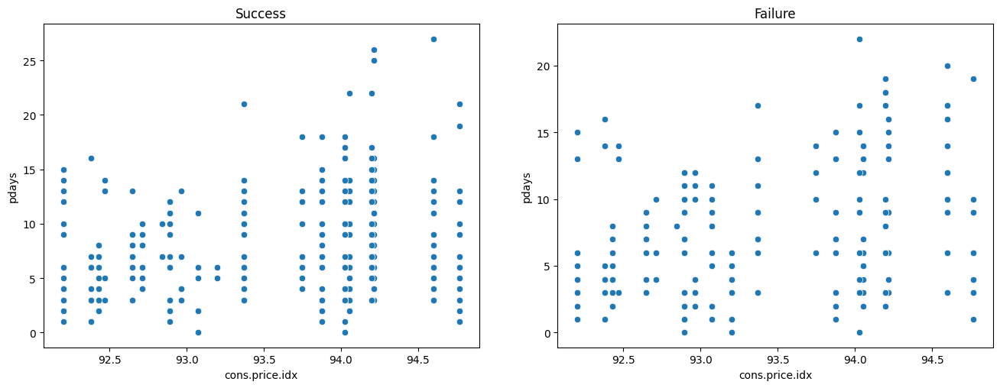

In [78]:
multidimensional_numeric(raw_df, ['cons.price.idx', 'pdays'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `conns.price.idx` and `pdays`; there is no correlation.

#### Analysis of the `cons.price.idx` and `previous` feature

Викидів для аналізованих стовпців


,yes,no
cons.price.idx,95.4555,95.3725
previous,2.5000,0.0000


Побудова діаграми розсіювання для порівняння з видаленими викидами


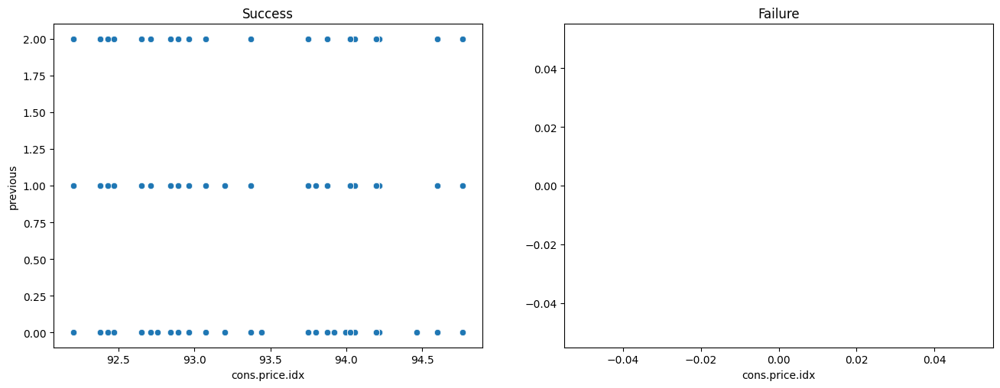

In [79]:
multidimensional_numeric(raw_df, ['cons.price.idx', 'previous'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `cons.price.idx` and `previous`; there is no correlation.

#### Analysis of the `cons.conf.idx` and `campaign` feature

Викидів для аналізованих стовпців


,yes,no
cons.conf.idx,-20.95,-26.95
campaign,3.50,6.00


Побудова діаграми розсіювання для порівняння з видаленими викидами


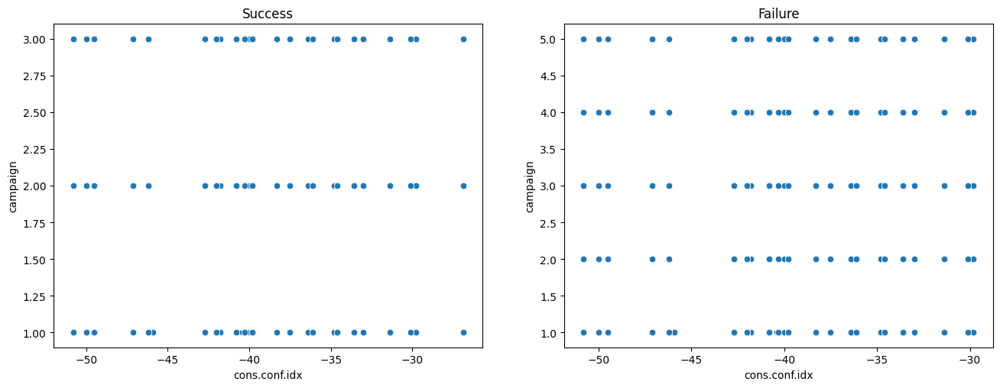

In [80]:
multidimensional_numeric(raw_df, ['cons.conf.idx', 'campaign'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `cons.conf.idx` and `campaign`; there is no correlation.

#### Analysis of the `cons.conf.idx` and `duration` features

Викидів для аналізованих стовпців


,yes,no
cons.conf.idx,-20.950,-26.95
duration,1473.625,555.00


Побудова діаграми розсіювання для порівняння з видаленими викидами


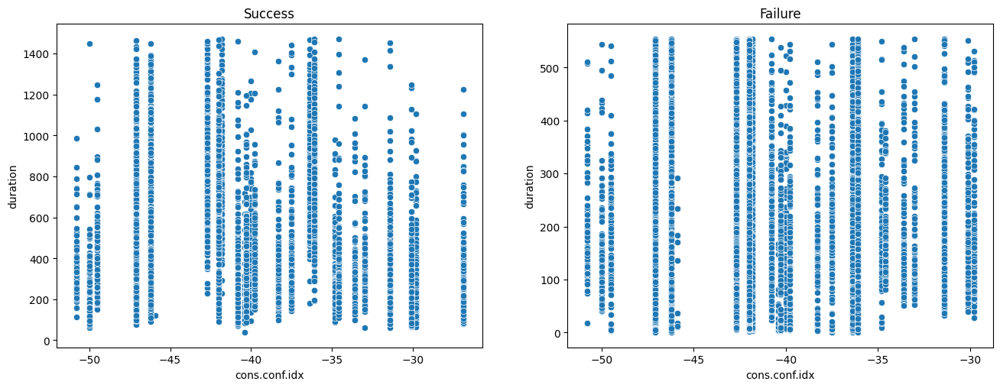

In [81]:
multidimensional_numeric(raw_df, ['cons.conf.idx', 'duration'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `cons.conf.idx` and `duration`; there is no correlation.

#### Analysis of the `cons.conf.idx` and `pdays` features

Викидів для аналізованих стовпців


,yes,no
cons.conf.idx,-20.95,-26.95
pdays,999.00,999.00


Побудова діаграми розсіювання для порівняння з видаленими викидами


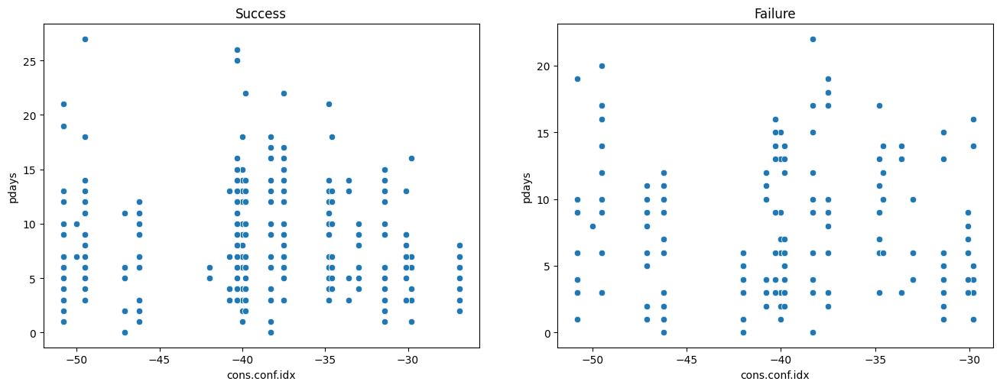

In [82]:
multidimensional_numeric(raw_df, ['cons.conf.idx', 'pdays'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `cons.conf.idx` and `pdays`; there is no correlation.

#### Analysis of the `cons.conf.idx` and `previous` feature

Викидів для аналізованих стовпців


,yes,no
cons.conf.idx,-20.95,-26.95
previous,2.50,0.00


Побудова діаграми розсіювання для порівняння з видаленими викидами


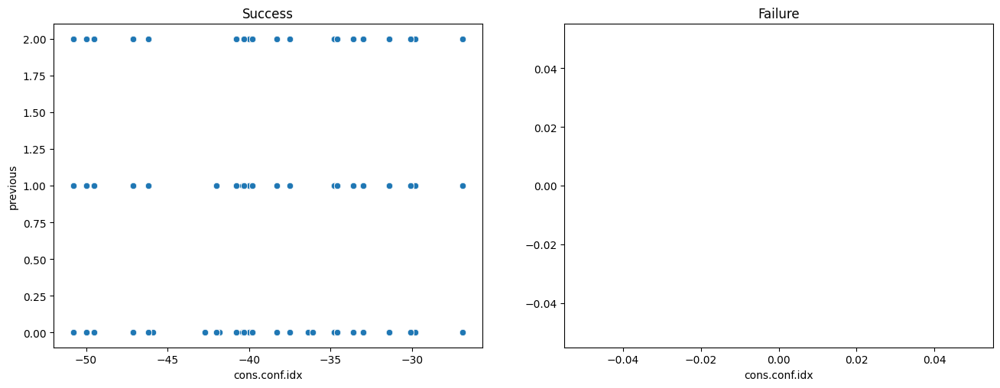

In [83]:
multidimensional_numeric(raw_df, ['cons.conf.idx', 'previous'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `cons.conf.idx` and `previous`; there is no correlation.

#### Analysis of the `euribor3m` and `campaign` feature

Викидів для аналізованих стовпців


,yes,no
euribor3m,9.7415,10.2975
campaign,3.5000,6.0000


Побудова діаграми розсіювання для порівняння з видаленими викидами


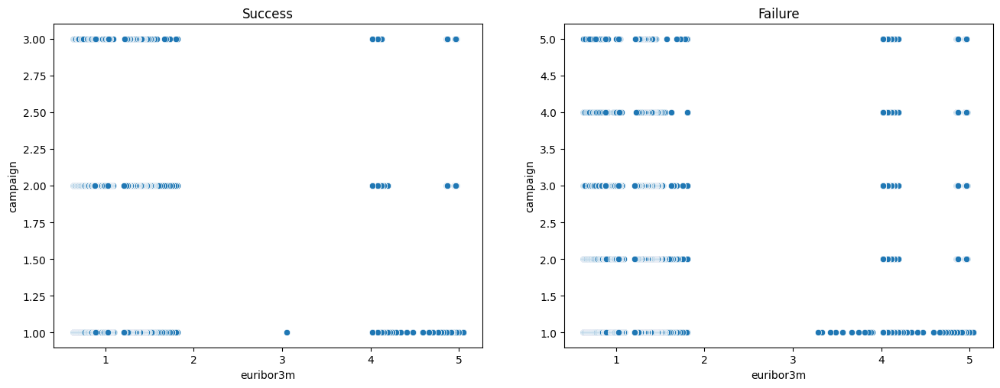

In [84]:
multidimensional_numeric(raw_df, ['euribor3m', 'campaign'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `euribor3m` and `campaign`; there is no correlation.

#### Analysis of the `Euribor 3M` and `duration` feature

Викидів для аналізованих стовпців


,yes,no
euribor3m,9.7415,10.2975
duration,1473.6250,555.0000


Побудова діаграми розсіювання для порівняння з видаленими викидами


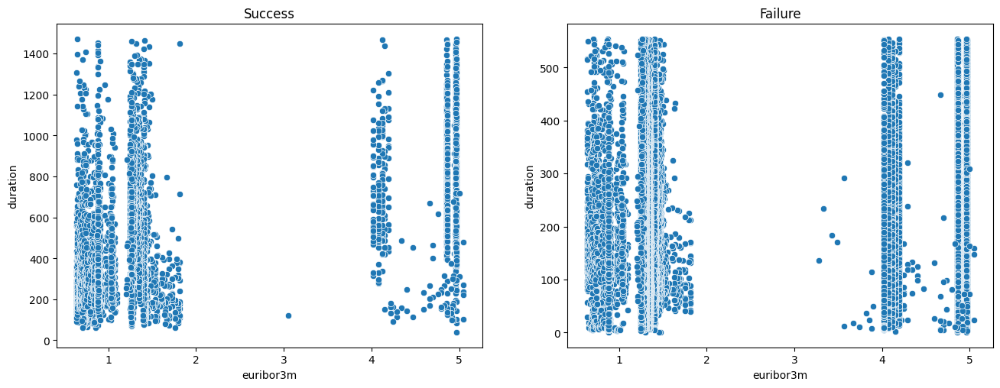

In [85]:
multidimensional_numeric(raw_df, ['euribor3m', 'duration'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `euribor3m` and `duration`; there is no correlation.

#### Analysis of the `euribor3m` and `pdays` feature

Викидів для аналізованих стовпців


,yes,no
euribor3m,9.7415,10.2975
pdays,999.0000,999.0000


Побудова діаграми розсіювання для порівняння з видаленими викидами


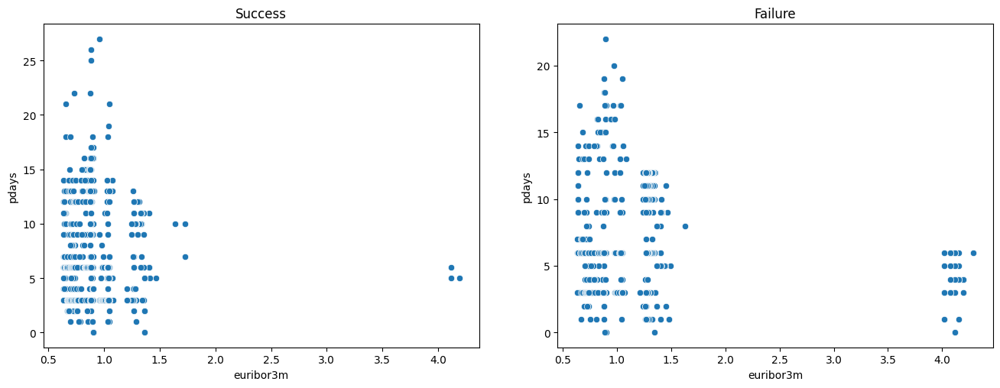

In [86]:
multidimensional_numeric(raw_df, ['euribor3m', 'pdays'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `euribor3m` and `pdays`; there is no correlation.

#### Analysis of the `euribor3m` and `previous` feature

Викидів для аналізованих стовпців


,yes,no
euribor3m,9.7415,10.2975
previous,2.5000,0.0000


Побудова діаграми розсіювання для порівняння з видаленими викидами


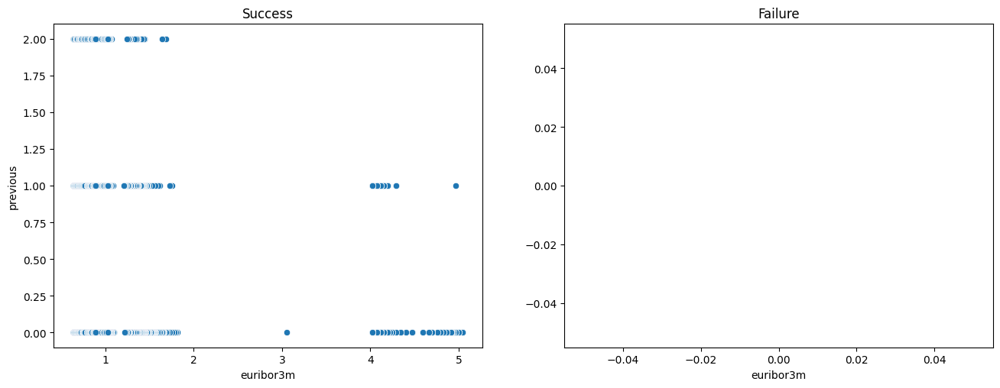

In [87]:
multidimensional_numeric(raw_df, ['euribor3m', 'previous'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `euribor3m` and `previous`; there is no correlation.

#### Analysis of the `nr.employed` and `campaign` feature

Викидів для аналізованих стовпців


,yes,no
nr.employed,5451.25,5421.6
campaign,3.50,6.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


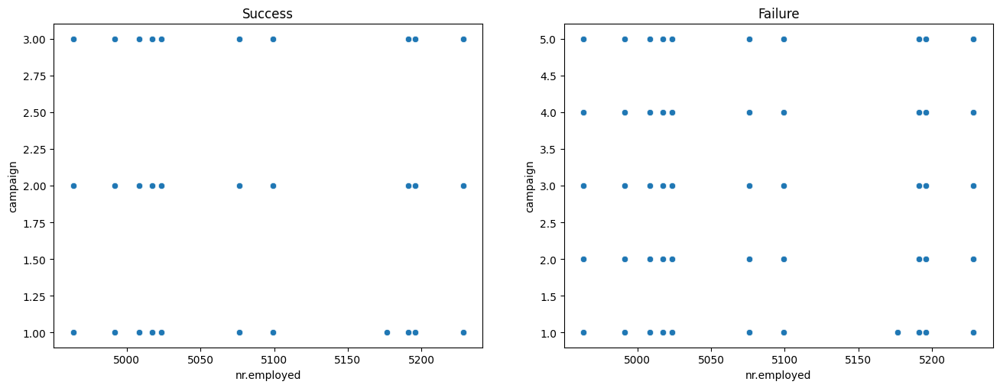

In [88]:
multidimensional_numeric(raw_df, ['nr.employed', 'campaign'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `nr.employed` and `campaign`; there is no correlation.

#### Analysis of the `nr.employed` and `duration` features

Викидів для аналізованих стовпців


,yes,no
nr.employed,5451.250,5421.6
duration,1473.625,555.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


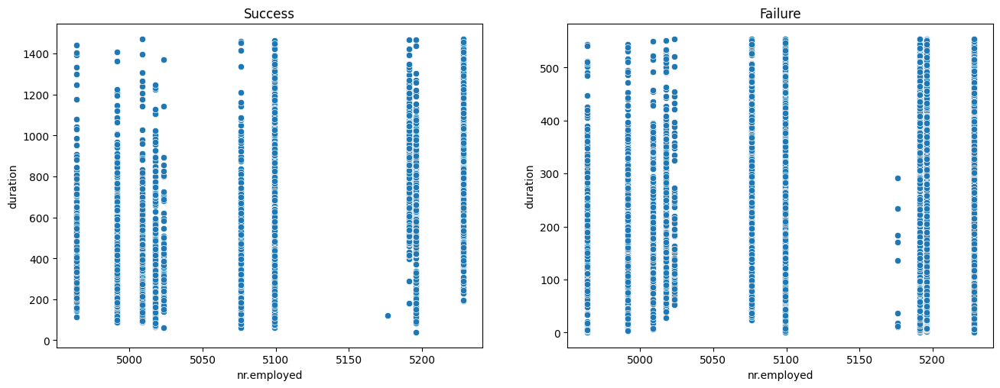

In [89]:
multidimensional_numeric(raw_df, ['nr.employed', 'duration'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `nr.employed` and `duration`; there is no correlation.

#### Analysis of the `nr.employed` and `pdays` features

Викидів для аналізованих стовпців


,yes,no
nr.employed,5451.25,5421.6
pdays,999.00,999.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


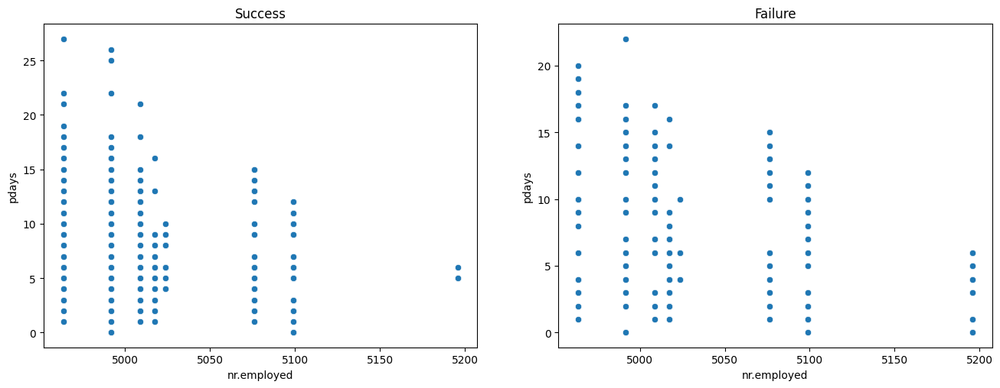

In [90]:
multidimensional_numeric(raw_df, ['nr.employed', 'pdays'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `nr.employed` and `pdays`; there is no correlation.

#### Analysis of the `nr.employed` and `previous` features

Викидів для аналізованих стовпців


,yes,no
nr.employed,5451.25,5421.6
previous,2.50,0.0


Побудова діаграми розсіювання для порівняння з видаленими викидами


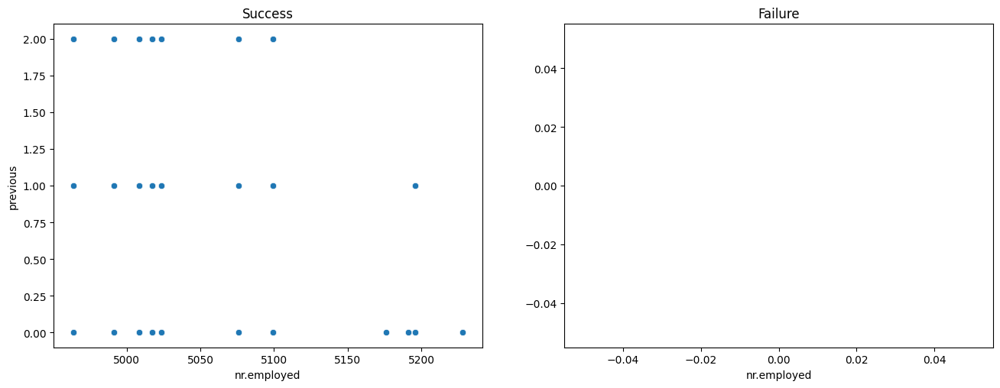

In [91]:
multidimensional_numeric(raw_df, ['nr.employed', 'previous'])

**Observations**
- According to the scatter plots, no particular relationship is observed between `nr.employed` and `previous`; there is no correlation.

### Categorical and categorical variables

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: JOB


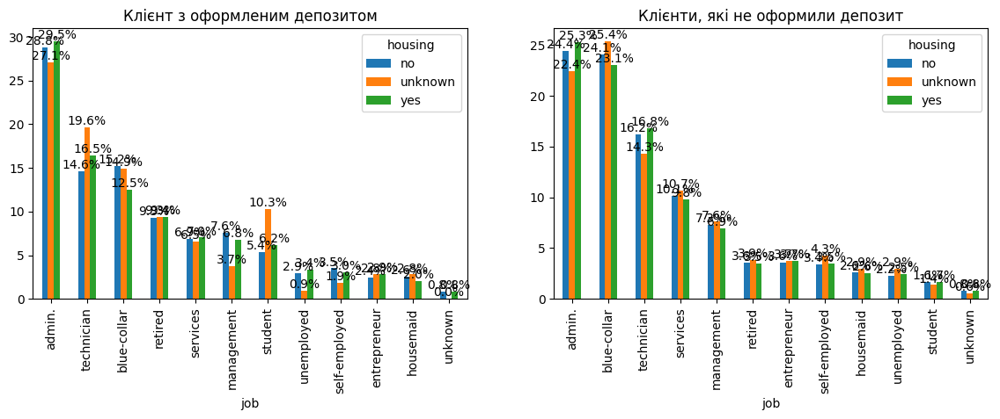

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ JOB


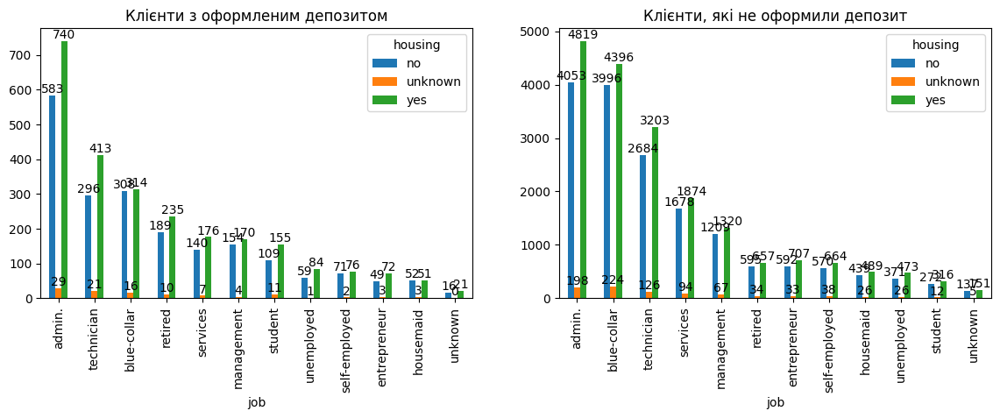

In [1365]:
bi_countplot_target(df_no, df_yes, 'job', 'housing')

**Observations**
- Across all `housing` types, `blue-collar` and `service` customers tend not to open fixed-term deposits as often.
- Across all `housing` types, customers in the `retired` and `students` categories predominantly open deposits

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: JOB


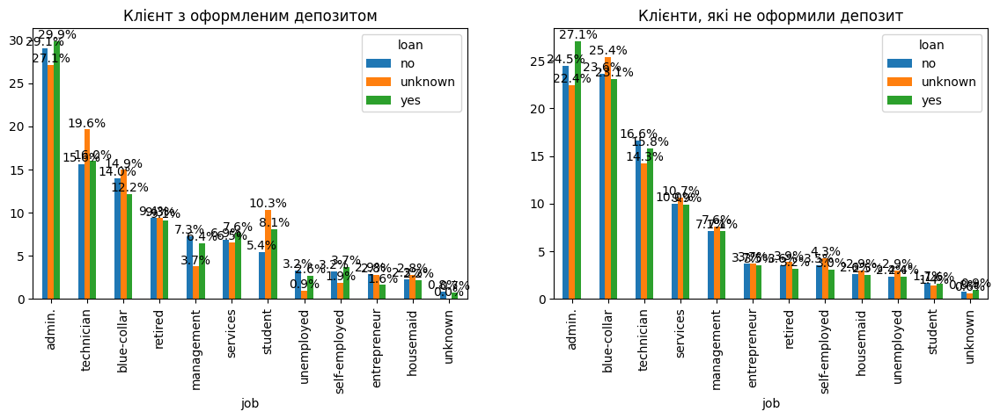

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ JOB


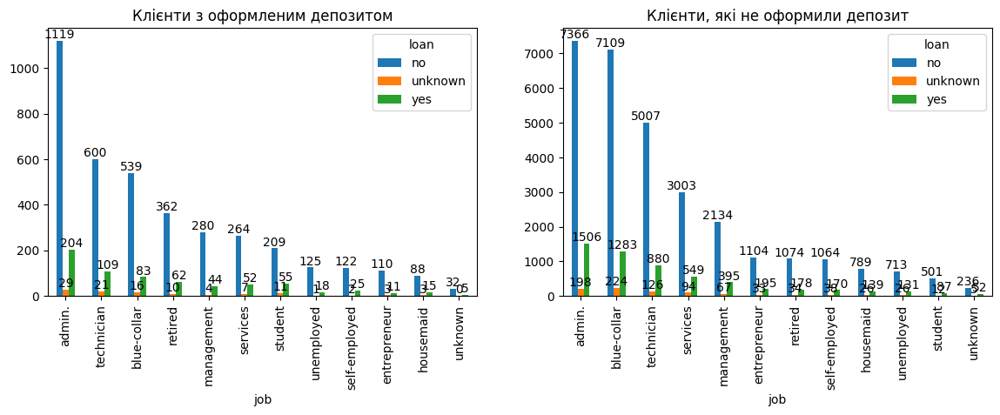

In [92]:
bi_countplot_target(df_no, df_yes, 'job', 'loan')

**Observations**
- Across all `loan` types, `blue-collar` and `service` customers tend not to open fixed-term deposits as often.
- Across all `loan` types, customers in the `retired` and `students` categories predominantly open deposits

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: JOB


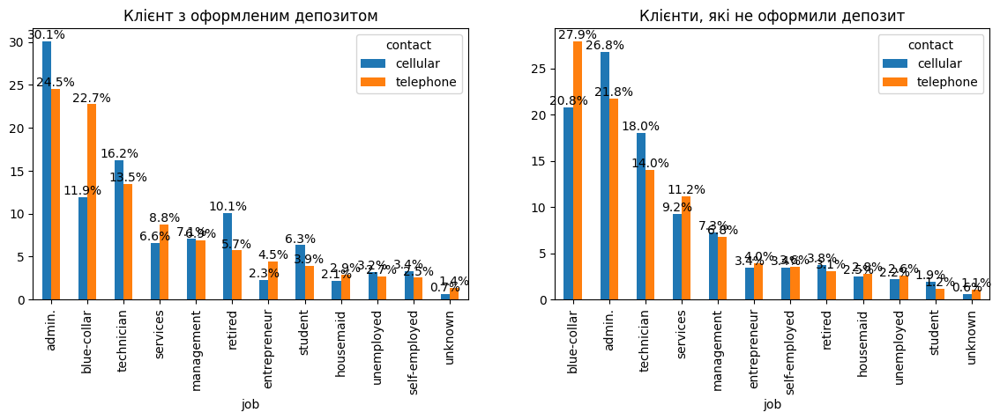

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ JOB


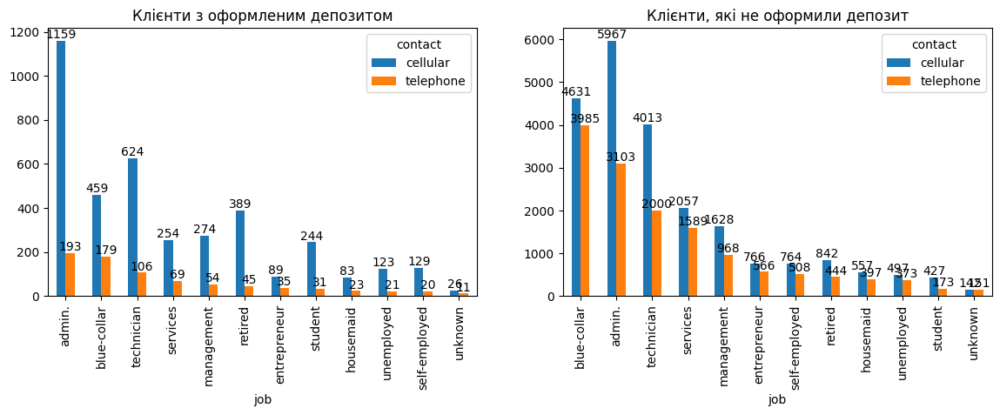

In [93]:
bi_countplot_target(df_no, df_yes, 'job', 'contact')

**Observations**
- Customers in the `admin.`, `technician`, `retired` and `student` categories mainly contact the bank via mobile.
- Customers in the `blue-collar`, `service` and `entrepreneur` categories are more likely to contact the bank via landline.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: JOB


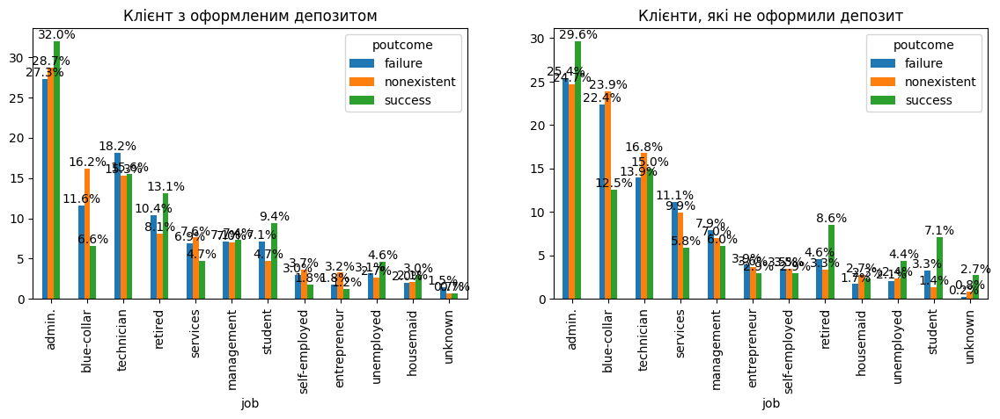

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ JOB


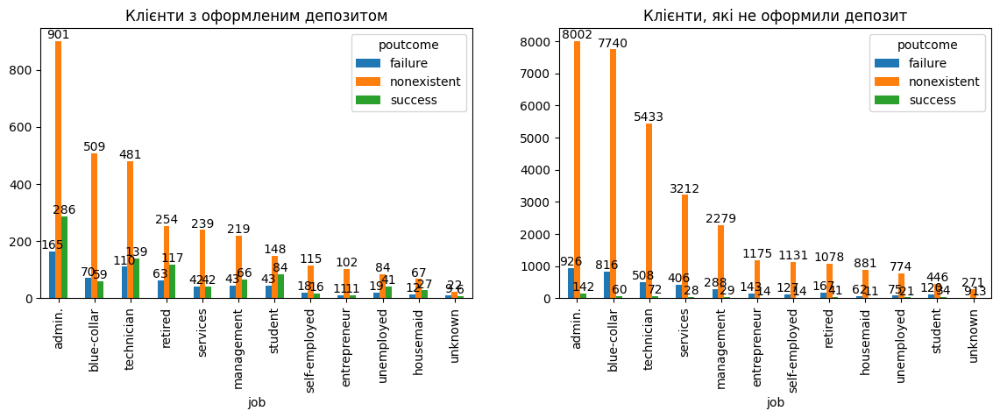

In [94]:
bi_countplot_target(df_no, df_yes, 'job', 'poutcome')

**Observations**
- `technician` customers who had a negative outcome from a previous campaign are more likely to make a deposit than those who did not.
- `service` customers generally do not make a deposit if they have no previous experience or had a negative experience from a previous campaign.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: MARITAL


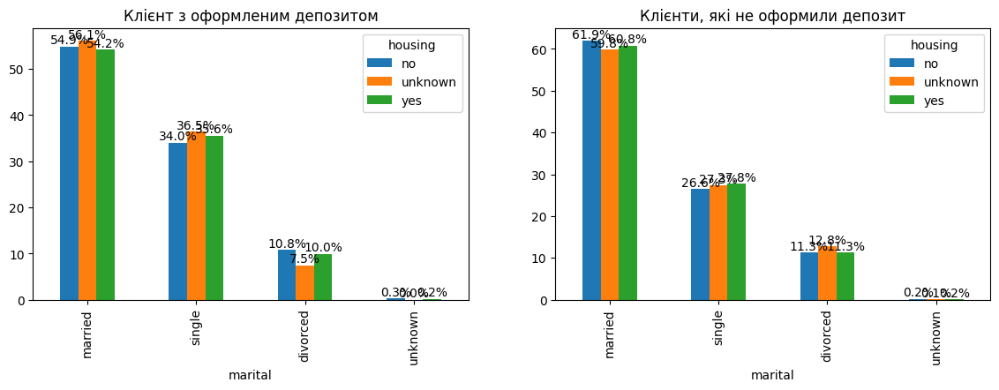

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ MARITAL


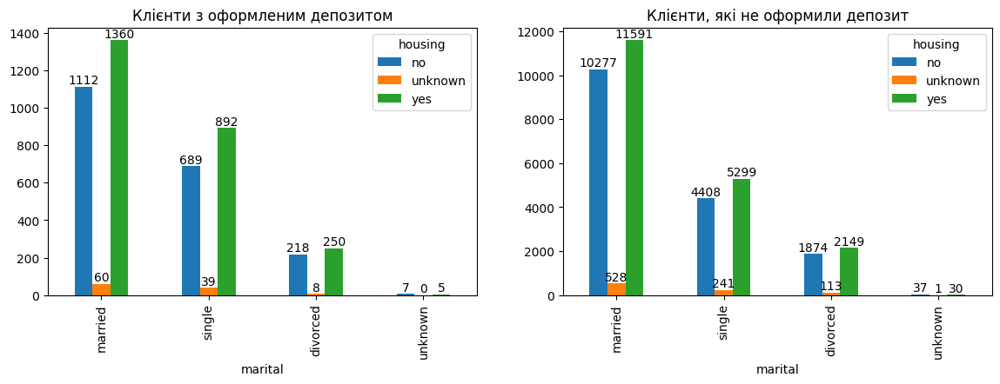

In [95]:
bi_countplot_target(df_no, df_yes, 'marital', 'housing')

**Observations**
- Married customers, whether they have a mortgage or not, tend not to open a deposit account, compared with those who do.
- Single customers, whether they have a mortgage or not, are more likely to open a deposit account than not to do so.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: MARITAL


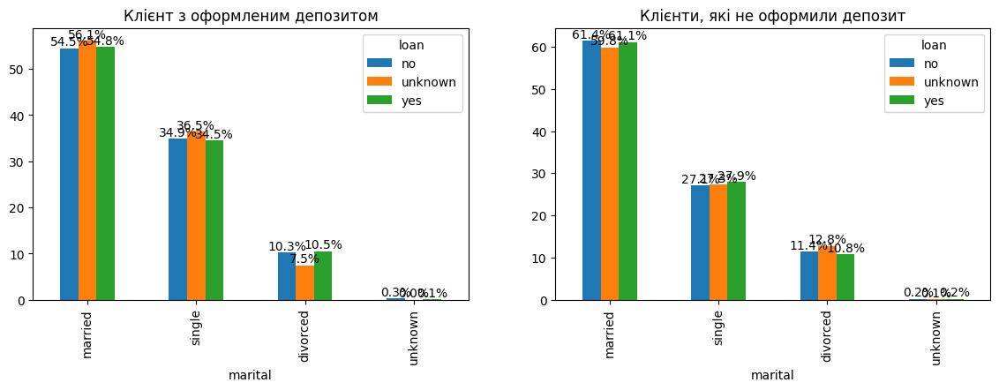

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ MARITAL


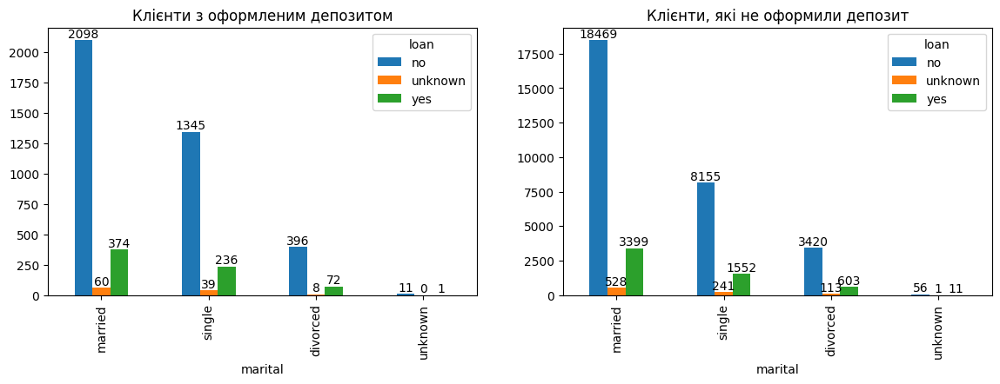

In [96]:
bi_countplot_target(df_no, df_yes, 'marital', 'loan')

**Observations**
- Married customers, whether or not they have a consumer loan, tend not to open a deposit account, compared with those who do.
- Single customers, whether or not they have a consumer loan, are more likely to open a deposit account than not to do so.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: MARITAL


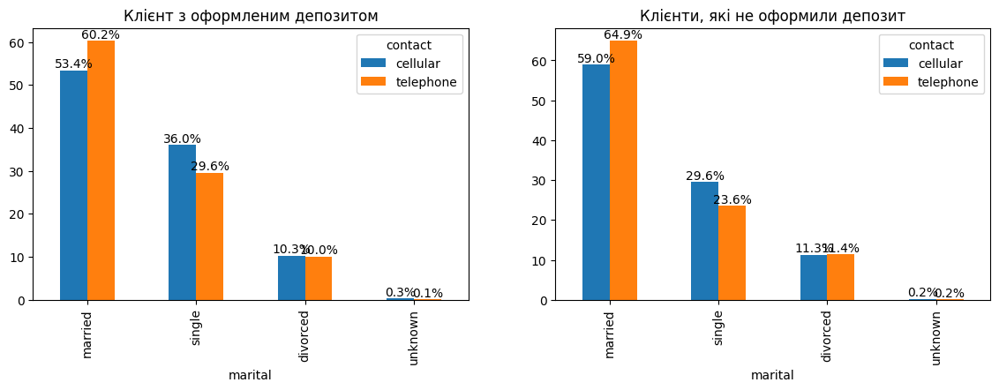

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ MARITAL


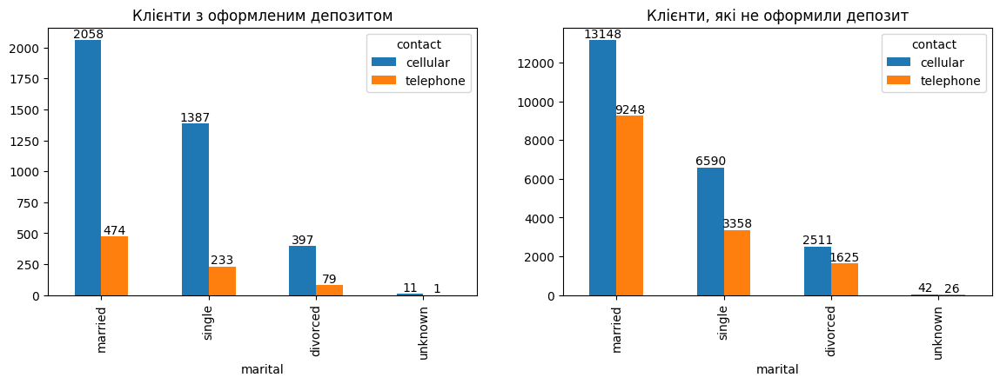

In [97]:
bi_countplot_target(df_no, df_yes, 'marital', 'contact')

**Observations**
- Married customers, regardless of how they communicate with the bank, are more likely not to open a deposit account than to do so.
- Single customers, regardless of how they communicate with the bank, are more likely to open a deposit account than not to do so.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: MARITAL


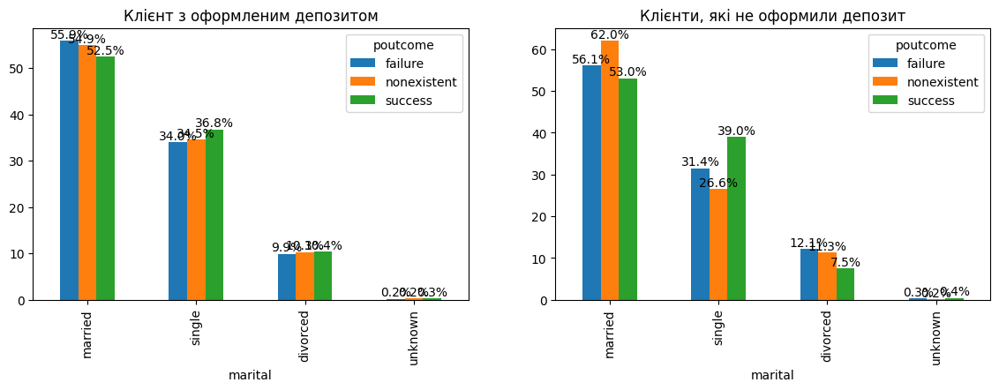

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ MARITAL


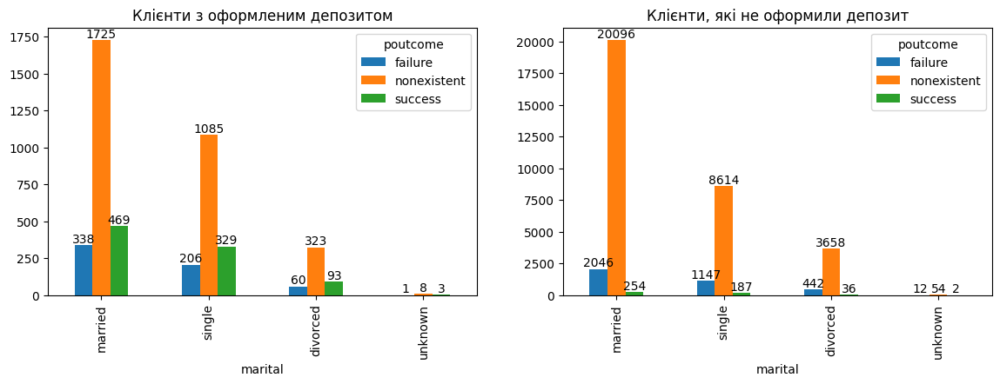

In [98]:
bi_countplot_target(df_no, df_yes, 'marital', 'poutcome')

**Observations**
- Married customers who have had no previous contact with the bank are less likely to open a deposit account than those who do.
- Single customers who have had no previous contact with the bank are more likely to open a deposit account than those who do not.
- Divorced customers who have had a positive previous experience with the bank are more likely to open a deposit account than those who do not. However, if they have had a negative experience, they generally do not open a fixed-term deposit account.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: EDUCATION


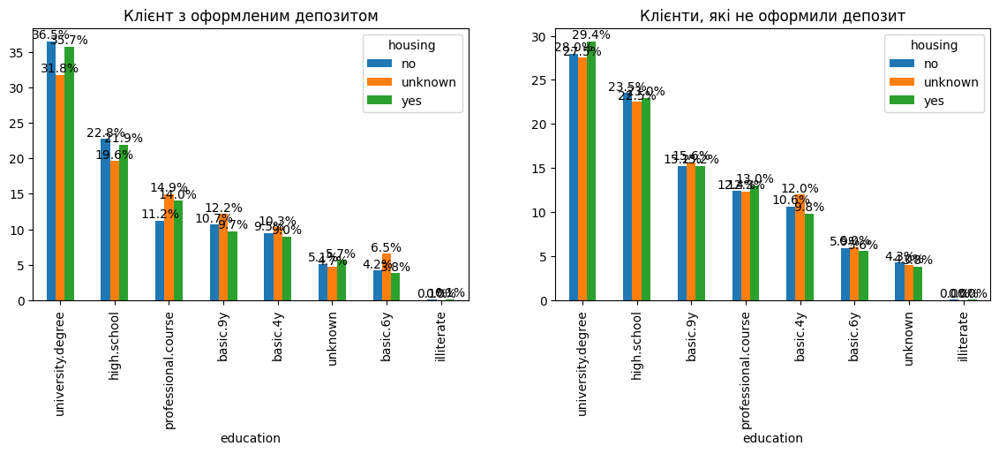

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ EDUCATION


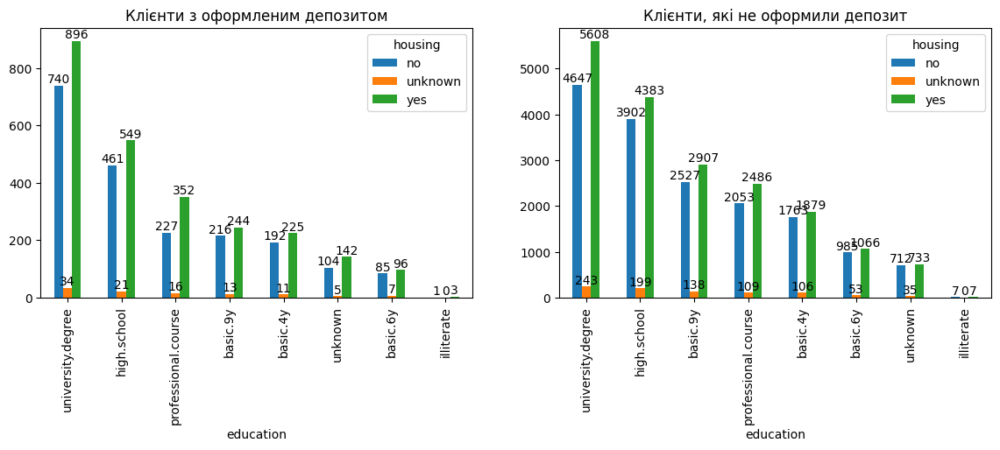

In [99]:
bi_countplot_target(df_no, df_yes, 'education', 'housing')

**Observations**
- Customers with a higher education qualification and no mortgage are more likely to open a fixed-term deposit account than those who do not.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: EDUCATION


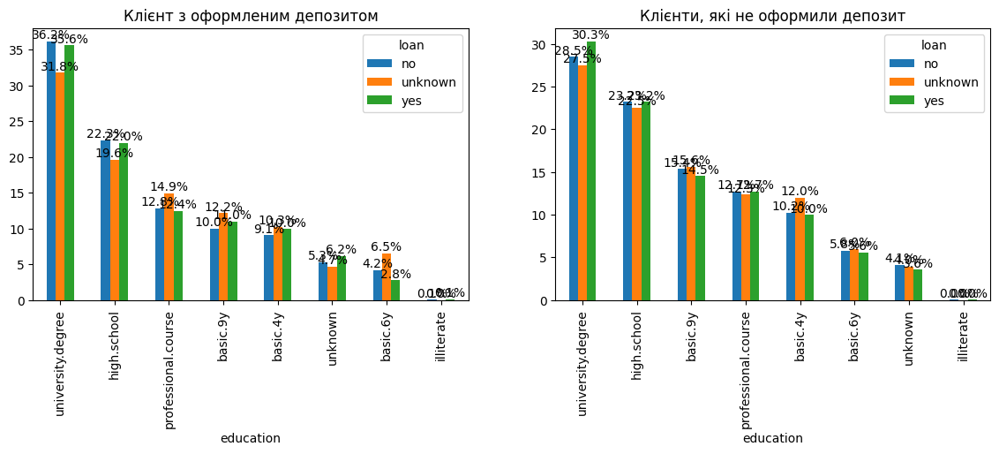

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ EDUCATION


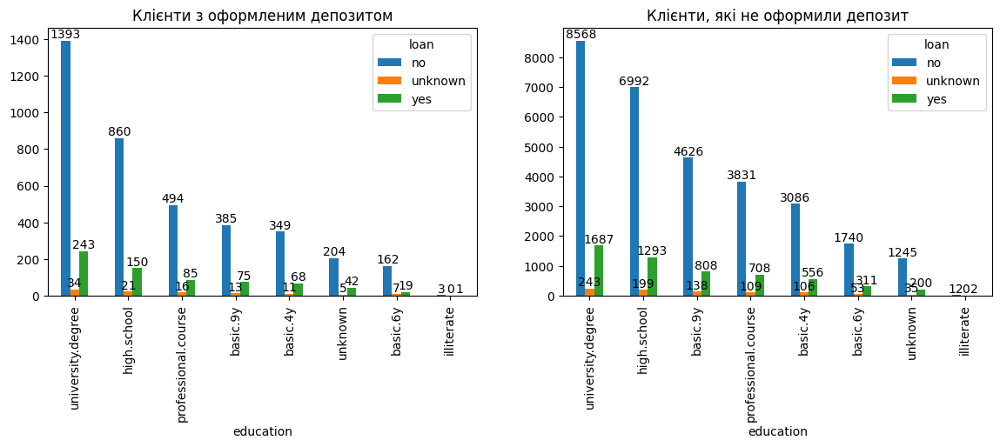

In [100]:
bi_countplot_target(df_no, df_yes, 'education', 'loan')

**Observations**
- Customers with a higher education qualification who do not have a consumer loan are more likely to open a deposit account than those who do not.
- Customers who have completed Year 9 and do not have a consumer loan are generally less likely to open a deposit account than those who do.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: EDUCATION


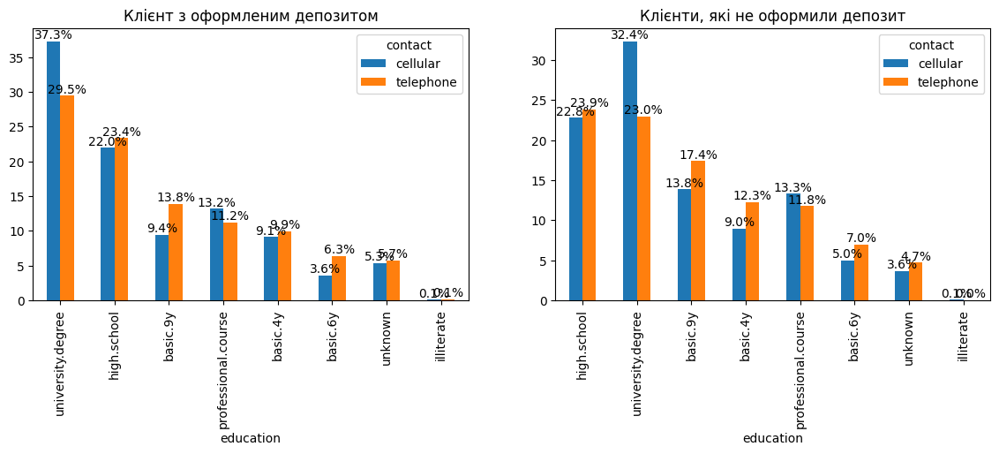

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ EDUCATION


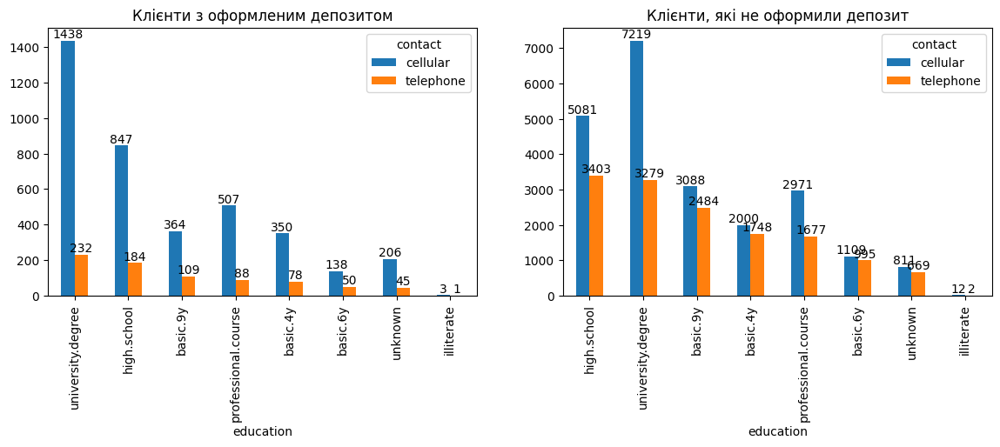

In [101]:
bi_countplot_target(df_no, df_yes, 'education', 'contact')

**Observations**
- Regardless of the method of contact, the majority of customers take out a loan, compared with those who do not.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: EDUCATION


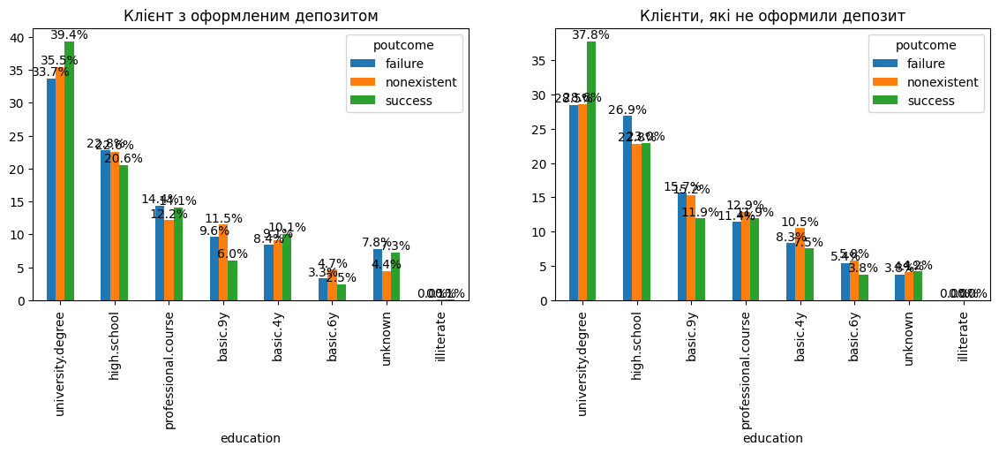

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ EDUCATION


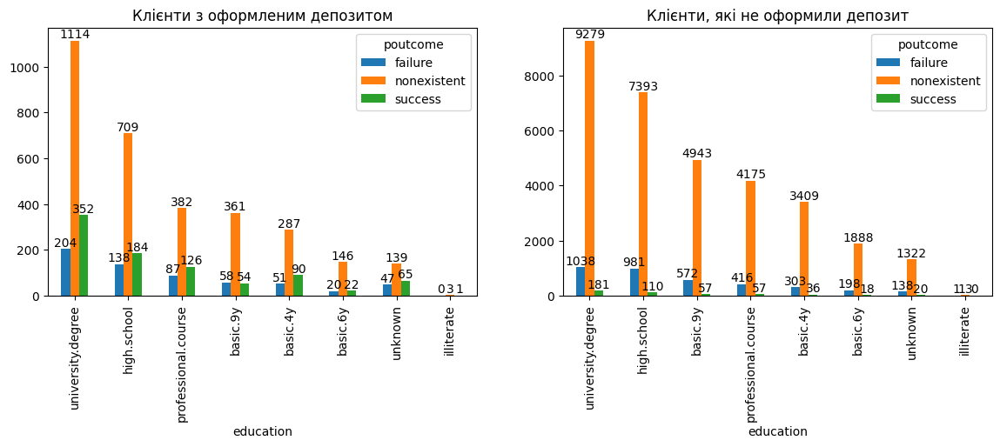

In [102]:
bi_countplot_target(df_no, df_yes, 'education', 'poutcome')

**Observations**
- Customers who have completed Year 6 and have had a positive previous experience with the bank are less likely to open a deposit account than those who do.
- Customers who have completed Year 4 and have had a positive previous experience with the bank are more likely to open a deposit account than those who have not.
- Customers who have completed Year 9 and had an unsuccessful previous interaction with the bank tend not to open a deposit account.
- Customers who have completed vocational courses and have had no previous interaction with the bank tend not to open a deposit account, rather than doing so.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: DAY_OF_WEEK


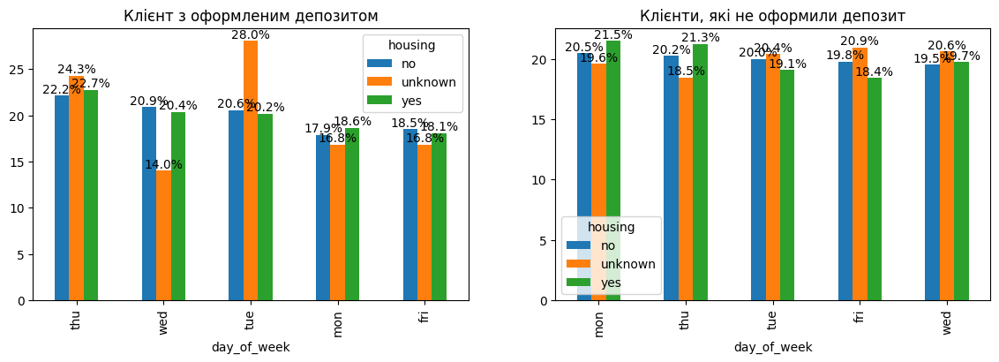

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ DAY_OF_WEEK


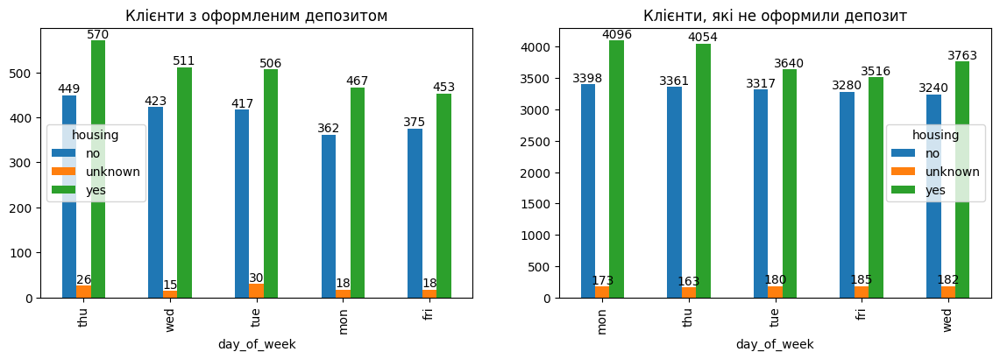

In [104]:
bi_countplot_target(df_no, df_yes, 'day_of_week', 'housing')

**Observations**
- Customers who had contact on Monday are generally less likely to make a deposit than those who did.
- Customers who had contact on Thursday are generally more likely to make a deposit than those who did not.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: DAY_OF_WEEK


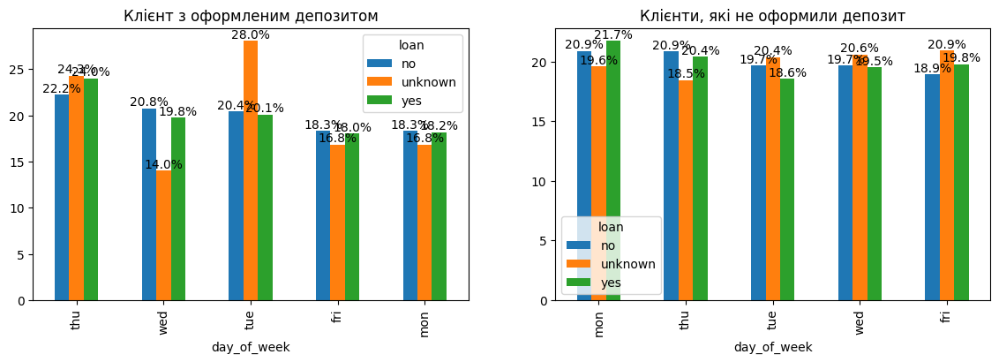

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ DAY_OF_WEEK


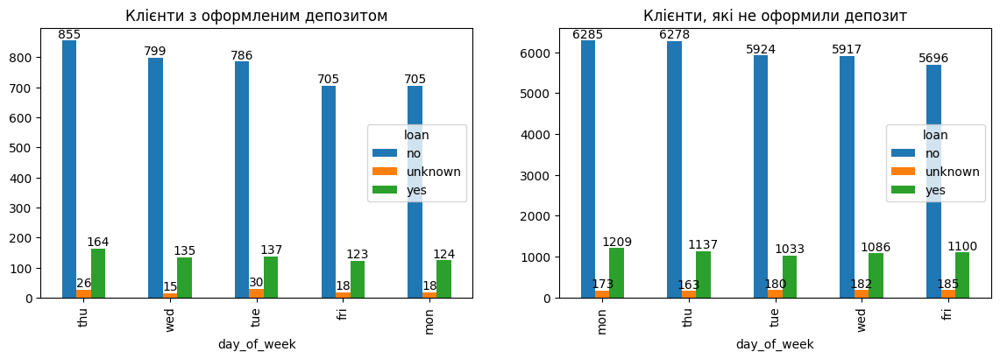

In [105]:
bi_countplot_target(df_no, df_yes, 'day_of_week', 'loan')

**Observations**
- Customers who had a previous contact on Monday and have a consumer loan do not, as a rule, open a deposit account.
- Customers who had a previous contact on Thursday and do not have a consumer loan are less likely to open a deposit account than those who do.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: DAY_OF_WEEK


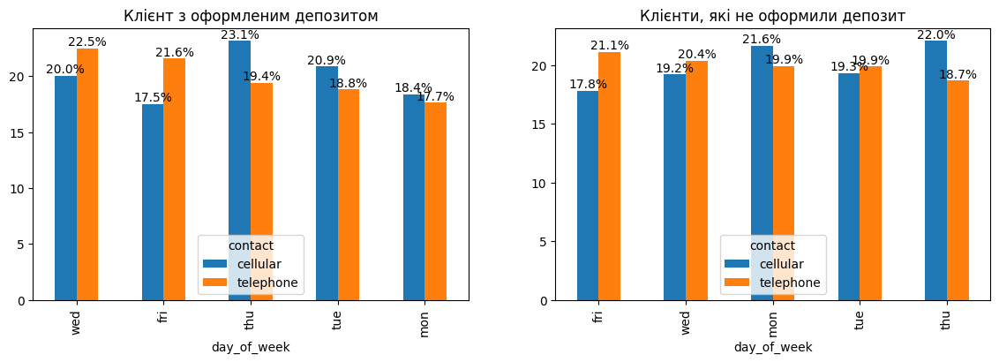

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ DAY_OF_WEEK


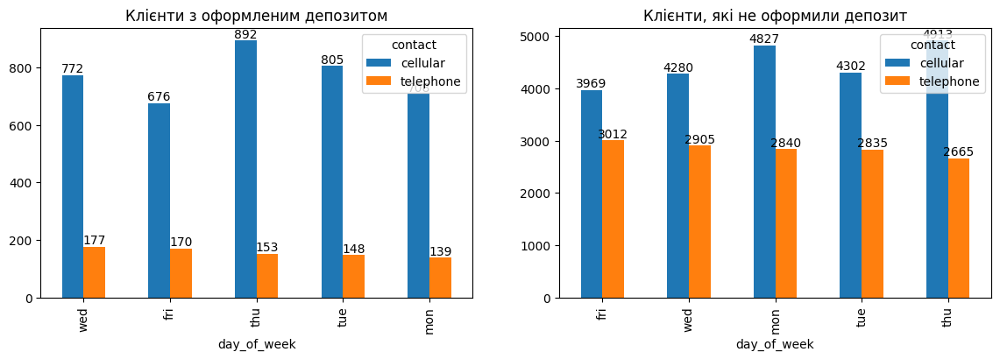

In [106]:
bi_countplot_target(df_no, df_yes, 'day_of_week', 'contact')

**Observations**
- Customers who had previous contact on Tuesday and whose contact method was via mobile tend to make a deposit more often than those who do not.

НОРМАЛІЗОВАНИЙ РОЗПОДІЛ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ: DAY_OF_WEEK


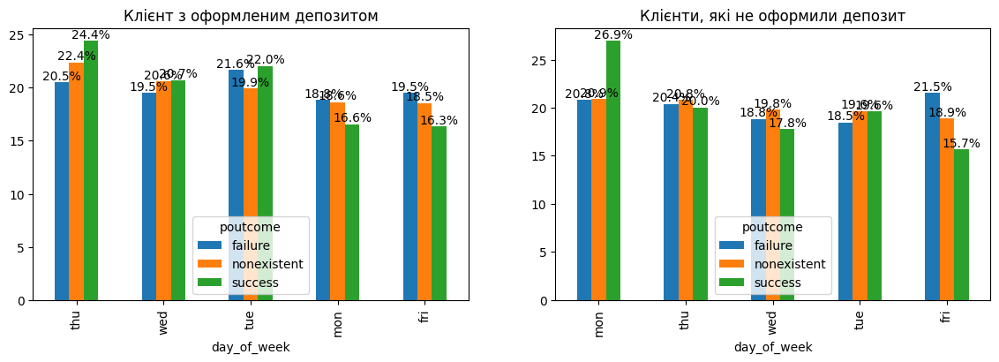

КІЛЬКІСТЬ ЗНАЧЕНЬ ЗА КАТЕГОРІЄЮ DAY_OF_WEEK


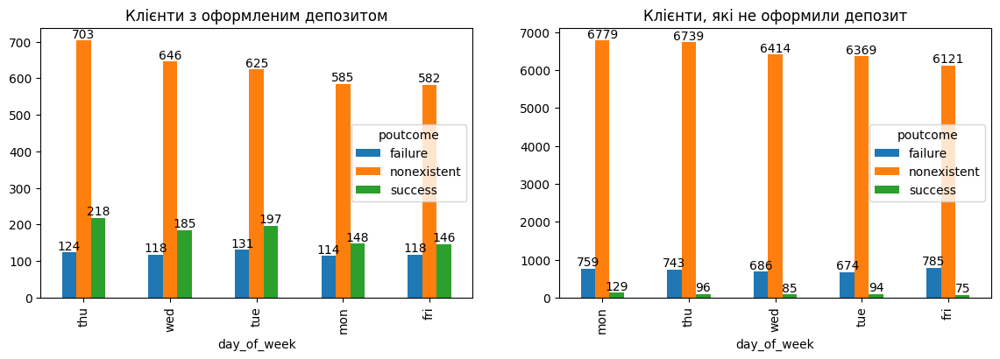

In [107]:
bi_countplot_target(df_no, df_yes, 'day_of_week', 'poutcome')

**Observations**
- Customers who had a previous contact on Monday, which was successful, are less likely to make a deposit than those who do.
- Customers who had a previous contact on Thursday, which was successful, are more likely to make a deposit than those who do not.

### Continuous and categorical variables

Викидів для аналізованих стовпців


,yes,no
age,78.5,69.5


Клієнт з оформленим депозитом


age                                           \
                           count       mean        std   min    25%   50%   
job           poutcome                                                      
admin.        failure      165.0  38.533333  11.107860  22.0  31.00  35.0   
              nonexistent  901.0  37.438402   9.413692  21.0  30.00  35.0   
              success      286.0  39.314685  11.214602  22.0  30.25  35.0   
blue-collar   failure       70.0  38.314286   9.366209  23.0  31.00  36.0   
              nonexistent  509.0  38.986248   9.253740  21.0  32.00  38.0   
              success       59.0  42.101695  11.419425  24.0  32.00  40.0   
entrepreneur  failure       11.0  43.272727  11.975733  26.0  32.50  44.0   
              nonexistent  102.0  41.539216   9.743921  24.0  34.25  41.0   
              success       11.0  44.272727   6.373240  38.0  38.50  43.0   
housemaid     failure       12.0  59.166667  12.096832  38.0  52.75  56.5   
              nonexistent   67.0  48.776119  13.012606  27.0  39.00  47.0   
              success       27.0  59.370370  15.387678  37.0  48.50  59.0   
management    failure       43.0  45.511628  10.979141  24.0  36.00  44.0   
              nonexistent  219.0  41.570776  10.510295  23.0  33.50  39.0   
              success       66.0  45.030303  11.479707  27.0  36.00  42.5   
retired       failure       63.0  69.142857   7.910502  55.0  62.50  68.0   
              nonexistent  254.0  67.074803  10.507588  33.0  59.00  66.0   
              success      117.0  70.333333   9.680232  52.0  62.00  70.0   
self-employed failure       18.0  35.777778   6.412814  25.0  31.00  35.0   
              nonexistent  115.0  37.895652   9.661257  21.0  30.00  36.0   
              success       16.0  41.312500   9.665876  26.0  35.00  39.5   
services      failure       42.0  37.023810   9.552137  22.0  29.00  37.0   
              nonexistent  239.0  36.158996   8.664609  21.0  30.00  33.0   
              success       42.0  34.666667   8.604215  22.0  28.00  33.0   
student       failure       43.0  24.279070   4.542527  17.0  20.50  24.0   
              nonexistent  148.0  25.189189   5.145966  18.0  21.00  25.0   
              success       84.0  24.380952   4.262204  17.0  21.00  24.0   
technician    failure      110.0  39.027273  10.307616  22.0  31.00  36.5   
              nonexistent  481.0  37.569647   8.944961  20.0  31.00  35.0   
              success      139.0  37.345324   9.552079  22.0  30.00  35.0   
unemployed    failure       19.0  38.473684   9.979804  24.0  32.50  36.0   
              nonexistent   84.0  38.642857  10.843512  21.0  30.00  36.0   
              success       41.0  40.195122  10.766196  23.0  31.00  38.0   
unknown       failure        9.0  58.444444  20.773247  24.0  42.00  58.0   
              nonexistent   22.0  41.681818  15.185790  24.0  28.75  39.0   
              success        6.0  49.666667  19.158984  24.0  34.25  57.5   

                                        
                             75%   max  
job           poutcome                  
admin.        failure      46.00  70.0  
              nonexistent  44.00  67.0  
              success      48.00  72.0  
blue-collar   failure      44.75  60.0  
              nonexistent  46.00  61.0  
              success      50.50  70.0  
entrepreneur  failure      52.00  62.0  
              nonexistent  48.00  69.0  
              success      49.00  56.0  
housemaid     failure      63.00  85.0  
              nonexistent  56.50  82.0  
              success      67.00  85.0  
management    failure      52.50  71.0  
              nonexistent  50.00  80.0  
              success      53.00  77.0  
retired       failure      75.00  92.0  
              nonexistent  74.00  98.0  
              success      77.00  98.0  
self-employed failure      41.75  46.0  
              nonexistent  44.00  60.0  
              success      45.50  60.0  
services      failure      43.75  59.0  


Клієнт, які не оформили депозит


age                                           \
                            count       mean        std   min    25%   50%   
job           poutcome                                                       
admin.        failure       926.0  37.703024   8.750804  22.0  31.00  35.0   
              nonexistent  8002.0  38.290302   8.699719  20.0  31.00  36.0   
              success       142.0  37.619718   9.717085  21.0  30.00  35.0   
blue-collar   failure       816.0  38.533088   8.140869  23.0  33.00  37.0   
              nonexistent  7740.0  39.691731   8.827945  20.0  33.00  39.0   
              success        60.0  39.700000   9.312467  24.0  33.75  38.0   
entrepreneur  failure       143.0  41.153846   8.782431  26.0  34.50  38.0   
              nonexistent  1175.0  41.703830   8.825631  20.0  35.00  41.0   
              success        14.0  47.285714   9.293741  31.0  38.75  48.5   
housemaid     failure        62.0  46.645161  12.222120  26.0  36.00  44.0   
              nonexistent   881.0  44.490352   9.753331  21.0  37.00  45.0   
              success        11.0  51.000000  14.449913  34.0  35.50  58.0   
management    failure       288.0  42.479167   9.309969  24.0  35.00  41.0   
              nonexistent  2279.0  42.304081   9.036757  21.0  35.00  42.0   
              success        29.0  41.068966  10.872413  26.0  34.00  37.0   
retired       failure       167.0  65.473054  10.797598  30.0  58.00  66.0   
              nonexistent  1078.0  58.759740   9.154141  23.0  55.00  58.0   
              success        41.0  68.000000  10.370632  51.0  58.00  68.0   
self-employed failure       127.0  39.976378   9.835524  25.0  32.00  38.0   
              nonexistent  1131.0  40.195402   9.309136  21.0  33.00  39.0   
              success        14.0  40.500000  13.340223  26.0  30.50  35.5   
services      failure       406.0  37.413793   8.630478  21.0  31.00  35.0   
              nonexistent  3212.0  38.179328   9.060726  20.0  31.00  37.0   
              success        28.0  37.678571  10.154560  20.0  29.75  36.5   
student       failure       120.0  25.141667   4.331429  17.0  22.00  24.5   
              nonexistent   446.0  26.901345   5.084380  18.0  24.00  26.0   
              success        34.0  24.205882   4.847864  17.0  21.00  24.0   
technician    failure       508.0  38.208661   8.888958  20.0  32.00  36.0   
              nonexistent  5433.0  38.666667   8.529483  20.0  32.00  37.0   
              success        72.0  36.333333   9.744627  23.0  29.00  34.0   
unemployed    failure        75.0  41.693333   9.657616  26.0  34.00  39.0   
              nonexistent   774.0  39.749354   8.922360  21.0  33.00  39.0   
              success        21.0  36.761905   9.364319  25.0  28.00  37.0   
unknown       failure         9.0  44.111111  15.185885  24.0  32.00  45.0   
              nonexistent   271.0  45.313653   9.419118  26.0  38.00  45.0   
              success        13.0  47.538462  15.898718  24.0  31.00  53.0   

                                        
                             75%   max  
job           poutcome                  
admin.        failure      44.00  71.0  
              nonexistent  44.00  72.0  
              success      45.00  70.0  
blue-collar   failure      44.00  80.0  
              nonexistent  46.00  71.0  
              success      45.25  62.0  
entrepreneur  failure      49.00  69.0  
              nonexistent  49.00  69.0  
              success      55.50  62.0  
housemaid     failure      54.75  83.0  
              nonexistent  52.00  85.0  
              success      60.00  75.0  
management    failure      50.00  77.0  
              nonexistent  50.00  76.0  
              success      49.00  66.0  
retired       failure      73.00  94.0  
              nonexistent  60.00  95.0  
              success      74.00  92.0  
self-employed failure      46.00  67.0  
              nonexistent  47.00  65.0  
              success      50.25  71.0  
ser

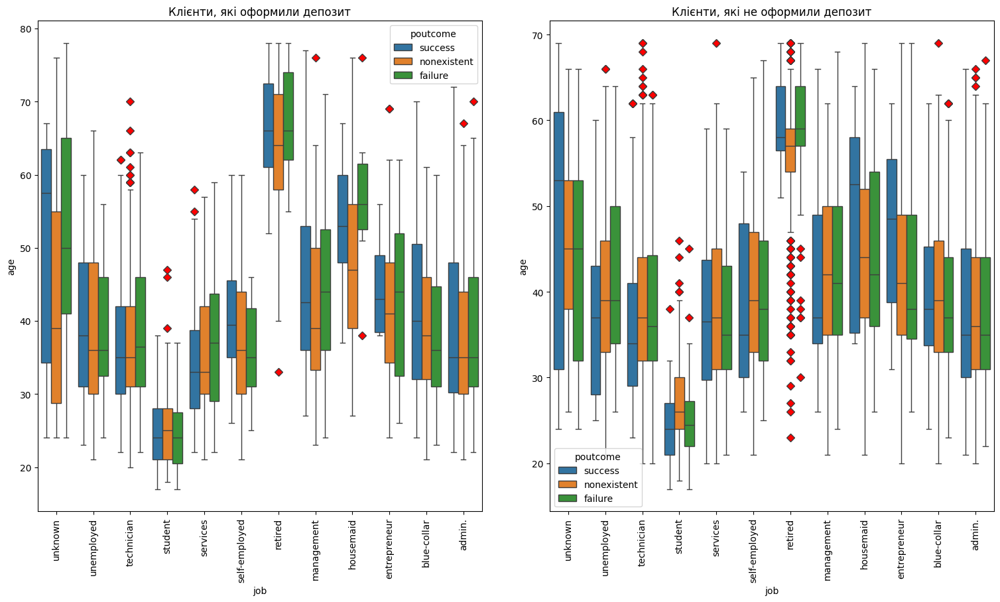

In [110]:
numeric_vs_categorical_corr(raw_df, ['age', 'job', 'poutcome'])

**Observations**
- Customers in the `retired` category who have opened a deposit account have a wider age range compared to those who have not opened a deposit account.
- Students who have had no previous contact with the bank and have not opened a deposit account tend to be slightly older than those who have opened a deposit account.
- Customers in the `housemaid` category who have taken out a deposit and had previous contact with the bank have a narrower age range, whilst the minimum age is higher compared to those who have not taken out a loan.
- Overall, the remaining customer categories who have taken out a deposit have a significantly narrower age range compared to those who have not taken out a deposit.

## Conclusions from the analysis

**Customer category requiring further analysis**
- Customers aged 69.5 or over
- Customers whose call duration with a manager is 10.74 minutes or more, particularly those exceeding 36.26 minutes
- Customers who have had more than 6 contacts during the campaign
- Customers for whom more than 12 days have elapsed since the previous campaign
- Non-responding customers
- Customers in the ‘technician’ profession who had an unsuccessful previous contact



**General and macroeconomic indicators requiring further analysis**
- Analyse a multi-year data sample to determine whether there is any seasonality, as the highest number of clients is observed between May and August, whilst there are none in January and February. Alternatively, provide additional information on the presence or absence of marketing activity up to March.
- The 3-month Euribor rate is below 4.857, particularly within the range of 0 to 2
- The number of people in employment is less than 5,099.1



**According to the correlation analysis, the top 10 factors that may have a linear impact on the target variable are indicators characterising the country’s socio-economic situation**
- number of people in employment
- rate of change in employment
- consumer price index
- 3-month Euribor rate



**Categories of customers for whom the possibility of opening a fixed-term deposit requires further analysis**
- Customers aged under 28 and over 59
- Customers whose conversation with a manager lasted longer than 500 seconds
- Customers who have had previous contact with the bank
- Customers with up to and including 4 contacts in the current campaign
- Customers with the occupations `admin.`, `retired` and `student`
- Single customers, particularly those with no previous contact with the bank
- Divorced customers with a successful previous contact with the bank
- Customers with a higher education qualification
- Customers who have completed Year 4 of school and have had a successful previous contact with the bank
- Customers whose contact with the bank took place via `cellular`




**General and macroeconomic factors, where the possibility of opening a fixed-term deposit requires more in-depth analysis**
- Rate of change in employment less than -0.4
- Consumer Price Index below 92.8 or above 94.6
- Confidence index within the ranges (-47 to -46), (-44 to -41), (-37 to -35)
- 3-month Euribor rate within the range of 0 to 2
- Number of people in employment is less than 5,090
- Clients who had a previous successful contact on Thursday

# Data preparation for experiment group No1

## Checking for duplicates

In [373]:
print("Кількість дублікатів:", raw_df.duplicated().sum())

Кількість дублікатів: 12


**Checking for duplicates across all columns, including the target**

In [374]:
dupes = raw_df[raw_df.duplicated(keep=False)]
dupes

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1265,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12260,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14155,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16819,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18464,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no


**Checking for duplicates based on all criteria, without a target**

In [375]:
feature_cols = [c for c in raw_df.columns if c != 'y']
dupes_features = raw_df[raw_df.duplicated(subset=feature_cols, keep=False)]
dupes_features

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1265,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12260,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14155,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16819,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18464,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no


**Checking for target value conflicts in duplicate rows**

In [376]:
conflict_dupes = dupes_features.groupby(feature_cols)['y'].nunique()
conflict_dupes = conflict_dupes[conflict_dupes > 1]
conflict_dupes

Series([], Name: y, dtype: int64)

**Observations**
- There are 12 pairs of duplicate rows. All pairs have both the same attributes and the same target values. Consequently, the duplicate rows must be removed before the data is fed into the model.

In [377]:
raw_df_dedup = raw_df.drop_duplicates().reset_index(drop = True)

In [378]:
print("Кількість рядків після видалення дублікатів:", len(raw_df_dedup))
print("Кількість дублікатів після видалення:", raw_df_dedup.duplicated().sum())

Кількість рядків після видалення дублікатів: 41176
Кількість дублікатів після видалення: 0


## Dividing data into samples

In [379]:
month_order = {
    'jan': 1, 'feb': 2, 'mar': 3, 'apr': 4, 'may': 5,
    'jun': 6, 'jul': 7, 'aug': 8, 'sep': 9, 'oct': 10,
    'nov': 11, 'dec': 12
}


raw_df_dedup['month_num'] = raw_df_dedup['month'].map(month_order)
raw_df_dedup = raw_df_dedup.sort_values('month_num').reset_index(drop = True)

train_raw_df = raw_df_dedup[raw_df_dedup['month_num'] <= 10]
test_df = raw_df_dedup[raw_df_dedup['month_num'] > 10]


tscv = TimeSeriesSplit(n_splits = 3)

for train_idx, valid_idx in tscv.split(train_raw_df):
    train_df = train_raw_df.iloc[train_idx]
    valid_df = train_raw_df.iloc[valid_idx]


print("Розмір навчальної вибірки:", train_df.shape)
print("Розмір валідаційної вибірки:", valid_df.shape)
print("Розмір тестової вибірки:", test_df.shape)

Розмір навчальної вибірки: (27671, 22)
Розмір валідаційної вибірки: (9223, 22)
Розмір тестової вибірки: (4282, 22)


In [ ]:
target_col = 'y'
input_cols = raw_df_dedup.drop(columns = ['y', 'y_code', 'duration', 'duration_min']).columns

,train,validation,test
y,,,
no,89.84%,85.64%,88.21%
yes,10.16%,14.36%,11.79%


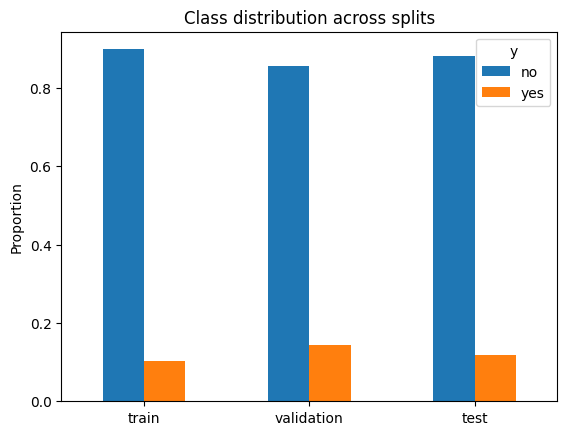

In [ ]:
dist_df = pd.concat([
    get_distribution(train_df, 'y', 'train'),
    get_distribution(valid_df, 'y', 'validation'),
    get_distribution(test_df, 'y', 'test')
], axis = 1)

display(dist_df.style.format("{:.2%}"))

dist_df.T.plot(kind = 'bar')
plt.title('Class distribution across splits')
plt.ylabel('Proportion')
plt.xticks(rotation = 0)
plt.show()


## Processing of absences

**Observations**
- During the exploratory data analysis, ‘Unknown’ values were identified, which indicate missing data. We will replace these values with the most frequent value.

In [ ]:
cat_cols_with_unknown = [
    col for col in train_df.select_dtypes(include=[object, "string"]).columns
    if 'unknown' in train_df[col].values
]

print("Категоріальні колонки з 'unknown':")
print(cat_cols_with_unknown)

Категоріальні колонки з 'unknown':
['job', 'marital', 'education', 'default', 'housing', 'loan']


In [ ]:
train_df, valid_df, test_df = fill_unknown_with_mode(train_df, valid_df, test_df, cat_cols_with_unknown)

In [ ]:
print("Перевірка заповнення 'unknown' після імпутації:\n")

for col in cat_cols_with_unknown:
    unique_vals = train_df[col].unique()
    print(f"{col} ({len(unique_vals)} унікальних): {unique_vals}\n")

Перевірка заповнення 'unknown' після імпутації:

job (11 унікальних): <ArrowStringArray>
[  'blue-collar',        'admin.',    'management',    'technician',
       'student',    'unemployed',       'retired',     'housemaid',
      'services', 'self-employed',  'entrepreneur']
Length: 11, dtype: str

marital (3 унікальних): <ArrowStringArray>
['married', 'divorced', 'single']
Length: 3, dtype: str

education (7 унікальних): <ArrowStringArray>
[           'basic.9y',         'high.school', 'professional.course',
            'basic.4y',   'university.degree',            'basic.6y',
          'illiterate']
Length: 7, dtype: str

default (1 унікальних): <ArrowStringArray>
['no']
Length: 1, dtype: str

housing (2 унікальних): <ArrowStringArray>
['yes', 'no']
Length: 2, dtype: str

loan (2 унікальних): <ArrowStringArray>
['no', 'yes']
Length: 2, dtype: str



## Encoding categorical columns

In [ ]:
train_targets = train_df[target_col].copy()
val_targets = valid_df[target_col].copy()
test_targets = test_df[target_col].copy()

train_inputs = train_df[input_cols].copy()
val_inputs = valid_df[input_cols].copy()
test_inputs = test_df[input_cols].copy()

In [ ]:
numeric_cols = train_inputs.drop(columns = 'month_num').select_dtypes("number").columns
categorical_cols = train_inputs.select_dtypes(exclude="number").columns

print("Числові ознаки:", numeric_cols)
print("Категоріальні ознаки (рядки):", categorical_cols)

Числові ознаки: Index(['age', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='str')
Категоріальні ознаки (рядки): Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome'],
      dtype='str')


In [ ]:
for col in categorical_cols:
    unique_vals = train_df[col].unique()
    print(f"{col} ({len(unique_vals)} унікальних): {unique_vals}\n")

job (11 унікальних): <ArrowStringArray>
[  'blue-collar',        'admin.',    'management',    'technician',
       'student',    'unemployed',       'retired',     'housemaid',
      'services', 'self-employed',  'entrepreneur']
Length: 11, dtype: str

marital (3 унікальних): <ArrowStringArray>
['married', 'divorced', 'single']
Length: 3, dtype: str

education (7 унікальних): <ArrowStringArray>
[           'basic.9y',         'high.school', 'professional.course',
            'basic.4y',   'university.degree',            'basic.6y',
          'illiterate']
Length: 7, dtype: str

default (1 унікальних): <ArrowStringArray>
['no']
Length: 1, dtype: str

housing (2 унікальних): <ArrowStringArray>
['yes', 'no']
Length: 2, dtype: str

loan (2 унікальних): <ArrowStringArray>
['no', 'yes']
Length: 2, dtype: str

contact (2 унікальних): <ArrowStringArray>
['cellular', 'telephone']
Length: 2, dtype: str

month (5 унікальних): <ArrowStringArray>
['mar', 'apr', 'may', 'jun', 'jul']
Length: 5, dtyp

### Binary encoding for columns with values of ‘yes’ or ‘no’

- Encoding attributes that have two or three values

In [ ]:
map_codes = {'yes': 1, 'no': 0}
map_cols = ['default', 'housing', 'loan']

train_inputs, val_inputs, test_inputs = encode_columns_safe(train_inputs, val_inputs, test_inputs, map_cols, map_codes)

In [ ]:
cols_to_show = []
for col in map_cols:
    cols_to_show.append(col)
    cols_to_show.append(col + '_code')

train_inputs[cols_to_show]

,default,default_code,housing,housing_code,loan,loan_code
0,no,0,yes,1,no,0
1,no,0,yes,1,no,0
2,no,0,yes,1,no,0
3,no,0,yes,1,no,0
4,no,0,yes,1,yes,1
...,...,...,...,...,...,...
27666,no,0,yes,1,no,0
27667,no,0,no,0,no,0
27668,no,0,no,0,no,0
27669,no,0,yes,1,no,0


In [ ]:
contact_map_codes = {'cellular': 1, 'telephone': 0}
contact_map_cols = ['contact']

train_inputs, val_inputs, test_inputs = encode_columns_safe(train_inputs, val_inputs, test_inputs, contact_map_cols, contact_map_codes)

In [ ]:
cols_to_show = []
for col in contact_map_cols:
    cols_to_show.append(col)
    cols_to_show.append(col + '_code')

train_inputs[cols_to_show]

,contact,contact_code
0,cellular,1
1,cellular,1
2,cellular,1
3,cellular,1
4,cellular,1
...,...,...
27666,cellular,1
27667,cellular,1
27668,telephone,0
27669,cellular,1


In [ ]:
poutcome_map_codes = {'nonexistent': 0, 'failure': -1, 'success': 1}
poutcome_map_cols = ['poutcome']

train_inputs, val_inputs, test_inputs = encode_columns_safe(train_inputs, val_inputs, test_inputs, poutcome_map_cols, poutcome_map_codes)

In [ ]:
cols_to_show = []
for col in poutcome_map_cols:
    cols_to_show.append(col)
    cols_to_show.append(col + '_code')

train_inputs[cols_to_show]

,poutcome,poutcome_code
0,nonexistent,0
1,nonexistent,0
2,failure,-1
3,nonexistent,0
4,nonexistent,0
...,...,...
27666,nonexistent,0
27667,nonexistent,0
27668,nonexistent,0
27669,nonexistent,0


In [ ]:
train_targets = train_targets.map(map_codes)
val_targets = val_targets.map(map_codes)
test_targets = test_targets.map(map_codes)

In [ ]:
train_targets.unique()

array([0, 1])

### Ordinal Encoding for attributes with a natural order

- Encoding attributes that have a natural order

In [ ]:
ordinal_cols = ['day_of_week', 'education']

ordinal_enc = OrdinalEncoder(
    categories = [['mon','tue','wed','thu','fri','sat','sun'],
                  ['illiterate', 'basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'professional.course', 'university.degree']],
                  dtype = int
)

ordinal_enc.fit(train_inputs[ordinal_cols])

train_encoded = ordinal_enc.transform(train_inputs[ordinal_cols]).astype(int)
val_encoded   = ordinal_enc.transform(val_inputs[ordinal_cols]).astype(int)
test_encoded  = ordinal_enc.transform(test_inputs[ordinal_cols]).astype(int)

for i, col in enumerate(ordinal_cols):
    train_inputs[col + '_code'] = train_encoded[:, i]
    val_inputs[col + '_code']   = val_encoded[:, i]
    test_inputs[col + '_code']  = test_encoded[:, i]

In [ ]:
cols_to_show = []
for col in ordinal_cols:
    cols_to_show.append(col)
    cols_to_show.append(col + '_code')

train_inputs[cols_to_show]

,day_of_week,day_of_week_code,education,education_code
0,tue,1,basic.9y,3
1,tue,1,basic.9y,3
2,tue,1,high.school,4
3,tue,1,high.school,4
4,tue,1,high.school,4
...,...,...,...,...
27666,thu,3,basic.9y,3
27667,thu,3,university.degree,6
27668,thu,3,high.school,4
27669,thu,3,high.school,4


### One-hot encoding for features with multiple categories in no particular order

- Coding of traits with more than three characteristics and no natural order

In [ ]:
onehot_cols = ['job', 'marital']

onehot_enc = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
onehot_enc.fit(train_inputs[onehot_cols])

onehot_encoder_cols = list(onehot_enc.get_feature_names_out(onehot_cols))

train_inputs[onehot_encoder_cols] = onehot_enc.transform(train_inputs[onehot_cols])
val_inputs[onehot_encoder_cols] = onehot_enc.transform(val_inputs[onehot_cols])
test_inputs[onehot_encoder_cols] = onehot_enc.transform(test_inputs[onehot_cols])

In [ ]:
train_inputs[onehot_cols + onehot_encoder_cols].head()

,job,marital,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_divorced,marital_married,marital_single
0,blue-collar,married,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,blue-collar,married,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,admin.,married,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,admin.,married,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,admin.,married,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
train_inputs.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous',
       'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed', 'month_num', 'default_code', 'housing_code',
       'loan_code', 'contact_code', 'poutcome_code', 'day_of_week_code',
       'education_code', 'job_admin.', 'job_blue-collar', 'job_entrepreneur',
       'job_housemaid', 'job_management', 'job_retired', 'job_self-employed',
       'job_services', 'job_student', 'job_technician', 'job_unemployed',
       'marital_divorced', 'marital_married', 'marital_single'],
      dtype='str')

In [ ]:
cols_to_drop = map_cols + contact_map_cols + poutcome_map_cols + ordinal_cols + onehot_cols + ['month']

train_inputs = train_inputs.drop(columns = cols_to_drop).copy()
val_inputs = val_inputs.drop(columns = cols_to_drop).copy()
test_inputs = test_inputs.drop(columns = cols_to_drop).copy()

## Scaling numerical features

The StandardScaler method was chosen for feature scaling, as it handles outliers well; in this case, these may be rare, whilst still representing real values in this dataset. We do not use MinMaxScaler in this study, as it is quite sensitive to outliers; however, in the current study, we do not identify a separate dataset without outliers.

Alternatively, the RobustScaler could have been tested as a scaling option, as it is more resistant to outliers. However, as the range of numerical features varies considerably, this could affect the results; therefore, the StandardScaler was chosen.

In [ ]:
stand_scaler = StandardScaler()
stand_scaler.fit(train_inputs[numeric_cols])

train_inputs[numeric_cols] = stand_scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = stand_scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = stand_scaler.transform(test_inputs[numeric_cols])

train_inputs[numeric_cols].describe().round(2)

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00
mean,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-2.11,-0.57,-6.14,-0.34,-1.91,-2.12,-2.02,-1.62,-2.62
25%,-0.71,-0.57,0.16,-0.34,-1.20,-1.26,-1.10,-1.22,-0.98
50%,-0.21,-0.21,0.16,-0.34,0.67,0.40,-0.03,0.76,0.42
75%,0.69,0.15,0.16,-0.34,0.87,0.53,1.29,0.82,0.99
max,5.60,19.32,0.16,11.12,0.87,1.34,1.97,0.82,0.99


## Class balancing

During the research analysis, a class imbalance was identified. As there is far less data for the target class, it was decided not to simply perform undersampling, so as not to lose useful training data. To improve model training on the training set, it was decided to apply three methods to balance the classes:
- SMOTE, which generates synthetic examples of the minority class
- ADASYN, which generates synthetic data closer to the class boundaries
- SMOTE-TOMEK, which generates synthetic data and removes noisy observations

**SMOTE**

In [ ]:
smote = SMOTE(random_state = 42)
train_inputs_smote, train_targets_smote = smote.fit_resample(train_inputs, train_targets)

In [ ]:
train_targets_smote.value_counts()

y
0    24861
1    24861
Name: count, dtype: int64

**SMOTE-TOMEK**

In [ ]:
smotetomek = SMOTETomek(random_state = 42)
train_inputs_smotetomek, train_targets_smotetomek = smotetomek.fit_resample(train_inputs, train_targets)

In [ ]:
train_targets_smotetomek.value_counts()

y
0    24679
1    24679
Name: count, dtype: int64

**ADASYN**

In [ ]:
adasyn = ADASYN(random_state = 42)
train_inputs_adasyn, train_targets_adasyn = adasyn.fit_resample(train_inputs, train_targets)

In [ ]:
train_targets_adasyn.value_counts()

y
0    24861
1    24673
Name: count, dtype: int64

# Experiment Group No1

To evaluate the quality of the models, the F1 score was used as the primary metric, alongside the following supplementary metrics:
- recall (1 class)
- AUROC
- precision (1 class)

The F1 score reflects the balance between recall and precision, which is important when classes are imbalanced. Recall is intended to reflect the model’s ability to predict the positive class. Precision helps to assess the accuracy of positive predictions. The area under the ROC curve helps to assess the model’s ability to distinguish between classes, regardless of the chosen classification threshold.

The classification threshold was set at the standard value of 0.5.

## Logistic Regression

### Models with default settings

#### Logistic regression based on unbalanced data

In [150]:
base_log_model = LogisticRegression(solver = 'liblinear')
basic_log_model = base_log_model.fit(train_inputs, train_targets)

F1 score on Training: 0.2809
AUROC for Training: 0.7764

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9142    0.9902    0.9507     24861
           1     0.6716    0.1776    0.2809      2810

    accuracy                         0.9077     27671
   macro avg     0.7929    0.5839    0.6158     27671
weighted avg     0.8895    0.9077    0.8826     27671



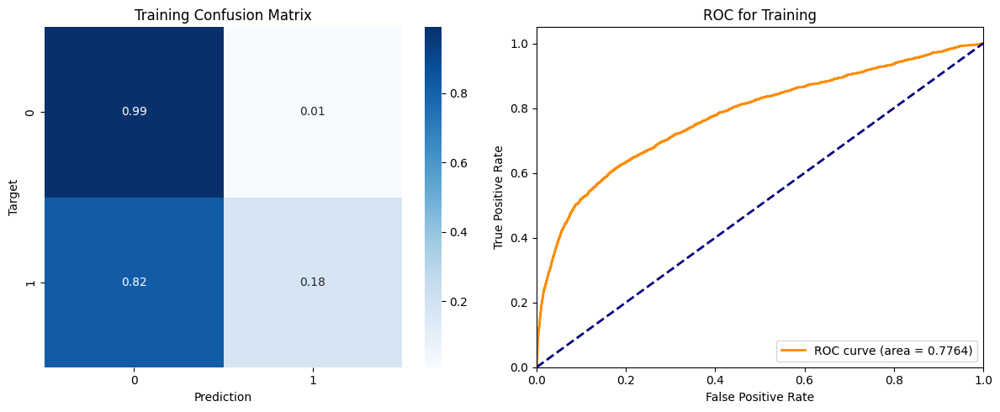

F1 score on Validation: 0.3312
AUROC for Validation: 0.7873

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8823    0.9858    0.9312      7899
           1     0.7179    0.2153    0.3312      1324

    accuracy                         0.8752      9223
   macro avg     0.8001    0.6005    0.6312      9223
weighted avg     0.8587    0.8752    0.8451      9223



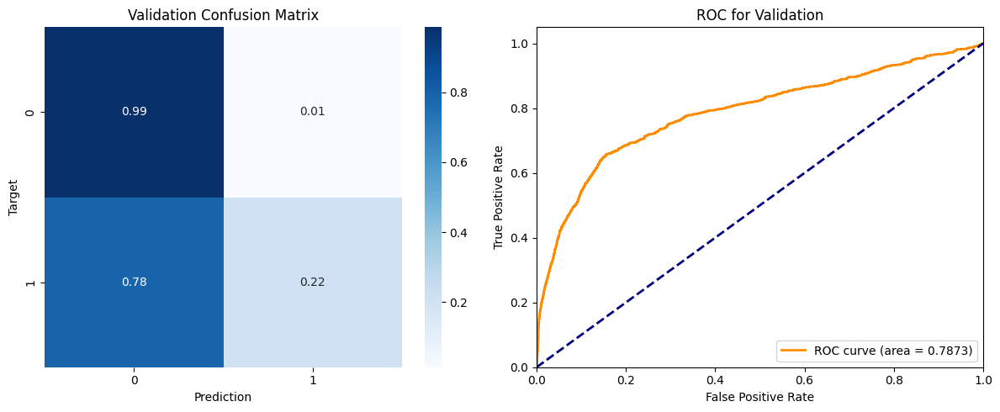

In [161]:
classify_analysis(train_targets, train_inputs, basic_log_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_log_model, 'Validation')

Top features:


emp.var.rate         1.649531
contact_code         1.365951
euribor3m            1.095084
cons.price.idx       0.855050
marital_divorced     0.638939
marital_married      0.599615
poutcome_code        0.501779
nr.employed          0.481512
marital_single       0.443393
job_services         0.369951
job_blue-collar      0.356443
job_entrepreneur     0.316488
job_management       0.294614
job_student          0.261860
job_technician       0.235214
job_retired          0.216305
month_num            0.177615
job_self-employed    0.173515
job_housemaid        0.171818
pdays                0.149457
dtype: float64

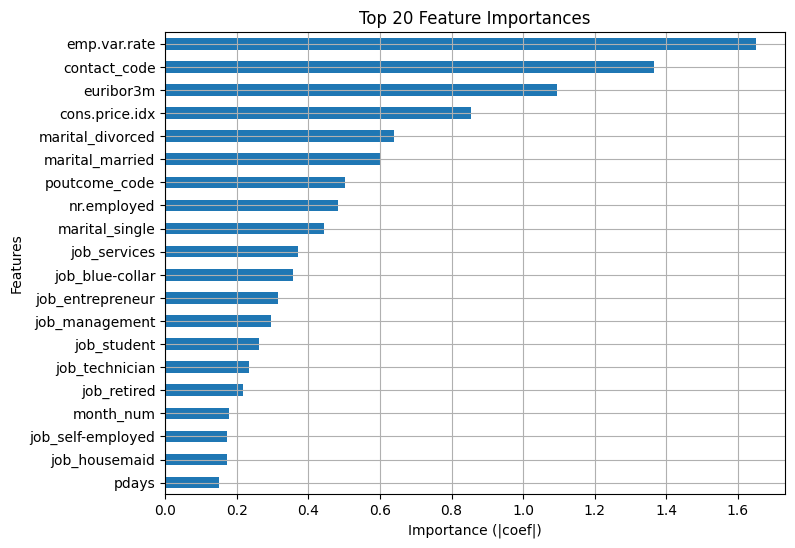

In [158]:
plot_feature_importance(basic_log_model, train_inputs, 20)

The results of this model almost entirely ignore the minority class (recall = 0.18 on the training data and 0.21 on the validation data), which affects the F1 score, which stands at 0.33 on the validation set. That said, the model is capable of distinguishing between classes when the threshold is adjusted, as evidenced by the area under the ROC curve (0.78 on the validation set); however, this result is not achieved at a threshold of 0.5.

Among the most important features are economic indicators, such as the rate of change in employment and the 3-month Euribor rate. Interestingly, the type of relationship ranks second.

#### Logistic regression on balanced data using SMOTE

In [159]:
smote_log = LogisticRegression(solver = 'liblinear')
smote_log_model = smote_log.fit(train_inputs_smote, train_targets_smote)

F1 score on Training: 0.7045
AUROC for Training: 0.7943

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.6985    0.7801    0.7371     24861
           1     0.7510    0.6634    0.7045     24861

    accuracy                         0.7217     49722
   macro avg     0.7248    0.7217    0.7208     49722
weighted avg     0.7248    0.7217    0.7208     49722



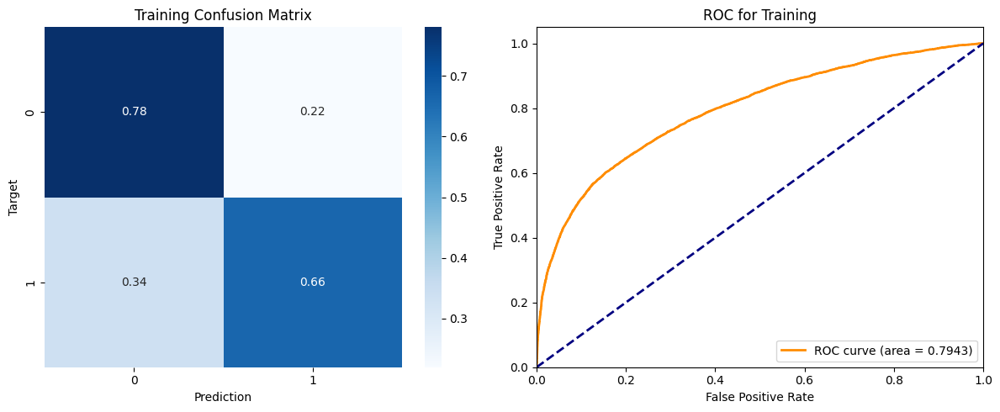

F1 score on Validation: 0.5025
AUROC for Validation: 0.7861

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9253    0.8797    0.9019      7899
           1     0.4454    0.5763    0.5025      1324

    accuracy                         0.8362      9223
   macro avg     0.6854    0.7280    0.7022      9223
weighted avg     0.8564    0.8362    0.8446      9223



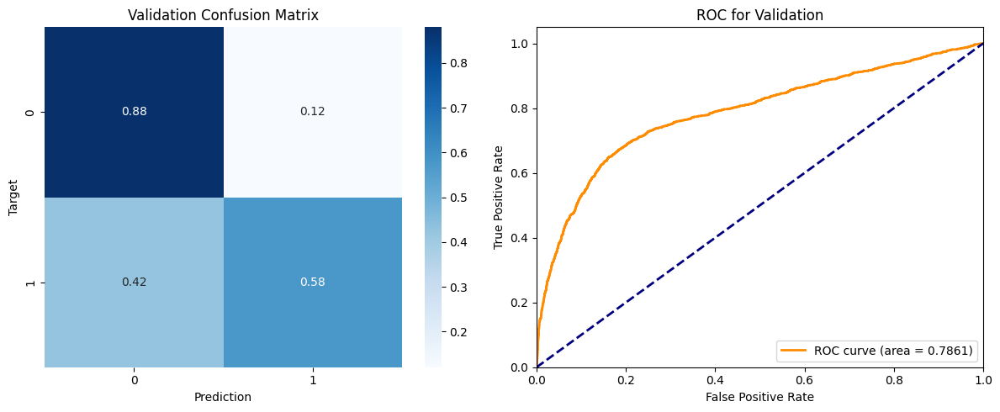

In [162]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_log_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_log_model, 'Validation')

Top features:


emp.var.rate        1.563930
contact_code        1.120912
loan_code           1.069975
euribor3m           0.890430
cons.price.idx      0.847829
poutcome_code       0.602648
job_retired         0.550941
housing_code        0.514174
job_student         0.510136
nr.employed         0.437035
job_housemaid       0.269927
job_entrepreneur    0.248788
job_unemployed      0.245758
marital_single      0.233191
job_admin.          0.196119
campaign            0.177889
marital_divorced    0.161200
job_services        0.133597
month_num           0.132505
pdays               0.125784
dtype: float64

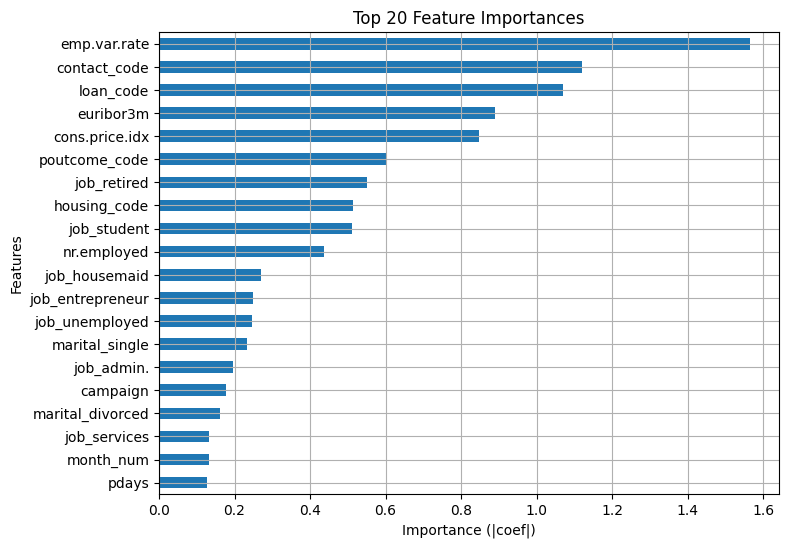

In [163]:
plot_feature_importance(smote_log_model, train_inputs_smote, 20)

Modelling on balanced data using SMOTE yielded a much better result. The F1 score rose to 0.5 on the validation set, driven by an increase in recall to 0.58, whilst precision fell to 0.45. The area under the ROC curve remains almost identical to that of the previous model (0.79).

The same economic indicators stand out as the most important features. The indicator of consumer credit status rose to third place in terms of influence.

#### Logistic regression on balanced ADASYN data

In [164]:
adasyn_log = LogisticRegression(solver = 'liblinear')
adasyn_log_model = adasyn_log.fit(train_inputs_adasyn, train_targets_adasyn)

F1 score on Training: 0.6664
AUROC for Training: 0.7486

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.6687    0.7322    0.6991     24861
           1     0.7017    0.6345    0.6664     24673

    accuracy                         0.6836     49534
   macro avg     0.6852    0.6834    0.6827     49534
weighted avg     0.6851    0.6836    0.6828     49534



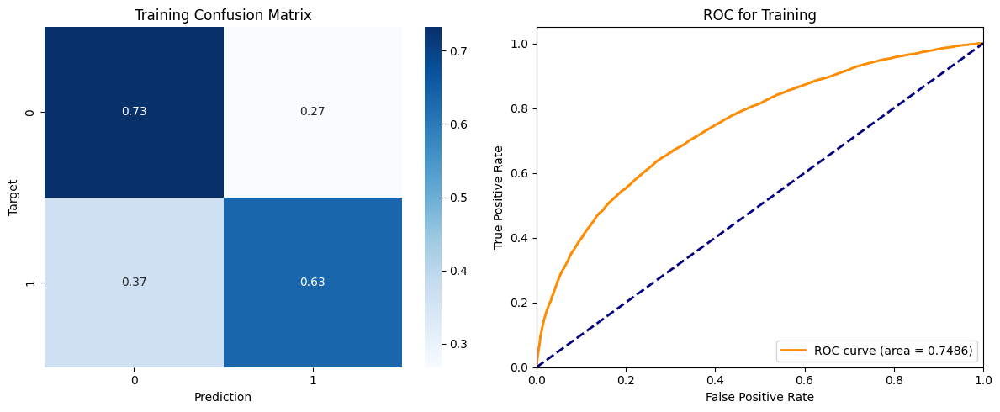

F1 score on Validation: 0.4816
AUROC for Validation: 0.7752

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9225    0.8695    0.8952      7899
           1     0.4201    0.5642    0.4816      1324

    accuracy                         0.8257      9223
   macro avg     0.6713    0.7168    0.6884      9223
weighted avg     0.8504    0.8257    0.8358      9223



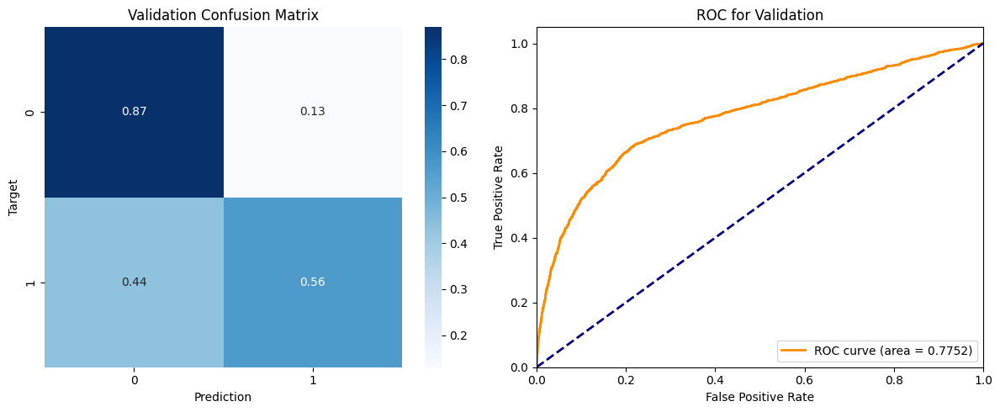

In [165]:
classify_analysis(train_targets_adasyn, train_inputs_adasyn, adasyn_log_model, 'Training')
classify_analysis(val_targets, val_inputs, adasyn_log_model, 'Validation')

Top features:


emp.var.rate        1.468977
loan_code           1.114487
contact_code        1.056527
cons.price.idx      0.764461
euribor3m           0.730580
housing_code        0.572117
poutcome_code       0.469701
job_student         0.447386
job_retired         0.425149
job_housemaid       0.297556
marital_single      0.290163
job_unemployed      0.233944
job_admin.          0.217528
nr.employed         0.198173
marital_married     0.182000
campaign            0.161696
marital_divorced    0.144867
month_num           0.133335
job_technician      0.109920
job_entrepreneur    0.106112
dtype: float64

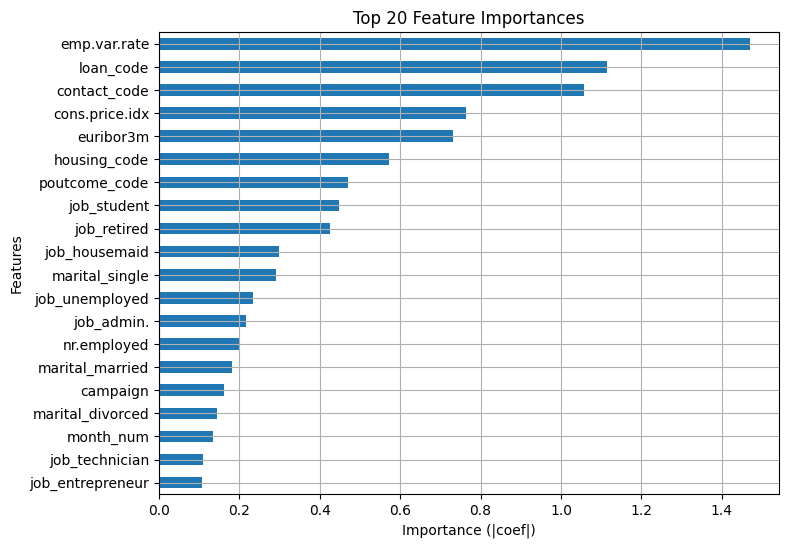

In [166]:
plot_feature_importance(adasyn_log_model, train_inputs_adasyn, 20)

Modelling on balanced data using ADASYN yields better results than on unbalanced data, but clearly lags behind balancing using SMOTE. The F1 score is 0.48 on the validation set, recall is 0.5642, and AUROC remains almost at its previous level.

Among the most important features, economic indicators such as the rate of change in employment and the consumer price index stand out. The strength of the relationship is slightly less than that of consumer credit.

#### Logistic regression on SMOTE-TOMEK balanced data

In [167]:
smotetomek_log = LogisticRegression(solver = 'liblinear')
smotetomek_log_model = smotetomek_log.fit(train_inputs_smotetomek, train_targets_smotetomek)

F1 score on Training: 0.7064
AUROC for Training: 0.7962

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.7003    0.7810    0.7384     24679
           1     0.7525    0.6657    0.7064     24679

    accuracy                         0.7234     49358
   macro avg     0.7264    0.7234    0.7224     49358
weighted avg     0.7264    0.7234    0.7224     49358



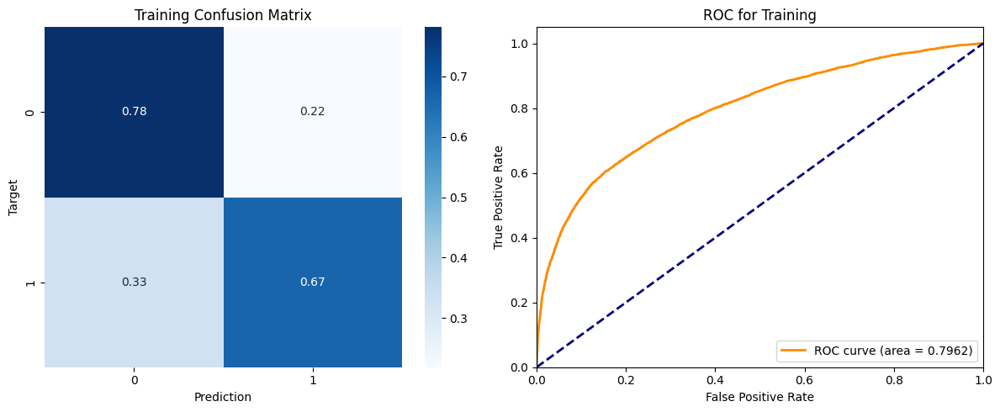

F1 score on Validation: 0.5023
AUROC for Validation: 0.7862

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9253    0.8796    0.9019      7899
           1     0.4452    0.5763    0.5023      1324

    accuracy                         0.8361      9223
   macro avg     0.6852    0.7279    0.7021      9223
weighted avg     0.8564    0.8361    0.8445      9223



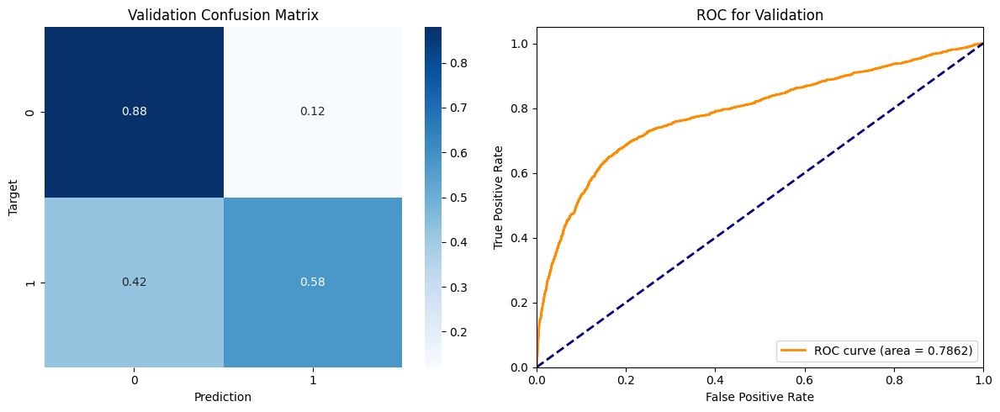

In [168]:
classify_analysis(train_targets_smotetomek, train_inputs_smotetomek, smotetomek_log_model, 'Training')
classify_analysis(val_targets, val_inputs, smotetomek_log_model, 'Validation')

Top features:


emp.var.rate        1.582465
contact_code        1.127121
loan_code           1.076664
euribor3m           0.891929
cons.price.idx      0.855136
poutcome_code       0.605819
job_retired         0.554896
housing_code        0.516600
job_student         0.514691
nr.employed         0.430862
job_housemaid       0.268239
job_unemployed      0.253077
job_entrepreneur    0.246174
marital_single      0.233850
job_admin.          0.199174
campaign            0.177722
marital_divorced    0.161025
job_services        0.138768
month_num           0.133423
pdays               0.126769
dtype: float64

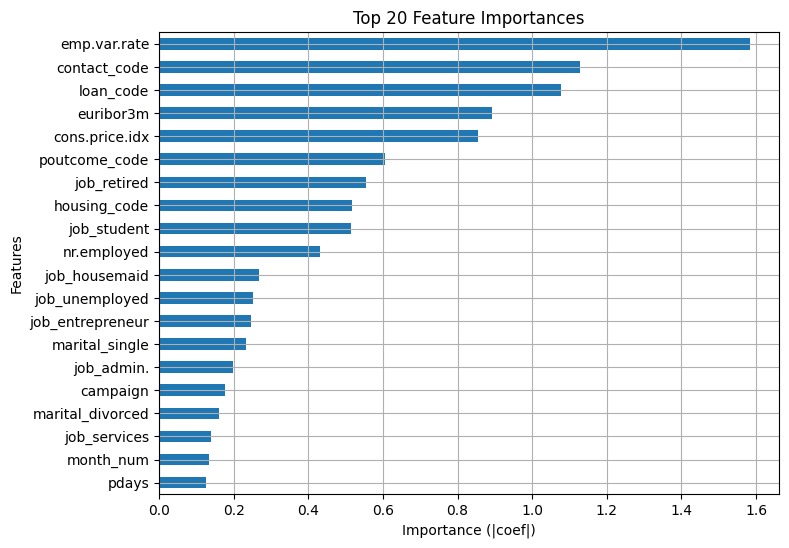

In [169]:
plot_feature_importance(smotetomek_log_model, train_inputs_smotetomek, 20)

The results of modelling on balanced data using SMOTE-TOMEK are similar to those of the SMOTE model on balanced data, although the former are slightly lower, by approximately 0.003.

**General conclusions**

Of the logistic regression models examined on various training datasets (unbalanced, SMOTE, ADASYN, SMOTE-TOMEK), the best result was achieved by the smote_log_model, i.e. specifically on balanced data using SMOTE. Therefore, to improve the results, further experiments will be based on this model.

### Model with tuned hyperparameters

In [170]:
grid_param_log = {
    'C': [0.01, 0.1, 1, 5, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}

log_grid = GridSearchCV(
    LogisticRegression(),
    grid_param_log,
    scoring = 'f1',
    cv = 5,
    n_jobs = -1
)

log_grid.fit(train_inputs_smote, train_targets_smote)
smote_log_grid_model = log_grid.best_estimator_

c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:1160: UserWarning: Inconsistent values: penalty=l1 with l1_ratio=0.0. penalty is deprecated. Please use l1_ratio only.
  warnings.warn(


In [171]:
print("Найкращі параметри:", log_grid.best_params_)
print("Найкращий CV F1:", round(log_grid.best_score_, 4))

Найкращі параметри: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}
Найкращий CV F1: 0.615


F1 score on Training: 0.7057
AUROC for Training: 0.7928

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.7010    0.7626    0.7305     24861
           1     0.7397    0.6747    0.7057     24861

    accuracy                         0.7186     49722
   macro avg     0.7203    0.7186    0.7181     49722
weighted avg     0.7203    0.7186    0.7181     49722



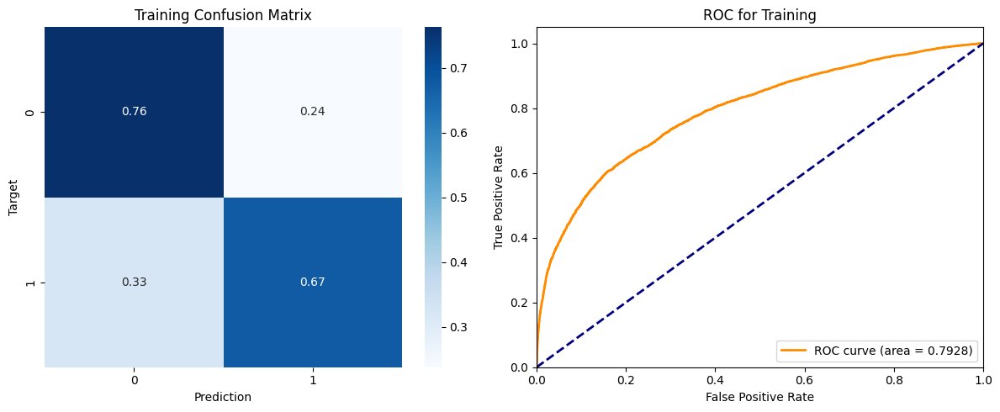

F1 score on Validation: 0.5124
AUROC for Validation: 0.7871

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9310    0.8677    0.8982      7899
           1     0.4385    0.6163    0.5124      1324

    accuracy                         0.8316      9223
   macro avg     0.6847    0.7420    0.7053      9223
weighted avg     0.8603    0.8316    0.8428      9223



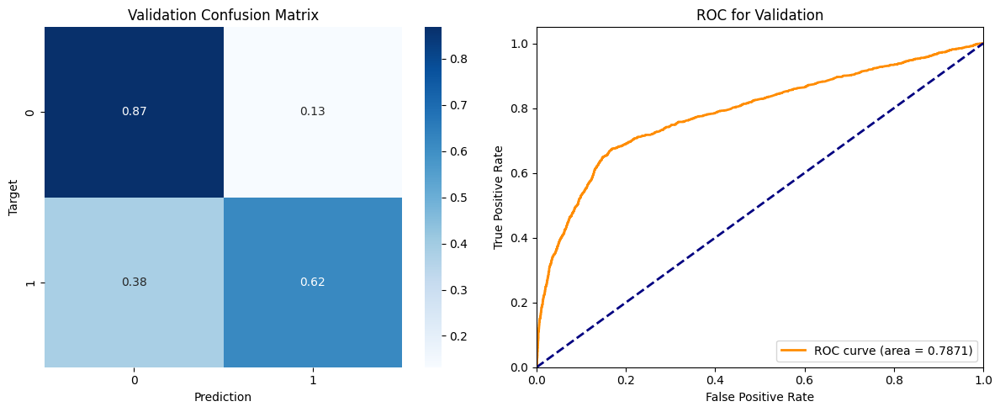

In [172]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_log_grid_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_log_grid_model, 'Validation')

Top features:


loan_code           0.920036
contact_code        0.872002
emp.var.rate        0.805877
cons.price.idx      0.637607
poutcome_code       0.473079
housing_code        0.467189
job_retired         0.312894
nr.employed         0.251199
campaign            0.169181
pdays               0.154608
job_admin.          0.145034
job_student         0.140616
marital_single      0.135280
marital_divorced    0.132751
month_num           0.076447
job_blue-collar     0.053600
day_of_week_code    0.052080
cons.conf.idx       0.042082
job_services        0.036148
previous            0.036052
dtype: float64

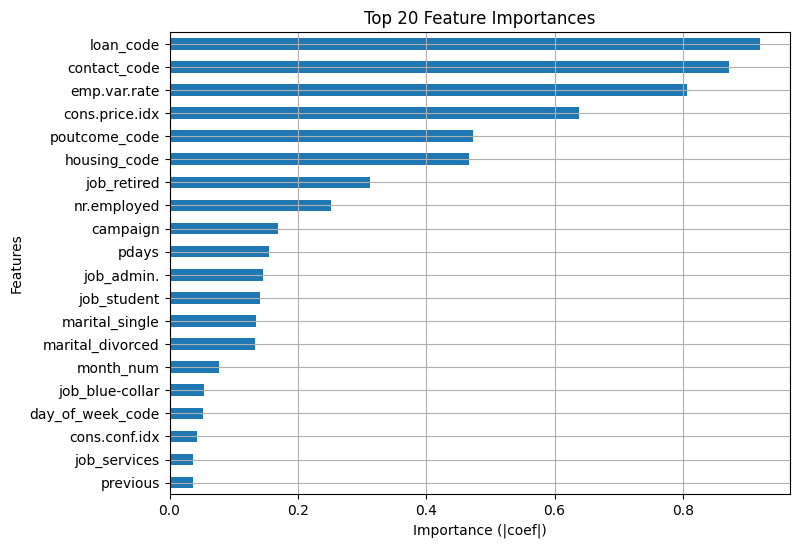

In [174]:
plot_feature_importance(smote_log_grid_model, train_inputs_smote, 20)

Modelling on balanced data using SMOTE with hyperparameters selected via GridSearchCV enabled an increase in F1 to 0.5124 on the validation set, due to a rise in recall to 0.6163, whilst precision fell to 0.4385. The area under the ROC curve remains virtually unchanged (0.78).

Among the most important features, the most influential were the presence of a consumer loan and the method of communication, as well as the macroeconomic indicators that were also identified in previous models.

## kNN

### Models with default settings

#### kNN on unbalanced data

In [175]:
basic_knn = KNeighborsClassifier()
basic_knn_model = basic_knn.fit(train_inputs, train_targets)

F1 score on Traning: 0.4631
AUROC for Traning: 0.9268

Classification Report for Traning:

              precision    recall  f1-score   support

           0     0.9298    0.9849    0.9565     24861
           1     0.7186    0.3416    0.4631      2810

    accuracy                         0.9196     27671
   macro avg     0.8242    0.6633    0.7098     27671
weighted avg     0.9083    0.9196    0.9064     27671



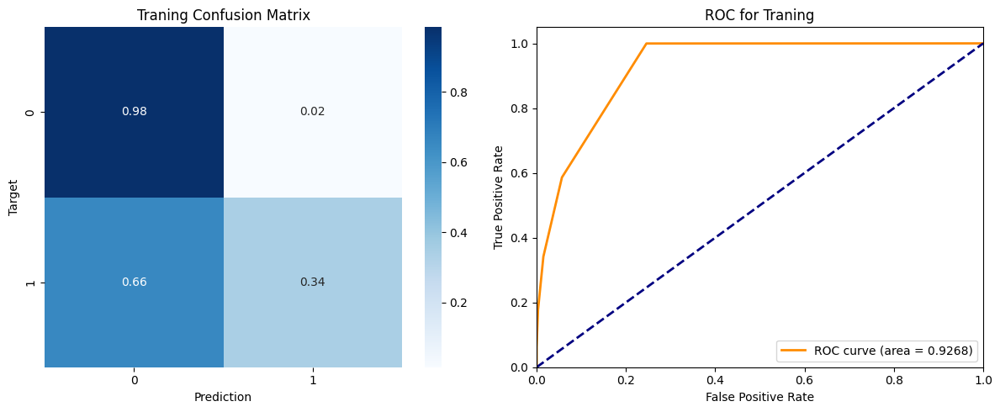

F1 score on Validation: 0.4247
AUROC for Validation: 0.7428

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8974    0.9478    0.9219      7899
           1     0.5318    0.3535    0.4247      1324

    accuracy                         0.8625      9223
   macro avg     0.7146    0.6507    0.6733      9223
weighted avg     0.8449    0.8625    0.8505      9223



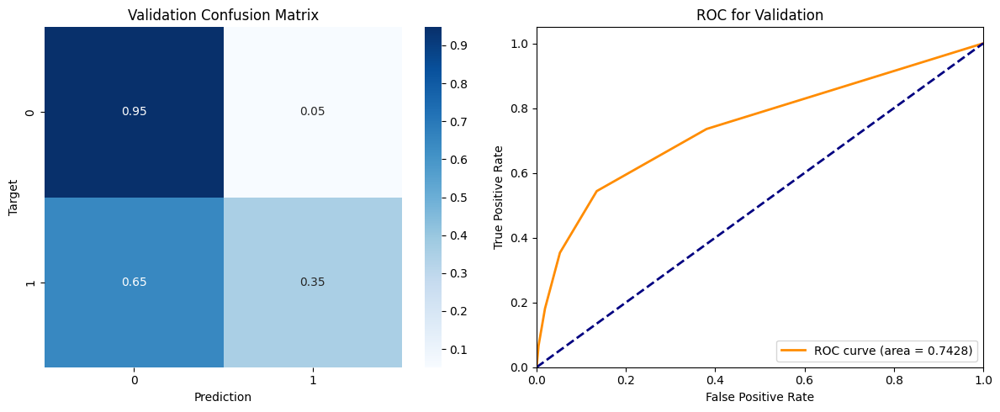

In [176]:
classify_analysis(train_targets, train_inputs, basic_knn_model, 'Traning')
classify_analysis(val_targets, val_inputs, basic_knn_model, 'Validation')

The kNN model, when applied to unbalanced data, identifies only a third of the actual customers who opened a deposit account (recall = 0.3535 on the validation set). The F1 score is 0.42, whilst the AUROC has fallen to 0.74 compared with logistic regression.

#### kNN on balanced data using SMOTE

In [179]:
smote_knn = KNeighborsClassifier()
smote_knn_model = smote_knn.fit(train_inputs_smote, train_targets_smote)

F1 score on Traning: 0.9096
AUROC for Traning: 0.981

Classification Report for Traning:

              precision    recall  f1-score   support

           0     0.9681    0.8342    0.8962     24861
           1     0.8543    0.9725    0.9096     24861

    accuracy                         0.9033     49722
   macro avg     0.9112    0.9033    0.9029     49722
weighted avg     0.9112    0.9033    0.9029     49722



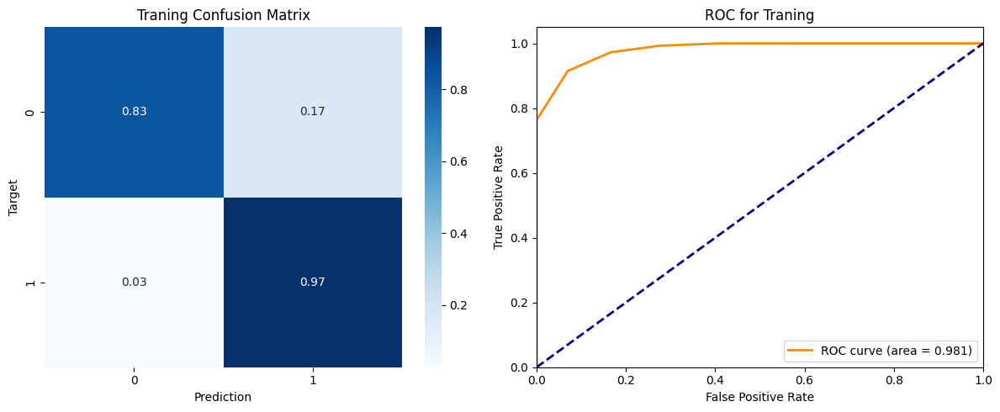

F1 score on Validation: 0.3867
AUROC for Validation: 0.7168

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9237    0.7145    0.8058      7899
           1     0.2756    0.6480    0.3867      1324

    accuracy                         0.7050      9223
   macro avg     0.5997    0.6813    0.5963      9223
weighted avg     0.8307    0.7050    0.7456      9223



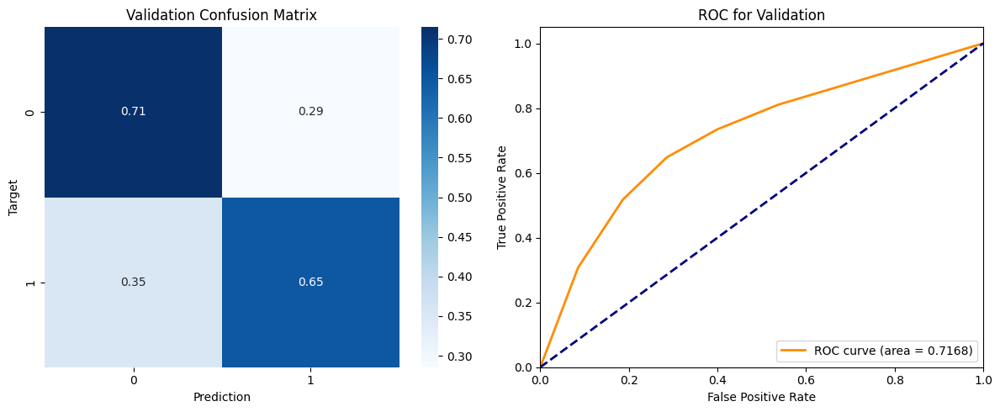

In [180]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_knn_model, 'Traning')
classify_analysis(val_targets, val_inputs, smote_knn_model, 'Validation')

After data balancing using SMOTE, the target metrics F1 and AUROC fell to 0.3867 and 0.7168 respectively. Meanwhile, recall improved, rising to 0.648, but precision fell to 0.28.

#### kNN on balanced data using ADASYN

In [181]:
adasyn_knn = KNeighborsClassifier()
adasyn_knn_model = adasyn_knn.fit(train_inputs_adasyn, train_targets_adasyn)

F1 score on Traning: 0.9028
AUROC for Traning: 0.9796

Classification Report for Traning:

              precision    recall  f1-score   support

           0     0.9716    0.8152    0.8866     24861
           1     0.8398    0.9760    0.9028     24673

    accuracy                         0.8953     49534
   macro avg     0.9057    0.8956    0.8947     49534
weighted avg     0.9060    0.8953    0.8946     49534



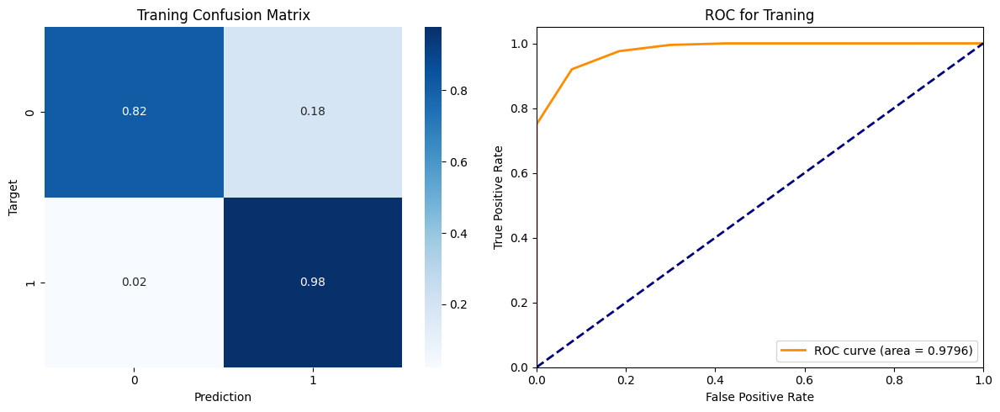

F1 score on Validation: 0.3807
AUROC for Validation: 0.7056

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9258    0.6900    0.7907      7899
           1     0.2659    0.6699    0.3807      1324

    accuracy                         0.6871      9223
   macro avg     0.5958    0.6800    0.5857      9223
weighted avg     0.8310    0.6871    0.7318      9223



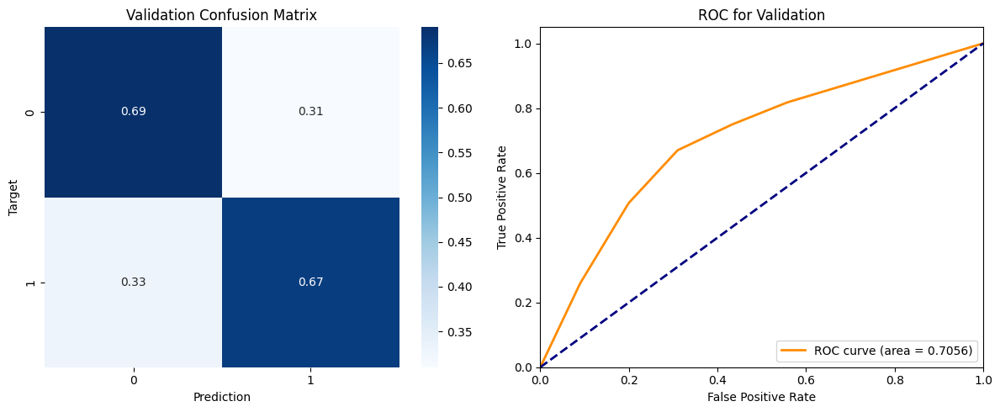

In [182]:
classify_analysis(train_targets_adasyn, train_inputs_adasyn, adasyn_knn_model, 'Traning')
classify_analysis(val_targets, val_inputs, adasyn_knn_model, 'Validation')

After data balancing using ADASYN, there is also a decrease in the target metrics F1 and AUROC to 0.3807 and 0.7056 respectively. At the same time, recall improved, rising to 0.6699, but precision fell to 0.2659.

#### kNN on balanced data using SMOTE-TOMEK

In [183]:
smotetomek_knn = KNeighborsClassifier()
smotetomek_knn_model = smotetomek_knn.fit(train_inputs_smotetomek, train_targets_smotetomek)

F1 score on Traning: 0.9112
AUROC for Traning: 0.9822

Classification Report for Traning:

              precision    recall  f1-score   support

           0     0.9693    0.8367    0.8982     24679
           1     0.8564    0.9735    0.9112     24679

    accuracy                         0.9051     49358
   macro avg     0.9129    0.9051    0.9047     49358
weighted avg     0.9129    0.9051    0.9047     49358



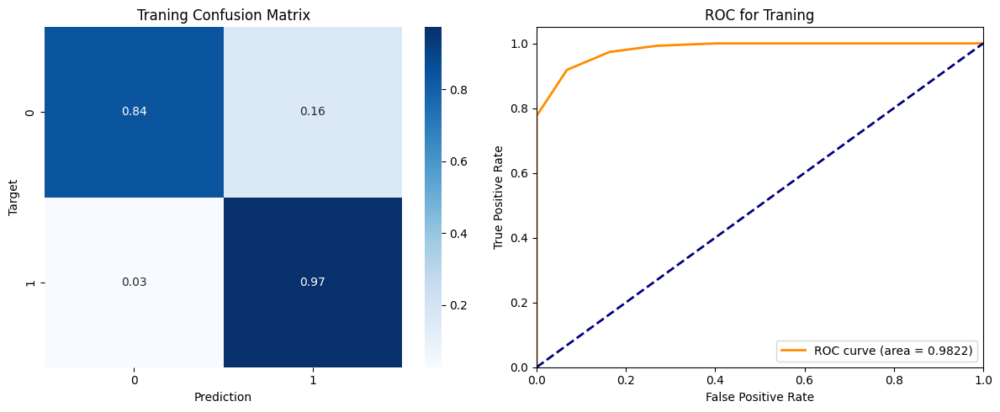

F1 score on Validation: 0.3885
AUROC for Validation: 0.7171

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9246    0.7139    0.8057      7899
           1     0.2766    0.6526    0.3885      1324

    accuracy                         0.7051      9223
   macro avg     0.6006    0.6832    0.5971      9223
weighted avg     0.8316    0.7051    0.7458      9223



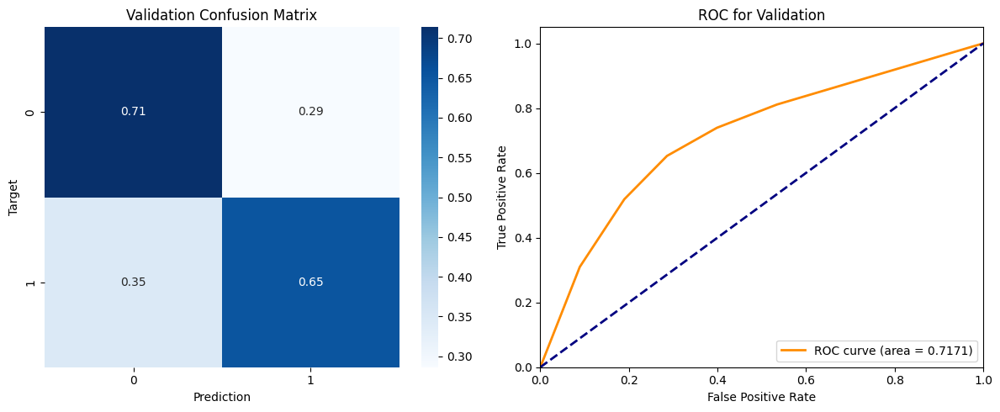

In [184]:
classify_analysis(train_targets_smotetomek, train_inputs_smotetomek, smotetomek_knn_model, 'Traning')
classify_analysis(val_targets, val_inputs, smotetomek_knn_model, 'Validation')

After balancing the data using SMOTE-TOMEK, in line with the previous results, we observe a decline in the target metrics on the balanced samples, indicating a deterioration in model quality.

**General conclusions**

To identify the optimal hyperparameters, the model was trained on an unbalanced dataset and also tested on SMOTE data.

### Models with tuned hyperparameters

In [185]:
grid_param_knn = {
    'n_neighbors': [3, 5, 7, 9, 11, 15, 20],
    'weights': ['uniform', 'distance'],
    'metric': ['minkowski'],
    'p': [1, 2]
}

knn_grid = GridSearchCV(
    KNeighborsClassifier(),
    grid_param_knn,
    scoring = 'f1',
    cv = 5,
    n_jobs = -1
)

#### kNN with tuned hyperparameters on imbalanced data

In [186]:
basic_knn_grid = knn_grid.fit(train_inputs, train_targets)
basic_knn_grid_model = basic_knn_grid.best_estimator_

In [187]:
print("Найкращі параметри:", knn_grid.best_params_)
print("Найкращий CV F1:", round(knn_grid.best_score_, 4))

Найкращі параметри: {'metric': 'minkowski', 'n_neighbors': 15, 'p': 2, 'weights': 'uniform'}
Найкращий CV F1: 0.2812


F1 score on Training: 0.3593
AUROC for Training: 0.8671

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9204    0.9865    0.9523     24861
           1     0.6722    0.2452    0.3593      2810

    accuracy                         0.9112     27671
   macro avg     0.7963    0.6158    0.6558     27671
weighted avg     0.8952    0.9112    0.8921     27671



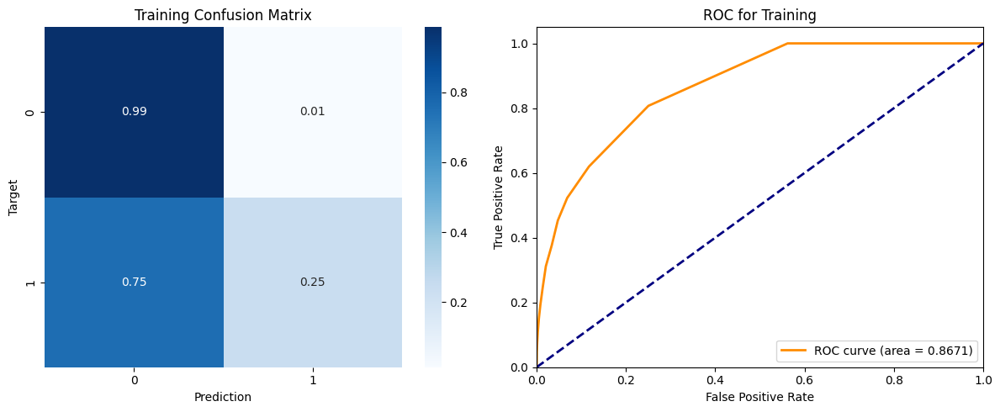

F1 score on Validation: 0.4496
AUROC for Validation: 0.7749

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8998    0.9572    0.9276      7899
           1     0.5878    0.3640    0.4496      1324

    accuracy                         0.8721      9223
   macro avg     0.7438    0.6606    0.6886      9223
weighted avg     0.8550    0.8721    0.8590      9223



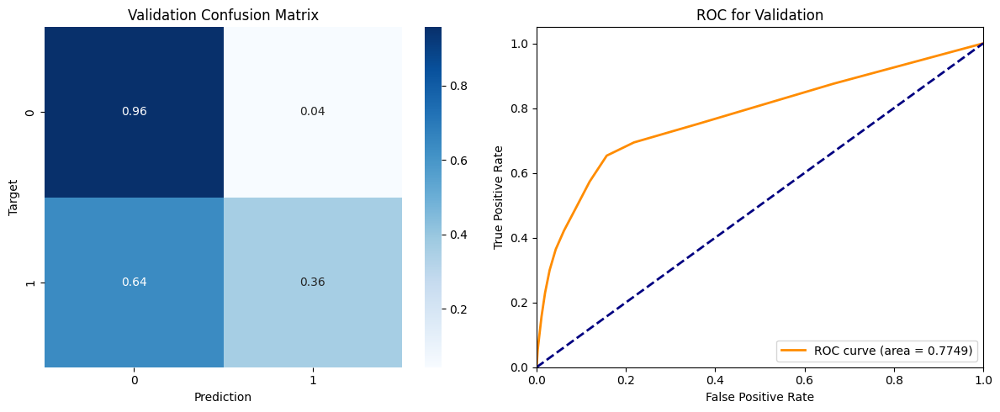

In [188]:
classify_analysis(train_targets, train_inputs, basic_knn_grid_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_knn_grid_model, 'Validation')

Increasing the number of neighbours from 5 to 15 led to an improvement in the overall quality of the model (F1 = 0.4496 on the validation set), but also reduced the number of actual term deposit customers correctly identified (recall fell to 0.364 on the validation set).

#### kNN with hyperparameters selected on balanced data using SMOTE

In [189]:
smote_knn_grid = knn_grid.fit(train_inputs_smote, train_targets_smote)
smote_knn_grid_model = smote_knn_grid.best_estimator_

In [190]:
print("Найкращі параметри:", smote_knn_grid.best_params_)
print("Найкращий CV F1:", round(smote_knn_grid.best_score_, 4))

Найкращі параметри: {'metric': 'minkowski', 'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
Найкращий CV F1: 0.7412


F1 score on Training: 0.9963
AUROC for Training: 0.9999

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9982    0.9943    0.9963     24861
           1     0.9943    0.9982    0.9963     24861

    accuracy                         0.9963     49722
   macro avg     0.9963    0.9963    0.9963     49722
weighted avg     0.9963    0.9963    0.9963     49722



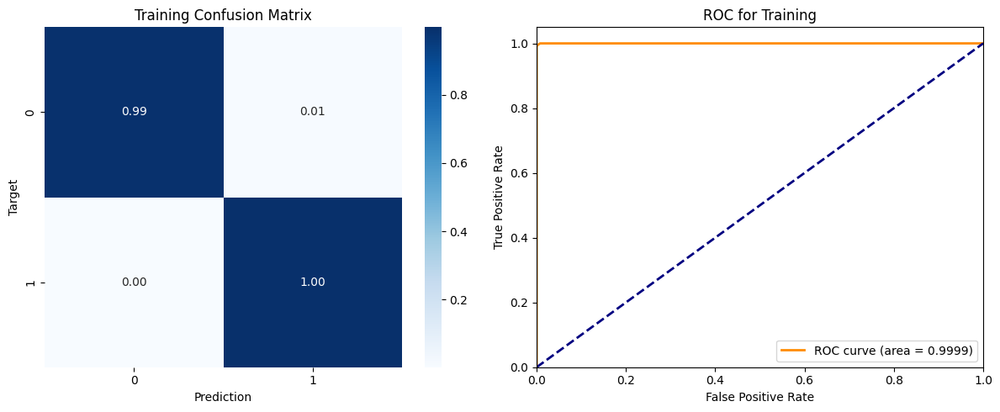

F1 score on Validation: 0.3809
AUROC for Validation: 0.6946

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9148    0.7533    0.8262      7899
           1     0.2832    0.5816    0.3809      1324

    accuracy                         0.7286      9223
   macro avg     0.5990    0.6674    0.6036      9223
weighted avg     0.8241    0.7286    0.7623      9223



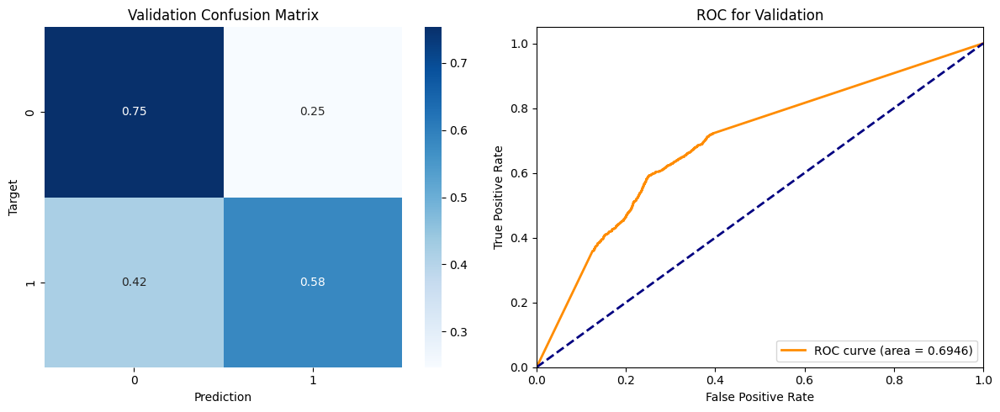

In [191]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_knn_grid_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_knn_grid_model, 'Validation')

The model with optimal hyperparameters trained on SMOTE-balanced data performed poorly on both the target metric and the auxiliary metrics.

## Decision Tree

### Models with default settings

#### Decision Trees on Unbalanced Data

In [192]:
basic_dt = DecisionTreeClassifier(random_state = 42)
basic_dt_model = basic_dt.fit(train_inputs, train_targets)

In [193]:
print("Глибина дерева побудованого на ознаках за замовчування:", basic_dt_model.tree_.max_depth)
print("Кількість вузлів дерева побудованого на ознаках за замовчування:", basic_dt_model.tree_.node_count)

Глибина дерева побудованого на ознаках за замовчування: 33
Кількість вузлів дерева побудованого на ознаках за замовчування: 8501


F1 score on Training: 0.9711
AUROC for Training: 0.9998

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9991    0.9942    0.9967     24861
           1     0.9512    0.9918    0.9711      2810

    accuracy                         0.9940     27671
   macro avg     0.9751    0.9930    0.9839     27671
weighted avg     0.9942    0.9940    0.9941     27671



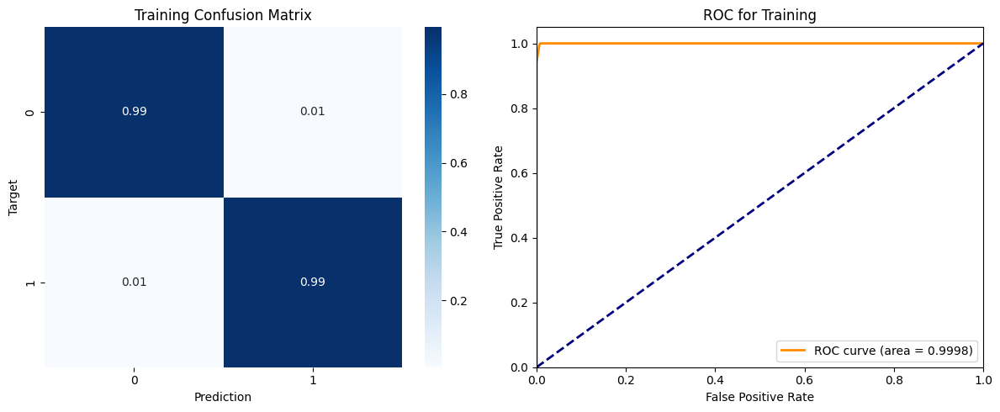

F1 score on Validation: 0.3754
AUROC for Validation: 0.645

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9014    0.8400    0.8696      7899
           1     0.3212    0.4517    0.3754      1324

    accuracy                         0.7842      9223
   macro avg     0.6113    0.6458    0.6225      9223
weighted avg     0.8181    0.7842    0.7986      9223



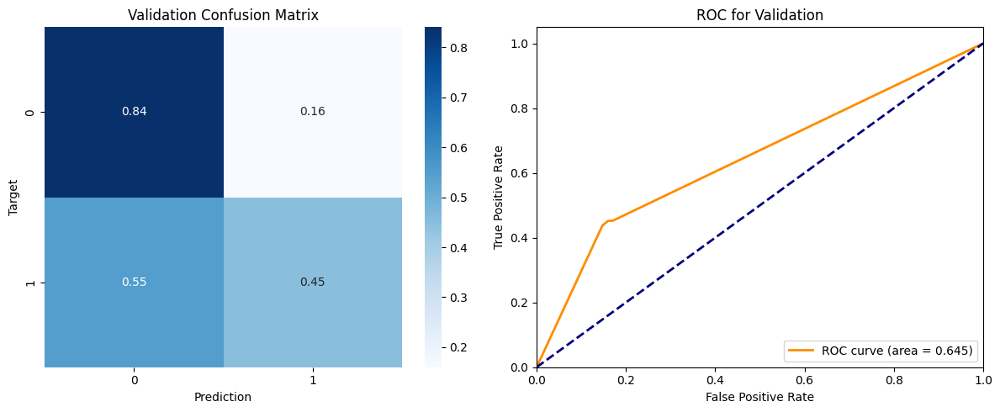

In [194]:
classify_analysis(train_targets, train_inputs, basic_dt_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_dt_model, 'Validation')

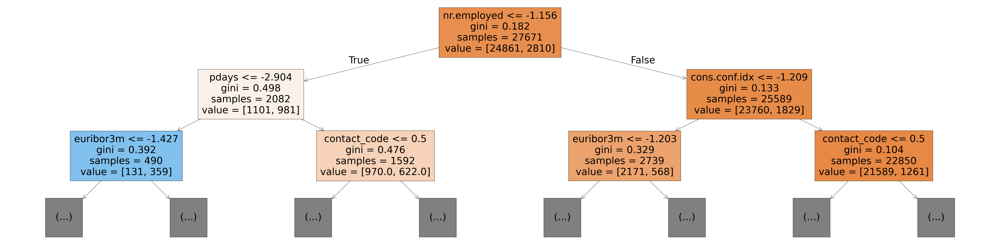

In [196]:
plt.figure(figsize=(80,20))
plot_tree(basic_dt_model, feature_names = train_inputs.columns, max_depth = 2, filled = True);

TOP-20 найважливіших ознак


,feature,importance
0,age,0.1888
8,nr.employed,0.1272
7,euribor3m,0.1032
1,campaign,0.0969
16,education_code,0.0750
11,housing_code,0.0591
15,day_of_week_code,0.0540
12,loan_code,0.0336
6,cons.conf.idx,0.0310
2,pdays,0.0297


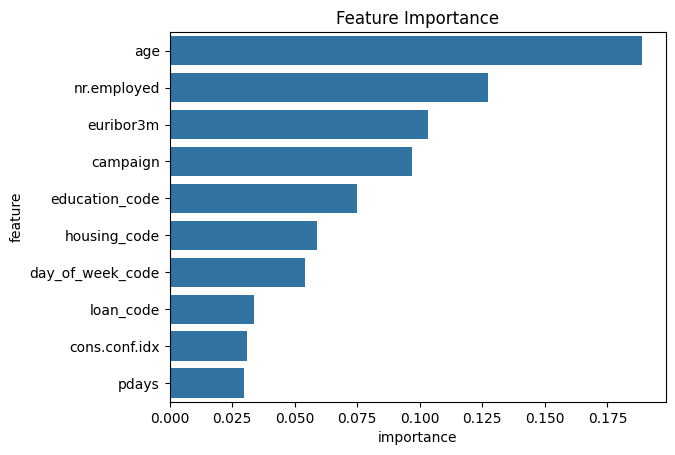

In [197]:
importance_features(train_inputs, basic_dt_model, n = 20)

The results of the modelling on unbalanced data reflect a clear case of overfitting, where the model has memorised all the training data. Accordingly, the F1 score is only 0.3754, recall is 0.4517, whilst precision has fallen to 0.3212. As for the overall ability to distinguish between classes at different classification thresholds, in this case it is quite low compared with previous models (0.645 on the validation set).

However, compared with logistic regression, among the most influential factors we can observe more logical features such as age, the number of employed individuals, the number of contacts with the bank during the current campaign, and so on.

#### Decision Tree on balanced data using SMOTE

In [198]:
smote_dt = DecisionTreeClassifier(random_state = 42)
smote_dt_model = smote_dt.fit(train_inputs_smote, train_targets_smote)

In [199]:
print("Глибина дерева побудованого на ознаках за замовчування:", smote_dt_model.tree_.max_depth)
print("Кількість вузлів дерева побудованого на ознаках за замовчування:", smote_dt_model.tree_.node_count)

Глибина дерева побудованого на ознаках за замовчування: 35
Кількість вузлів дерева побудованого на ознаках за замовчування: 10021


F1 score on Training: 0.9965
AUROC for Training: 1.0

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9992    0.9938    0.9965     24861
           1     0.9939    0.9992    0.9965     24861

    accuracy                         0.9965     49722
   macro avg     0.9965    0.9965    0.9965     49722
weighted avg     0.9965    0.9965    0.9965     49722



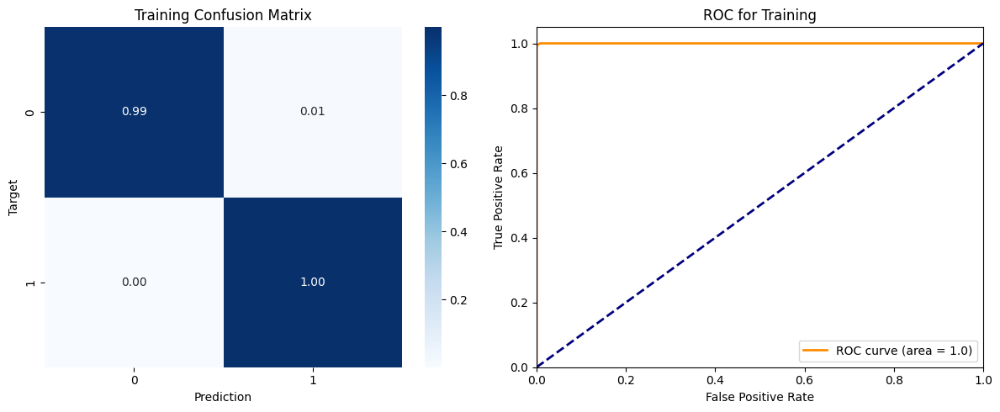

F1 score on Validation: 0.324
AUROC for Validation: 0.6123

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8907    0.8231    0.8556      7899
           1     0.2735    0.3973    0.3240      1324

    accuracy                         0.7620      9223
   macro avg     0.5821    0.6102    0.5898      9223
weighted avg     0.8021    0.7620    0.7793      9223



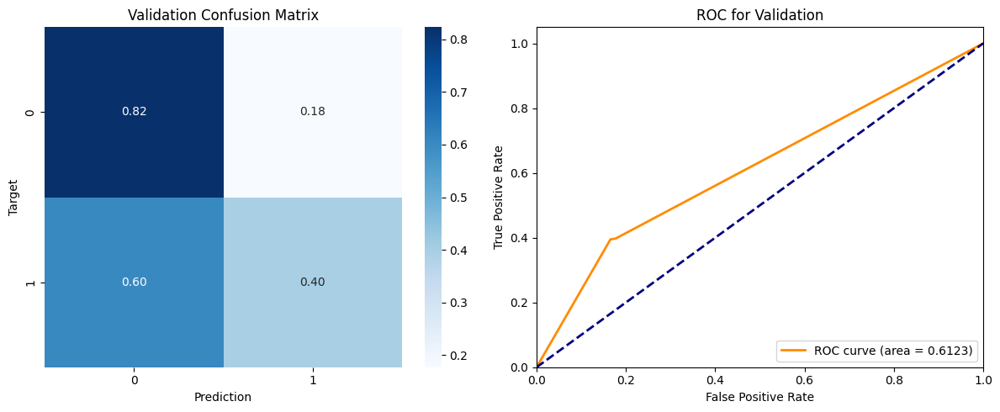

In [200]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_dt_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_dt_model, 'Validation')

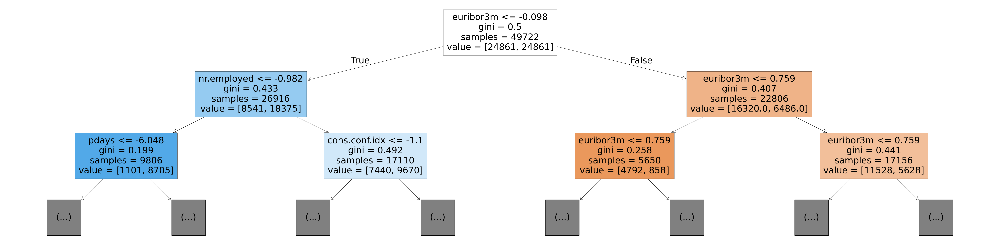

In [201]:
plt.figure(figsize=(80,20))
plot_tree(smote_dt_model, feature_names = train_inputs_smote.columns, max_depth = 2, filled = True);

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,0.3047
1,campaign,0.2307
0,age,0.1054
8,nr.employed,0.0536
15,day_of_week_code,0.0351
6,cons.conf.idx,0.0334
16,education_code,0.0308
5,cons.price.idx,0.0214
17,job_admin.,0.0193
11,housing_code,0.0176


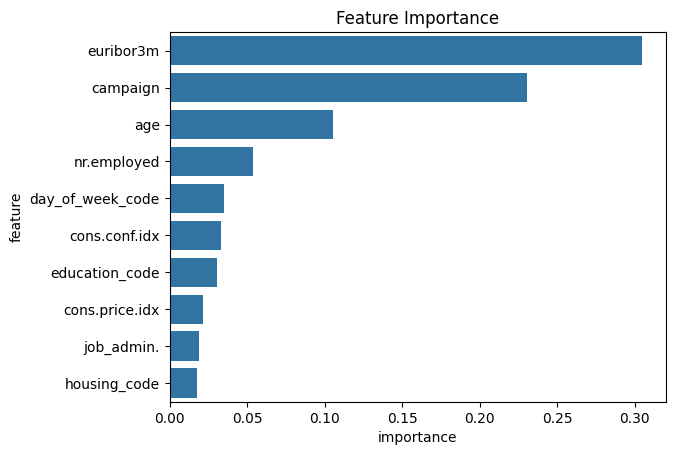

In [202]:
importance_features(train_inputs_smote, smote_dt_model, n = 20)

#### Decision Tree on balanced data using ADASYN

In [203]:
adasyn_dt = DecisionTreeClassifier(random_state = 42)
adasyn_dt_model = adasyn_dt.fit(train_inputs_adasyn, train_targets_adasyn)

In [204]:
print("Глибина дерева побудованого на ознаках за замовчування:", adasyn_dt_model.tree_.max_depth)
print("Кількість вузлів дерева побудованого на ознаках за замовчування:", adasyn_dt_model.tree_.node_count)

Глибина дерева побудованого на ознаках за замовчування: 33
Кількість вузлів дерева побудованого на ознаках за замовчування: 10129


F1 score on Training: 0.9965
AUROC for Training: 1.0

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9992    0.9938    0.9965     24861
           1     0.9938    0.9992    0.9965     24673

    accuracy                         0.9965     49534
   macro avg     0.9965    0.9965    0.9965     49534
weighted avg     0.9965    0.9965    0.9965     49534



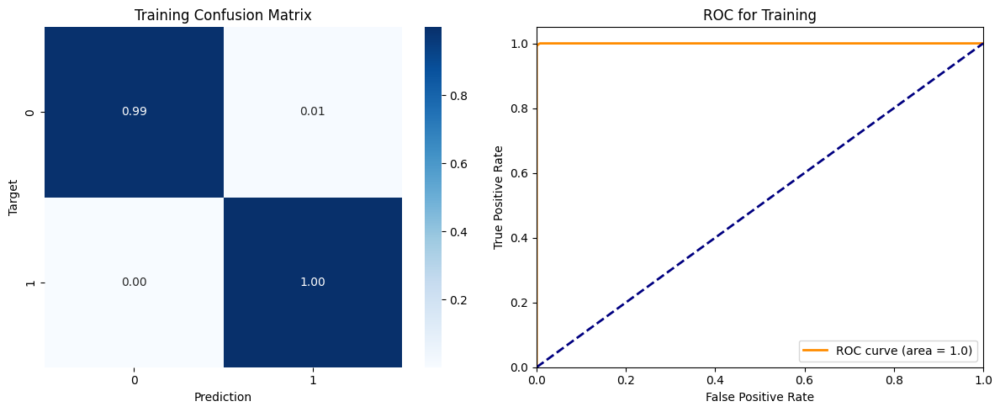

F1 score on Validation: 0.2796
AUROC for Validation: 0.5789

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8791    0.8857    0.8824      7899
           1     0.2862    0.2734    0.2796      1324

    accuracy                         0.7978      9223
   macro avg     0.5826    0.5795    0.5810      9223
weighted avg     0.7940    0.7978    0.7959      9223



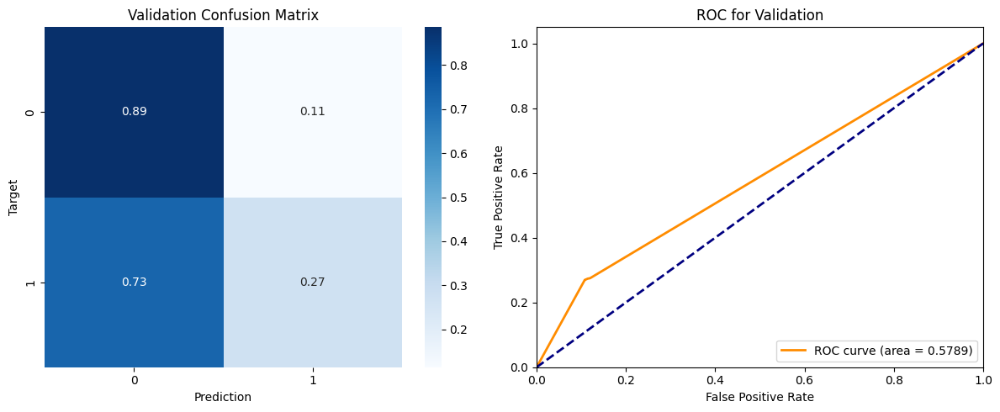

In [205]:
classify_analysis(train_targets_adasyn, train_inputs_adasyn, adasyn_dt_model, 'Training')
classify_analysis(val_targets, val_inputs, adasyn_dt_model, 'Validation')

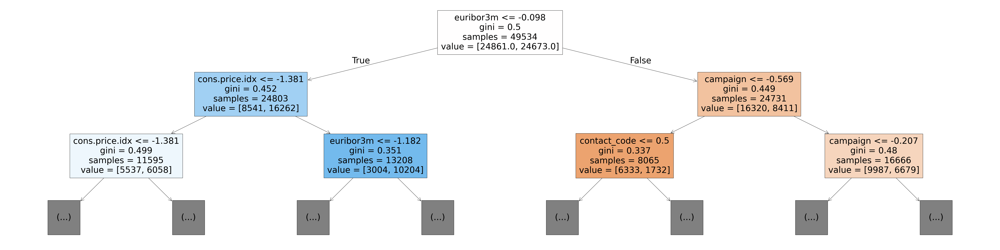

In [206]:
plt.figure(figsize=(80,20))
plot_tree(adasyn_dt_model, feature_names = train_inputs_adasyn.columns, max_depth = 2, filled = True);

TOP-20 найважливіших ознак


,feature,importance
1,campaign,0.3011
7,euribor3m,0.2563
0,age,0.1033
5,cons.price.idx,0.0567
15,day_of_week_code,0.0418
16,education_code,0.0354
17,job_admin.,0.0223
18,job_blue-collar,0.0196
11,housing_code,0.0162
30,marital_single,0.0144


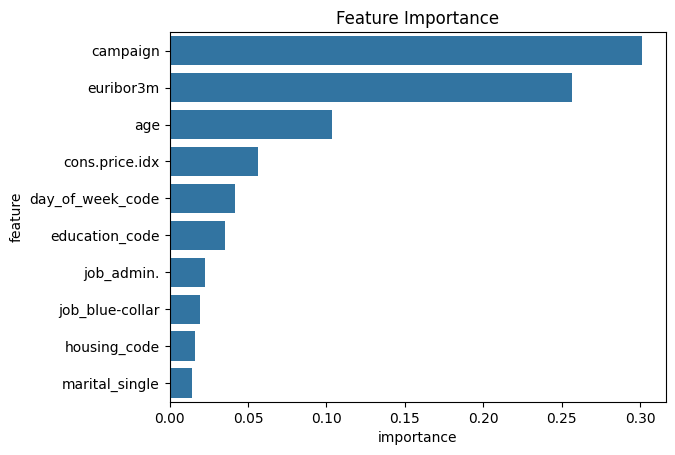

In [207]:
importance_features(train_inputs_adasyn, adasyn_dt_model, n = 20)

#### Decision Tree on balanced data using SMOTE-TOMEK

In [208]:
smotetomek_dt = DecisionTreeClassifier(random_state = 42)
smotetomek_dt_model = smotetomek_dt.fit(train_inputs_smotetomek, train_targets_smotetomek)

In [209]:
print("Глибина дерева побудованого на ознаках за замовчування:", smotetomek_dt_model.tree_.max_depth)
print("Кількість вузлів дерева побудованого на ознаках за замовчування:", smotetomek_dt_model.tree_.node_count)

Глибина дерева побудованого на ознаках за замовчування: 35
Кількість вузлів дерева побудованого на ознаках за замовчування: 9677


F1 score on Training: 0.9965
AUROC for Training: 1.0

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9992    0.9938    0.9965     24679
           1     0.9938    0.9992    0.9965     24679

    accuracy                         0.9965     49358
   macro avg     0.9965    0.9965    0.9965     49358
weighted avg     0.9965    0.9965    0.9965     49358



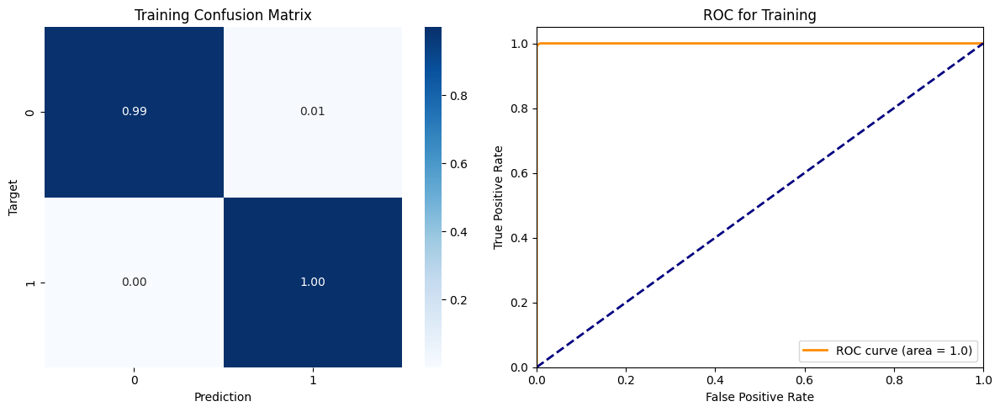

F1 score on Validation: 0.3237
AUROC for Validation: 0.61

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8900    0.8320    0.8600      7899
           1     0.2784    0.3867    0.3237      1324

    accuracy                         0.7681      9223
   macro avg     0.5842    0.6094    0.5919      9223
weighted avg     0.8022    0.7681    0.7831      9223



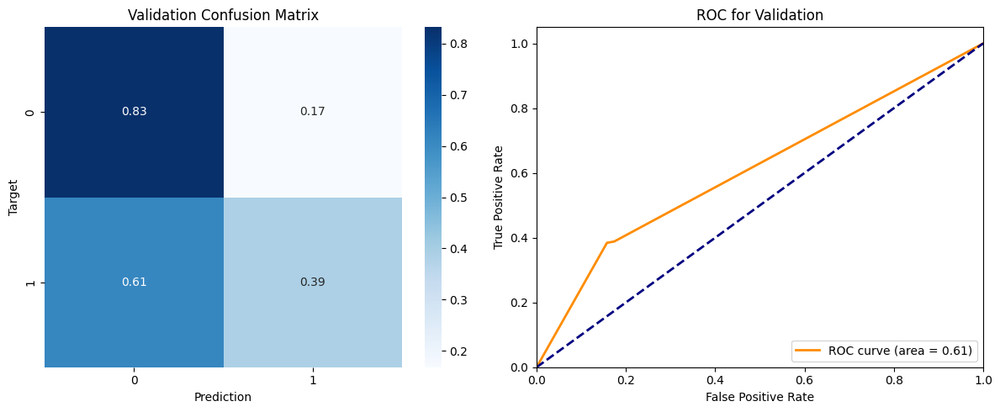

In [210]:
classify_analysis(train_targets_smotetomek, train_inputs_smotetomek, smotetomek_dt_model, 'Training')
classify_analysis(val_targets, val_inputs, smotetomek_dt_model, 'Validation')

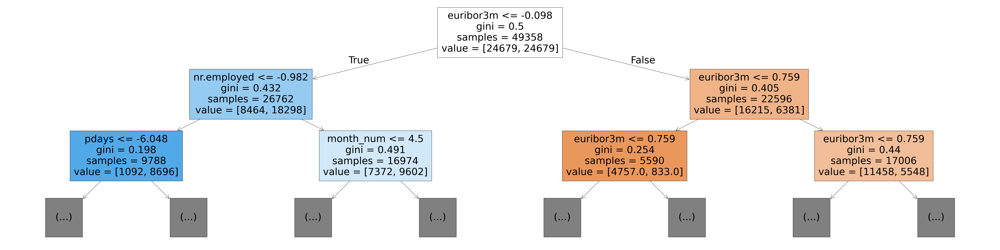

In [211]:
plt.figure(figsize=(80,20))
plot_tree(smotetomek_dt_model, feature_names = train_inputs_smotetomek.columns, max_depth = 2, filled = True);

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,0.3070
1,campaign,0.2299
0,age,0.1006
8,nr.employed,0.0546
15,day_of_week_code,0.0362
9,month_num,0.0321
16,education_code,0.0312
5,cons.price.idx,0.0211
17,job_admin.,0.0195
11,housing_code,0.0168


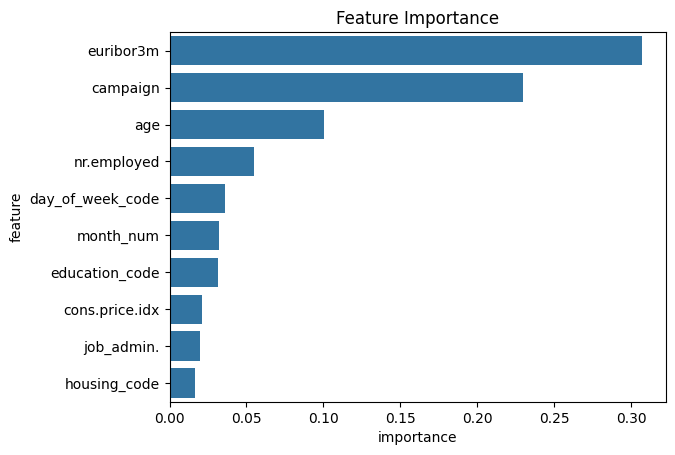

In [212]:
importance_features(train_inputs_smotetomek, smotetomek_dt_model, n = 20)

Modelling results on the balanced SMOTE, ADASYN and SMOTE-TOMEK datasets showed even poorer performance and deeper trees. The F1 score on the validation set ranged from 0.28 to 0.32, whilst recall and precision also fell to 0.39–0.42 and 0.27–0.32 respectively. As for AUROC, the ability to distinguish between classes deteriorated further, falling to 0.58–0.61.

Regarding feature importance, the top-5 set remained unchanged, although the degree of their influence varied.

### Models with tuned hyperparameters

In [213]:
random_param_dt = {
    'max_depth': [3, 5, 7, 10, 15, None],
    'min_samples_leaf': [1, 2, 5, 10],
    'min_samples_split': [2, 5, 10, 20],
    'max_features': [None, 'sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}

dt_random = RandomizedSearchCV(
    DecisionTreeClassifier(random_state = 42),
    random_param_dt,
    n_iter = 50,
    scoring = 'f1',
    cv = 5,
    n_jobs = -1,
    random_state = 42
)

#### Decision Tree with tuned hyperparameters on unbalanced data

In [214]:
basic_dt_random = dt_random.fit(train_inputs, train_targets)
basic_dt_random_model = basic_dt_random.best_estimator_

In [216]:
print("Найкращі параметри:", basic_dt_random.best_params_)
print("Найкращий CV F1:", round(basic_dt_random.best_score_, 4))

Найкращі параметри: {'min_samples_split': 2, 'min_samples_leaf': 10, 'max_features': 'log2', 'max_depth': 5, 'criterion': 'entropy'}
Найкращий CV F1: 0.2552


F1 score on Training: 0.2676
AUROC for Training: 0.7674

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9132    0.9917    0.9508     24861
           1     0.6924    0.1658    0.2676      2810

    accuracy                         0.9078     27671
   macro avg     0.8028    0.5788    0.6092     27671
weighted avg     0.8908    0.9078    0.8814     27671



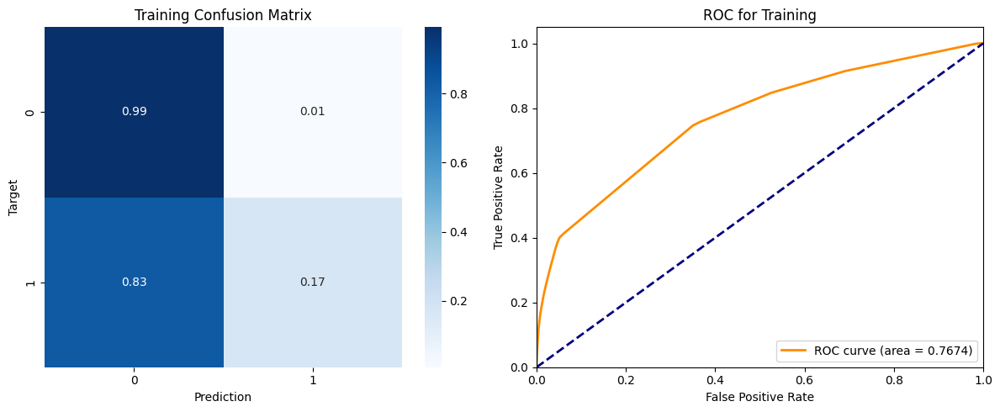

F1 score on Validation: 0.4015
AUROC for Validation: 0.7927

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8908    0.9776    0.9322      7899
           1     0.6805    0.2847    0.4015      1324

    accuracy                         0.8781      9223
   macro avg     0.7856    0.6312    0.6668      9223
weighted avg     0.8606    0.8781    0.8560      9223



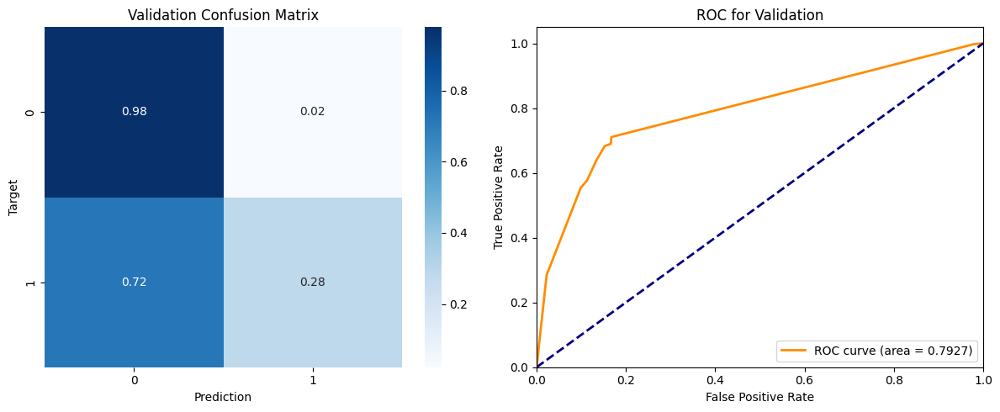

In [217]:
classify_analysis(train_targets, train_inputs, basic_dt_random_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_dt_random_model, 'Validation')

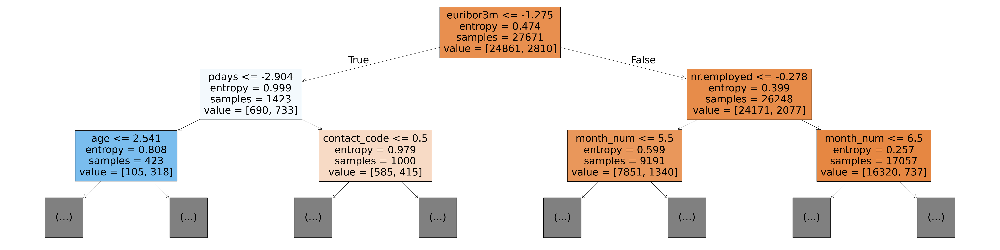

In [218]:
plt.figure(figsize=(80,20))
plot_tree(basic_dt_random_model, feature_names = train_inputs.columns, max_depth = 2, filled = True);

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,0.5195
8,nr.employed,0.2487
9,month_num,0.0947
2,pdays,0.0505
14,poutcome_code,0.0350
0,age,0.0273
13,contact_code,0.0067
4,emp.var.rate,0.0060
1,campaign,0.0053
27,job_unemployed,0.0018


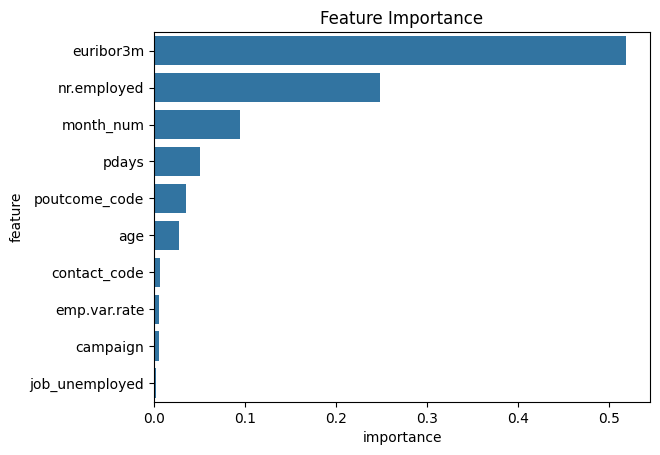

In [219]:
importance_features(train_inputs, basic_dt_random_model, 20)

#### Decision Tree with hyperparameters selected on balanced data using SMOTE

In [220]:
smote_dt_random = dt_random.fit(train_inputs_smote, train_targets_smote)
smote_dt_random_model = smote_dt_random.best_estimator_

In [221]:
print("Найкращі параметри:", smote_dt_random.best_params_)
print("Найкращий CV F1:", round(smote_dt_random.best_score_, 4))

Найкращі параметри: {'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': None, 'criterion': 'entropy'}
Найкращий CV F1: 0.6894


F1 score on Training: 0.9628
AUROC for Training: 0.9964

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9630    0.9626    0.9628     24861
           1     0.9626    0.9630    0.9628     24861

    accuracy                         0.9628     49722
   macro avg     0.9628    0.9628    0.9628     49722
weighted avg     0.9628    0.9628    0.9628     49722



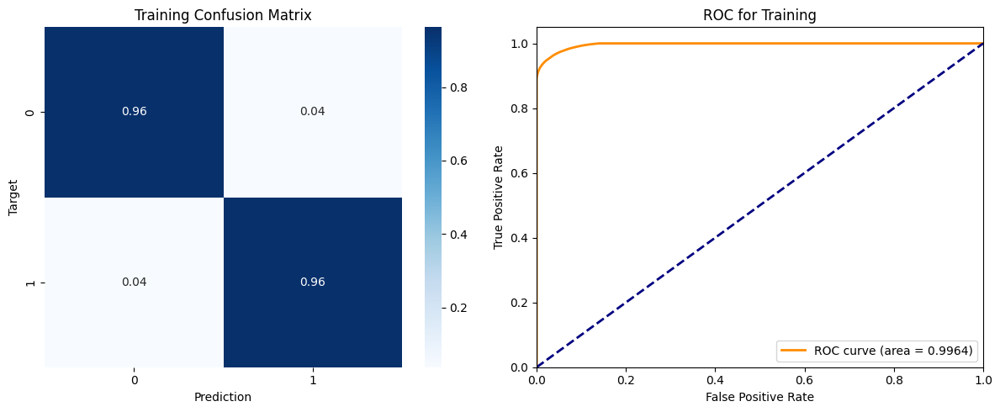

F1 score on Validation: 0.3583
AUROC for Validation: 0.6564

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8967    0.8463    0.8708      7899
           1     0.3133    0.4184    0.3583      1324

    accuracy                         0.7849      9223
   macro avg     0.6050    0.6324    0.6146      9223
weighted avg     0.8130    0.7849    0.7972      9223



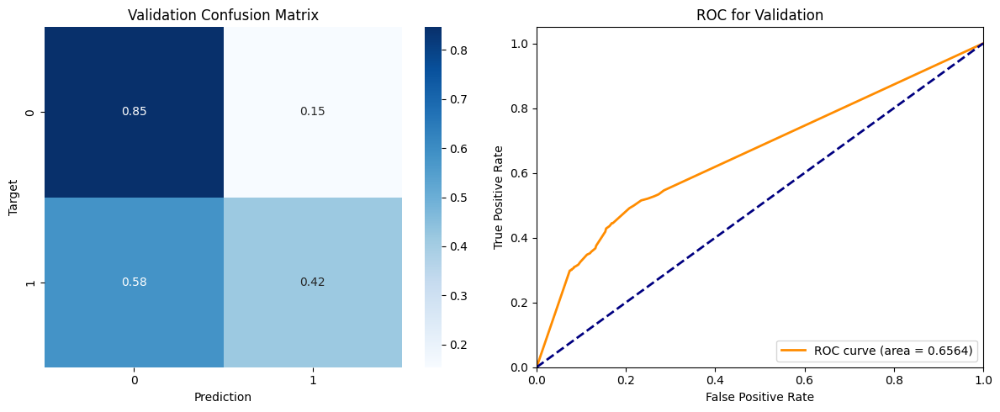

In [222]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_dt_random_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_dt_random_model, 'Validation')

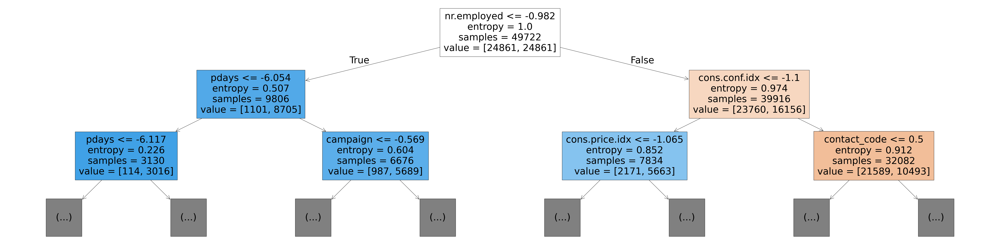

In [223]:
plt.figure(figsize=(80,20))
plot_tree(smote_dt_random_model, feature_names = train_inputs_smote.columns, max_depth = 2, filled = True);

TOP-20 найважливіших ознак


,feature,importance
1,campaign,0.2849
8,nr.employed,0.1332
7,euribor3m,0.1312
0,age,0.0924
6,cons.conf.idx,0.0701
5,cons.price.idx,0.0325
15,day_of_week_code,0.0320
16,education_code,0.0304
13,contact_code,0.0224
17,job_admin.,0.0199


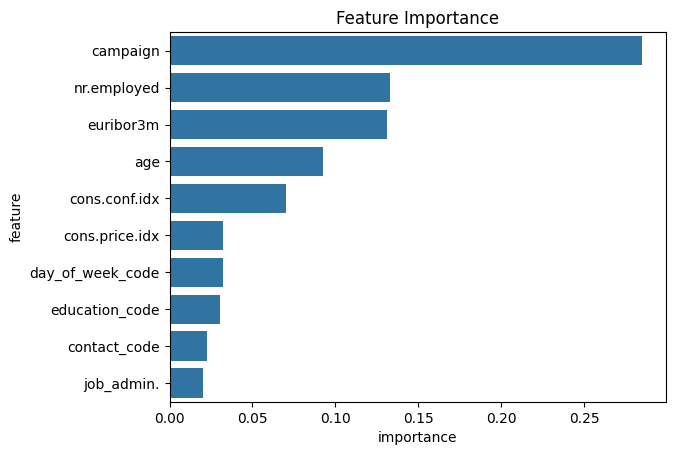

In [224]:
importance_features(train_inputs_smote, smote_dt_random_model, 20)

**General conclusions**

The best result among the Decision Tree models was achieved precisely through the selection of optimal hyperparameters on an unbalanced sample: F1 val = 0.40, AUROC = 0.79, recall = 0.28, precision = 0.68. The area under the ROC curve (0.79) is on a par with logistic regression and exceeds that of the baseline tree by 0.14.

As regards the importance of features, their composition has changed slightly, shifting towards macroeconomic features: the 3-month Euribor rate and the number of people in employment.

## Ensemble models

### Models with default settings

#### Random Forest on unbalanced data

In [225]:
rf_base = RandomForestClassifier(random_state = 42)
basic_rf_model = rf_base.fit(train_inputs, train_targets)

F1 score on Training: 0.97
AUROC for Training: 0.9997

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9949    0.9985    0.9967     24861
           1     0.9860    0.9544    0.9700      2810

    accuracy                         0.9940     27671
   macro avg     0.9904    0.9765    0.9833     27671
weighted avg     0.9940    0.9940    0.9940     27671



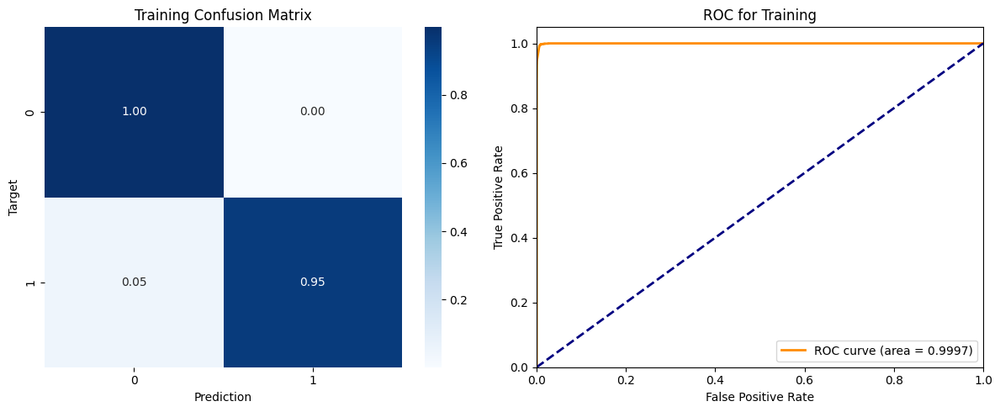

F1 score on Validation: 0.4287
AUROC for Validation: 0.7668

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8962    0.9611    0.9276      7899
           1     0.5918    0.3361    0.4287      1324

    accuracy                         0.8714      9223
   macro avg     0.7440    0.6486    0.6781      9223
weighted avg     0.8525    0.8714    0.8559      9223



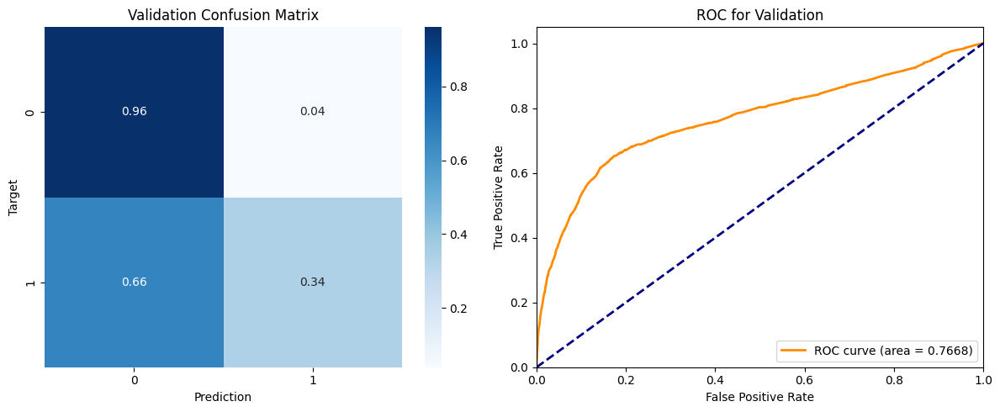

In [226]:
classify_analysis(train_targets, train_inputs, basic_rf_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_rf_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
0,age,0.2135
7,euribor3m,0.1336
1,campaign,0.0993
16,education_code,0.0733
15,day_of_week_code,0.0649
8,nr.employed,0.0442
11,housing_code,0.0406
14,poutcome_code,0.0298
6,cons.conf.idx,0.0279
2,pdays,0.0271


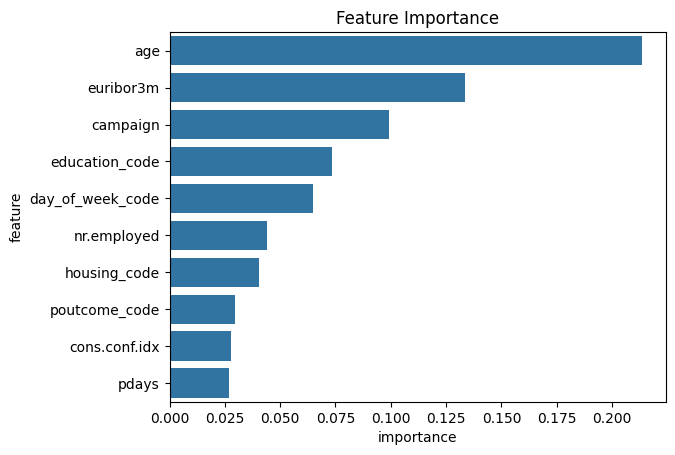

In [227]:
importance_features(train_inputs, basic_rf_model, 20)

#### Random Forest on balanced data using SMOTE

In [229]:
smote_rf_model = rf_base.fit(train_inputs_smote, train_targets_smote)

F1 score on Training: 0.9965
AUROC for Training: 0.9999

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9965    0.9965    0.9965     24861
           1     0.9965    0.9965    0.9965     24861

    accuracy                         0.9965     49722
   macro avg     0.9965    0.9965    0.9965     49722
weighted avg     0.9965    0.9965    0.9965     49722



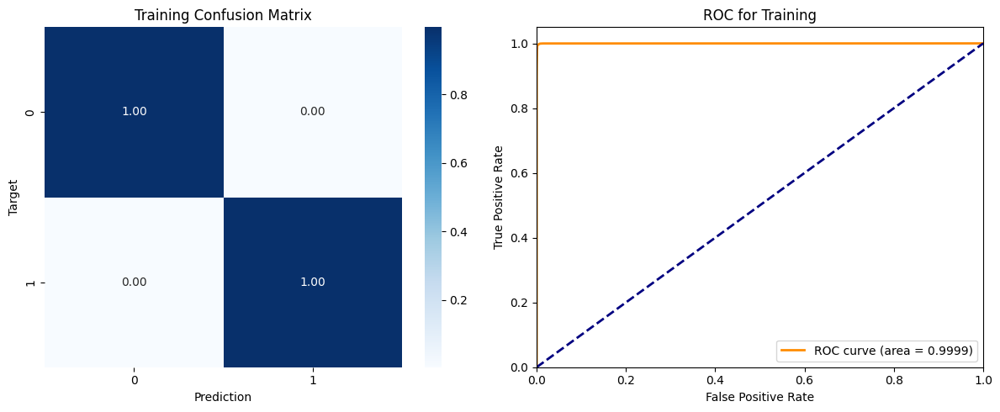

F1 score on Validation: 0.4517
AUROC for Validation: 0.7585

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9045    0.9294    0.9168      7899
           1     0.4959    0.4147    0.4517      1324

    accuracy                         0.8555      9223
   macro avg     0.7002    0.6720    0.6842      9223
weighted avg     0.8459    0.8555    0.8500      9223



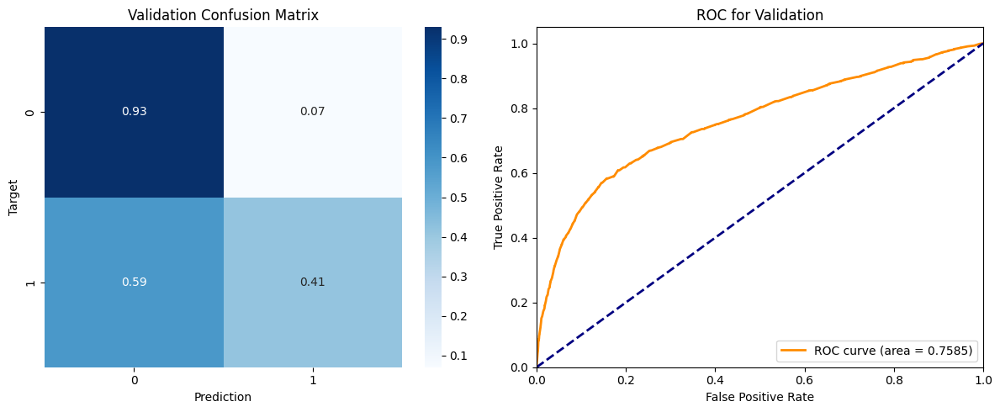

In [230]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_rf_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_rf_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,0.1692
1,campaign,0.1325
0,age,0.1184
15,day_of_week_code,0.0512
8,nr.employed,0.0480
16,education_code,0.0445
4,emp.var.rate,0.0435
5,cons.price.idx,0.0377
6,cons.conf.idx,0.0359
13,contact_code,0.0312


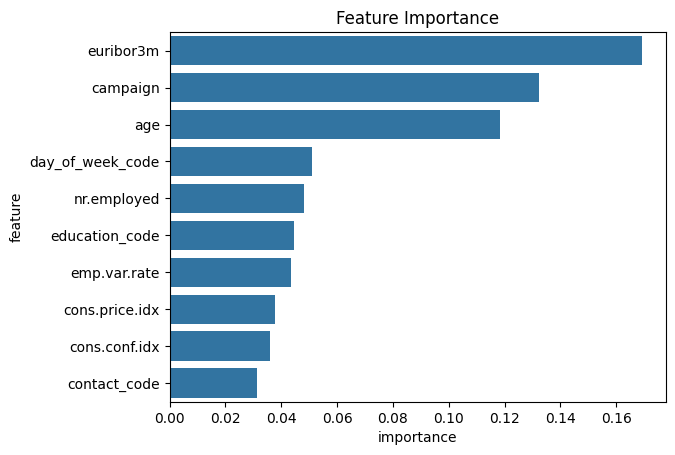

In [231]:
importance_features(train_inputs_smote, smote_rf_model, 20)

#### Random Forest on balanced data using ADASYN

In [232]:
adasyn_rf_model = rf_base.fit(train_inputs_adasyn, train_targets_adasyn)

F1 score on Training: 0.9965
AUROC for Training: 0.9999

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9965    0.9966    0.9965     24861
           1     0.9966    0.9964    0.9965     24673

    accuracy                         0.9965     49534
   macro avg     0.9965    0.9965    0.9965     49534
weighted avg     0.9965    0.9965    0.9965     49534



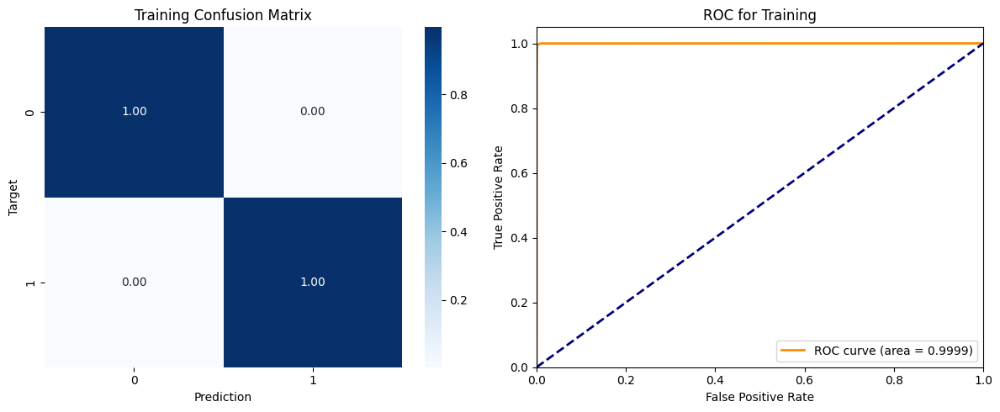

F1 score on Validation: 0.4419
AUROC for Validation: 0.751

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9017    0.9368    0.9189      7899
           1     0.5089    0.3905    0.4419      1324

    accuracy                         0.8584      9223
   macro avg     0.7053    0.6637    0.6804      9223
weighted avg     0.8453    0.8584    0.8504      9223



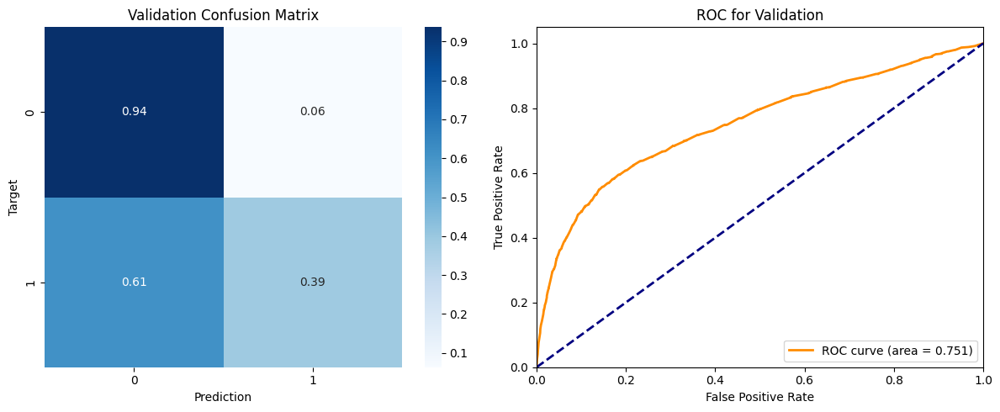

In [233]:
classify_analysis(train_targets_adasyn, train_inputs_adasyn, adasyn_rf_model, 'Training')
classify_analysis(val_targets, val_inputs, adasyn_rf_model, 'Validation')

TOP-10 найважливіших ознак


,feature,importance
7,euribor3m,0.1707
1,campaign,0.1538
0,age,0.1260
15,day_of_week_code,0.0555
16,education_code,0.0508
5,cons.price.idx,0.0333
17,job_admin.,0.0317
8,nr.employed,0.0299
18,job_blue-collar,0.0293
6,cons.conf.idx,0.0290


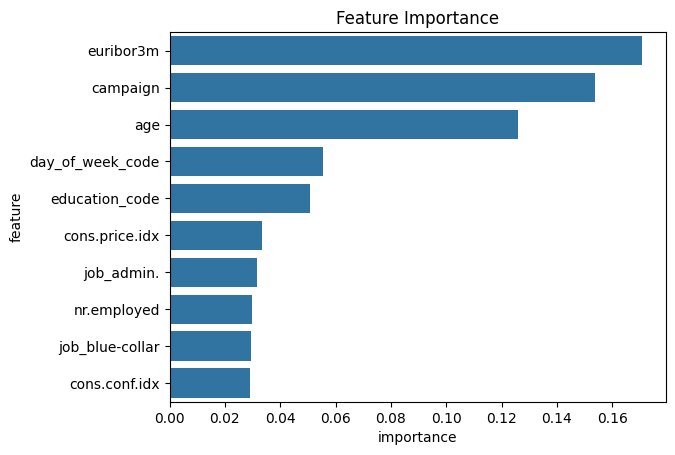

In [234]:
importance_features(train_inputs_adasyn, adasyn_rf_model)

#### Random Forest on balanced data using SMOTE-TOMEK

In [235]:
smotetomek_rf_model = rf_base.fit(train_inputs_smotetomek, train_targets_smotetomek)

F1 score on Training: 0.9965
AUROC for Training: 0.9999

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9961    0.9969    0.9965     24679
           1     0.9969    0.9961    0.9965     24679

    accuracy                         0.9965     49358
   macro avg     0.9965    0.9965    0.9965     49358
weighted avg     0.9965    0.9965    0.9965     49358



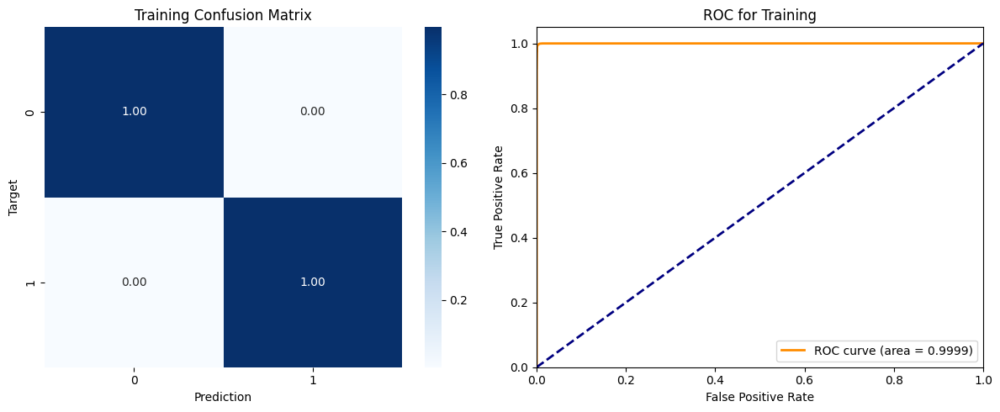

F1 score on Validation: 0.4453
AUROC for Validation: 0.7445

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9050    0.9192    0.9121      7899
           1     0.4683    0.4245    0.4453      1324

    accuracy                         0.8482      9223
   macro avg     0.6867    0.6719    0.6787      9223
weighted avg     0.8423    0.8482    0.8451      9223



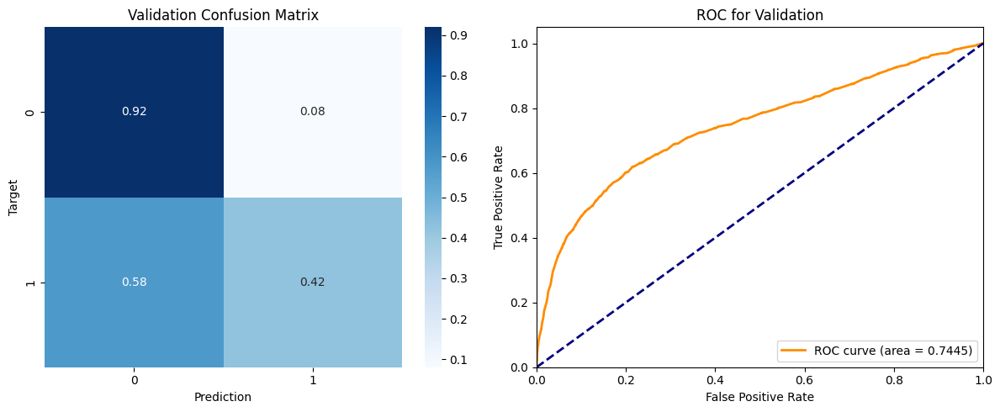

In [236]:
classify_analysis(train_targets_smotetomek, train_inputs_smotetomek, smotetomek_rf_model, 'Training')
classify_analysis(val_targets, val_inputs, smotetomek_rf_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,0.1695
1,campaign,0.1367
0,age,0.1150
15,day_of_week_code,0.0516
8,nr.employed,0.0484
16,education_code,0.0444
5,cons.price.idx,0.0385
6,cons.conf.idx,0.0381
4,emp.var.rate,0.0380
13,contact_code,0.0301


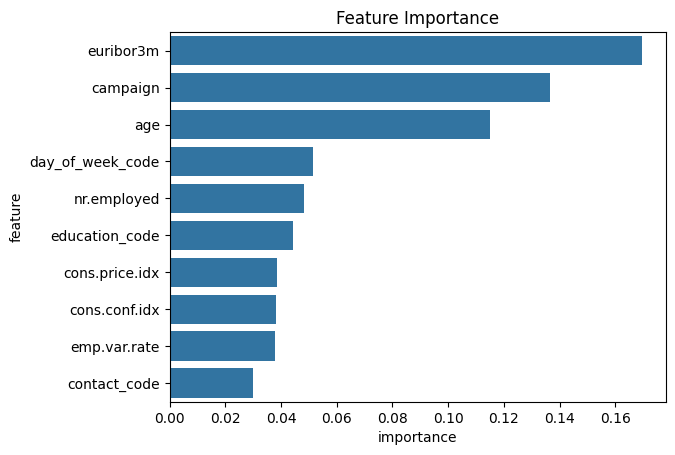

In [237]:
importance_features(train_inputs_smotetomek, smotetomek_rf_model, 20)

**General conclusions**

On an unbalanced data set, compared with a single decision tree, the ensemble approach significantly improved the AUROC (an increase of 0.12) and precision (an increase of 0.27) whilst maintaining similar recall. The key features identified were customer age, the Euribor rate and the number of contacts in the current campaign.

Data balancing improved recall by approximately 7–8 percentage points, but at the same time reduced precision and AUROC compared to the model trained on unbalanced data. There is virtually no difference between SMOTE, ADASYN and SMOTE-Tomek. As for the five most influential features, their composition remains unchanged.

#### XGBoost on unbalanced data

In [238]:
negative = (train_targets == 0).sum()
positive = (train_targets == 1).sum()
scale_pos_weight = negative / positive

base_xgb = XGBClassifier(
    max_depth = 35,
    n_estimators = 80,
    missing = np.nan,
    scale_pos_weight = scale_pos_weight,
    random_state = 42
)

In [239]:
basic_xgb_model = base_xgb.fit(train_inputs, train_targets)

F1 score on Training: 0.9663
AUROC for Training: 0.9998

Classification Report for Training:

              precision    recall  f1-score   support

           0     1.0000    0.9921    0.9960     24861
           1     0.9348    1.0000    0.9663      2810

    accuracy                         0.9929     27671
   macro avg     0.9674    0.9961    0.9812     27671
weighted avg     0.9934    0.9929    0.9930     27671



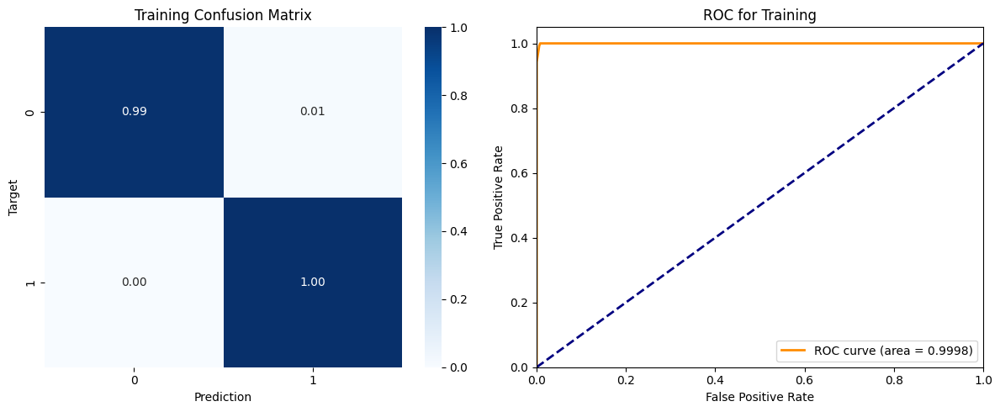

F1 score on Validation: 0.4199
AUROC for Validation: 0.7577

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8997    0.9247    0.9120      7899
           1     0.4615    0.3852    0.4199      1324

    accuracy                         0.8472      9223
   macro avg     0.6806    0.6549    0.6660      9223
weighted avg     0.8368    0.8472    0.8414      9223



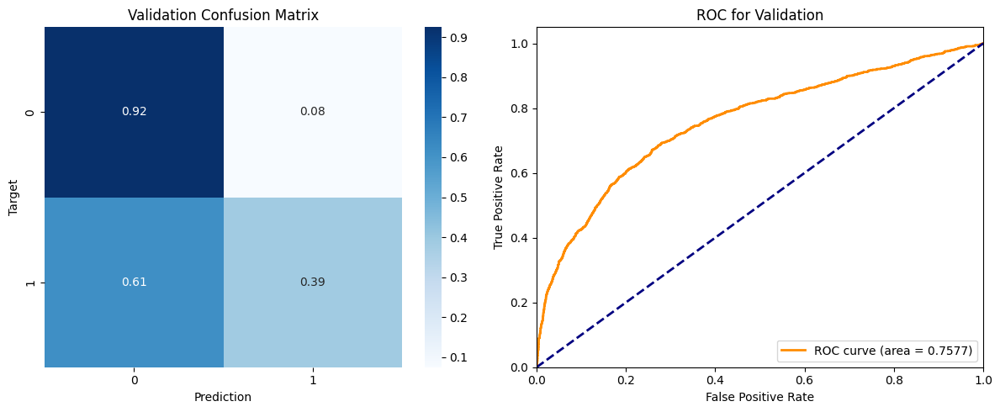

In [240]:
classify_analysis(train_targets, train_inputs, basic_xgb_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_xgb_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
4,emp.var.rate,0.2444
8,nr.employed,0.0862
1,campaign,0.0723
5,cons.price.idx,0.0469
13,contact_code,0.0432
14,poutcome_code,0.0366
20,job_housemaid,0.0355
19,job_entrepreneur,0.0335
28,marital_divorced,0.0326
18,job_blue-collar,0.0287


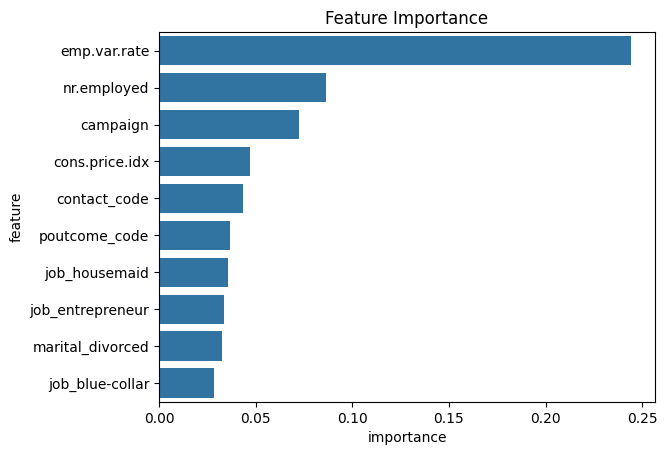

In [318]:
importance_features(train_inputs, basic_xgb_model, 20)

#### XGBoost on balanced data using SMOTE

In [241]:
smote_xgb_model = base_xgb.fit(train_inputs_smote, train_targets_smote)

F1 score on Training: 0.9959
AUROC for Training: 1.0

Classification Report for Training:

              precision    recall  f1-score   support

           0     1.0000    0.9918    0.9959     24861
           1     0.9918    1.0000    0.9959     24861

    accuracy                         0.9959     49722
   macro avg     0.9959    0.9959    0.9959     49722
weighted avg     0.9959    0.9959    0.9959     49722



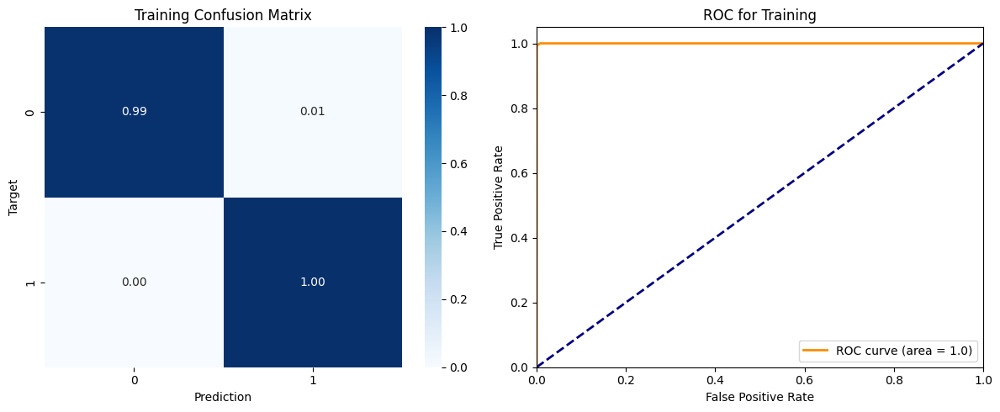

F1 score on Validation: 0.4396
AUROC for Validation: 0.7485

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9092    0.8872    0.8981      7899
           1     0.4119    0.4713    0.4396      1324

    accuracy                         0.8275      9223
   macro avg     0.6605    0.6793    0.6688      9223
weighted avg     0.8378    0.8275    0.8322      9223



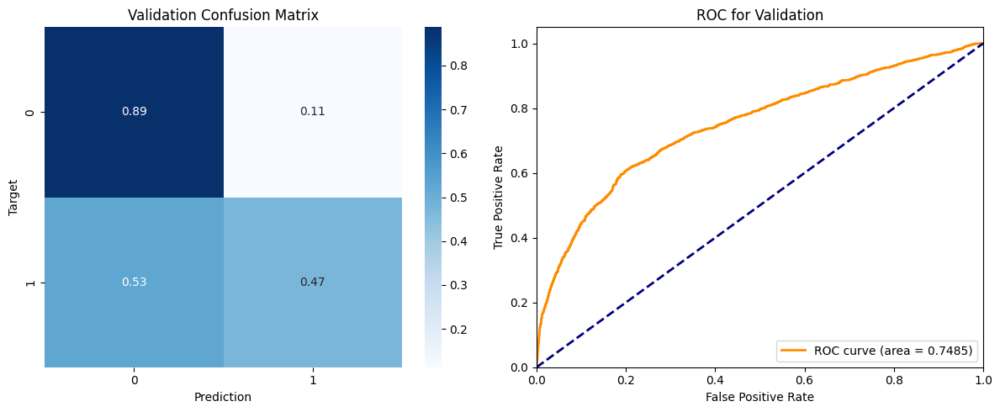

In [242]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_xgb_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_xgb_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
4,emp.var.rate,0.2444
8,nr.employed,0.0862
1,campaign,0.0723
5,cons.price.idx,0.0469
13,contact_code,0.0432
14,poutcome_code,0.0366
20,job_housemaid,0.0355
19,job_entrepreneur,0.0335
28,marital_divorced,0.0326
18,job_blue-collar,0.0287


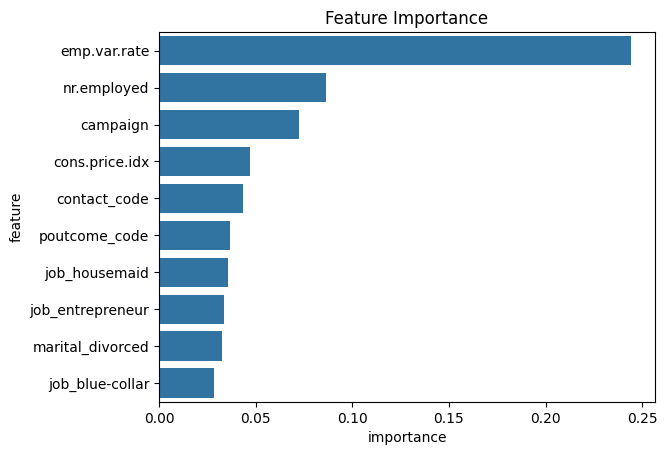

In [319]:
importance_features(train_inputs_smote, smote_xgb_model, 20)

#### XGBoost on balanced data using ADASYN

In [243]:
adasyn_xgb_model = base_xgb.fit(train_inputs_adasyn, train_targets_adasyn)

F1 score on Training: 0.9958
AUROC for Training: 1.0

Classification Report for Training:

              precision    recall  f1-score   support

           0     1.0000    0.9916    0.9958     24861
           1     0.9916    1.0000    0.9958     24673

    accuracy                         0.9958     49534
   macro avg     0.9958    0.9958    0.9958     49534
weighted avg     0.9958    0.9958    0.9958     49534



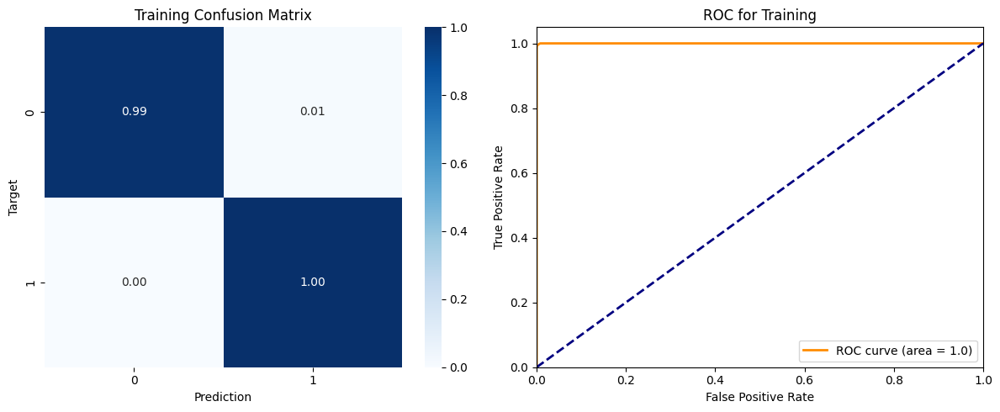

F1 score on Validation: 0.4241
AUROC for Validation: 0.7454

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9041    0.8990    0.9015      7899
           1     0.4171    0.4313    0.4241      1324

    accuracy                         0.8318      9223
   macro avg     0.6606    0.6651    0.6628      9223
weighted avg     0.8342    0.8318    0.8330      9223



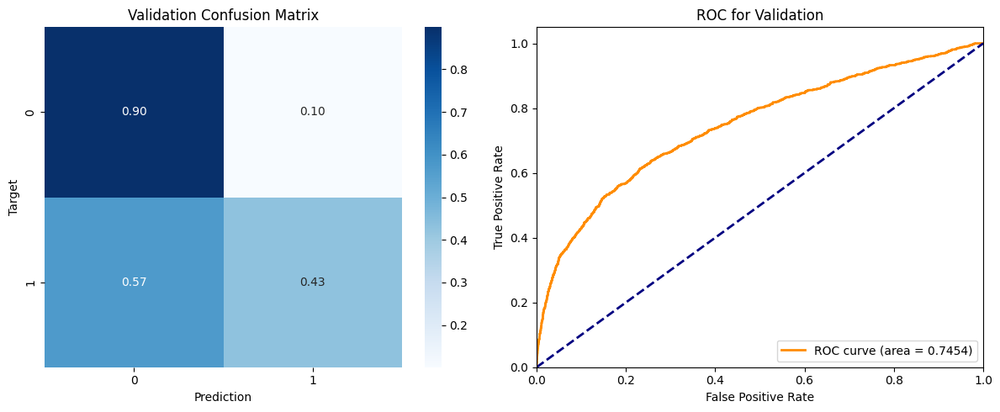

In [244]:
classify_analysis(train_targets_adasyn, train_inputs_adasyn, adasyn_xgb_model, 'Training')
classify_analysis(val_targets, val_inputs, adasyn_xgb_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
4,emp.var.rate,0.2444
8,nr.employed,0.0862
1,campaign,0.0723
5,cons.price.idx,0.0469
13,contact_code,0.0432
14,poutcome_code,0.0366
20,job_housemaid,0.0355
19,job_entrepreneur,0.0335
28,marital_divorced,0.0326
18,job_blue-collar,0.0287


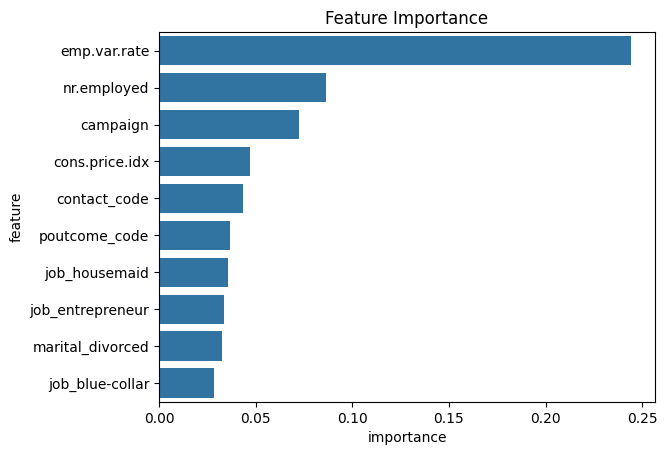

In [320]:
importance_features(train_inputs_adasyn, adasyn_xgb_model, 20)

#### XGBoost on balanced data using SMOTE-TOMEK

In [245]:
smotetomek_xgb_model = base_xgb.fit(train_inputs_smotetomek, train_targets_smotetomek)

F1 score on Training: 0.9958
AUROC for Training: 1.0

Classification Report for Training:

              precision    recall  f1-score   support

           0     1.0000    0.9916    0.9958     24679
           1     0.9917    1.0000    0.9958     24679

    accuracy                         0.9958     49358
   macro avg     0.9958    0.9958    0.9958     49358
weighted avg     0.9958    0.9958    0.9958     49358



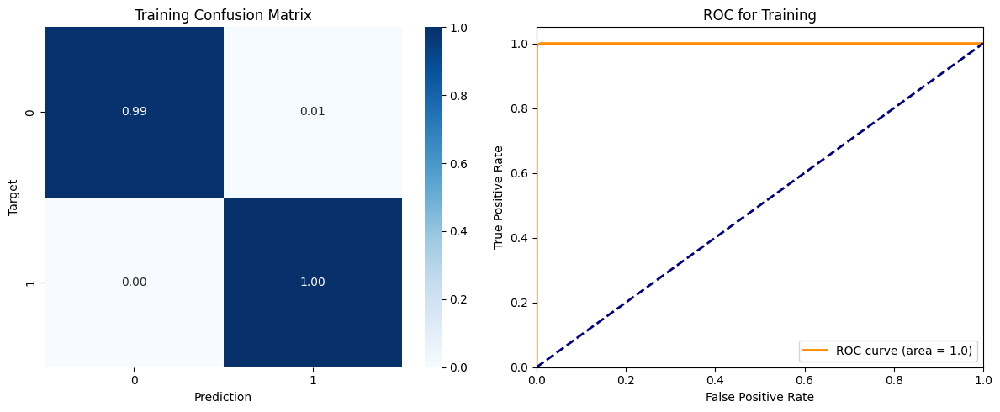

F1 score on Validation: 0.4361
AUROC for Validation: 0.7503

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9065    0.8988    0.9027      7899
           1     0.4256    0.4471    0.4361      1324

    accuracy                         0.8340      9223
   macro avg     0.6661    0.6730    0.6694      9223
weighted avg     0.8375    0.8340    0.8357      9223



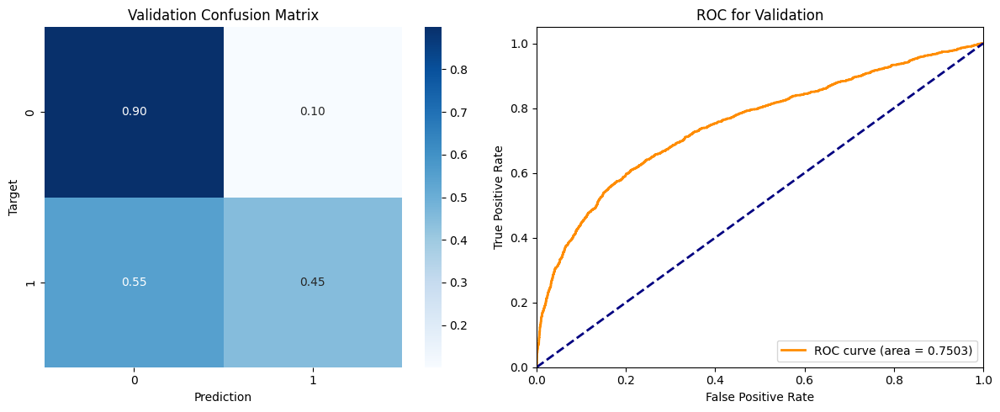

In [246]:
classify_analysis(train_targets_smotetomek, train_inputs_smotetomek, smotetomek_xgb_model, 'Training')
classify_analysis(val_targets, val_inputs, smotetomek_xgb_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
4,emp.var.rate,0.2444
8,nr.employed,0.0862
1,campaign,0.0723
5,cons.price.idx,0.0469
13,contact_code,0.0432
14,poutcome_code,0.0366
20,job_housemaid,0.0355
19,job_entrepreneur,0.0335
28,marital_divorced,0.0326
18,job_blue-collar,0.0287


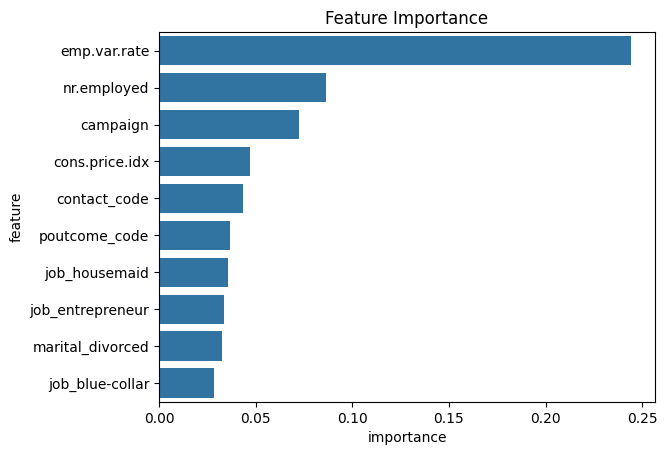

In [321]:
importance_features(train_inputs_smotetomek, smotetomek_xgb_model, 20)

**General conclusions**

On an unbalanced dataset using `scale_pos_weight`, XGBoost achieved an F1 score of 0.42, a recall of 0.39, a precision of 0.46 and an AUROC of 0.76. Among the key features, the rate of change in employment dominates, with a weighting three times greater than the next feature (number of people in employment), indicating the exceptional influence of this feature specifically for XGB. The top five also include the number of contacts in the current campaign, the consumer price index and the method of communication.

Balancing using SMOTE, ADASYN and SMOTE-Tomek did not yield any improvement in any of the metrics: F1 ranges from 0.42 to 0.44, recall from 0.39 to 0.47, and AUROC from 0.74 to 0.75. The composition and order of the top five features are identical across all four variants, confirming that `scale_pos_weight` is sufficient for handling class imbalance.

#### LightGBM on unbalanced data

In [381]:
base_lgb = lgb.LGBMClassifier(
    max_depth = 35,
    n_estimators = 80,
    scale_pos_weight = scale_pos_weight,
    random_state = 42
)

In [382]:
basic_lgb_model = base_lgb.fit(train_inputs, train_targets, eval_set = [(val_inputs, val_targets)])

[LightGBM] [Info] Number of positive: 2810, number of negative: 24861
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 328
[LightGBM] [Info] Number of data points in the train set: 27671, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.101550 -> initscore=-2.180116
[LightGBM] [Info] Start training from score -2.180116


F1 score on Training: 0.4814
AUROC for Training: 0.8743

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9615    0.8657    0.9111     24861
           1     0.3686    0.6936    0.4814      2810

    accuracy                         0.8483     27671
   macro avg     0.6651    0.7797    0.6963     27671
weighted avg     0.9013    0.8483    0.8675     27671



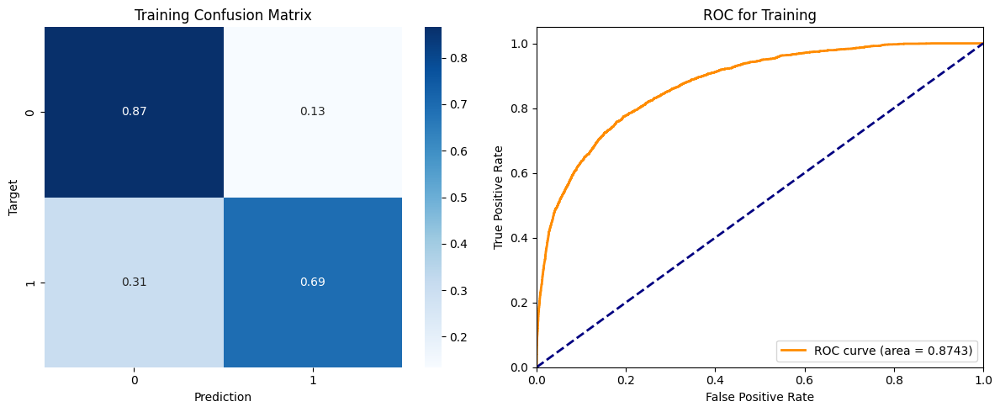

F1 score on Validation: 0.5278
AUROC for Validation: 0.7926

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9450    0.8357    0.8870      7899
           1     0.4200    0.7100    0.5278      1324

    accuracy                         0.8176      9223
   macro avg     0.6825    0.7728    0.7074      9223
weighted avg     0.8697    0.8176    0.8354      9223



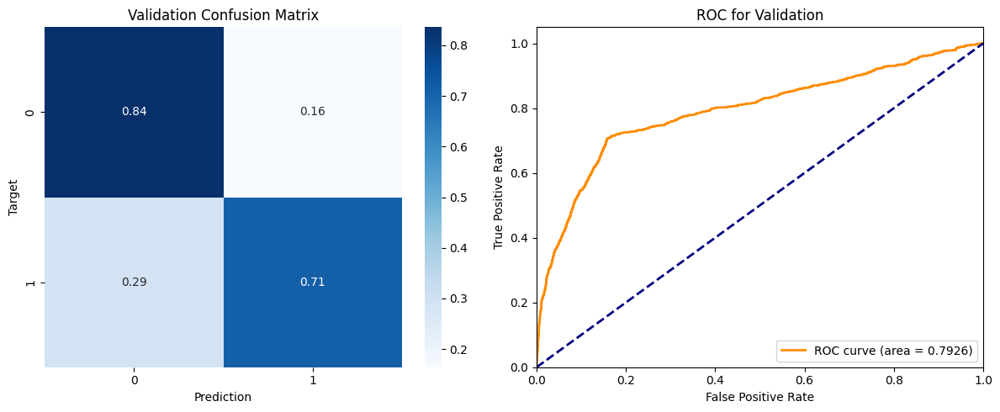

In [383]:
classify_analysis(train_targets, train_inputs, basic_lgb_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_lgb_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
0,age,476
7,euribor3m,399
1,campaign,276
15,day_of_week_code,184
16,education_code,155
6,cons.conf.idx,81
5,cons.price.idx,74
2,pdays,73
13,contact_code,66
14,poutcome_code,60


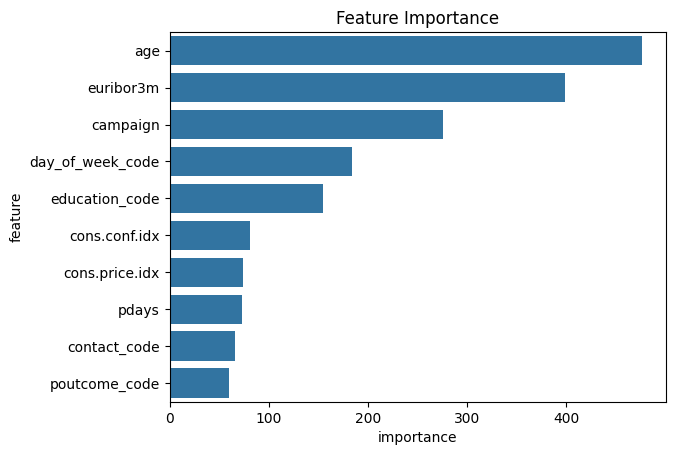

In [384]:
importance_features(train_inputs, basic_lgb_model, 20)

#### LightGBM on SMOTE-balanced data

In [250]:
smote_lgb_model = base_lgb.fit(train_inputs_smote, train_targets_smote, eval_set = [(val_inputs, val_targets)])

[LightGBM] [Info] Number of positive: 24861, number of negative: 24861
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5457
[LightGBM] [Info] Number of data points in the train set: 49722, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


F1 score on Training: 0.8407
AUROC for Training: 0.9736

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9714    0.6473    0.7769     24861
           1     0.7356    0.9810    0.8407     24861

    accuracy                         0.8141     49722
   macro avg     0.8535    0.8141    0.8088     49722
weighted avg     0.8535    0.8141    0.8088     49722



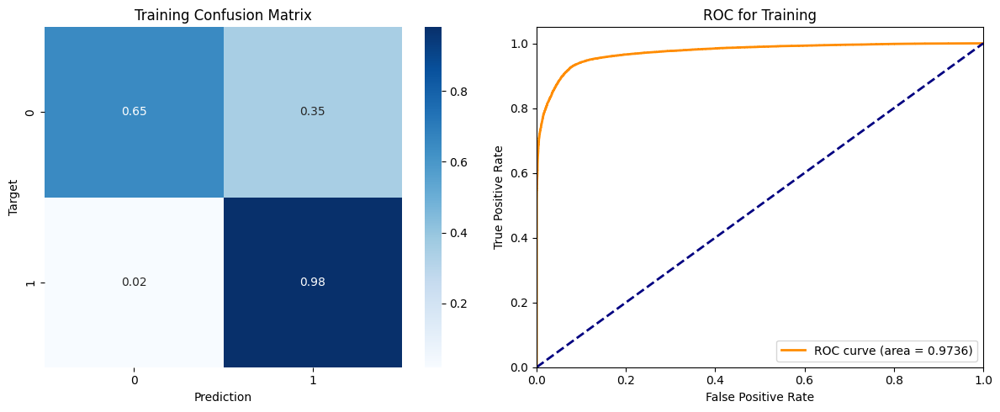

F1 score on Validation: 0.3467
AUROC for Validation: 0.7919

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9469    0.5030    0.6570      7899
           1     0.2190    0.8316    0.3467      1324

    accuracy                         0.5501      9223
   macro avg     0.5829    0.6673    0.5018      9223
weighted avg     0.8424    0.5501    0.6124      9223



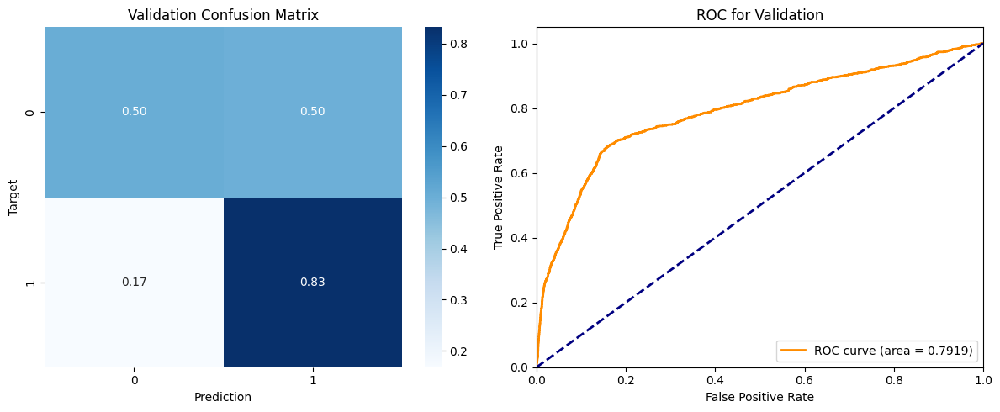

In [251]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_lgb_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_lgb_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
0,age,474
1,campaign,443
7,euribor3m,421
5,cons.price.idx,81
15,day_of_week_code,81
16,education_code,67
17,job_admin.,55
28,marital_divorced,52
29,marital_married,51
18,job_blue-collar,48


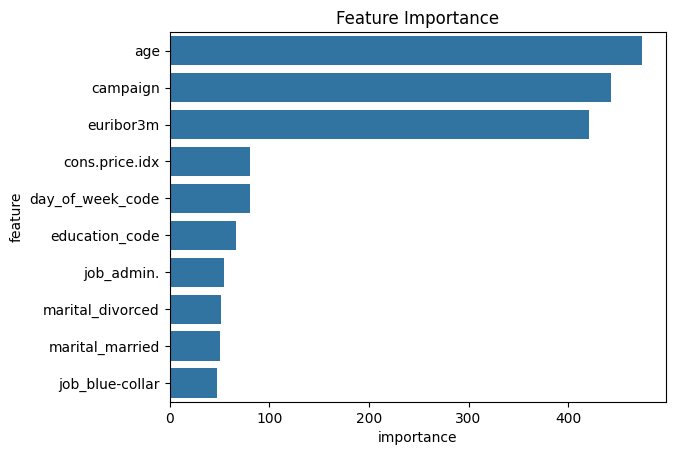

In [323]:
importance_features(train_inputs_smote, smote_lgb_model, 20)

#### LightGBM on balanced data based on ADASYN

In [252]:
adasyn_lgb_model = base_lgb.fit(train_inputs_adasyn, train_targets_adasyn, eval_set = [(val_inputs, val_targets)])

[LightGBM] [Info] Number of positive: 24673, number of negative: 24861
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5437
[LightGBM] [Info] Number of data points in the train set: 49534, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.498102 -> initscore=-0.007591
[LightGBM] [Info] Start training from score -0.007591


F1 score on Training: 0.9902
AUROC for Training: 0.9987

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9904    0.9902    0.9903     24861
           1     0.9901    0.9903    0.9902     24673

    accuracy                         0.9902     49534
   macro avg     0.9902    0.9902    0.9902     49534
weighted avg     0.9902    0.9902    0.9902     49534



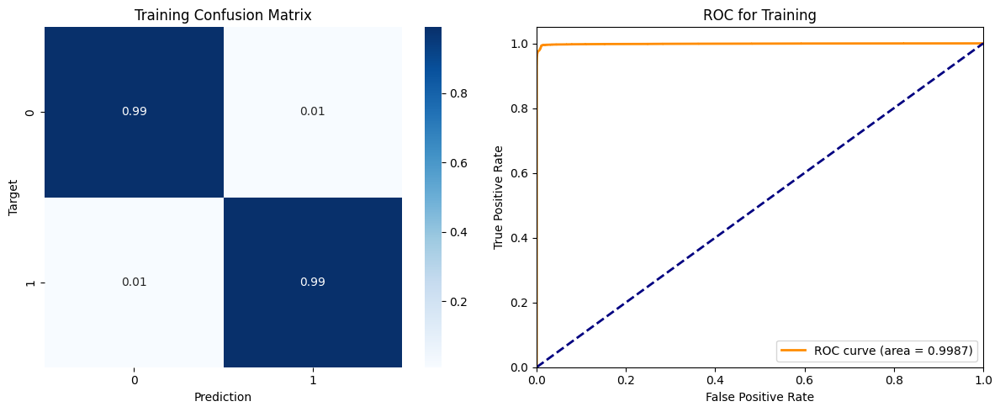

F1 score on Validation: 0.4361
AUROC for Validation: 0.7503

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9065    0.8988    0.9027      7899
           1     0.4256    0.4471    0.4361      1324

    accuracy                         0.8340      9223
   macro avg     0.6661    0.6730    0.6694      9223
weighted avg     0.8375    0.8340    0.8357      9223



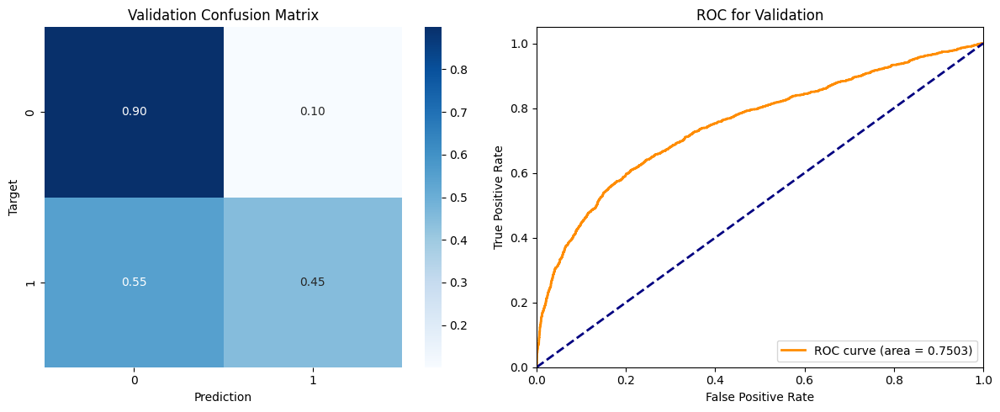

In [253]:
classify_analysis(train_targets_adasyn, train_inputs_adasyn, adasyn_xgb_model, 'Training')
classify_analysis(val_targets, val_inputs, adasyn_xgb_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
4,emp.var.rate,0.2444
8,nr.employed,0.0862
1,campaign,0.0723
5,cons.price.idx,0.0469
13,contact_code,0.0432
14,poutcome_code,0.0366
20,job_housemaid,0.0355
19,job_entrepreneur,0.0335
28,marital_divorced,0.0326
18,job_blue-collar,0.0287


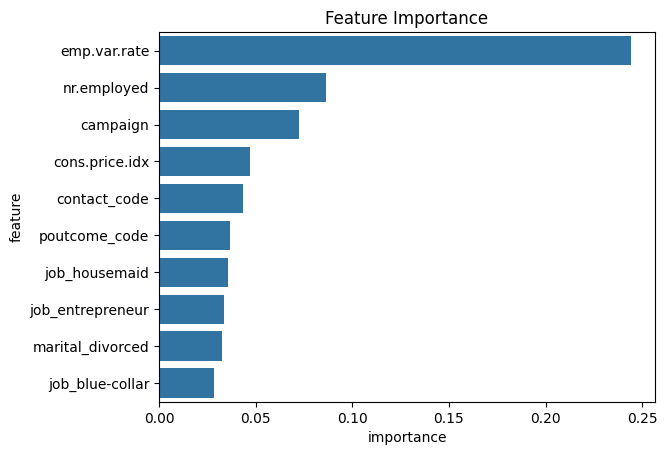

In [324]:
importance_features(train_inputs_adasyn, adasyn_xgb_model, 20)

#### LightGBM on balanced data using SMOTE-TOMEK

In [254]:
smotetomek_lgb_model = base_lgb.fit(train_inputs_smotetomek, train_targets_smotetomek, eval_set = [(val_inputs, val_targets)])

[LightGBM] [Info] Number of positive: 24679, number of negative: 24679
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5457
[LightGBM] [Info] Number of data points in the train set: 49358, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


F1 score on Training: 0.8429
AUROC for Training: 0.9745

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9743    0.6508    0.7804     24679
           1     0.7379    0.9829    0.8429     24679

    accuracy                         0.8168     49358
   macro avg     0.8561    0.8168    0.8117     49358
weighted avg     0.8561    0.8168    0.8117     49358



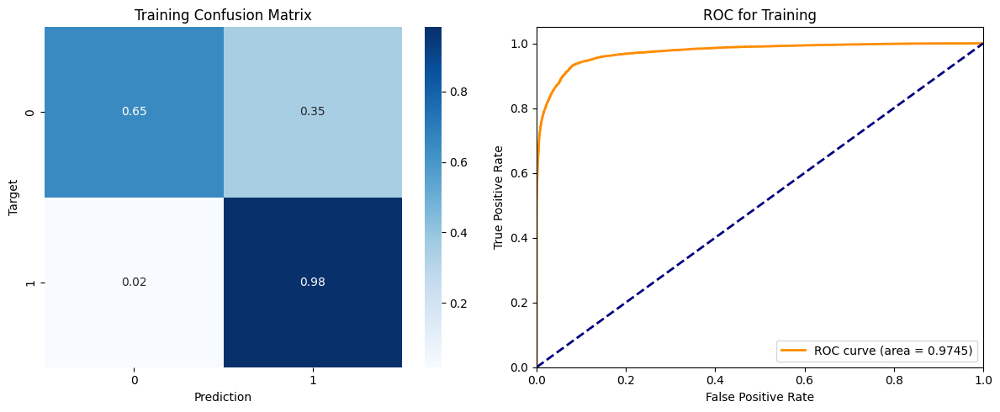

F1 score on Validation: 0.3586
AUROC for Validation: 0.795

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9478    0.5355    0.6844      7899
           1     0.2292    0.8240    0.3586      1324

    accuracy                         0.5769      9223
   macro avg     0.5885    0.6798    0.5215      9223
weighted avg     0.8446    0.5769    0.6376      9223



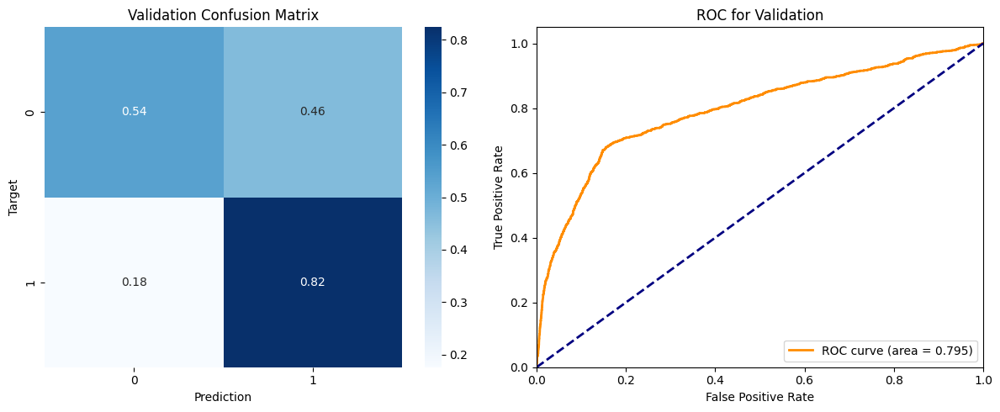

In [255]:
classify_analysis(train_targets_smotetomek, train_inputs_smotetomek, smotetomek_lgb_model, 'Training')
classify_analysis(val_targets, val_inputs, smotetomek_lgb_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
0,age,474
1,campaign,443
7,euribor3m,421
5,cons.price.idx,81
15,day_of_week_code,81
16,education_code,67
17,job_admin.,55
28,marital_divorced,52
29,marital_married,51
18,job_blue-collar,48


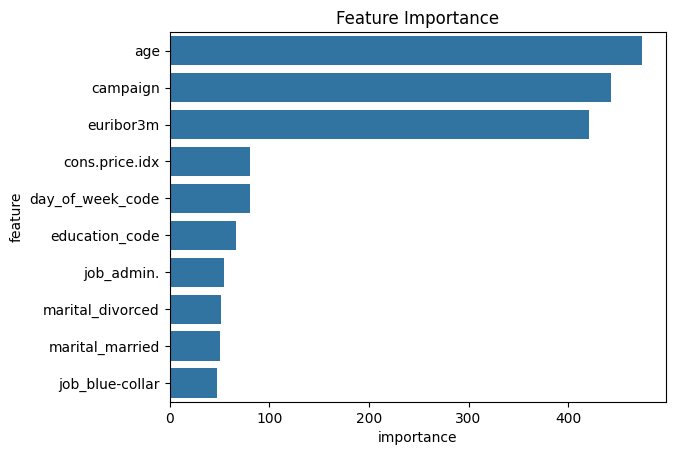

In [325]:
importance_features(train_inputs_smotetomek, smotetomek_lgb_model, 20)

**General conclusions**

On an unbalanced sample with `scale_pos_weight`, LightGBM achieved an F1 score of 0.528, recall of 0.71, precision of 0.42 and AUROC of 0.79 — the highest F1 score among all models in Experiment Group 1. A recall of 0.71 is the best result among all unbalanced variants in the project.

Regarding the importance of features, they are distributed more evenly than in XGBoost; these include the customer’s age, the number of contacts in the current campaign, the 3-month Euribor rate, the consumer price index and the day of the week.

Balancing using SMOTE and SMOTE-Tomek led to a sharp drop in F1 (to 0.35–0.36) and precision (to 0.22–0.23), whilst maintaining AUROC at 0.79–0.80. ADASYN delivered the best result (F1 = 0.43), but did not come close to the baseline model

### Models with tuned hyperparameters

#### Random Forest on balanced data using SMOTE

In [256]:
random_param_rf = {
    'n_estimators': [100, 200, 300, 500, 1000],
    'max_depth': [3, 5, 10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
}


rf_random = RandomizedSearchCV(
    RandomForestClassifier(random_state = 42),
    random_param_rf,
    n_iter = 50,
    scoring = 'f1',
    cv = 5,
    random_state = 42,
    n_jobs = -1
)


In [257]:
smote_rf_random = rf_random.fit(train_inputs_smote, train_targets_smote)
smote_rf_random_model = smote_rf_random.best_estimator_

In [258]:
print("Найкращі параметри:", smote_rf_random.best_params_)
print("Найкращий CV F1:", round(smote_rf_random.best_score_, 4))

Найкращі параметри: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': None, 'bootstrap': False}
Найкращий CV F1: 0.7069


F1 score on Training: 0.9824
AUROC for Training: 0.9993

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9733    0.9922    0.9827     24861
           1     0.9921    0.9728    0.9824     24861

    accuracy                         0.9825     49722
   macro avg     0.9827    0.9825    0.9825     49722
weighted avg     0.9827    0.9825    0.9825     49722



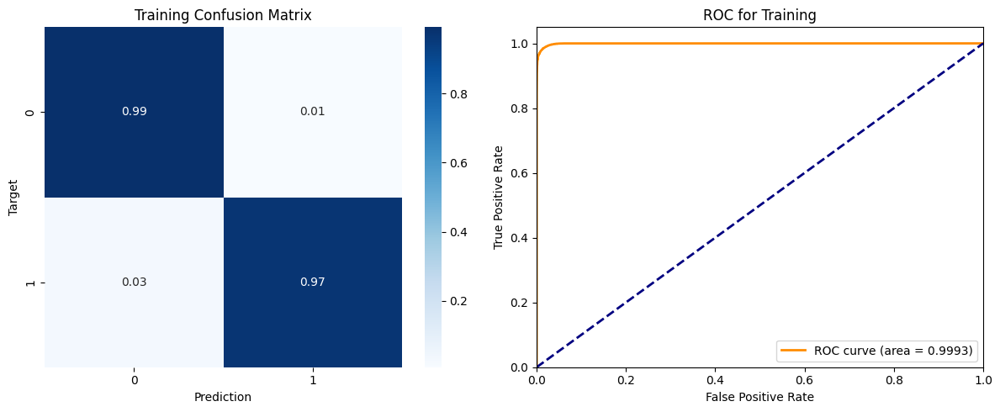

F1 score on Validation: 0.4681
AUROC for Validation: 0.7608

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9081    0.9257    0.9168      7899
           1     0.4987    0.4411    0.4681      1324

    accuracy                         0.8561      9223
   macro avg     0.7034    0.6834    0.6925      9223
weighted avg     0.8493    0.8561    0.8524      9223



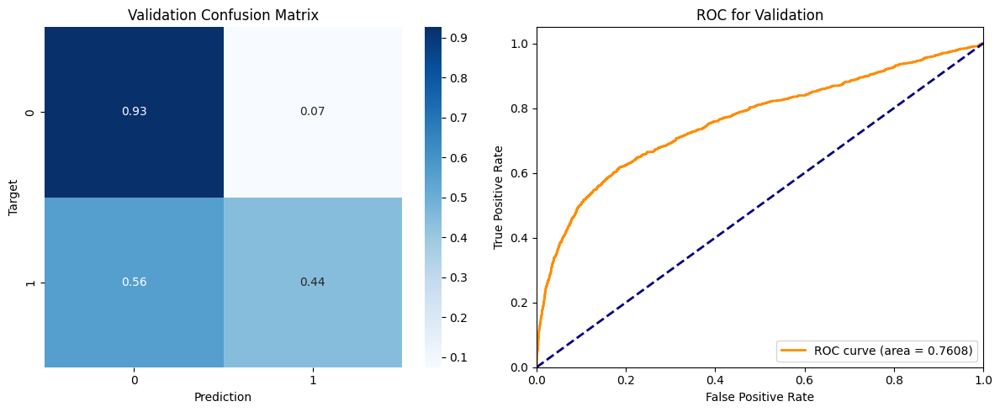

In [259]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_rf_random_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_rf_random_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,0.1630
1,campaign,0.1304
0,age,0.0885
8,nr.employed,0.0590
4,emp.var.rate,0.0528
5,cons.price.idx,0.0457
15,day_of_week_code,0.0455
6,cons.conf.idx,0.0391
16,education_code,0.0365
18,job_blue-collar,0.0326


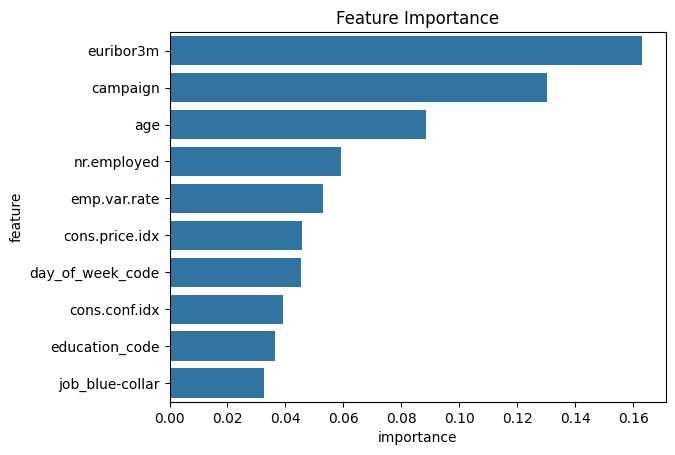

In [260]:
importance_features(train_inputs_smote, smote_rf_random_model, 20)

Following the tuning of the hyperparameters, the quality of the RandomForest model improved: F1 score = 0.47, recall = 0.44, precision = 0.50. However, the area under the ROC curve remains lower than that of the unbalanced baseline model.

In terms of feature importance, the three most important features are the 3-month Euribor rate, the number of contacts in the current campaign, and the customer’s age.

#### XGBoost with hyperparameters selected using Randomised Search

In [ ]:
random_param_xgb = {
    'n_estimators': [100, 200, 300, 500, 800],
    'max_depth': [3, 5, 7, 10, 15, 35],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.3, 0.5],
    'min_child_weight': [1, 3, 5],
    'scale_pos_weight': [scale_pos_weight, scale_pos_weight * 0.5, scale_pos_weight * 1.5, scale_pos_weight * 0.1]
}


xgb_random = RandomizedSearchCV(
    XGBClassifier(random_state = 42),
    random_param_xgb,
    n_iter = 50,
    scoring = 'f1',
    cv = 5,
    verbose = 2,
    random_state = 42,
    n_jobs = -1
)

In [262]:
smote_xgb_random = xgb_random.fit(train_inputs_smote, train_targets_smote)
smote_xgb_random_model = smote_xgb_random.best_estimator_

Fitting 5 folds for each of 50 candidates, totalling 250 fits


In [263]:
print("Найкращі параметри:", smote_xgb_random.best_params_)
print("Найкращий CV F1:", round(smote_xgb_random.best_score_, 4))

Найкращі параметри: {'subsample': 0.8, 'scale_pos_weight': np.float64(13.270996441281138), 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 35, 'learning_rate': 0.05, 'gamma': 0.3, 'colsample_bytree': 0.6}
Найкращий CV F1: 0.6994


F1 score on Training: 0.9759
AUROC for Training: 0.9995

Classification Report for Training:

              precision    recall  f1-score   support

           0     1.0000    0.9507    0.9747     24861
           1     0.9530    1.0000    0.9759     24861

    accuracy                         0.9753     49722
   macro avg     0.9765    0.9753    0.9753     49722
weighted avg     0.9765    0.9753    0.9753     49722



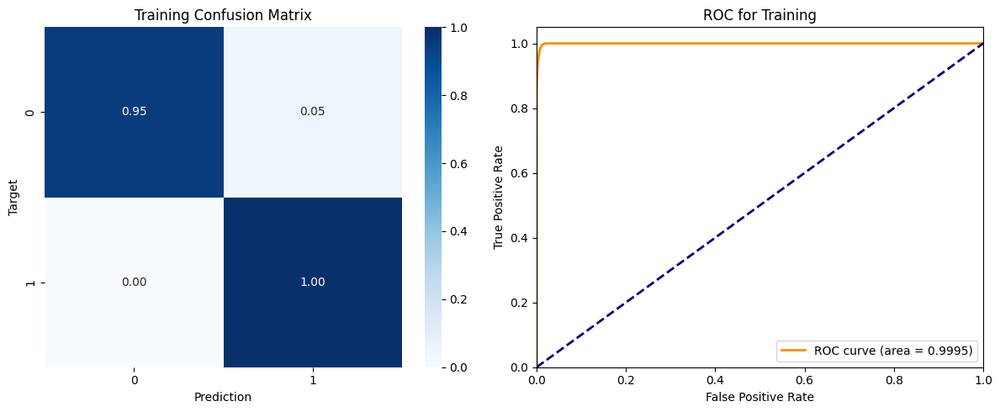

F1 score on Validation: 0.4725
AUROC for Validation: 0.7726

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9293    0.8300    0.8768      7899
           1     0.3805    0.6231    0.4725      1324

    accuracy                         0.8003      9223
   macro avg     0.6549    0.7265    0.6747      9223
weighted avg     0.8505    0.8003    0.8188      9223



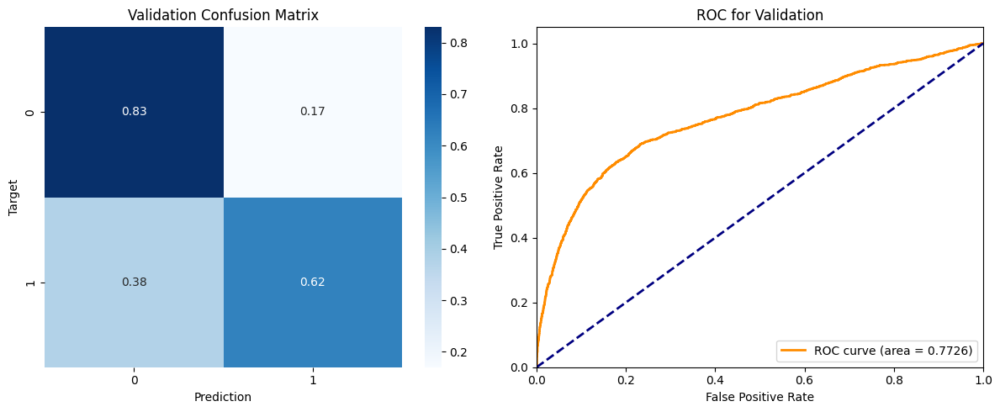

In [264]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_xgb_random_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_xgb_random_model, 'Validation')


TOP-20 найважливіших ознак


,feature,importance
8,nr.employed,0.1373
4,emp.var.rate,0.1156
1,campaign,0.1097
6,cons.conf.idx,0.0382
7,euribor3m,0.0346
13,contact_code,0.0331
20,job_housemaid,0.0293
14,poutcome_code,0.0275
19,job_entrepreneur,0.0272
5,cons.price.idx,0.0272


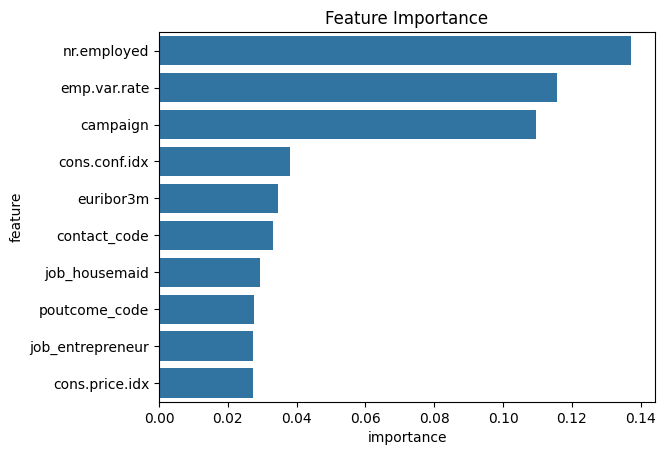

In [326]:
importance_features(train_inputs_smote, smote_xgb_random_model, 20)

#### LightGBM with hyperparameters selected using Randomised Search

In [265]:
random_param_lgb = {
    'n_estimators': [100, 200, 300, 500, 800],
    'max_depth': [-1, 5, 10, 15, 20],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'num_leaves': [15, 31, 50, 70, 100],
    'min_child_samples': [5, 10, 20, 50],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'reg_alpha': [0, 0.1, 0.5, 1],
    'reg_lambda': [0, 0.1, 0.5, 1],
    'scale_pos_weight': [scale_pos_weight, scale_pos_weight * 0.5, scale_pos_weight * 1.5, scale_pos_weight * 0.1]
}

lgb_random = RandomizedSearchCV(
    lgb.LGBMClassifier(random_state = 42),
    random_param_lgb,
    n_iter = 50,
    scoring = 'f1',
    cv = 5,
    verbose = 2,
    random_state = 42,
    n_jobs = -1
)

##### LightGBM on unbalanced data

In [266]:
basic_lgb_random = lgb_random.fit(train_inputs, train_targets)
basic_lgb_random_model = basic_lgb_random.best_estimator_

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Info] Number of positive: 2810, number of negative: 24861
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 328
[LightGBM] [Info] Number of data points in the train set: 27671, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.101550 -> initscore=-2.180116
[LightGBM] [Info] Start training from score -2.180116


In [267]:
print("Найкращі параметри:", basic_lgb_random.best_params_)
print("Найкращий CV F1:", round(basic_lgb_random.best_score_, 4))

Найкращі параметри: {'subsample': 0.8, 'scale_pos_weight': np.float64(8.847330960854093), 'reg_lambda': 0, 'reg_alpha': 0, 'num_leaves': 15, 'n_estimators': 100, 'min_child_samples': 5, 'max_depth': 5, 'learning_rate': 0.01, 'colsample_bytree': 1.0}
Найкращий CV F1: 0.35


F1 score on Training: 0.4662
AUROC for Training: 0.8033

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9402    0.9373    0.9387     24861
           1     0.4600    0.4726    0.4662      2810

    accuracy                         0.8901     27671
   macro avg     0.7001    0.7049    0.7025     27671
weighted avg     0.8914    0.8901    0.8908     27671



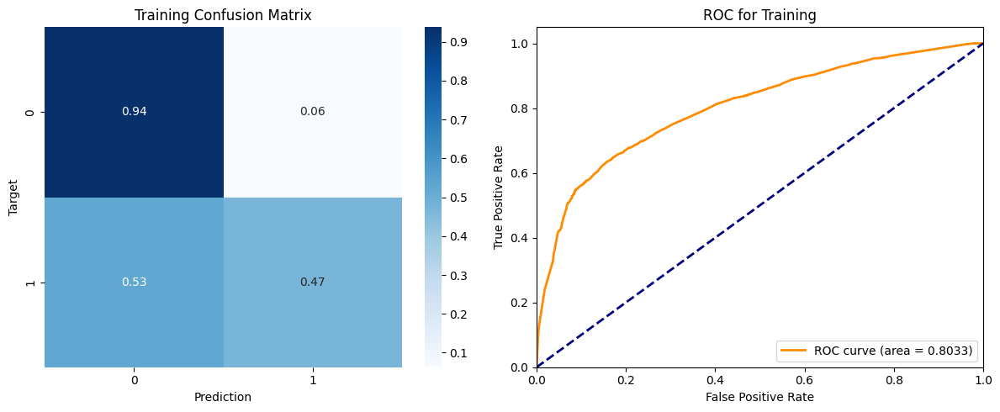

F1 score on Validation: 0.5225
AUROC for Validation: 0.7931

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9408    0.8437    0.8896      7899
           1     0.4229    0.6835    0.5225      1324

    accuracy                         0.8207      9223
   macro avg     0.6819    0.7636    0.7061      9223
weighted avg     0.8665    0.8207    0.8369      9223



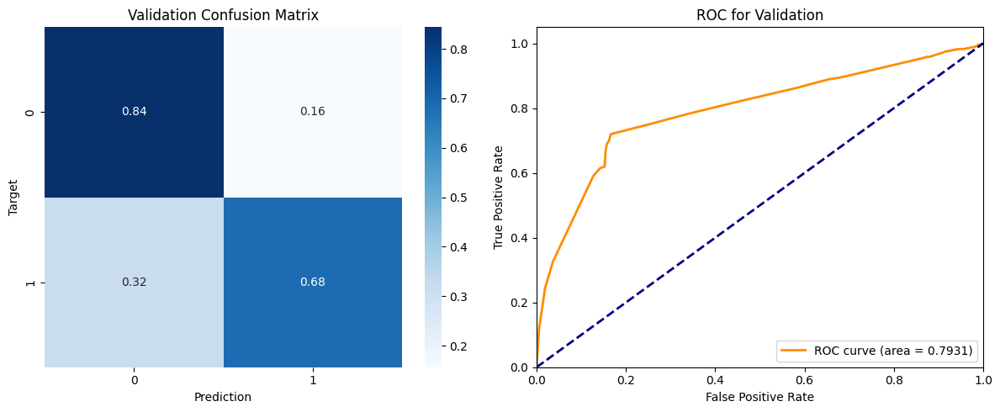

In [268]:
classify_analysis(train_targets, train_inputs, basic_lgb_random_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_lgb_random_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,381
13,contact_code,146
2,pdays,125
1,campaign,117
0,age,113
6,cons.conf.idx,110
4,emp.var.rate,82
5,cons.price.idx,78
15,day_of_week_code,72
14,poutcome_code,68


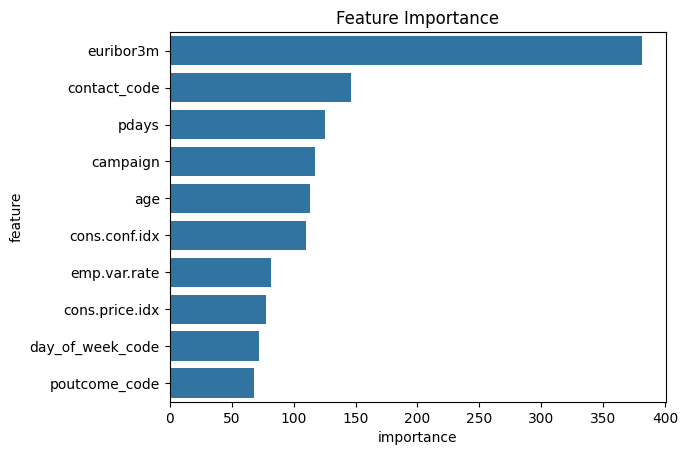

In [327]:
importance_features(train_inputs, basic_lgb_random_model, 20)

##### LightGBM on balanced data using ADASYN

In [ ]:
adasyn_lgb_random = lgb_random.fit(train_inputs_adasyn, train_targets_adasyn)
adasyn_lgb_random_model = adasyn_lgb_random.best_estimator_

In [270]:
print("Найкращі параметри:", adasyn_lgb_random.best_params_)
print("Найкращий CV F1:", round(adasyn_lgb_random.best_score_, 4))

Найкращі параметри: {'subsample': 0.8, 'scale_pos_weight': np.float64(4.423665480427046), 'reg_lambda': 0.5, 'reg_alpha': 0, 'num_leaves': 50, 'n_estimators': 300, 'min_child_samples': 50, 'max_depth': 5, 'learning_rate': 0.05, 'colsample_bytree': 0.6}
Найкращий CV F1: 0.7038


F1 score on Training: 0.8878
AUROC for Training: 0.9739

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9558    0.7952    0.8681     24861
           1     0.8235    0.9629    0.8878     24673

    accuracy                         0.8787     49534
   macro avg     0.8896    0.8790    0.8779     49534
weighted avg     0.8899    0.8787    0.8779     49534



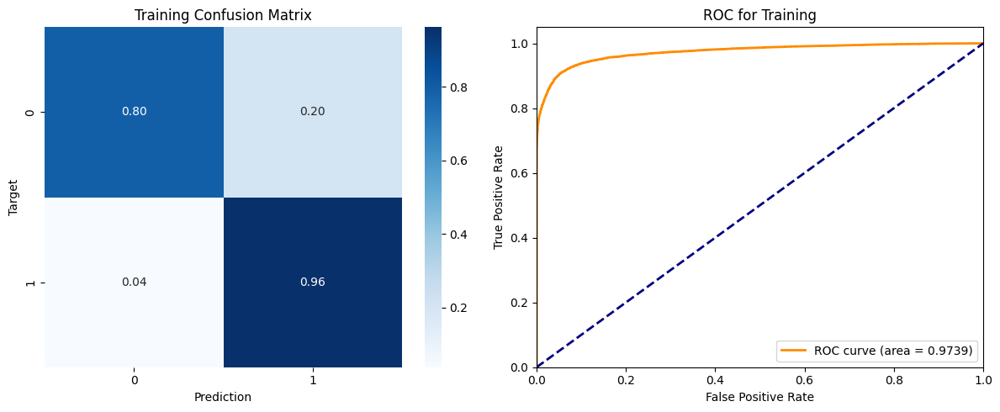

F1 score on Validation: 0.4267
AUROC for Validation: 0.7843

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9411    0.7144    0.8122      7899
           1     0.3009    0.7334    0.4267      1324

    accuracy                         0.7171      9223
   macro avg     0.6210    0.7239    0.6195      9223
weighted avg     0.8492    0.7171    0.7569      9223



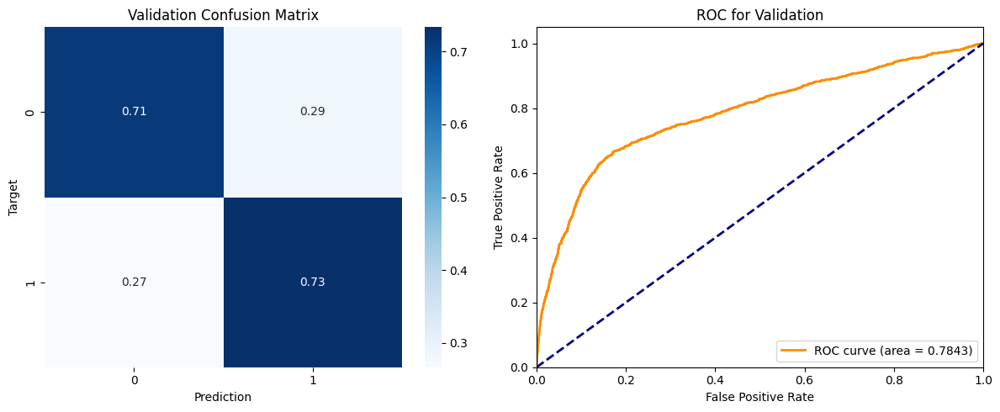

In [271]:
classify_analysis(train_targets_adasyn, train_inputs_adasyn, adasyn_lgb_random_model, 'Training')
classify_analysis(val_targets, val_inputs, adasyn_lgb_random_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,1014
0,age,1005
1,campaign,859
6,cons.conf.idx,326
15,day_of_week_code,303
5,cons.price.idx,279
16,education_code,244
17,job_admin.,176
4,emp.var.rate,175
11,housing_code,165


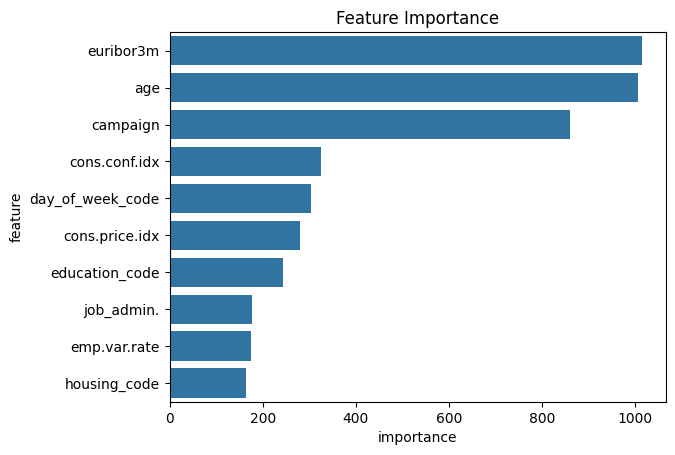

In [328]:
importance_features(train_inputs_adasyn, adasyn_lgb_random_model, 20)

#### XGBoost with hyperparameters selected using Hyperopt

In [272]:
def objective(params):
    clf = xgb.XGBClassifier(
        n_estimators = int(params['n_estimators']),
        learning_rate = params['learning_rate'],
        max_depth = int(params['max_depth']),
        min_child_weight = int(params['min_child_weight']),
        subsample = params['subsample'],
        colsample_bytree = params['colsample_bytree'],
        gamma = params['gamma'],
        reg_alpha = params['reg_alpha'],
        reg_lambda = params['reg_lambda'],
        scale_pos_weight = scale_pos_weight,
        random_state = 42,
        eval_metric = 'logloss'
    )

    clf.fit(
        train_inputs_smote, 
        train_targets_smote,
        eval_set = [(val_inputs, val_targets)],
        verbose = 0
    )

    pred_class = clf.predict(val_inputs)
    f1 = f1_score(val_targets, pred_class, pos_label=1)

    # Hyperopt мінімізує loss, тому беремо -f1
    return {'loss': -f1, 'status': STATUS_OK}


# Простір пошуку гіперпараметрів
space = {
    'n_estimators': hp.quniform('n_estimators', 50, 500, 5),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
    'max_depth': hp.quniform('max_depth', 3, 35, 1),
    'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
    'gamma': hp.uniform('gamma', 0, 0.5),
    'reg_alpha': hp.uniform('reg_alpha', 0, 1),
    'reg_lambda': hp.uniform('reg_lambda', 0, 1),
    'scale_pos_weight': [scale_pos_weight, scale_pos_weight * 0.5, scale_pos_weight * 1.5, scale_pos_weight * 0.1]
}

# Оптимізація
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=25, trials=trials)

# Перетворення параметрів у правильні типи
best['n_estimators'] = int(best['n_estimators'])
best['max_depth'] = int(best['max_depth'])
best['min_child_weight'] = int(best['min_child_weight'])

print("Найкращі гіперпараметри:", best)

# Навчання фінальної моделі
smote_xgb_hyper_model = xgb.XGBClassifier(
    n_estimators = best['n_estimators'],
    learning_rate = best['learning_rate'],
    max_depth = best['max_depth'],
    min_child_weight = best['min_child_weight'],
    subsample = best['subsample'],
    colsample_bytree = best['colsample_bytree'],
    gamma = best['gamma'],
    reg_alpha = best['reg_alpha'],
    reg_lambda = best['reg_lambda'],
    scale_pos_weight = scale_pos_weight,
    missing = np.nan,
    random_state = 42,
    eval_metric = 'logloss'
)

smote_xgb_hyper_model.fit(train_inputs_smote, train_targets_smote)

100%|██████████| 25/25 [00:58<00:00,  2.33s/trial, best loss: -0.4704551880124399]
Найкращі гіперпараметри: {'colsample_bytree': np.float64(0.9367494238693802), 'gamma': np.float64(0.09592988177308259), 'learning_rate': np.float64(0.12112036183538707), 'max_depth': 15, 'min_child_weight': 8, 'n_estimators': 100, 'reg_alpha': np.float64(0.7224943992672244), 'reg_lambda': np.float64(0.9901914078380762), 'subsample': np.float64(0.7125895982309056)}


,"objective objective: typing.Union[str, xgboost.sklearn._SklObjWProto, typing.Callable[[typing.Any, typing.Any], typing.Tuple[numpy.ndarray, numpy.ndarray]], NoneType]Specify the learning task and the corresponding learning objective or a customobjective function to be used.For custom objective, see :doc:`/tutorials/custom_metric_obj` and:ref:`custom-obj-metric` for more information, along with the end note forfunction signatures.",'binary:logistic'
,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API `... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,np.float64(0.9367494238693802)
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",None
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,False
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.data

In [273]:
print("Найкращі параметри:", best)

Найкращі параметри: {'colsample_bytree': np.float64(0.9367494238693802), 'gamma': np.float64(0.09592988177308259), 'learning_rate': np.float64(0.12112036183538707), 'max_depth': 15, 'min_child_weight': 8, 'n_estimators': 100, 'reg_alpha': np.float64(0.7224943992672244), 'reg_lambda': np.float64(0.9901914078380762), 'subsample': np.float64(0.7125895982309056)}


F1 score on Training: 0.9541
AUROC for Training: 0.9975

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9989    0.9048    0.9495     24861
           1     0.9130    0.9990    0.9541     24861

    accuracy                         0.9519     49722
   macro avg     0.9559    0.9519    0.9518     49722
weighted avg     0.9559    0.9519    0.9518     49722



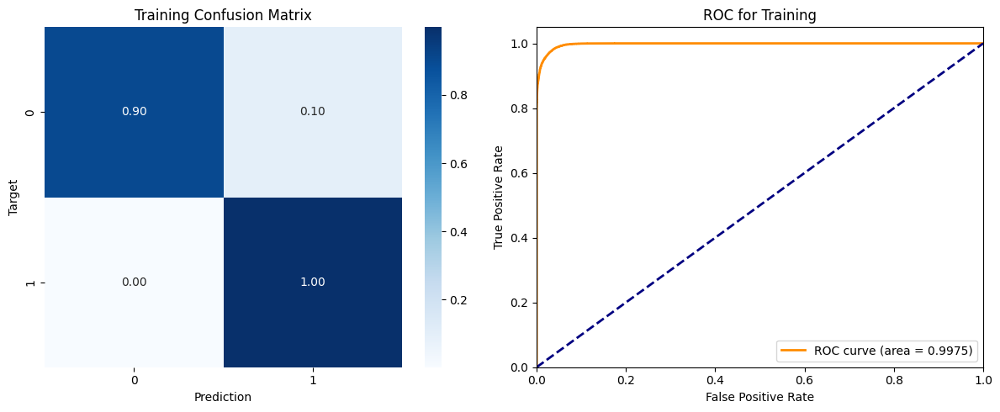

F1 score on Validation: 0.4705
AUROC for Validation: 0.7696

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9298    0.8252    0.8744      7899
           1     0.3760    0.6284    0.4705      1324

    accuracy                         0.7969      9223
   macro avg     0.6529    0.7268    0.6724      9223
weighted avg     0.8503    0.7969    0.8164      9223



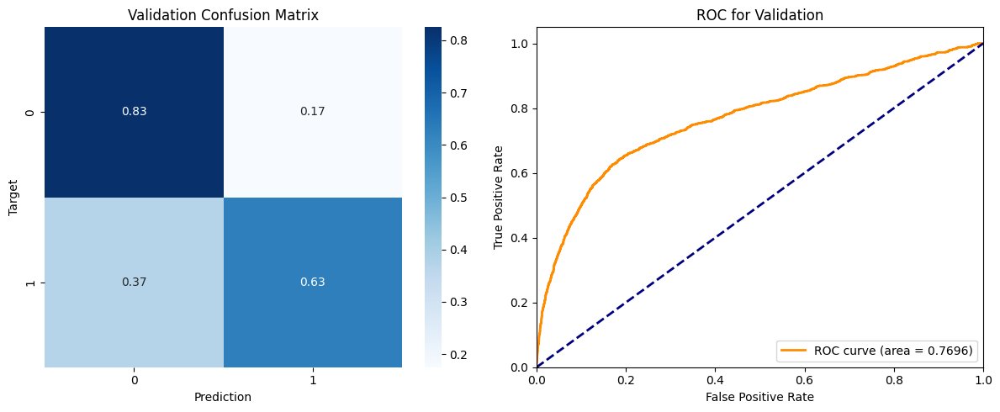

In [274]:
classify_analysis(train_targets_smote, train_inputs_smote, smote_xgb_hyper_model, 'Training')
classify_analysis(val_targets, val_inputs, smote_xgb_hyper_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
4,emp.var.rate,0.2558
8,nr.employed,0.1899
1,campaign,0.0413
5,cons.price.idx,0.0312
20,job_housemaid,0.0275
21,job_management,0.0274
19,job_entrepreneur,0.0259
18,job_blue-collar,0.0239
28,marital_divorced,0.0233
13,contact_code,0.0227


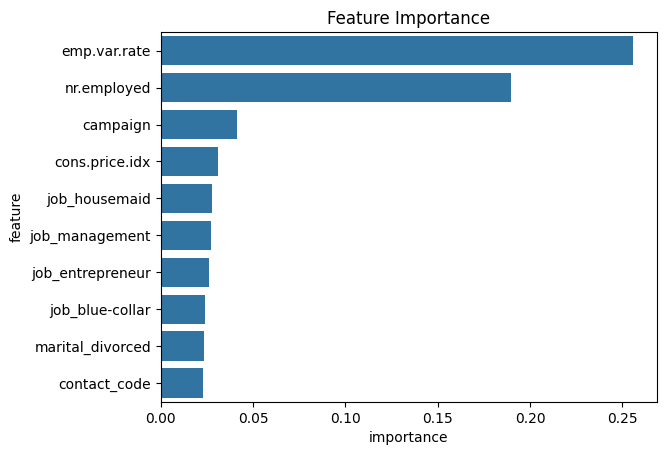

In [329]:
importance_features(train_inputs_smote, smote_xgb_hyper_model, 20)

#### LightGBM with hyperparameters selected using Hyperopt

##### LightGBM on unbalanced data

In [ ]:
def objective(params):
    clf = lgb.LGBMClassifier(
        n_estimators = int(params['n_estimators']),
        learning_rate = params['learning_rate'],
        max_depth = int(params['max_depth']),
        num_leaves = int(params['num_leaves']),
        min_child_weight = int(params['min_child_weight']),
        subsample = params['subsample'],
        colsample_bytree = params['colsample_bytree'],
        reg_alpha = params['reg_alpha'],
        reg_lambda = params['reg_lambda'],
        min_split_gain = params['min_split_gain'],
        scale_pos_weight = params['scale_pos_weight'],
        random_state = 42
    )

    clf.fit(
        train_inputs,
        train_targets,
        eval_set = [(val_inputs, val_targets)],
    )

    pred_class = clf.predict(val_inputs)
    f1 = f1_score(val_targets, pred_class, pos_label = 1)

    return {'loss': -f1, 'status': STATUS_OK}

# Простір гіперпараметрів
space = {
    'n_estimators': hp.quniform('n_estimators', 50, 500, 5),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
    'max_depth': hp.quniform('max_depth', 3, 25, 1),
    'num_leaves': hp.quniform('num_leaves', 20, 150, 1),
    'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
    'reg_alpha': hp.uniform('reg_alpha', 0, 1),
    'reg_lambda': hp.uniform('reg_lambda', 0, 1),
    'min_split_gain': hp.uniform('min_split_gain', 0, 0.1),
    'scale_pos_weight': hp.choice('scale_pos_weight', [
        scale_pos_weight, 
        scale_pos_weight * 0.5, 
        scale_pos_weight * 1.5, 
        scale_pos_weight * 0.1
    ])
}

# Оптимізація
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=20, trials=trials)

# Перетворення типів для цілісних параметрів
best['n_estimators'] = int(best['n_estimators'])
best['max_depth'] = int(best['max_depth'])
best['num_leaves'] = int(best['num_leaves'])
best['min_child_weight'] = int(best['min_child_weight'])

print("Найкращі гіперпараметри: ", best)

# Навчання фінальної моделі
basic_lgb_hyper_model = lgb.LGBMClassifier(
    n_estimators = best['n_estimators'],
    learning_rate = best['learning_rate'],
    max_depth = best['max_depth'],
    num_leaves = best['num_leaves'],
    min_child_weight = best['min_child_weight'],
    subsample = best['subsample'],
    colsample_bytree = best['colsample_bytree'],
    reg_alpha = best['reg_alpha'],
    reg_lambda = best['reg_lambda'],
    min_split_gain = best['min_split_gain'],
    scale_pos_weight = best['scale_pos_weight'],
    random_state = 42
)

basic_lgb_hyper_model.fit(train_inputs, train_targets, eval_set=[(val_inputs, val_targets)])

In [276]:
print("Найкращі параметри:", best)

Найкращі параметри: {'colsample_bytree': np.float64(0.5100076088118917), 'learning_rate': np.float64(0.11149270243681154), 'max_depth': 13, 'min_child_weight': 6, 'min_split_gain': np.float64(0.03974023078277464), 'n_estimators': 235, 'num_leaves': 29, 'reg_alpha': np.float64(0.17991030634551897), 'reg_lambda': np.float64(0.21346655826587513), 'scale_pos_weight': np.int64(1), 'subsample': np.float64(0.822644811664561)}


F1 score on Training: 0.4357
AUROC for Training: 0.8578

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9264    0.9895    0.9569     24861
           1     0.7668    0.3043    0.4357      2810

    accuracy                         0.9200     27671
   macro avg     0.8466    0.6469    0.6963     27671
weighted avg     0.9102    0.9200    0.9040     27671



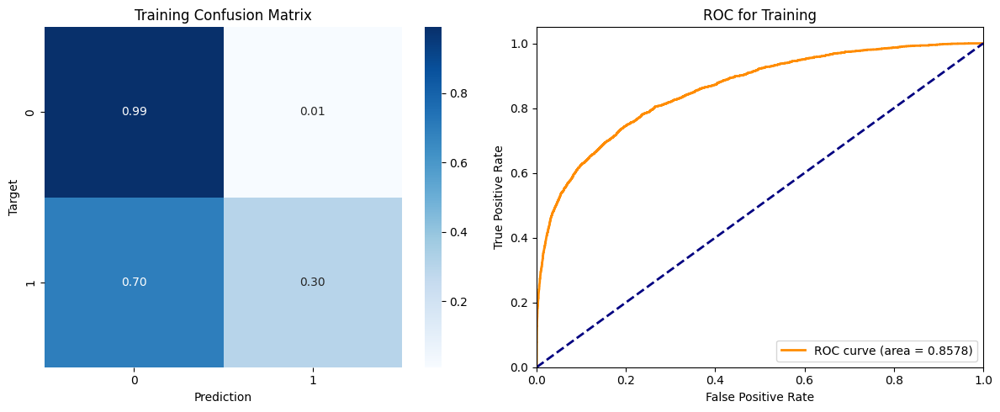

F1 score on Validation: 0.438
AUROC for Validation: 0.7906

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.8969    0.9658    0.9301      7899
           1     0.6234    0.3376    0.4380      1324

    accuracy                         0.8756      9223
   macro avg     0.7602    0.6517    0.6841      9223
weighted avg     0.8576    0.8756    0.8594      9223



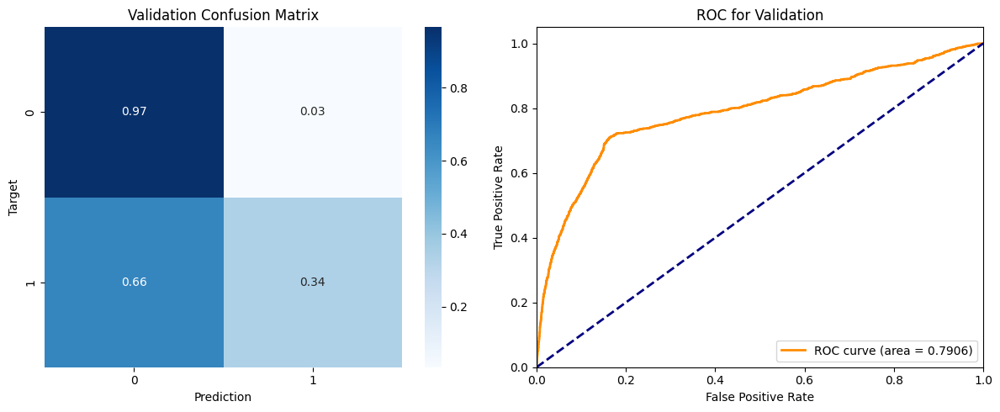

In [277]:
classify_analysis(train_targets, train_inputs, basic_lgb_hyper_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_lgb_hyper_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,1028
0,age,913
1,campaign,386
16,education_code,351
15,day_of_week_code,288
6,cons.conf.idx,286
5,cons.price.idx,129
2,pdays,118
8,nr.employed,105
3,previous,83


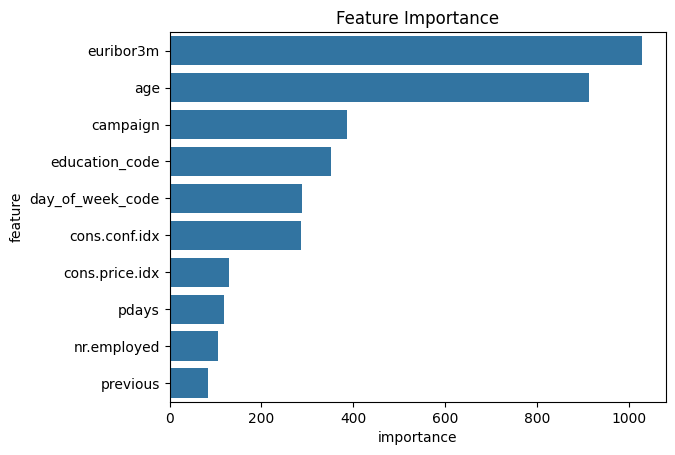

In [330]:
importance_features(train_inputs, basic_lgb_hyper_model, 20)

##### LightGBM based on balanced data using ADASYN

In [ ]:
def objective(params):
    clf = lgb.LGBMClassifier(
        n_estimators = int(params['n_estimators']),
        learning_rate = params['learning_rate'],
        max_depth = int(params['max_depth']),
        num_leaves = int(params['num_leaves']),
        min_child_weight = int(params['min_child_weight']),
        subsample = params['subsample'],
        colsample_bytree = params['colsample_bytree'],
        reg_alpha = params['reg_alpha'],
        reg_lambda = params['reg_lambda'],
        min_split_gain = params['min_split_gain'],
        scale_pos_weight = params['scale_pos_weight'],
        random_state = 42
    )

    clf.fit(
        train_inputs_adasyn,
        train_targets_adasyn,
        eval_set = [(val_inputs, val_targets)],
    )

    pred_class = clf.predict(val_inputs)
    f1 = f1_score(val_targets, pred_class, pos_label = 1)

    return {'loss': -f1, 'status': STATUS_OK}

# Простір гіперпараметрів
space = {
    'n_estimators': hp.quniform('n_estimators', 50, 500, 5),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
    'max_depth': hp.quniform('max_depth', 3, 25, 1),
    'num_leaves': hp.quniform('num_leaves', 20, 150, 1),
    'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
    'reg_alpha': hp.uniform('reg_alpha', 0, 1),
    'reg_lambda': hp.uniform('reg_lambda', 0, 1),
    'min_split_gain': hp.uniform('min_split_gain', 0, 0.1),
    'scale_pos_weight': hp.choice('scale_pos_weight', [
        scale_pos_weight, 
        scale_pos_weight * 0.5, 
        scale_pos_weight * 1.5, 
        scale_pos_weight * 0.1
    ])
}

# Оптимізація
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=20, trials=trials)

# Перетворення типів для цілісних параметрів
best['n_estimators'] = int(best['n_estimators'])
best['max_depth'] = int(best['max_depth'])
best['num_leaves'] = int(best['num_leaves'])
best['min_child_weight'] = int(best['min_child_weight'])

print("Найкращі гіперпараметри: ", best)

# Навчання фінальної моделі
adasyn_lgb_hyper_model = lgb.LGBMClassifier(
    n_estimators = best['n_estimators'],
    learning_rate = best['learning_rate'],
    max_depth = best['max_depth'],
    num_leaves = best['num_leaves'],
    min_child_weight = best['min_child_weight'],
    subsample = best['subsample'],
    colsample_bytree = best['colsample_bytree'],
    reg_alpha = best['reg_alpha'],
    reg_lambda = best['reg_lambda'],
    min_split_gain = best['min_split_gain'],
    scale_pos_weight = best['scale_pos_weight'],
    random_state = 42
)

adasyn_lgb_hyper_model.fit(train_inputs_adasyn, train_targets_adasyn, eval_set=[(val_inputs, val_targets)])

In [279]:
print("Найкращі параметри:", best)

Найкращі параметри: {'colsample_bytree': np.float64(0.7874696356213019), 'learning_rate': np.float64(0.018613523629707505), 'max_depth': 5, 'min_child_weight': 4, 'min_split_gain': np.float64(0.026864166826251326), 'n_estimators': 255, 'num_leaves': 31, 'reg_alpha': np.float64(0.6133489962121088), 'reg_lambda': np.float64(0.7867839759761877), 'scale_pos_weight': np.int64(3), 'subsample': np.float64(0.944790760161337)}


F1 score on Training: 0.8319
AUROC for Training: 0.9445

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9374    0.6608    0.7751     24861
           1     0.7365    0.9555    0.8319     24673

    accuracy                         0.8076     49534
   macro avg     0.8370    0.8081    0.8035     49534
weighted avg     0.8373    0.8076    0.8034     49534



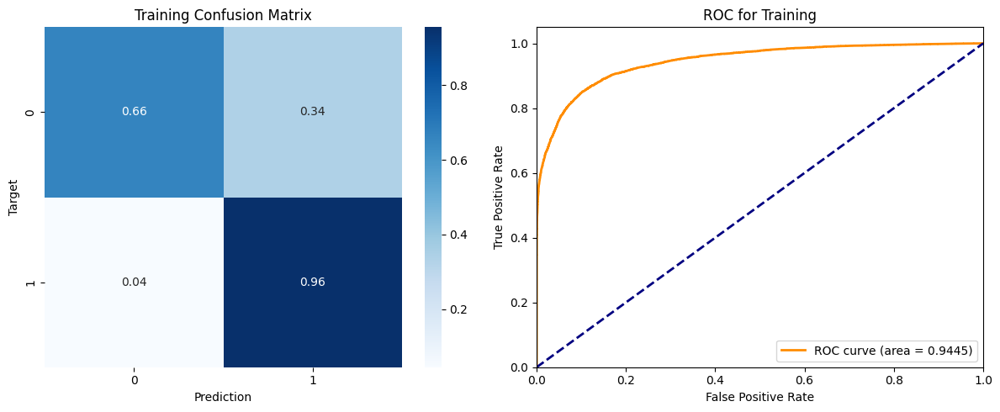

F1 score on Validation: 0.3775
AUROC for Validation: 0.7784

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9394    0.6187    0.7460      7899
           1     0.2509    0.7621    0.3775      1324

    accuracy                         0.6393      9223
   macro avg     0.5952    0.6904    0.5618      9223
weighted avg     0.8406    0.6393    0.6932      9223



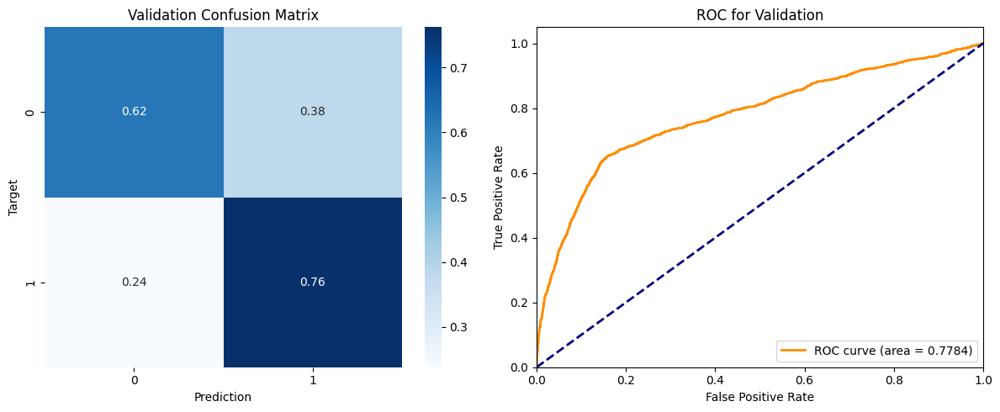

In [280]:
classify_analysis(train_targets_adasyn, train_inputs_adasyn, adasyn_lgb_hyper_model, 'Training')
classify_analysis(val_targets, val_inputs, adasyn_lgb_hyper_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
1,campaign,1130
7,euribor3m,979
0,age,434
5,cons.price.idx,350
6,cons.conf.idx,261
4,emp.var.rate,208
17,job_admin.,202
11,housing_code,192
12,loan_code,183
15,day_of_week_code,173


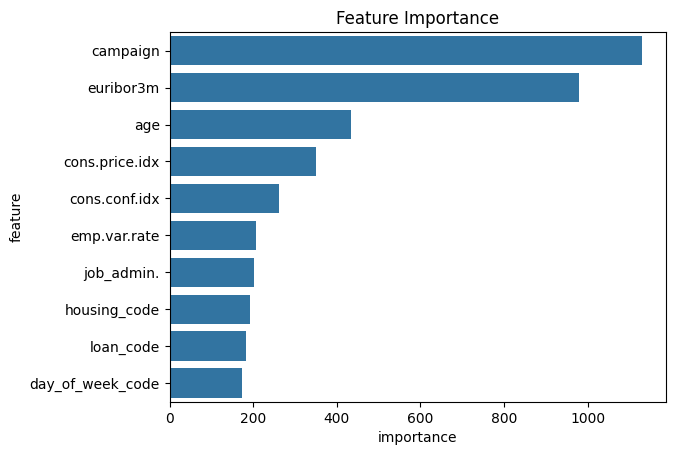

In [331]:
importance_features(train_inputs_adasyn, adasyn_lgb_hyper_model, 20)

**General conclusions**

After tuning the hyperparameters for the XGBoost model using RandomisedSearch and Hyperopt, the F1 score increased to 0.47, recall to 0.62–0.63, and AUROC to 0.77. Both search methods yielded identical F1 scores; however, Hyperopt, after 25 iterations, found hyperparameters that provide a slightly higher recall whilst maintaining the same precision of 0.38.

Among the most important features, we can highlight the rate of change in employment, the number of people in employment, the number of leads in the current campaign, the Consumer Price Index and the 3-month Euribor rate. Compared with the baseline models, XGBoost showed an increased importance of the number of people in employment and a significant reduction in the influence of the rate of change in employment.

In the case of LightGBM, after hyperparameter tuning via RandomisedSearch on unbalanced data, we obtained results virtually identical to those of the baseline model (F1 = 0.522, AUROC = 0.793).

Among the most important features, the role of the contact method and the number of days since the last contact in the previous campaign increased. Hyperopt, after 20 iterations, yielded a poorer result (F1 = 0.438, recall = 0.34); consequently, this number of iterations is insufficient to achieve better results.

# Preparing data for experiment group No2

In [281]:
train_raw_df_new = raw_df_dedup[raw_df_dedup['month_num'] <= 10]
test_df_new = raw_df_dedup[raw_df_dedup['month_num'] > 10]


tscv = TimeSeriesSplit(n_splits = 3)

for train_idx, valid_idx in tscv.split(train_raw_df_new):
    train_df_new = train_raw_df_new.iloc[train_idx]
    valid_df_new = train_raw_df_new.iloc[valid_idx]

print("Розмір навчальної вибірки:", train_df_new.shape)
print("Розмір валідаційної вибірки:", valid_df_new.shape)
print("Розмір тестової вибірки:", test_df_new.shape)

Розмір навчальної вибірки: (27671, 24)
Розмір валідаційної вибірки: (9223, 24)
Розмір тестової вибірки: (4282, 24)


In [282]:
train_df_new, valid_df_new, test_df_new = fill_unknown_with_mode(train_df_new, valid_df_new, test_df_new, cat_cols_with_unknown)

In [283]:
train_targets_new = train_df_new[target_col].copy()
val_targets_new = valid_df_new[target_col].copy()
test_targets_new = test_df_new[target_col].copy()

train_inputs_new = train_df_new[input_cols].copy()
val_inputs_new = valid_df_new[input_cols].copy()
test_inputs_new = test_df_new[input_cols].copy()

In [284]:
map_codes = {'yes': 1, 'no': 0}
map_cols = ['default', 'housing', 'loan']

train_inputs_new, val_inputs_new, test_inputs_new = encode_columns_safe(train_inputs_new, val_inputs_new, test_inputs_new, map_cols, map_codes)


contact_map_codes = {'cellular': 1, 'telephone': 0}
contact_map_cols = ['contact']

train_inputs_new, val_inputs_new, test_inputs_new = encode_columns_safe(train_inputs_new, val_inputs_new, test_inputs_new, contact_map_cols, contact_map_codes)

poutcome_map_codes = {'nonexistent': 0, 'failure': -1, 'success': 1}
poutcome_map_cols = ['poutcome']

train_inputs_new, val_inputs_new, test_inputs_new = encode_columns_safe(train_inputs_new, val_inputs_new, test_inputs_new, poutcome_map_cols, poutcome_map_codes)


In [285]:
train_targets_new = train_targets_new.map(map_codes)
val_targets_new = val_targets_new.map(map_codes)
test_targets_new = test_targets_new.map(map_codes)

In [286]:
ordinal_cols = ['day_of_week', 'education']

ordinal_enc = OrdinalEncoder(
    categories = [['mon','tue','wed','thu','fri','sat','sun'],
                  ['illiterate', 'basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'professional.course', 'university.degree']],
                  dtype = int
)

ordinal_enc.fit(train_inputs_new[ordinal_cols])

train_encoded = ordinal_enc.transform(train_inputs_new[ordinal_cols]).astype(int)
val_encoded   = ordinal_enc.transform(val_inputs_new[ordinal_cols]).astype(int)
test_encoded  = ordinal_enc.transform(test_inputs_new[ordinal_cols]).astype(int)

for i, col in enumerate(ordinal_cols):
    train_inputs_new[col + '_code'] = train_encoded[:, i]
    val_inputs_new[col + '_code']   = val_encoded[:, i]
    test_inputs_new[col + '_code']  = test_encoded[:, i]

In [287]:
onehot_cols = ['job', 'marital']

onehot_enc = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
onehot_enc.fit(train_inputs_new[onehot_cols])

onehot_encoder_cols = list(onehot_enc.get_feature_names_out(onehot_cols))

train_inputs_new[onehot_encoder_cols] = onehot_enc.transform(train_inputs_new[onehot_cols])
val_inputs_new[onehot_encoder_cols] = onehot_enc.transform(val_inputs_new[onehot_cols])

In [288]:
cols_to_drop = map_cols + contact_map_cols + poutcome_map_cols + ordinal_cols + onehot_cols + ['month']

train_inputs_new = train_inputs_new.drop(columns = cols_to_drop).copy()
val_inputs_new = val_inputs_new.drop(columns = cols_to_drop).copy()

In [289]:
train_inputs_new['macro_stress'] = train_inputs_new['emp.var.rate'] / train_inputs_new['cons.conf.idx']
train_inputs_new['finance_balance'] = train_inputs_new['euribor3m'] - train_inputs_new['cons.price.idx']
train_inputs_new['confidence_adjusted'] = train_inputs_new['cons.conf.idx'] * train_inputs_new['emp.var.rate']
train_inputs_new['contact_intensity'] = train_inputs_new['campaign'] / (train_inputs_new['previous'] + 1)
train_inputs_new['was_contacted_before'] = (train_inputs_new['previous'] > 0).astype(int)
train_inputs_new['is_new_client'] = (train_inputs_new['pdays'] == 999).astype(int)


val_inputs_new['macro_stress'] = val_inputs_new['emp.var.rate'] / val_inputs_new['cons.conf.idx']
val_inputs_new['finance_balance'] = val_inputs_new['euribor3m'] - val_inputs_new['cons.price.idx']
val_inputs_new['confidence_adjusted'] = val_inputs_new['cons.conf.idx'] * val_inputs_new['emp.var.rate']
val_inputs_new['contact_intensity'] = val_inputs_new['campaign'] / (val_inputs_new['previous'] + 1)
val_inputs_new['was_contacted_before'] = (val_inputs_new['previous'] > 0).astype(int)
val_inputs_new['is_new_client'] = (val_inputs_new['pdays'] == 999).astype(int)

In [290]:
numeric_cols_new = list(numeric_cols) + [
    'macro_stress', 
    'finance_balance', 
    'confidence_adjusted',
    'contact_intensity',
    'was_contacted_before',
    'is_new_client'
]

In [294]:
categorical_cols_new = train_inputs_new.select_dtypes(exclude="number").columns

In [295]:
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)

train_poly_array = poly.fit_transform(train_inputs_new[numeric_cols_new].values)
val_poly_array = poly.transform(val_inputs_new[numeric_cols_new].values)

poly_feature_names = poly.get_feature_names_out(numeric_cols_new)

train_poly_df = pd.DataFrame(train_poly_array, columns=poly_feature_names, index=train_inputs_new.index)
val_poly_df = pd.DataFrame(val_poly_array, columns=poly_feature_names, index=val_inputs_new.index)

train_cat = train_inputs_new[categorical_cols_new]
val_cat = val_inputs_new[categorical_cols_new]

train_inputs_poly = pd.concat([train_poly_df, train_cat], axis=1)
val_inputs_poly = pd.concat([val_poly_df, val_cat], axis=1)

print("Train shape after polynomial features:", train_inputs_poly.shape)

Train shape after polynomial features: (27671, 135)


In [296]:
stand_scaler_poly = StandardScaler()
stand_scaler_poly.fit(train_inputs_poly[numeric_cols_new])

train_inputs_poly[numeric_cols_new] = stand_scaler_poly.transform(train_inputs_poly[numeric_cols_new])
val_inputs_poly[numeric_cols_new] = stand_scaler_poly.transform(val_inputs_poly[numeric_cols_new])

train_inputs_poly[numeric_cols_new].describe().round(2)

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,macro_stress,finance_balance,confidence_adjusted,contact_intensity,was_contacted_before,is_new_client
count,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00
mean,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-2.11,-0.57,-6.14,-0.34,-1.91,-2.12,-2.02,-1.62,-2.62,-0.82,-2.48,-0.92,-0.82,-0.38,-6.10
25%,-0.71,-0.57,0.16,-0.34,-1.20,-1.26,-1.10,-1.22,-0.98,-0.80,-1.08,-0.90,-0.52,-0.38,0.16
50%,-0.21,-0.21,0.16,-0.34,0.67,0.40,-0.03,0.76,0.42,-0.73,0.52,-0.62,-0.16,-0.38,0.16
75%,0.69,0.15,0.16,-0.34,0.87,0.53,1.29,0.82,0.99,1.15,0.80,1.23,0.20,-0.38,0.16
max,5.60,19.32,0.16,11.12,0.87,1.34,1.97,0.82,0.99,2.44,0.94,1.76,19.31,2.63,0.16


In [297]:
train_inputs_smote_poly, train_targets_smote_poly = smote.fit_resample(train_inputs_poly, train_targets_new)

In [298]:
train_inputs_adasyn_poly, train_targets_adasyn_poly = adasyn.fit_resample(train_inputs_poly, train_targets_new)

# Experiment Group No2

## Logistic regression with polynomial features on balanced data using SMOTE

In [299]:
log_grid_poly = GridSearchCV(
    LogisticRegression(),
    grid_param_log,
    scoring = 'f1',
    cv = 5,
    n_jobs = -1
)

log_grid_poly.fit(train_inputs_smote_poly, train_targets_smote_poly)
smote_log_grid_poly_model = log_grid_poly.best_estimator_

c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


In [300]:
print("Найкращі параметри:", log_grid_poly.best_params_)
print("Найкращий CV F1:", round(log_grid_poly.best_score_, 4))

Найкращі параметри: {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}
Найкращий CV F1: 0.5926


F1 score on Training: 0.7085
AUROC for Training: 0.7825

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.7034    0.7651    0.7330     24861
           1     0.7425    0.6774    0.7085     24861

    accuracy                         0.7213     49722
   macro avg     0.7230    0.7213    0.7207     49722
weighted avg     0.7230    0.7213    0.7207     49722



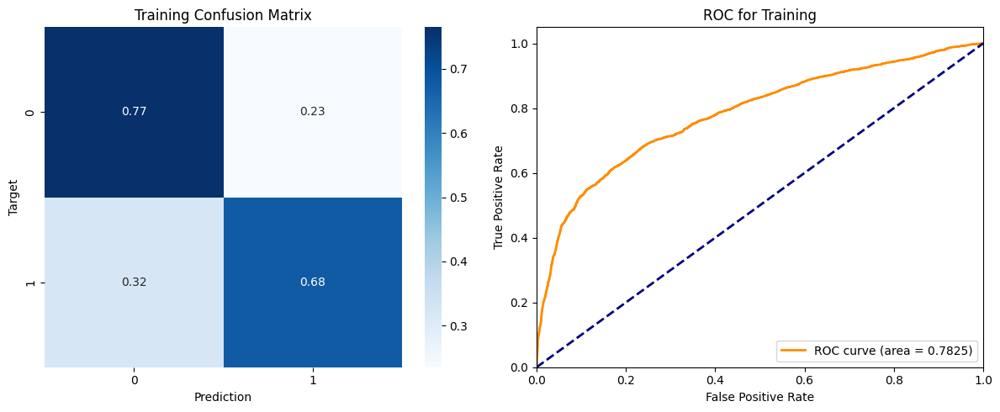

F1 score on Validation: 0.5128
AUROC for Validation: 0.7865

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9387    0.8409    0.8871      7899
           1     0.4145    0.6722    0.5128      1324

    accuracy                         0.8167      9223
   macro avg     0.6766    0.7565    0.6999      9223
weighted avg     0.8634    0.8167    0.8334      9223



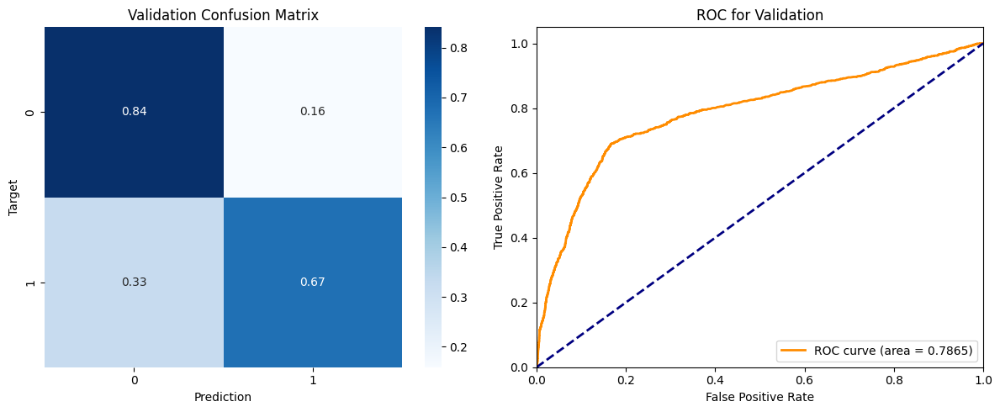

In [301]:
classify_analysis(train_targets_smote_poly, train_inputs_smote_poly, smote_log_grid_poly_model, 'Training')
classify_analysis(val_targets_new, val_inputs_poly, smote_log_grid_poly_model, 'Validation')

Top features:


emp.var.rate nr.employed                 0.000422
age^2                                    0.000338
pdays cons.conf.idx                      0.000191
pdays finance_balance                    0.000170
pdays^2                                  0.000164
confidence_adjusted contact_intensity    0.000157
confidence_adjusted^2                    0.000157
campaign confidence_adjusted             0.000157
pdays cons.price.idx                     0.000129
euribor3m nr.employed                    0.000117
nr.employed was_contacted_before         0.000088
cons.price.idx nr.employed               0.000088
pdays emp.var.rate                       0.000072
age confidence_adjusted                  0.000071
pdays previous                           0.000057
cons.conf.idx confidence_adjusted        0.000055
campaign pdays                           0.000054
pdays confidence_adjusted                0.000047
pdays euribor3m                          0.000040
previous nr.employed                     0.000040


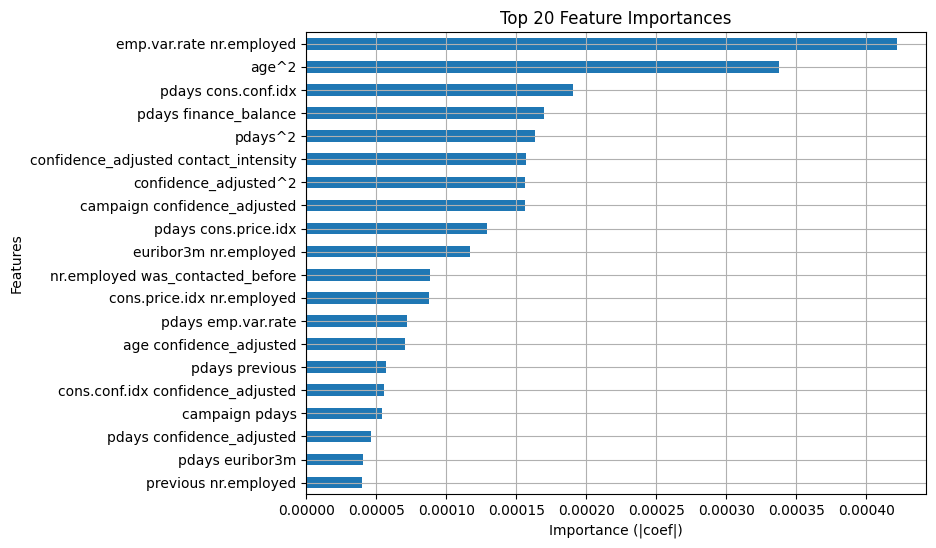

In [303]:
plot_feature_importance(smote_log_grid_poly_model, train_inputs_poly, 20)

**General conclusions**

The addition of second-order polynomial features, together with hyperparameter tuning via GridSearch, slightly improved the results. Compared with the best logistic regression model from Group 1 (F1 = 0.51), the result is identical in terms of F1, although recall increased by 0.05 and precision decreased by 0.03. The polynomial features enabled the model to better capture non-linear relationships.

Among the most influential features, interactions between numerical variables predominate:
- rate of change in employment × number of people in employment
- age²
- number of days since the last contact in the previous campaign × consumer confidence index.

## LightGBM with polynomial features on balanced data using ADASYN

In [ ]:
pos = np.sum(train_targets_new == 1)
neg = np.sum(train_targets_new == 0)
scale_pos_weight = neg / pos

def objective(params):
    clf = lgb.LGBMClassifier(
        n_estimators = int(params['n_estimators']),
        learning_rate = params['learning_rate'],
        max_depth = int(params['max_depth']),
        num_leaves = int(params['num_leaves']),
        min_child_weight = int(params['min_child_weight']),
        subsample = params['subsample'],
        colsample_bytree = params['colsample_bytree'],
        reg_alpha = params['reg_alpha'],
        reg_lambda = params['reg_lambda'],
        min_split_gain = params['min_split_gain'],
        scale_pos_weight = params['scale_pos_weight'],
        random_state = 42
    )

    clf.fit(
        train_inputs_adasyn_poly,
        train_targets_adasyn_poly,
        eval_set = [(val_inputs_poly, val_targets_new)],
    )

    pred_class = clf.predict(val_inputs_poly)
    f1 = f1_score(val_targets_new, pred_class, pos_label = 1)

    return {'loss': -f1, 'status': STATUS_OK}

# Простір гіперпараметрів
space = {
    'n_estimators': hp.quniform('n_estimators', 50, 500, 5),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
    'max_depth': hp.quniform('max_depth', 3, 25, 1),
    'num_leaves': hp.quniform('num_leaves', 20, 150, 1),
    'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
    'reg_alpha': hp.uniform('reg_alpha', 0, 1),
    'reg_lambda': hp.uniform('reg_lambda', 0, 1),
    'min_split_gain': hp.uniform('min_split_gain', 0, 0.1),
    'scale_pos_weight': hp.choice('scale_pos_weight', [
        scale_pos_weight, 
        scale_pos_weight * 0.5, 
        scale_pos_weight * 1.5, 
        scale_pos_weight * 0.1
    ])
}

# Оптимізація
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=20, trials=trials)

# Перетворення типів для цілісних параметрів
best['n_estimators'] = int(best['n_estimators'])
best['max_depth'] = int(best['max_depth'])
best['num_leaves'] = int(best['num_leaves'])
best['min_child_weight'] = int(best['min_child_weight'])

print("Найкращі гіперпараметри: ", best)

# Навчання фінальної моделі
adasyn_lgb_poly_hyper_model = lgb.LGBMClassifier(
    n_estimators = best['n_estimators'],
    learning_rate = best['learning_rate'],
    max_depth = best['max_depth'],
    num_leaves = best['num_leaves'],
    min_child_weight = best['min_child_weight'],
    subsample = best['subsample'],
    colsample_bytree = best['colsample_bytree'],
    reg_alpha = best['reg_alpha'],
    reg_lambda = best['reg_lambda'],
    min_split_gain = best['min_split_gain'],
    scale_pos_weight = best['scale_pos_weight'],
    random_state = 42
)

adasyn_lgb_poly_hyper_model.fit(train_inputs_adasyn_poly, train_targets_adasyn_poly, eval_set=[(val_inputs_poly, val_targets_new)])

F1 score on Training: 0.8793
AUROC for Training: 0.94

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.8632    0.9139    0.8878     24861
           1     0.9072    0.8531    0.8793     24512

    accuracy                         0.8837     49373
   macro avg     0.8852    0.8835    0.8836     49373
weighted avg     0.8850    0.8837    0.8836     49373



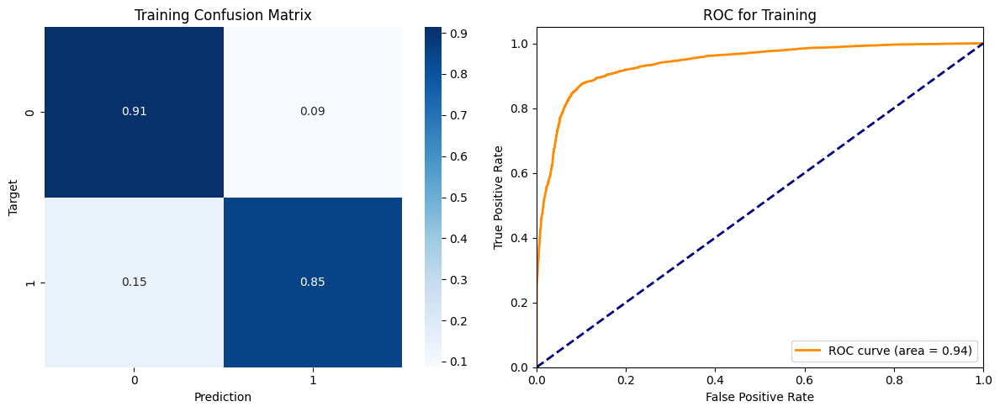

F1 score on Validation: 0.4347
AUROC for Validation: 0.739

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9182    0.8302    0.8720      7899
           1     0.3556    0.5589    0.4347      1324

    accuracy                         0.7913      9223
   macro avg     0.6369    0.6946    0.6533      9223
weighted avg     0.8375    0.7913    0.8092      9223



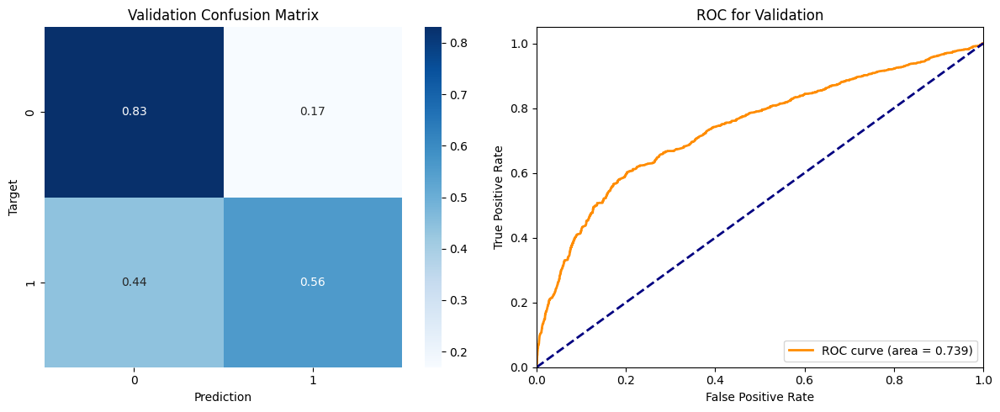

In [305]:
classify_analysis(train_targets_adasyn_poly, train_inputs_adasyn_poly, adasyn_lgb_poly_hyper_model, 'Training')
classify_analysis(val_targets_new, val_inputs_poly, adasyn_lgb_poly_hyper_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
7,euribor3m,135
109,nr.employed finance_balance,114
16,age campaign,112
0,age,110
94,cons.conf.idx finance_balance,84
10,finance_balance,82
121,finance_balance confidence_adjusted,73
49,pdays euribor3m,62
1,campaign,56
75,emp.var.rate finance_balance,48


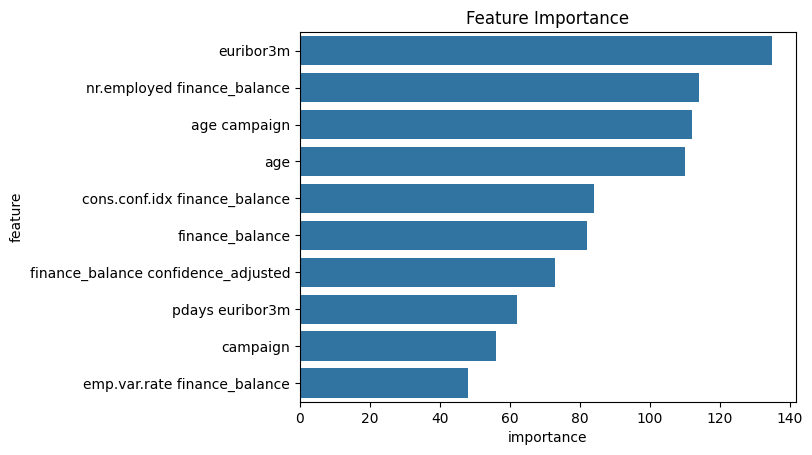

In [306]:
importance_features(train_inputs_adasyn_poly, adasyn_lgb_poly_hyper_model, 20)

**General conclusions**

LightGBM, using polynomial features with feature balancing via ADASYN and parameter tuning via Hyperopt (20 iterations), delivered a significantly better result (F1 = 0.435, recall = 0.56, precision = 0.36, AUROC = 0.74) compared with the baseline LGB model from group No. 1 (F1 = 0.528, AUROC = 0.79). However, the area under the ROC curve, at 0.74, is the lowest among all LGB variants and indicates a deterioration in the model’s ability to distinguish between classes when the threshold is changed.

Among the most important features, we can highlight:
- the 3-month Euribor rate
- number of employed individuals × finance_balance
- age × number of contacts in the current campaign

The ensemble was able to identify useful interactions between factors; however, the limited number of Hyperopt iterations (20) did not allow us to find the optimal hyperparameters for such an extensive feature space.

# Preparing data for experiment group No3

**Creating new feature**

In [307]:
train_inputs_new['euribor3m was_contacted_before'] = train_inputs_new['euribor3m'] * train_inputs_new['was_contacted_before']
train_inputs_new['macro_stress confidence_adjusted'] = train_inputs_new['macro_stress'] * train_inputs_new['confidence_adjusted']
train_inputs_new['previous euribor3m'] = train_inputs_new['previous'] * train_inputs_new['euribor3m']
train_inputs_new['age macro_stress'] = train_inputs_new['age'] * train_inputs_new['macro_stress']
train_inputs_new['previous emp.var.rate'] = train_inputs_new['previous'] * train_inputs_new['emp.var.rate']
train_inputs_new['campaign emp.var.rate'] = train_inputs_new['campaign'] * train_inputs_new['emp.var.rate']
train_inputs_new['age campaign'] = train_inputs_new['age'] * train_inputs_new['campaign']
train_inputs_new['age contact_intensity'] = train_inputs_new['age'] * train_inputs_new['contact_intensity']
train_inputs_new['age cons.conf.idx'] = train_inputs_new['age'] * train_inputs_new['cons.conf.idx']
train_inputs_new['age euribor3m'] = train_inputs_new['age'] * train_inputs_new['euribor3m']
train_inputs_new['cons.conf.idx finance_balance'] = train_inputs_new['cons.conf.idx'] * train_inputs_new['finance_balance']
train_inputs_new['nr.employed finance_balance'] = train_inputs_new['nr.employed'] * train_inputs_new['finance_balance']
train_inputs_new['age confidence_adjusted'] = train_inputs_new['age'] * train_inputs_new['confidence_adjusted']
train_inputs_new['age finance_balance'] = train_inputs_new['age'] * train_inputs_new['finance_balance']
train_inputs_new['age pdays'] = train_inputs_new['age'] * train_inputs_new['pdays']
train_inputs_new['age emp.var.rate'] = train_inputs_new['age'] * train_inputs_new['emp.var.rate']
train_inputs_new['finance_balance emp.var.rate'] = train_inputs_new['finance_balance'] * train_inputs_new['emp.var.rate']
train_inputs_new['age cons.price.idx'] = train_inputs_new['age'] * train_inputs_new['cons.price.idx']
train_inputs_new['campaign euribor3m'] = train_inputs_new['campaign'] * train_inputs_new['euribor3m']
train_inputs_new['campaign finance_balance'] = train_inputs_new['campaign'] * train_inputs_new['finance_balance']



val_inputs_new['euribor3m was_contacted_before'] = val_inputs_new['euribor3m'] * val_inputs_new['was_contacted_before']
val_inputs_new['macro_stress confidence_adjusted'] = val_inputs_new['macro_stress'] * val_inputs_new['confidence_adjusted']
val_inputs_new['previous euribor3m'] = val_inputs_new['previous'] * val_inputs_new['euribor3m']
val_inputs_new['age macro_stress'] = val_inputs_new['age'] * val_inputs_new['macro_stress']
val_inputs_new['previous emp.var.rate'] = val_inputs_new['previous'] * val_inputs_new['emp.var.rate']
val_inputs_new['campaign emp.var.rate'] = val_inputs_new['campaign'] * val_inputs_new['emp.var.rate']
val_inputs_new['age campaign'] = val_inputs_new['age'] * val_inputs_new['campaign']
val_inputs_new['age contact_intensity'] = val_inputs_new['age'] * val_inputs_new['contact_intensity']
val_inputs_new['age cons.conf.idx'] = val_inputs_new['age'] * val_inputs_new['cons.conf.idx']
val_inputs_new['age euribor3m'] = val_inputs_new['age'] * val_inputs_new['euribor3m']
val_inputs_new['cons.conf.idx finance_balance'] = val_inputs_new['cons.conf.idx'] * val_inputs_new['finance_balance']
val_inputs_new['nr.employed finance_balance'] = val_inputs_new['nr.employed'] * val_inputs_new['finance_balance']
val_inputs_new['age confidence_adjusted'] = val_inputs_new['age'] * val_inputs_new['confidence_adjusted']
val_inputs_new['age finance_balance'] = val_inputs_new['age'] * val_inputs_new['finance_balance']
val_inputs_new['age pdays'] = val_inputs_new['age'] * val_inputs_new['pdays']
val_inputs_new['age emp.var.rate'] = val_inputs_new['age'] * val_inputs_new['emp.var.rate']
val_inputs_new['finance_balance emp.var.rate'] = val_inputs_new['finance_balance'] * val_inputs_new['emp.var.rate']
val_inputs_new['age cons.price.idx'] = val_inputs_new['age'] * val_inputs_new['cons.price.idx']
val_inputs_new['campaign euribor3m'] = val_inputs_new['campaign'] * val_inputs_new['euribor3m']
val_inputs_new['campaign finance_balance'] = val_inputs_new['campaign'] * val_inputs_new['finance_balance']

In [308]:
stand_scaler_new = StandardScaler()
stand_scaler_new.fit(train_inputs_new[numeric_cols_new])

train_inputs_new[numeric_cols_new] = stand_scaler_new.transform(train_inputs_new[numeric_cols_new])
val_inputs_new[numeric_cols_new] = stand_scaler_new.transform(val_inputs_new[numeric_cols_new])

train_inputs_new[numeric_cols_new].describe().round(2)

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,macro_stress,finance_balance,confidence_adjusted,contact_intensity,was_contacted_before,is_new_client
count,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00,27671.00
mean,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-2.11,-0.57,-6.14,-0.34,-1.91,-2.12,-2.02,-1.62,-2.62,-0.82,-2.48,-0.92,-0.82,-0.38,-6.10
25%,-0.71,-0.57,0.16,-0.34,-1.20,-1.26,-1.10,-1.22,-0.98,-0.80,-1.08,-0.90,-0.52,-0.38,0.16
50%,-0.21,-0.21,0.16,-0.34,0.67,0.40,-0.03,0.76,0.42,-0.73,0.52,-0.62,-0.16,-0.38,0.16
75%,0.69,0.15,0.16,-0.34,0.87,0.53,1.29,0.82,0.99,1.15,0.80,1.23,0.20,-0.38,0.16
max,5.60,19.32,0.16,11.12,0.87,1.34,1.97,0.82,0.99,2.44,0.94,1.76,19.31,2.63,0.16


In [309]:
train_inputs_smote_new, train_targets_smote_new = smote.fit_resample(train_inputs_new, train_targets_new)
train_inputs_adasyn_new, train_targets_adasyn_new = adasyn.fit_resample(train_inputs_new, train_targets_new)

# Experiment Group No3

## Logistic regression on balanced data using SMOTE

In [310]:
log_grid_new = GridSearchCV(
    LogisticRegression(),
    grid_param_log,
    scoring = 'f1',
    cv = 5,
    n_jobs = -1
)

log_grid_new.fit(train_inputs_smote_new, train_targets_smote_new)
smote_log_grid_new_model = log_grid_new.best_estimator_

c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


In [311]:
print("Найкращі параметри:", log_grid_new.best_params_)
print("Найкращий CV F1:", round(log_grid_new.best_score_, 4))

Найкращі параметри: {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}
Найкращий CV F1: 0.6338


F1 score on Training: 0.7423
AUROC for Training: 0.8327

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.7320    0.8053    0.7669     24861
           1     0.7836    0.7051    0.7423     24861

    accuracy                         0.7552     49722
   macro avg     0.7578    0.7552    0.7546     49722
weighted avg     0.7578    0.7552    0.7546     49722



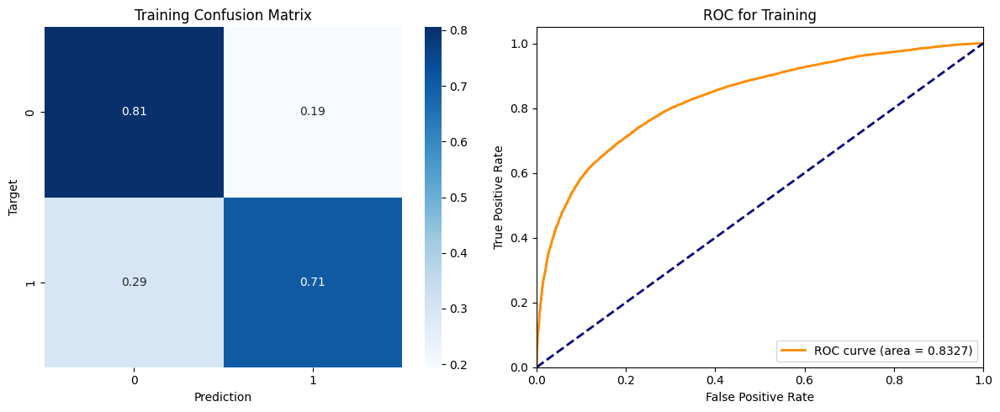

F1 score on Validation: 0.4955
AUROC for Validation: 0.7646

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9288    0.8586    0.8923      7899
           1     0.4185    0.6073    0.4955      1324

    accuracy                         0.8225      9223
   macro avg     0.6737    0.7329    0.6939      9223
weighted avg     0.8555    0.8225    0.8354      9223



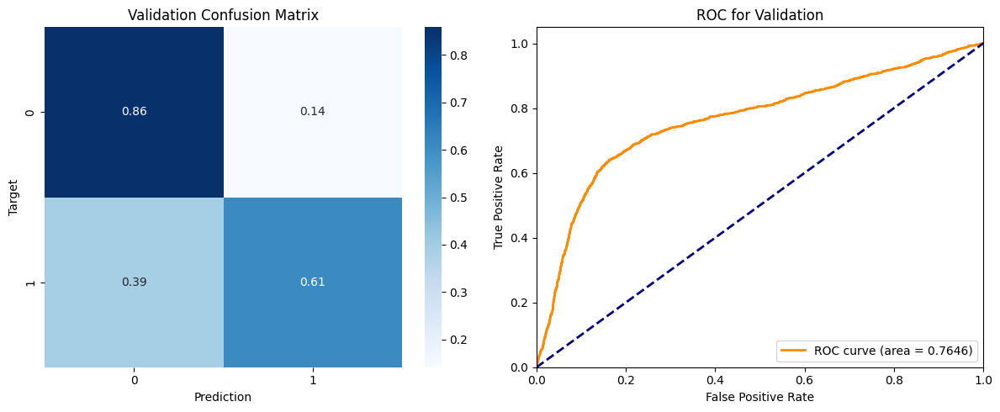

In [312]:
classify_analysis(train_targets_smote_new, train_inputs_smote_new, smote_log_grid_new_model, 'Training')
classify_analysis(val_targets_new, val_inputs_new, smote_log_grid_new_model, 'Validation')

Top features:


loan_code                           0.937869
housing_code                        0.914845
poutcome_code                       0.909245
nr.employed                         0.572134
contact_code                        0.482637
job_blue-collar                     0.406406
month_num                           0.367543
cons.price.idx                      0.323124
macro_stress confidence_adjusted    0.275068
job_retired                         0.163887
job_admin.                          0.160767
marital_single                      0.159602
job_services                        0.153454
education_code                      0.151770
job_student                         0.142135
euribor3m was_contacted_before      0.106573
campaign euribor3m                  0.106399
finance_balance                     0.106186
campaign emp.var.rate               0.097749
marital_married                     0.090383
dtype: float64

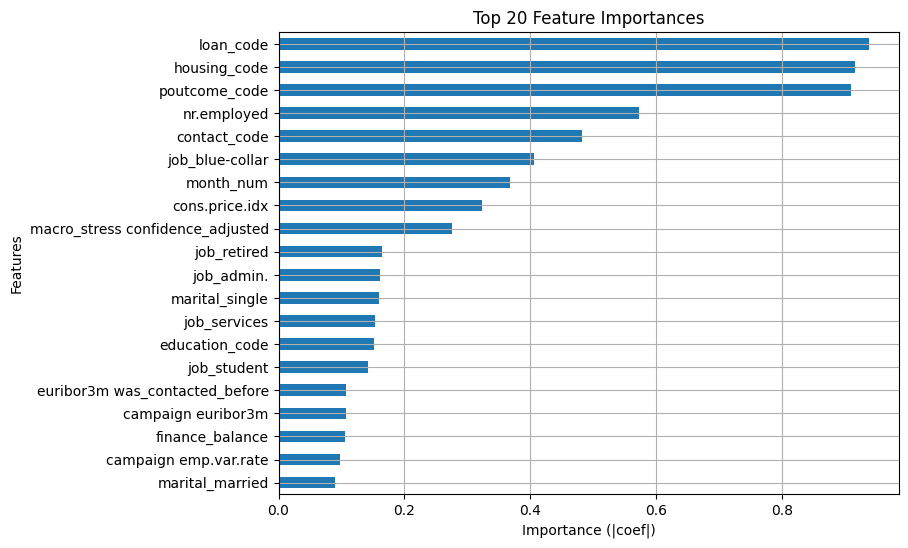

In [313]:
plot_feature_importance(smote_log_grid_new_model, train_inputs_new, 20)

**General conclusions**

Logistic regression, with SMOTE balancing and the inclusion in the model of interactions between factors identified as significant based on the results of polynomial-based modelling, following GridSearch, showed a slightly lower F1 score (0.50) compared with Group 1. Recall stands at 0.61, whilst precision is 0.42. At the same time, there is a deterioration in the model’s overall ability to distinguish between classes at different classification thresholds; AUROC fell from 0.79 to 0.76.

New features:
- macro_stress × confidence_adjusted
- euribor3m × was_contacted_before
- campaign × emp.var.rate
have entered the top list of important features, replacing some of the original macroeconomic indicators.

## LightGBM on balanced data using ADASYN

In [ ]:
pos = np.sum(train_targets_new == 1)
neg = np.sum(train_targets_new == 0)
scale_pos_weight = neg / pos

def objective(params):
    clf = lgb.LGBMClassifier(
        n_estimators = int(params['n_estimators']),
        learning_rate = params['learning_rate'],
        max_depth = int(params['max_depth']),
        num_leaves = int(params['num_leaves']),
        min_child_weight = int(params['min_child_weight']),
        subsample = params['subsample'],
        colsample_bytree = params['colsample_bytree'],
        reg_alpha = params['reg_alpha'],
        reg_lambda = params['reg_lambda'],
        min_split_gain = params['min_split_gain'],
        scale_pos_weight = params['scale_pos_weight'],
        random_state = 42
    )

    clf.fit(
        train_inputs_adasyn_new,
        train_targets_adasyn_new,
        eval_set = [(val_inputs_new, val_targets_new)],
    )

    pred_class = clf.predict(val_inputs_new)
    f1 = f1_score(val_targets_new, pred_class, pos_label = 1)

    return {'loss': -f1, 'status': STATUS_OK}

# Простір гіперпараметрів
space = {
    'n_estimators': hp.quniform('n_estimators', 50, 500, 5),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
    'max_depth': hp.quniform('max_depth', 3, 25, 1),
    'num_leaves': hp.quniform('num_leaves', 20, 150, 1),
    'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
    'reg_alpha': hp.uniform('reg_alpha', 0, 1),
    'reg_lambda': hp.uniform('reg_lambda', 0, 1),
    'min_split_gain': hp.uniform('min_split_gain', 0, 0.1),
    'scale_pos_weight': hp.choice('scale_pos_weight', [
        scale_pos_weight, 
        scale_pos_weight * 0.5, 
        scale_pos_weight * 1.5, 
        scale_pos_weight * 0.1
    ])
}

# Оптимізація
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=20, trials=trials)

# Перетворення типів для цілісних параметрів
best['n_estimators'] = int(best['n_estimators'])
best['max_depth'] = int(best['max_depth'])
best['num_leaves'] = int(best['num_leaves'])
best['min_child_weight'] = int(best['min_child_weight'])

print("Найкращі гіперпараметри: ", best)

# Навчання фінальної моделі
adasyn_lgb_new_hyper_model = lgb.LGBMClassifier(
    n_estimators = best['n_estimators'],
    learning_rate = best['learning_rate'],
    max_depth = best['max_depth'],
    num_leaves = best['num_leaves'],
    min_child_weight = best['min_child_weight'],
    subsample = best['subsample'],
    colsample_bytree = best['colsample_bytree'],
    reg_alpha = best['reg_alpha'],
    reg_lambda = best['reg_lambda'],
    min_split_gain = best['min_split_gain'],
    scale_pos_weight = best['scale_pos_weight'],
    random_state = 42
)

adasyn_lgb_new_hyper_model.fit(train_inputs_adasyn_new, train_targets_adasyn_new, eval_set=[(val_inputs_new, val_targets_new)])

F1 score on Training: 0.9706
AUROC for Training: 0.9966

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9632    0.9798    0.9714     24861
           1     0.9792    0.9621    0.9706     24575

    accuracy                         0.9710     49436
   macro avg     0.9712    0.9709    0.9710     49436
weighted avg     0.9711    0.9710    0.9710     49436



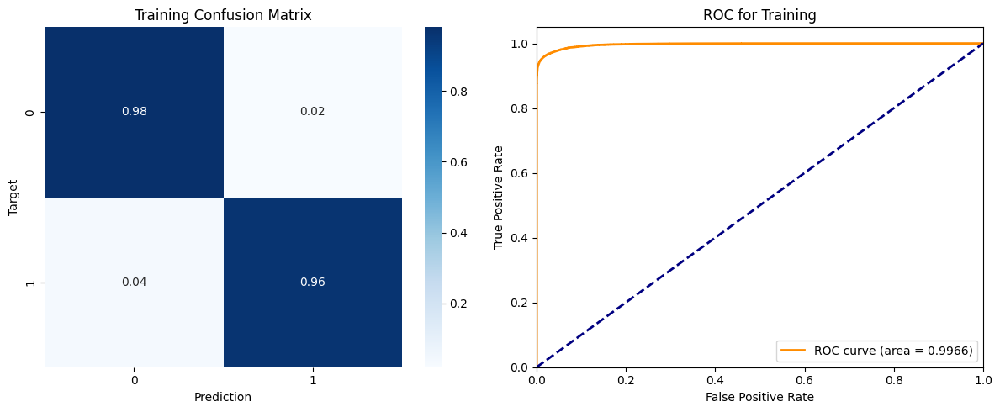

F1 score on Validation: 0.4801
AUROC for Validation: 0.7736

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9152    0.9015    0.9083      7899
           1     0.4605    0.5015    0.4801      1324

    accuracy                         0.8441      9223
   macro avg     0.6878    0.7015    0.6942      9223
weighted avg     0.8499    0.8441    0.8468      9223



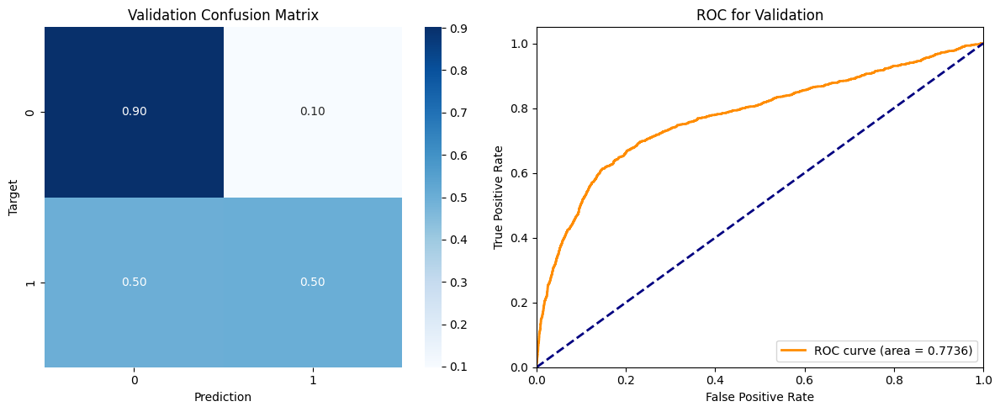

In [316]:
classify_analysis(train_targets_adasyn_new, train_inputs_adasyn_new, adasyn_lgb_new_hyper_model, 'Training')
classify_analysis(val_targets_new, val_inputs_new, adasyn_lgb_new_hyper_model, 'Validation')

TOP-20 найважливіших ознак


,feature,importance
46,age euribor3m,2902
43,age campaign,2783
44,age contact_intensity,2511
45,age cons.conf.idx,2438
56,campaign finance_balance,2301
50,age finance_balance,2176
7,euribor3m,2157
47,cons.conf.idx finance_balance,1934
40,age macro_stress,1906
48,nr.employed finance_balance,1862


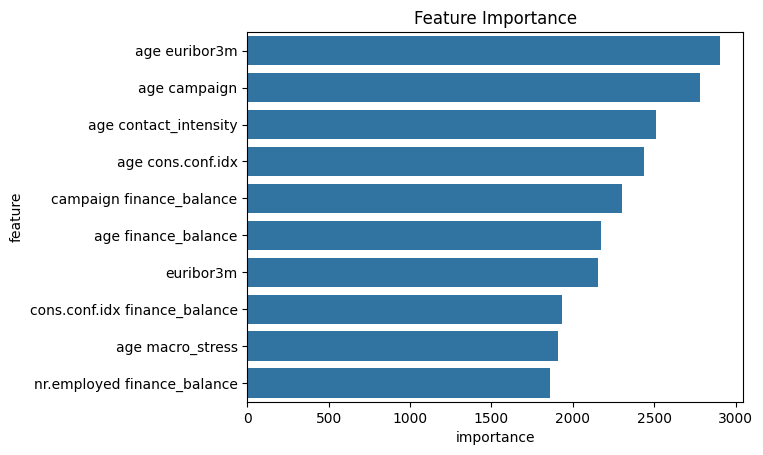

In [317]:
importance_features(train_inputs_adasyn_new, adasyn_lgb_new_hyper_model, 20)

**General conclusions**

LightGBM, with data balancing using ADASYN, new features and parameter tuning via Hyperopt (20 iterations), achieved a better result than the experiments in Group 2, but was 0.048 lower than the baseline LightGBM model from Group 1 (F1 = 0.528). At the same time, the precision of 0.46 in this model is the highest among all LGB models with balancing, whilst the recall is 0.50, which is the lowest value for this metric.

Among the 20 most important features, 16 are factor interactions:
- age × euribor3m
- age × campaign
- age × contact_intensity
- age × cons.conf.idx
It can be seen that age, when combined with various features, dominates the top rankings, confirming the importance of feature engineering in this case. However, ADASYN, combined with the limited number of Hyperopt iterations, did not yield better results.

# Overall conclusion of the experiments

- **Best model — LightGBM baseline (group 1, unbalanced data + scale_pos_weight)**

F1 = 0.528, recall = 0.71, precision = 0.42, AUROC = 0.79

The model performs significantly better than the other models, without any hyperparameter tuning or synthetic data balancing.
There is a distribution of importance between demographic (age) and macroeconomic (campaign, euribor3m) features.


- **The worst-performing model is kNN (tuned, SMOTE + GridSearch, k=3)**

F1 val = 0.38, recall = 0.58, precision = 0.28, AUROC = 0.69, with F1 train = 0.996 and AUROC train = 0.9999

The gap between the training and validation metrics is the widest in the entire project. A precision of 0.28 indicates that only one in three positive predictions is correct, which is the lowest among all non-standard models. Furthermore, attempts to balance the training data or select optimal parameters resulted in a deterioration of the model’s performance.

- Logistic regression yielded fairly good results, so in subsequent experiments it is worth considering including it in the model ensemble.

# Analysis of the best model

## Analysis of the importance of features

c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\shap\explainers\_tree.py:587: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


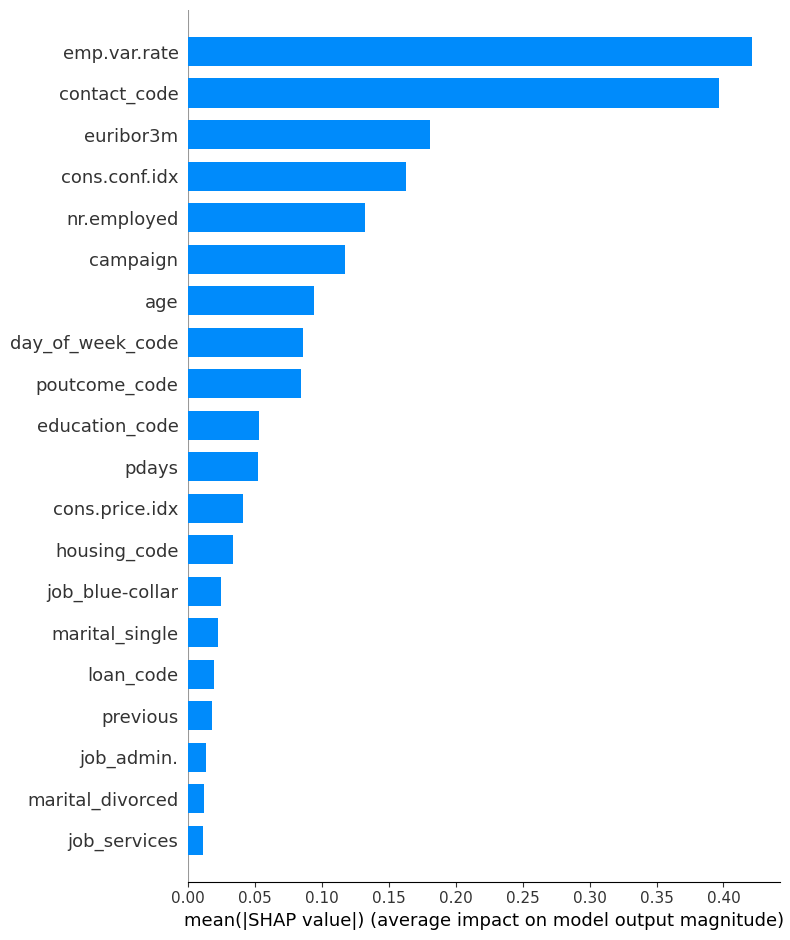

In [389]:
shap_values = shap.TreeExplainer(basic_lgb_model).shap_values(train_inputs)
shap.summary_plot(shap_values, train_inputs, plot_type="bar")

c:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\shap\explainers\_tree.py:587: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


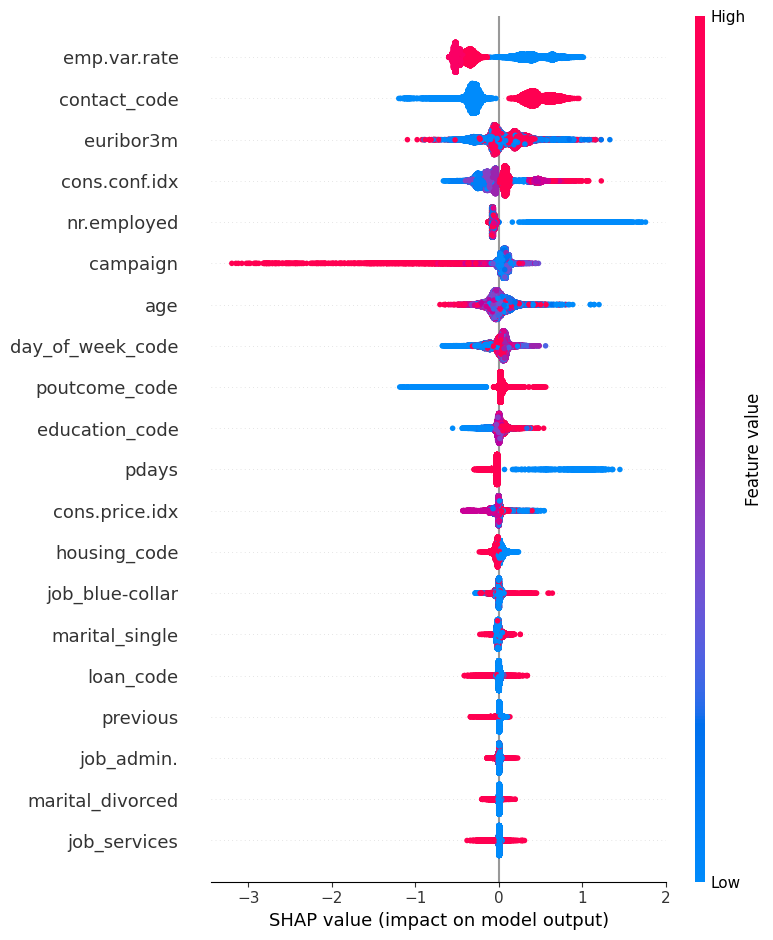

In [ ]:
shap.summary_plot(shap_values, train_inputs)

**Observations**
1. **The rate of change in employment (emp.var.rate)** is the most influential feature of the model, with an average |SHAP| of ≈ 0.42. When emp.var.rate is low (blue points, negative rate of change), the forecast shifts towards the positive class (to the right of zero), whilst high values (pink points) are associated with a significant reduction in the probability of opening a deposit account (shift to the left). This effect is entirely logical, as during periods of slowing employment or a deteriorating labour market, people are more inclined to protect their savings through bank deposits. In line with the EDA results, it was also found that when this indicator is lower, the majority of customers open a deposit account.
2. **Contact method (contact_code)** — the second most influential feature (|SHAP| ≈ 0.40). Contact via mobile sharply increases the probability of a deposit, whilst contact via telephone reduces it. This is consistent with the results of the research analysis. At the same time, this is a rather unexpected and strong factor, even when compared with macroeconomic indicators.
3. **Euribor 3M (euribor3m)** ranks third (~0.18). When interest rates are low, a positive effect is observed; that is, customers are more likely to agree to a deposit when market rates are low, which is consistent with the results of the research analysis, which showed a predominance of deposits opened when rates were in the 0–2 range.
4. **Consumer Confidence Index (cons.conf.idx)** (~0.16). Low index values shift the forecast to the left; in other words, customers are less inclined to make deposits in times of uncertainty. However, this nature of the effect is not constant, which is consistent with EDA observations; most likely, the effect of this variable is complex and non-linear.
5. **Number of employees (nr.employed)** (~0.13). High employment levels have a negative impact, reflected in a lower probability of opening a deposit account.
6. **Number of contacts in the current campaign (campaign)** (~0.12). As shown in the graph, there are isolated observations with a very high negative SHAP value (tail to the left down to -3), corresponding to customers with an excessive number of contacts. Consequently, too many contacts have a strong negative effect, whilst a moderate number has a neutral or slightly positive effect.
7. **Client age** ranks only seventh (~0.09). The distribution of SHAP values for age appears relatively evenly scattered around zero, with no clear dominance of blue or pink in either direction. This means that age does not have a consistent linear or constant effect on the forecast, although certain patterns were identified in the exploratory analysis.
8. **Previous campaign result (poutcome_code)** (~0.08). As with age, no specific nature of the effect has been identified.


## Error analysis

F1 score on Training: 0.4814
AUROC for Training: 0.8743

Classification Report for Training:

              precision    recall  f1-score   support

           0     0.9615    0.8657    0.9111     24861
           1     0.3686    0.6936    0.4814      2810

    accuracy                         0.8483     27671
   macro avg     0.6651    0.7797    0.6963     27671
weighted avg     0.9013    0.8483    0.8675     27671



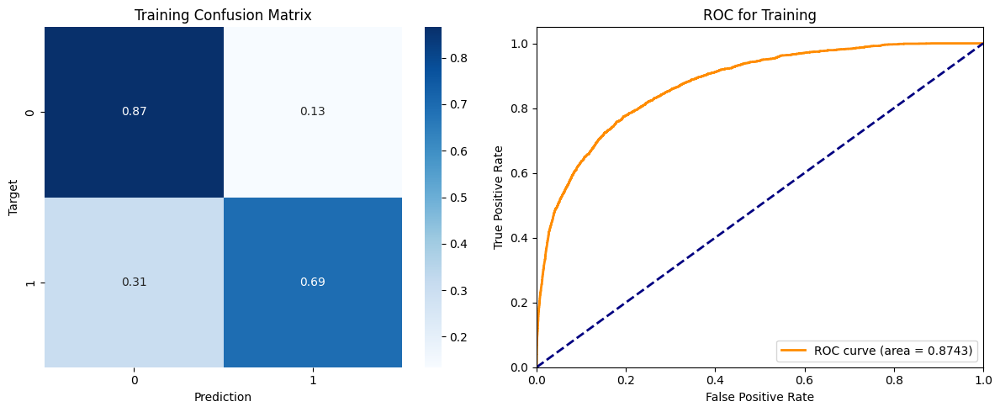

F1 score on Validation: 0.5278
AUROC for Validation: 0.7926

Classification Report for Validation:

              precision    recall  f1-score   support

           0     0.9450    0.8357    0.8870      7899
           1     0.4200    0.7100    0.5278      1324

    accuracy                         0.8176      9223
   macro avg     0.6825    0.7728    0.7074      9223
weighted avg     0.8697    0.8176    0.8354      9223



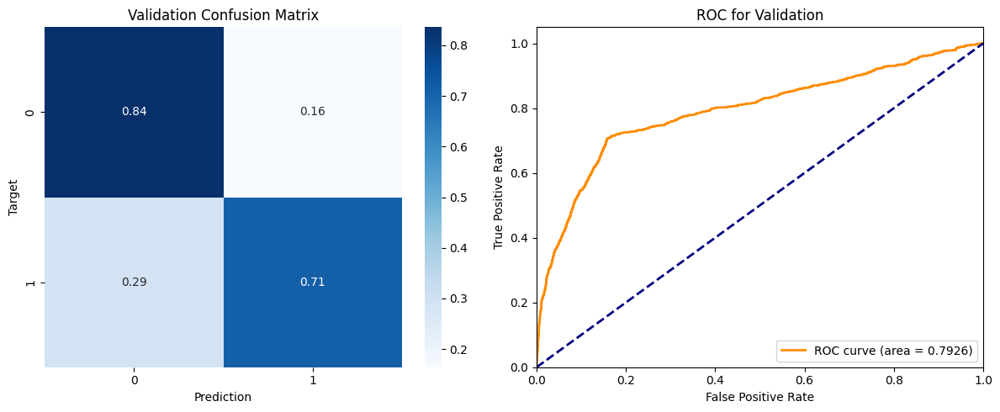

F1 score on Test: 0.2405
AUROC for Test: 0.7905

Classification Report for Test:

              precision    recall  f1-score   support

           0     0.9594    0.2253    0.3649      3777
           1     0.1381    0.9287    0.2405       505

    accuracy                         0.3083      4282
   macro avg     0.5488    0.5770    0.3027      4282
weighted avg     0.8626    0.3083    0.3503      4282



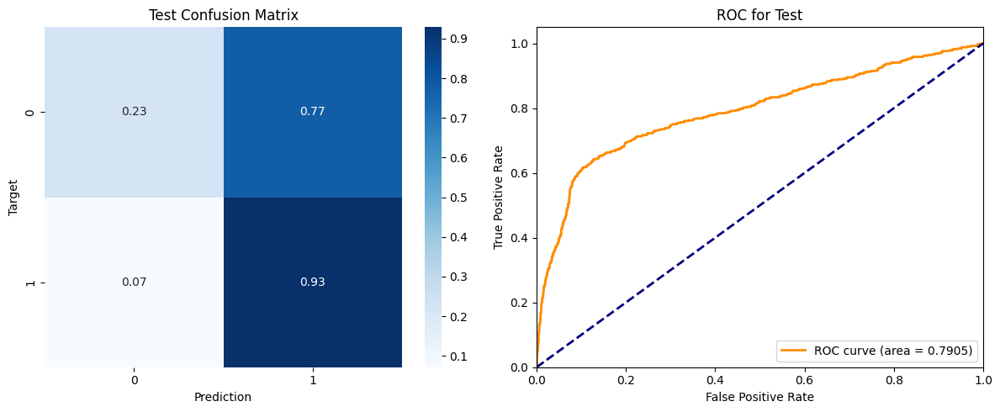

In [385]:
classify_analysis(train_targets, train_inputs, basic_lgb_model, 'Training')
classify_analysis(val_targets, val_inputs, basic_lgb_model, 'Validation')
classify_analysis(test_targets, test_inputs, basic_lgb_model, 'Test')

The key issue is the sharp decline in the model’s performance on the test set: the F1 score fell from 0.528 (validation) to 0.241 (test), i.e. by half. Meanwhile, the AUROC remained stable at 0.79 across both datasets.

The stable AUROC indicates that the model retains its ability to classify customers correctly, but the decision threshold of 0.5 is no longer optimal for the test set. On the test set, precision fell to 0.138; consequently, the model classifies almost all customers as positive.

One possible reason could be a change in the distribution of the test set. The test sample covers November and December, which differ from the training and validation sets (March to October). As both customer behaviour and macroeconomic indicators may change towards the end of the year, the current model—having been trained on a single year’s data—may not account for seasonal variations.

# Improvement plans

1. Selection of the optimal classification threshold for the task.
2. Analyze the issue of changing the distribution on the test sample (November-December).
3. Bayesian optimization Hyperopt with a larger number of iterations.
4. Conducting Future Selection to remove features with low importance.
5. Building an ensemble on strong learners (currently highlighted LogisticRegression and LightGBM).